In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import os
import numpy as np


# LOAD DATA

In [ ]:
PROJECT_DIR = "/content/drive/MyDrive/takehome_project"
os.chdir(PROJECT_DIR)
print("Current working directory:", os.getcwd())
print("Files here:", os.listdir("."))

Current working directory: /content/drive/MyDrive/takehome_project
Files here: ['census-bureau.columns', 'census-bureau.data']


In [ ]:
COLUMNS_FILE = "census-bureau.columns"

with open(COLUMNS_FILE, "r", encoding="utf-8") as f:
    cols = [line.strip() for line in f if line.strip()]

print("Number of columns read:", len(cols))
print("First 10 columns:", cols[:10])
print("Last 5 columns:", cols[-10:])

Number of columns read: 42
First 10 columns: ['age', 'class of worker', 'detailed industry recode', 'detailed occupation recode', 'education', 'wage per hour', 'enroll in edu inst last wk', 'marital stat', 'major industry code', 'major occupation code']
Last 5 columns: ['country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'own business or self employed', "fill inc questionnaire for veteran's admin", 'veterans benefits', 'weeks worked in year', 'year', 'label']


In [ ]:
DATA_FILE = "census-bureau.data"

df = pd.read_csv(
    DATA_FILE,
    header=None,
    names=cols,
    sep=",",
    na_values=["?", "NA", "NAN", "NaN", "na", "nan", ""],
    skipinitialspace=True,
    engine="python"
)

In [ ]:
print("\nData shape:", df.shape)
display(df.head(3))


Data shape: (199523, 42)


,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital stat,major industry code,major occupation code,...,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,label
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.


# Separate critical features and classify attributes as numerical/categorical

In [ ]:
# === STEP 0: Discern critical columns (target + weight) ===
TARGET_COL = "label"
WEIGHT_COL = "weight"

print("\nTarget column:", TARGET_COL)
print("Weight column:", WEIGHT_COL)

print("\nRaw label value counts (top):")
display(df[TARGET_COL].value_counts(dropna=False).head(10))

print("\nRaw weight summary:")
display(df[WEIGHT_COL].describe())

# For the remaining features,
# === Step 1: Identify feature types (numeric vs categorical) ===
# 1) coercing each column to numeric
# 2) If most values become numeric (e.g., >= 95%), treat as numeric; else categorical
feature_cols = [c for c in df.columns if c not in [TARGET_COL, WEIGHT_COL]]

numeric_cols = []
categorical_cols = []
numeric_coverage = {}  # % rows that successfully parse as numeric

for c in feature_cols:
    coerced = pd.to_numeric(df[c], errors="coerce")
    coverage = coerced.notna().mean()  # fraction numeric-parsable
    numeric_coverage[c] = coverage
    if coverage >= 0.95:
        numeric_cols.append(c)
    else:
        categorical_cols.append(c)

print("\n=== Type inference results ===")
print("Numeric columns (>=95% numeric-parsable):", len(numeric_cols))
print(numeric_cols)

print("\nCategorical columns:", len(categorical_cols))
print(categorical_cols)




Target column: label
Weight column: weight

Raw label value counts (top):


,count
label,
- 50000.,187141
50000+.,12382



Raw weight summary:


,weight
count,199523.000000
mean,1740.380269
std,993.768156
min,37.870000
25%,1061.615000
50%,1618.310000
75%,2188.610000
max,18656.300000



=== Type inference results ===
Numeric columns (>=95% numeric-parsable): 12
['age', 'detailed industry recode', 'detailed occupation recode', 'wage per hour', 'capital gains', 'capital losses', 'dividends from stocks', 'num persons worked for employer', 'own business or self employed', 'veterans benefits', 'weeks worked in year', 'year']

Categorical columns: 28
['class of worker', 'education', 'enroll in edu inst last wk', 'marital stat', 'major industry code', 'major occupation code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat', 'tax filer stat', 'region of previous residence', 'state of previous residence', 'detailed household and family stat', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt', 'family members under 18', 'country of birth father', 'c

In [ ]:
n_rows = len(df)

# =====================================================
# Step 2: Cardinality analysis for numeric columns
# =====================================================
print("\n==============================")
print("STEP 2: Numeric Columns Cardinality Analysis")
print("==============================")

num_cardinality = pd.DataFrame({
    "n_unique": df[numeric_cols].nunique(dropna=True),
    "unique_ratio": df[numeric_cols].nunique(dropna=True) / n_rows,
    "min": df[numeric_cols].min(),
    "max": df[numeric_cols].max(),
    "mean": df[numeric_cols].mean(),
    "std": df[numeric_cols].std()
}).sort_values("n_unique")

display(num_cardinality)

# =====================================================
# Step 3: Value pattern analysis or distribution analysis for numeric columns
# =====================================================
print("\n==============================")
print("STEP 3: Numeric Columns Value Pattern Analysis")
print("==============================")

for col in numeric_cols:
    print(f"\n--- Column: {col} ---")

    series = df[col]
    coerced = pd.to_numeric(series, errors="coerce")

    int_like = False
    if coerced.notna().any():
        int_like = np.all(np.isclose(coerced.dropna() % 1, 0))

    print(f"dtype: {series.dtype}")
    print(f"n_unique: {series.nunique(dropna=True)}")
    print(f"numeric_parse_rate: {coerced.notna().mean():.4f}")
    print(f"int_like: {int_like}")

    print("Top 10 most frequent values:")
    display(series.value_counts(dropna=False).head(10))

# =====================================================
# Step 3b: Cardinality analysis for categorical columns
# =====================================================
print("\n==============================")
print("STEP 3b: Categorical Columns Cardinality Analysis")
print("==============================")

cat_cardinality = pd.DataFrame({
    "n_unique": df[categorical_cols].nunique(dropna=True),
    "unique_ratio": df[categorical_cols].nunique(dropna=True) / n_rows,
}).sort_values("n_unique", ascending=False)

display(cat_cardinality)

# =====================================================
# Step 3c: Value pattern or distribution analysis for categorical columns
# =====================================================
print("\n==============================")
print("STEP 3c: Categorical Columns Value Pattern Analysis")
print("==============================")

for col in categorical_cols:
    print(f"\n--- Column: {col} ---")

    series = df[col]

    print(f"dtype: {series.dtype}")
    print(f"n_unique: {series.nunique(dropna=True)}")

    print("Top 10 most frequent categories:")
    display(series.value_counts(dropna=False).head(10))

# =====================================================
# Summary view
# =====================================================
print("\n==============================")
print("SUMMARY (NO CHANGES MADE)")
print("==============================")

print("\nNumeric columns:")
print(numeric_cols)

print("\nCategorical columns:")
print(categorical_cols)

print("\nTarget column:", TARGET_COL)
print("Weight column:", WEIGHT_COL)



STEP 2: Numeric Columns Cardinality Analysis


,n_unique,unique_ratio,min,max,mean,std
year,2,0.000010,94,95,94.499672,0.500001
own business or self employed,3,0.000015,0,2,0.175438,0.553694
veterans benefits,3,0.000015,0,2,1.514833,0.851473
num persons worked for employer,7,0.000035,0,6,1.956180,2.365126
detailed occupation recode,47,0.000236,0,46,11.306556,14.454204
detailed industry recode,52,0.000261,0,51,15.352320,18.067129
weeks worked in year,53,0.000266,0,52,23.174897,24.411488
age,91,0.000456,0,90,34.494199,22.310895
capital losses,113,0.000566,0,4608,37.313788,271.896428
capital gains,132,0.000662,0,99999,434.718990,4697.531280



STEP 3: Numeric Columns Value Pattern Analysis

--- Column: age ---
dtype: int64
n_unique: 91
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
age,
34,3489
35,3450
36,3353
31,3351
33,3340
5,3332
4,3318
3,3279
37,3278



--- Column: detailed industry recode ---
dtype: int64
n_unique: 52
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
detailed industry recode,
0,100684
33,17070
43,8283
4,5984
42,4683
45,4482
29,4209
37,4022
41,3964



--- Column: detailed occupation recode ---
dtype: int64
n_unique: 47
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
detailed occupation recode,
0,100684
2,8756
26,7887
19,5413
29,5105
36,4145
34,4025
10,3683
16,3445



--- Column: wage per hour ---
dtype: int64
n_unique: 1240
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
wage per hour,
0,188219
500,734
600,546
700,534
800,507
1000,386
425,376
900,336
550,280



--- Column: capital gains ---
dtype: int64
n_unique: 132
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
capital gains,
0,192144
15024,788
7688,609
7298,582
99999,390
3103,237
5178,207
5013,158
4386,151



--- Column: capital losses ---
dtype: int64
n_unique: 113
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
capital losses,
0,195617
1902,407
1977,381
1887,364
1602,193
2415,122
1485,95
1848,88
1876,87



--- Column: dividends from stocks ---
dtype: int64
n_unique: 1478
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
dividends from stocks,
0,178382
100,1148
500,1030
1000,894
200,866
50,832
2000,574
250,555
150,549



--- Column: num persons worked for employer ---
dtype: int64
n_unique: 7
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
num persons worked for employer,
0,95983
6,36511
1,23109
4,14379
3,13425
2,10081
5,6035



--- Column: own business or self employed ---
dtype: int64
n_unique: 3
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
own business or self employed,
0,180672
2,16153
1,2698



--- Column: veterans benefits ---
dtype: int64
n_unique: 3
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
veterans benefits,
2,150130
0,47409
1,1984



--- Column: weeks worked in year ---
dtype: int64
n_unique: 53
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
weeks worked in year,
0,95983
52,70314
40,2790
50,2304
26,2268
48,1806
12,1780
30,1378
20,1330



--- Column: year ---
dtype: int64
n_unique: 2
numeric_parse_rate: 1.0000
int_like: True
Top 10 most frequent values:


,count
year,
94,99827
95,99696



STEP 3b: Categorical Columns Cardinality Analysis


,n_unique,unique_ratio
state of previous residence,50,0.000251
country of birth father,42,0.000211
country of birth self,42,0.000211
country of birth mother,42,0.000211
detailed household and family stat,38,0.000190
major industry code,24,0.000120
education,17,0.000085
major occupation code,15,0.000075
hispanic origin,9,0.000045
migration code-change in msa,9,0.000045



STEP 3c: Categorical Columns Value Pattern Analysis

--- Column: class of worker ---
dtype: object
n_unique: 9
Top 10 most frequent categories:


,count
class of worker,
Not in universe,100245
Private,72028
Self-employed-not incorporated,8445
Local government,7784
State government,4227
Self-employed-incorporated,3265
Federal government,2925
Never worked,439
Without pay,165



--- Column: education ---
dtype: object
n_unique: 17
Top 10 most frequent categories:


,count
education,
High school graduate,48407
Children,47422
Some college but no degree,27820
Bachelors degree(BA AB BS),19865
7th and 8th grade,8007
10th grade,7557
11th grade,6876
Masters degree(MA MS MEng MEd MSW MBA),6541
9th grade,6230



--- Column: enroll in edu inst last wk ---
dtype: object
n_unique: 3
Top 10 most frequent categories:


,count
enroll in edu inst last wk,
Not in universe,186943
High school,6892
College or university,5688



--- Column: marital stat ---
dtype: object
n_unique: 7
Top 10 most frequent categories:


,count
marital stat,
Never married,86485
Married-civilian spouse present,84222
Divorced,12710
Widowed,10463
Separated,3460
Married-spouse absent,1518
Married-A F spouse present,665



--- Column: major industry code ---
dtype: object
n_unique: 24
Top 10 most frequent categories:


,count
major industry code,
Not in universe or children,100684
Retail trade,17070
Manufacturing-durable goods,9015
Education,8283
Manufacturing-nondurable goods,6897
Finance insurance and real estate,6145
Construction,5984
Business and repair services,5651
Medical except hospital,4683



--- Column: major occupation code ---
dtype: object
n_unique: 15
Top 10 most frequent categories:


,count
major occupation code,
Not in universe,100684
Adm support including clerical,14837
Professional specialty,13940
Executive admin and managerial,12495
Other service,12099
Sales,11783
Precision production craft & repair,10518
Machine operators assmblrs & inspctrs,6379
Handlers equip cleaners etc,4127



--- Column: race ---
dtype: object
n_unique: 5
Top 10 most frequent categories:


,count
race,
White,167365
Black,20415
Asian or Pacific Islander,5835
Other,3657
Amer Indian Aleut or Eskimo,2251



--- Column: hispanic origin ---
dtype: object
n_unique: 9
Top 10 most frequent categories:


,count
hispanic origin,
All other,171907
Mexican-American,8079
Mexican (Mexicano),7234
Central or South American,3895
Puerto Rican,3313
Other Spanish,2485
Cuban,1126
NaN,874
Do not know,306



--- Column: sex ---
dtype: object
n_unique: 2
Top 10 most frequent categories:


,count
sex,
Female,103984
Male,95539



--- Column: member of a labor union ---
dtype: object
n_unique: 3
Top 10 most frequent categories:


,count
member of a labor union,
Not in universe,180459
No,16034
Yes,3030



--- Column: reason for unemployment ---
dtype: object
n_unique: 6
Top 10 most frequent categories:


,count
reason for unemployment,
Not in universe,193453
Other job loser,2038
Re-entrant,2019
Job loser - on layoff,976
Job leaver,598
New entrant,439



--- Column: full or part time employment stat ---
dtype: object
n_unique: 8
Top 10 most frequent categories:


,count
full or part time employment stat,
Children or Armed Forces,123769
Full-time schedules,40736
Not in labor force,26808
PT for non-econ reasons usually FT,3322
Unemployed full-time,2311
PT for econ reasons usually PT,1209
Unemployed part- time,843
PT for econ reasons usually FT,525



--- Column: tax filer stat ---
dtype: object
n_unique: 6
Top 10 most frequent categories:


,count
tax filer stat,
Nonfiler,75094
Joint both under 65,67383
Single,37421
Joint both 65+,8332
Head of household,7426
Joint one under 65 & one 65+,3867



--- Column: region of previous residence ---
dtype: object
n_unique: 6
Top 10 most frequent categories:


,count
region of previous residence,
Not in universe,183750
South,4889
West,4074
Midwest,3575
Northeast,2705
Abroad,530



--- Column: state of previous residence ---
dtype: object
n_unique: 50
Top 10 most frequent categories:


,count
state of previous residence,
Not in universe,183750
California,1714
Utah,1063
Florida,849
North Carolina,812
NaN,708
Abroad,671
Oklahoma,626
Minnesota,576



--- Column: detailed household and family stat ---
dtype: object
n_unique: 38
Top 10 most frequent categories:


,count
detailed household and family stat,
Householder,53248
Child <18 never marr not in subfamily,50326
Spouse of householder,41695
Nonfamily householder,22213
Child 18+ never marr Not in a subfamily,12030
Secondary individual,6122
Other Rel 18+ ever marr not in subfamily,1956
Grandchild <18 never marr child of subfamily RP,1868
Other Rel 18+ never marr not in subfamily,1728



--- Column: detailed household summary in household ---
dtype: object
n_unique: 8
Top 10 most frequent categories:


,count
detailed household summary in household,
Householder,75475
Child under 18 never married,50426
Spouse of householder,41709
Child 18 or older,14430
Other relative of householder,9703
Nonrelative of householder,7601
Group Quarters- Secondary individual,132
Child under 18 ever married,47



--- Column: migration code-change in msa ---
dtype: object
n_unique: 9
Top 10 most frequent categories:


,count
migration code-change in msa,
NaN,99696
Nonmover,82538
MSA to MSA,10601
NonMSA to nonMSA,2811
Not in universe,1516
MSA to nonMSA,790
NonMSA to MSA,615
Abroad to MSA,453
Not identifiable,430



--- Column: migration code-change in reg ---
dtype: object
n_unique: 8
Top 10 most frequent categories:


,count
migration code-change in reg,
NaN,99696
Nonmover,82538
Same county,9812
Different county same state,2797
Not in universe,1516
Different region,1178
Different state same division,991
Abroad,530
Different division same region,465



--- Column: migration code-move within reg ---
dtype: object
n_unique: 9
Top 10 most frequent categories:


,count
migration code-move within reg,
NaN,99696
Nonmover,82538
Same county,9812
Different county same state,2797
Not in universe,1516
Different state in South,973
Different state in West,679
Different state in Midwest,551
Abroad,530



--- Column: live in this house 1 year ago ---
dtype: object
n_unique: 3
Top 10 most frequent categories:


,count
live in this house 1 year ago,
Not in universe under 1 year old,101212
Yes,82538
No,15773



--- Column: migration prev res in sunbelt ---
dtype: object
n_unique: 3
Top 10 most frequent categories:


,count
migration prev res in sunbelt,
NaN,99696
Not in universe,84054
No,9987
Yes,5786



--- Column: family members under 18 ---
dtype: object
n_unique: 5
Top 10 most frequent categories:


,count
family members under 18,
Not in universe,144232
Both parents present,38983
Mother only present,12772
Father only present,1883
Neither parent present,1653



--- Column: country of birth father ---
dtype: object
n_unique: 42
Top 10 most frequent categories:


,count
country of birth father,
United-States,159163
Mexico,10008
NaN,6713
Puerto-Rico,2680
Italy,2212
Canada,1380
Germany,1356
Dominican-Republic,1290
Poland,1212



--- Column: country of birth mother ---
dtype: object
n_unique: 42
Top 10 most frequent categories:


,count
country of birth mother,
United-States,160479
Mexico,9781
NaN,6119
Puerto-Rico,2473
Italy,1844
Canada,1451
Germany,1382
Philippines,1231
Poland,1110



--- Column: country of birth self ---
dtype: object
n_unique: 42
Top 10 most frequent categories:


,count
country of birth self,
United-States,176989
Mexico,5767
NaN,3393
Puerto-Rico,1400
Germany,851
Philippines,845
Cuba,837
Canada,700
Dominican-Republic,690



--- Column: citizenship ---
dtype: object
n_unique: 5
Top 10 most frequent categories:


,count
citizenship,
Native- Born in the United States,176992
Foreign born- Not a citizen of U S,13401
Foreign born- U S citizen by naturalization,5855
Native- Born abroad of American Parent(s),1756
Native- Born in Puerto Rico or U S Outlying,1519



--- Column: fill inc questionnaire for veteran's admin ---
dtype: object
n_unique: 3
Top 10 most frequent categories:


,count
fill inc questionnaire for veteran's admin,
Not in universe,197539
No,1593
Yes,391



SUMMARY (NO CHANGES MADE)

Numeric columns:
['age', 'detailed industry recode', 'detailed occupation recode', 'wage per hour', 'capital gains', 'capital losses', 'dividends from stocks', 'num persons worked for employer', 'own business or self employed', 'veterans benefits', 'weeks worked in year', 'year']

Categorical columns:
['class of worker', 'education', 'enroll in edu inst last wk', 'marital stat', 'major industry code', 'major occupation code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat', 'tax filer stat', 'region of previous residence', 'state of previous residence', 'detailed household and family stat', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt', 'family members under 18', 'country of birth father', 'country of birth mother', 'country o

In [ ]:
NUMERIC_FEATURES = [
    "age",
    "wage per hour",
    "capital gains",
    "capital losses",
    "dividends from stocks",
    "num persons worked for employer",
    "weeks worked in year",
    "year"
]

CATEGORICAL_FEATURES = [
    "class of worker",
    "detailed industry recode",
    "detailed occupation recode",
    "education",
    "enroll in edu inst last wk",
    "marital stat",
    "major industry code",
    "major occupation code",
    "race",
    "hispanic origin",
    "sex",
    "member of a labor union",
    "reason for unemployment",
    "full or part time employment stat",
    "tax filer stat",
    "region of previous residence",
    "state of previous residence",
    "detailed household and family stat",
    "detailed household summary in household",
    "migration code-change in msa",
    "migration code-change in reg",
    "migration code-move within reg",
    "live in this house 1 year ago",
    "migration prev res in sunbelt",
    "family members under 18",
    "country of birth father",
    "country of birth mother",
    "country of birth self",
    "citizenship",
    "own business or self employed",
    "fill inc questionnaire for veteran's admin",
    "veterans benefits"
]

# Missing Value Imputation

In [ ]:
df[WEIGHT_COL].isna().sum()


np.int64(0)

In [ ]:
df[TARGET_COL].isna().sum()

np.int64(0)

In [ ]:
# Numeric missing analysis
print("\nNumeric missing rate:")
display(df[NUMERIC_FEATURES].isna().mean().sort_values(ascending=False))

# Categorical missing analysis
print("\nCategorical missing rate:")
display(df[CATEGORICAL_FEATURES].isna().mean().sort_values(ascending=False))

# Overall missing summary
missing_summary = df.isna().mean().sort_values(ascending=False)
print("\nOverall missing rate:")
display(missing_summary)



Numeric missing rate:


,0
age,0.0
wage per hour,0.0
capital gains,0.0
capital losses,0.0
dividends from stocks,0.0
num persons worked for employer,0.0
weeks worked in year,0.0
year,0.0



Categorical missing rate:


,0
migration code-change in reg,0.499672
migration code-move within reg,0.499672
migration prev res in sunbelt,0.499672
migration code-change in msa,0.499672
country of birth father,0.033645
country of birth mother,0.030668
country of birth self,0.017006
hispanic origin,0.004380
state of previous residence,0.003548
class of worker,0.000000



Overall missing rate:


,0
migration prev res in sunbelt,0.499672
migration code-change in msa,0.499672
migration code-change in reg,0.499672
migration code-move within reg,0.499672
country of birth father,0.033645
country of birth mother,0.030668
country of birth self,0.017006
hispanic origin,0.004380
state of previous residence,0.003548
age,0.000000


In [ ]:
# Find categorical columns that have missing values
categorical_missing_cols = df[CATEGORICAL_FEATURES].columns[
    df[CATEGORICAL_FEATURES].isna().any()
].tolist()

print("Categorical columns with missing values:")
print(categorical_missing_cols)

Categorical columns with missing values:
['hispanic origin', 'state of previous residence', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'migration prev res in sunbelt', 'country of birth father', 'country of birth mother', 'country of birth self']


In [ ]:
exclude_cols = [
    "hispanic origin",
    "country of birth self"
]

cols_to_impute_unknown = [
    col for col in categorical_missing_cols
    if col not in exclude_cols
]

print("\nColumns that will be filled with 'Unknown':")
print(cols_to_impute_unknown)


Columns that will be filled with 'Unknown':
['state of previous residence', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'migration prev res in sunbelt', 'country of birth father', 'country of birth mother']


In [ ]:
df[cols_to_impute_unknown] = df[cols_to_impute_unknown].fillna("NA")

In [ ]:
print("\nRemaining missing values per column:")
display(df.isna().sum()[df.isna().sum() > 0])


Remaining missing values per column:


,0
hispanic origin,874
country of birth self,3393


In [ ]:
# Create mask for rows where either column is missing
mask_missing = (
    df["hispanic origin"].isna() |
    df["country of birth self"].isna()
)

# Count how many rows match
print("Number of rows with missing in either column:", mask_missing.sum())

# Display those rows (only relevant columns for clarity)
display(
    df.loc[mask_missing, [
        "hispanic origin",
        "country of birth self",
        "citizenship",
        "race",
        "region of previous residence",
        "state of previous residence"
    ]].head(50)
)


Number of rows with missing in either column: 4251


,hispanic origin,country of birth self,citizenship,race,region of previous residence,state of previous residence
11,All other,NaN,Foreign born- Not a citizen of U S,Black,Not in universe,Not in universe
87,All other,NaN,Foreign born- Not a citizen of U S,Other,Not in universe,Not in universe
92,All other,NaN,Foreign born- U S citizen by naturalization,White,Not in universe,Not in universe
129,All other,NaN,Foreign born- Not a citizen of U S,Asian or Pacific Islander,Not in universe,Not in universe
193,All other,NaN,Foreign born- Not a citizen of U S,White,Abroad,Abroad
287,All other,NaN,Foreign born- Not a citizen of U S,White,Not in universe,Not in universe
367,All other,NaN,Foreign born- Not a citizen of U S,White,Not in universe,Not in universe
385,All other,NaN,Foreign born- U S citizen by naturalization,White,Not in universe,Not in universe
458,All other,NaN,Foreign born- U S citizen by naturalization,White,Not in universe,Not in universe
711,Central or South American,NaN,Foreign born- Not a citizen of U S,Black,Not in universe,Not in universe


In [ ]:
df.loc[mask_missing, ["hispanic origin", "country of birth self"]] \
  .value_counts(dropna=False)

hispanic origin            country of birth self
All other                  NaN                      2634
NaN                        United-States             778
Central or South American  NaN                       530
Other Spanish              NaN                       104
Puerto Rican               NaN                        69
NaN                        Mexico                     31
                           NaN                        16
                           Philippines                14
Mexican (Mexicano)         NaN                        14
Cuban                      NaN                        13
Mexican-American           NaN                         9
NaN                        Vietnam                     5
                           Germany                     4
Do not know                NaN                         4
NaN                        Italy                       3
                           Cuba                        3
                           Puerto-Rico                 2
                           England                     2
                           Canada                      2
                           Japan                       2
                           Haiti                       2
                           Greece                      2
                           France                      1
                           El-Salvador                 1
                           Ecuador                     1
                           Guatemala                   1
                           Iran                        1
                           Nicaragua                   1
                           Portugal                    1
                           South Korea                 1
Name: count, dtype: int64

In [ ]:
# Crosstab showing counts
ct = pd.crosstab(
    df["country of birth self"],
    df["hispanic origin"],
    dropna=True
)

display(ct)

hispanic origin,All other,Central or South American,Chicano,Cuban,Do not know,Mexican (Mexicano),Mexican-American,Other Spanish,Puerto Rican
country of birth self,,,,,,,,,
Cambodia,93,0,0,0,0,0,2,0,0
Canada,690,1,2,0,2,0,2,1,0
China,478,0,0,0,0,0,0,0,0
Columbia,22,388,0,2,0,0,1,14,7
Cuba,23,7,0,786,0,3,0,9,6
Dominican-Republic,47,209,0,6,0,1,0,408,19
Ecuador,12,210,0,0,0,0,7,26,2
El-Salvador,88,535,3,0,0,16,14,32,0
England,426,1,0,0,0,21,4,2,1


In [ ]:
# Conditional probabilities P(hispanic origin | birthplace)
ct_prob = ct.div(ct.sum(axis=1), axis=0)

display(ct_prob)

hispanic origin,All other,Central or South American,Chicano,Cuban,Do not know,Mexican (Mexicano),Mexican-American,Other Spanish,Puerto Rican
country of birth self,,,,,,,,,
Cambodia,0.978947,0.000000,0.000000,0.000000,0.000000,0.000000,0.021053,0.000000,0.000000
Canada,0.988539,0.001433,0.002865,0.000000,0.002865,0.000000,0.002865,0.001433,0.000000
China,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Columbia,0.050691,0.894009,0.000000,0.004608,0.000000,0.000000,0.002304,0.032258,0.016129
Cuba,0.027578,0.008393,0.000000,0.942446,0.000000,0.003597,0.000000,0.010791,0.007194
Dominican-Republic,0.068116,0.302899,0.000000,0.008696,0.000000,0.001449,0.000000,0.591304,0.027536
Ecuador,0.046693,0.817121,0.000000,0.000000,0.000000,0.000000,0.027237,0.101167,0.007782
El-Salvador,0.127907,0.777616,0.004360,0.000000,0.000000,0.023256,0.020349,0.046512,0.000000
England,0.936264,0.002198,0.000000,0.000000,0.000000,0.046154,0.008791,0.004396,0.002198


In [ ]:
# Find deterministic mappings
deterministic_map = {}

for birthplace, row in ct.iterrows():
    nonzero = row[row > 0]

    if len(nonzero) == 1:
        hispanic_value = nonzero.index[0]
        deterministic_map[birthplace] = hispanic_value

print("Deterministic mappings:")
print(deterministic_map)

Deterministic mappings:
{'China': 'All other', 'Holand-Netherlands': 'All other', 'Iran': 'All other', 'Ireland': 'All other', 'Poland': 'All other', 'Scotland': 'All other', 'Taiwan': 'All other', 'Yugoslavia': 'All other'}


In [ ]:
mask = (
    df["hispanic origin"].isna() &
    df["country of birth self"].isin(deterministic_map.keys())
)

df.loc[mask, "hispanic origin"] = df.loc[mask, "country of birth self"].map(deterministic_map)

# Fill remaining missing safely
df["hispanic origin"] = df["hispanic origin"].fillna("Unknown")
df["country of birth self"] = df["country of birth self"].fillna("Unknown")

In [ ]:
print("\nRemaining missing values per column:")
display(df.isna().sum()[df.isna().sum() > 0])



Remaining missing values per column:


,0


# Target Label Consistency Check

In [ ]:
# Remove whitespace
df["label"] = df["label"].str.strip()

# Check unique values
print(df["label"].unique())

['- 50000.' '50000+.']


In [ ]:
df["income_binary"] = df["label"].map({
    "- 50000.": 0,
    "50000+.": 1
})

df["income_binary"].value_counts()

,count
income_binary,
0,187141
1,12382


In [ ]:
print(df["income_binary"].unique())

[0 1]


# DROP DUPLICATES

In [ ]:
duplicate_count = df.duplicated().sum()
print("Duplicate rows:", duplicate_count)

Duplicate rows: 3229


In [ ]:
df = df.drop_duplicates()


In [ ]:
duplicate_count = df.duplicated().sum()
print("Duplicate rows:", duplicate_count)

Duplicate rows: 0


# Checking the consistency of Weight attribute

In [ ]:
df["weight"].describe()

,weight
count,196294.000000
mean,1743.267584
std,996.945985
min,37.870000
25%,1061.530000
50%,1620.175000
75%,2194.060000
max,18656.300000


In [ ]:
(df["weight"] <= 0).sum()


np.int64(0)

# Checking consistencies of all categorical columns

In [ ]:
df["education"].unique()


array(['High school graduate', 'Some college but no degree', '10th grade',
       'Children', 'Bachelors degree(BA AB BS)',
       'Masters degree(MA MS MEng MEd MSW MBA)', 'Less than 1st grade',
       'Associates degree-academic program', '7th and 8th grade',
       '12th grade no diploma', 'Associates degree-occup /vocational',
       'Prof school degree (MD DDS DVM LLB JD)', '5th or 6th grade',
       '11th grade', 'Doctorate degree(PhD EdD)', '9th grade',
       '1st 2nd 3rd or 4th grade'], dtype=object)

In [ ]:
df["race"].unique()

array(['White', 'Asian or Pacific Islander',
       'Amer Indian Aleut or Eskimo', 'Black', 'Other'], dtype=object)

In [ ]:

df["sex"].unique()

array(['Female', 'Male'], dtype=object)

In [ ]:


exclude_cols = ["education", "race", "sex"]

categorical_to_check = [
    col for col in CATEGORICAL_FEATURES
    if col not in exclude_cols
]

print("Columns to check:", categorical_to_check)


Columns to check: ['class of worker', 'detailed industry recode', 'detailed occupation recode', 'enroll in edu inst last wk', 'marital stat', 'major industry code', 'major occupation code', 'hispanic origin', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat', 'tax filer stat', 'region of previous residence', 'state of previous residence', 'detailed household and family stat', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt', 'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'own business or self employed', "fill inc questionnaire for veteran's admin", 'veterans benefits']


In [ ]:
for col in categorical_to_check:
    print(f"\n===== {col} =====")
    print(df[col].unique())



===== class of worker =====
['Not in universe' 'Self-employed-not incorporated' 'Private'
 'Local government' 'Federal government' 'Self-employed-incorporated'
 'State government' 'Never worked' 'Without pay']

===== detailed industry recode =====
[ 0  4 40 34 43 37 24 39 12 35 45  3 19 29 32 48 33 23 44 36 31 30 41  5
 11  9 42  6 18 50  2  1 26 47 16 14 22 17  7  8 25 46 27 15 13 49 38 21
 28 20 51 10]

===== detailed occupation recode =====
[ 0 34 10  3 40 26 37 31 12 36 41 22  2 35 25 23 42  8 19 29 27 16 33 13
 18  9 17 39 32 11 30 38 20  7 21 44 24 43 28  4  1  6 45 14  5 15 46]

===== enroll in edu inst last wk =====
['Not in universe' 'High school' 'College or university']

===== marital stat =====
['Widowed' 'Divorced' 'Never married' 'Married-civilian spouse present'
 'Separated' 'Married-spouse absent' 'Married-A F spouse present']

===== major industry code =====
['Not in universe or children' 'Construction' 'Entertainment'
 'Finance insurance and real estate' 'Education'


# Normalizing White-Space values

In [ ]:
for col in CATEGORICAL_FEATURES:
    whitespace_issue = (df[col].astype(str) != df[col].astype(str).str.strip()).sum()

    if whitespace_issue > 0:
        print(f"{col}: {whitespace_issue} values have extra whitespace")

major occupation code: 4126 values have extra whitespace
citizenship: 13385 values have extra whitespace


In [ ]:
col = "major occupation code"  # change column name as needed

whitespace_vals = df.loc[
    df[col].astype(str) != df[col].astype(str).str.strip(),
    col
].unique()

print(f"Values in '{col}' with whitespace:\n")

for val in whitespace_vals:
    print(repr(val))

Values in 'major occupation code' with whitespace:

'Handlers equip cleaners etc '


In [ ]:
col = "citizenship"  # change column name as needed

whitespace_vals = df.loc[
    df[col].astype(str) != df[col].astype(str).str.strip(),
    col
].unique()

print(f"Values in '{col}' with whitespace:\n")

for val in whitespace_vals:
    print(repr(val))

Values in 'citizenship' with whitespace:

'Foreign born- Not a citizen of U S '


In [ ]:
for col in CATEGORICAL_FEATURES:
    if df[col].dtype.name in ["object", "category"]:
        df[col] = df[col].str.strip()


In [ ]:
for col in CATEGORICAL_FEATURES:
    whitespace_issue = (df[col].astype(str) != df[col].astype(str).str.strip()).sum()

    if whitespace_issue > 0:
        print(f"{col}: {whitespace_issue} values have extra whitespace")

# Converting int64 and float64 type categorical columns and object type columns to category dtype

In [ ]:
df[NUMERIC_FEATURES].dtypes

,0
age,int64
wage per hour,int64
capital gains,int64
capital losses,int64
dividends from stocks,int64
num persons worked for employer,int64
weeks worked in year,int64
year,int64


In [ ]:
df[CATEGORICAL_FEATURES].dtypes

,0
class of worker,object
detailed industry recode,int64
detailed occupation recode,int64
education,object
enroll in edu inst last wk,object
marital stat,object
major industry code,object
major occupation code,object
race,object
hispanic origin,object


In [ ]:
NUMERIC_CODED_CATEGORICAL = [
    "detailed industry recode",
    "detailed occupation recode",
    "own business or self employed",
    "veterans benefits"
]

for col in CATEGORICAL_FEATURES:
    df[col] = df[col].astype("category")

# Convert numeric-coded categorical columns to category dtype
for col in NUMERIC_CODED_CATEGORICAL:
    df[col] = df[col].astype("category")

In [ ]:
df[CATEGORICAL_FEATURES].dtypes

,0
class of worker,category
detailed industry recode,category
detailed occupation recode,category
education,category
enroll in edu inst last wk,category
marital stat,category
major industry code,category
major occupation code,category
race,category
hispanic origin,category


In [ ]:
df.head(10)

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital stat,major industry code,major occupation code,...,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,label,income_binary
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.,0
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.,0
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.,0
3,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.,0
4,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.,0
5,48,Private,40,10,Some college but no degree,1200,Not in universe,Married-civilian spouse present,Entertainment,Professional specialty,...,United-States,United-States,Native- Born in the United States,2,Not in universe,2,52,95,- 50000.,0
6,42,Private,34,3,Bachelors degree(BA AB BS),0,Not in universe,Married-civilian spouse present,Finance insurance and real estate,Executive admin and managerial,...,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.,0
7,28,Private,4,40,High school graduate,0,Not in universe,Never married,Construction,Handlers equip cleaners etc,...,United-States,United-States,Native- Born in the United States,0,Not in universe,2,30,95,- 50000.,0
8,47,Local government,43,26,Some college but no degree,876,Not in universe,Married-civilian spouse present,Education,Adm support including clerical,...,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,95,- 50000.,0
9,34,Private,4,37,Some college but no degree,0,Not in universe,Married-civilian spouse present,Construction,Machine operators assmblrs & inspctrs,...,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.,0


# Exploratory Data Analysis

In [ ]:
print("Unweighted income distribution:")
display(df["income_binary"].value_counts())
display(df["income_binary"].value_counts(normalize=True))

Unweighted income distribution:


,count
income_binary,
0,183912
1,12382


,proportion
income_binary,
0,0.936921
1,0.063079


In [ ]:
weighted_dist = df.groupby("income_binary")["weight"].sum()

print("Weighted income distribution:")
display(weighted_dist)
display(weighted_dist / weighted_dist.sum())


Weighted income distribution:


,weight
income_binary,
0,3.199517e+08
1,2.224125e+07


,weight
income_binary,
0,0.935004
1,0.064996


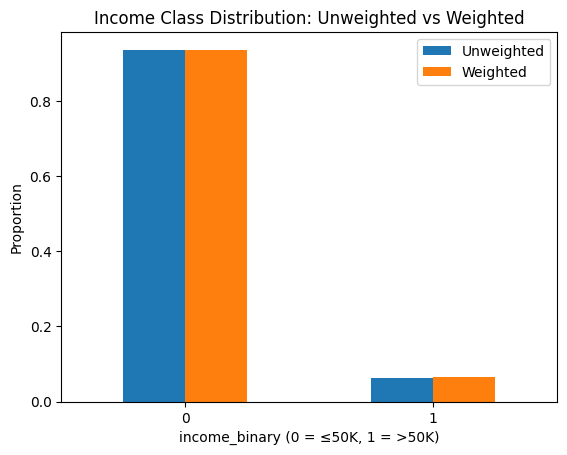

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

unweighted = df["income_binary"].value_counts(normalize=True).sort_index()
weighted = (df.groupby("income_binary")["weight"].sum())
weighted = (weighted / weighted.sum()).sort_index()

plot_df = pd.DataFrame({
    "Unweighted": unweighted,
    "Weighted": weighted
})

ax = plot_df.plot(kind="bar")
ax.set_title("Income Class Distribution: Unweighted vs Weighted")
ax.set_xlabel("income_binary (0 = ≤50K, 1 = >50K)")
ax.set_ylabel("Proportion")
plt.xticks(rotation=0)
plt.show()


# Exploring Numeric variables

In [ ]:
display(df[NUMERIC_FEATURES].describe())

,age,wage per hour,capital gains,capital losses,dividends from stocks,num persons worked for employer,weeks worked in year,year
count,196294.000000,196294.000000,196294.000000,196294.000000,196294.000000,196294.000000,196294.000000,196294.000000
mean,34.929468,56.336505,441.870037,37.927593,200.722386,1.988105,23.553889,94.499328
std,22.210001,277.054333,4735.677027,274.081174,2000.130616,2.371018,24.428588,0.500001
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,94.000000
25%,16.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,94.000000
50%,34.000000,0.000000,0.000000,0.000000,0.000000,1.000000,12.000000,94.000000
75%,50.000000,0.000000,0.000000,0.000000,0.000000,4.000000,52.000000,95.000000
max,90.000000,9999.000000,99999.000000,4608.000000,99999.000000,6.000000,52.000000,95.000000


In [ ]:
display(df[NUMERIC_FEATURES].skew().sort_values(ascending=False))

,0
dividends from stocks,27.567201
capital gains,18.835992
wage per hour,8.861787
capital losses,7.567395
num persons worked for employer,0.726923
age,0.357209
weeks worked in year,0.180565
year,0.002690


In [ ]:
numeric_by_income = df.groupby("income_binary")[NUMERIC_FEATURES].mean()

display(numeric_by_income)


,age,wage per hour,capital gains,capital losses,dividends from stocks,num persons worked for employer,weeks worked in year,year
income_binary,,,,,,,,
0,34.166215,54.632911,146.373597,27.477843,109.649213,1.852402,21.903351,94.497368
1,46.266193,81.640284,4830.930060,193.139557,1553.448070,4.003715,48.069617,94.528428


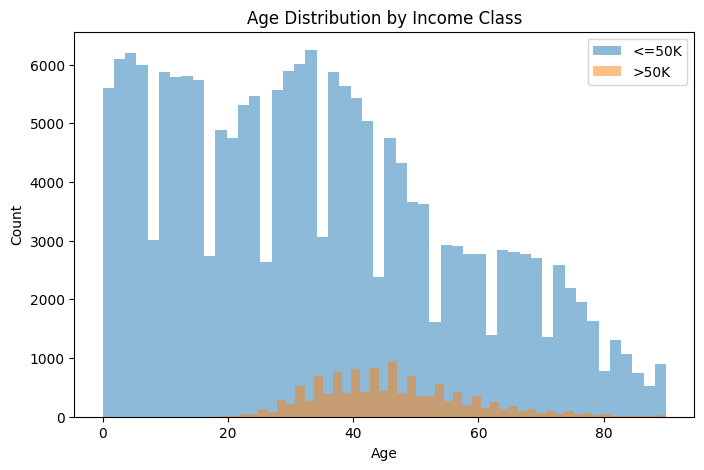

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))

plt.hist(df[df["income_binary"]==0]["age"], bins=50, alpha=0.5, label="<=50K")
plt.hist(df[df["income_binary"]==1]["age"], bins=50, alpha=0.5, label=">50K")

plt.xlabel("Age")
plt.ylabel("Count")
plt.title("Age Distribution by Income Class")
plt.legend()
plt.show()


<Figure size 600x500 with 0 Axes>

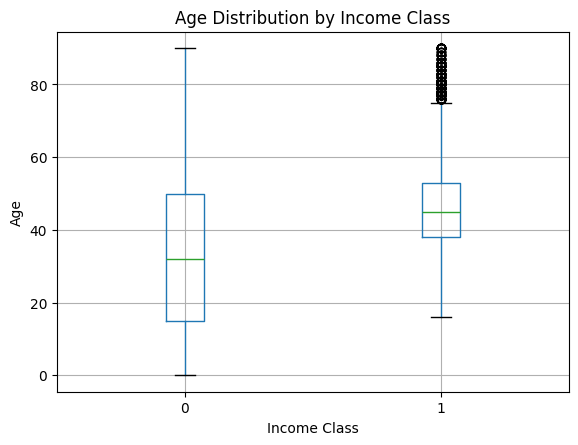

In [ ]:
plt.figure(figsize=(6,5))

df.boxplot(column="age", by="income_binary")

plt.title("Age Distribution by Income Class")
plt.suptitle("")
plt.xlabel("Income Class")
plt.ylabel("Age")
plt.show()


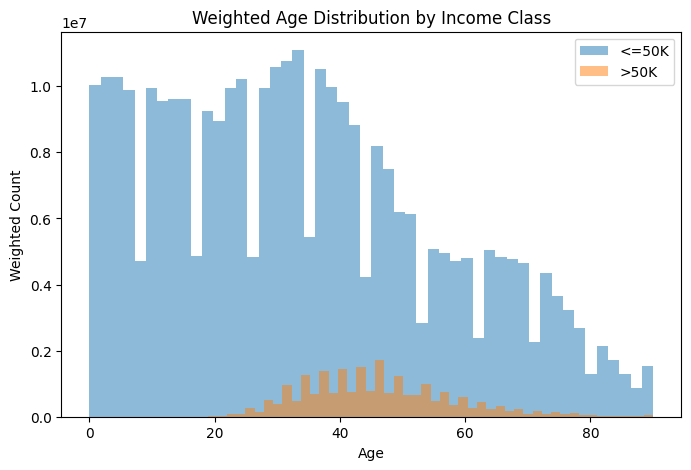

In [ ]:
plt.figure(figsize=(8,5))

plt.hist(df[df["income_binary"]==0]["age"],
         weights=df[df["income_binary"]==0]["weight"],
         bins=50, alpha=0.5, label="<=50K")

plt.hist(df[df["income_binary"]==1]["age"],
         weights=df[df["income_binary"]==1]["weight"],
         bins=50, alpha=0.5, label=">50K")

plt.xlabel("Age")
plt.ylabel("Weighted Count")
plt.title("Weighted Age Distribution by Income Class")
plt.legend()
plt.show()


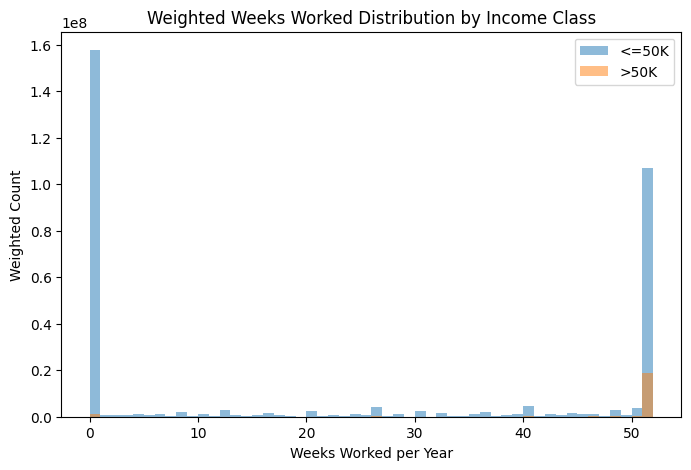

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))

# ≤50K
plt.hist(
    df[df["income_binary"]==0]["weeks worked in year"],
    weights=df[df["income_binary"]==0]["weight"],
    bins=52,
    alpha=0.5,
    label="<=50K"
)

# >50K
plt.hist(
    df[df["income_binary"]==1]["weeks worked in year"],
    weights=df[df["income_binary"]==1]["weight"],
    bins=52,
    alpha=0.5,
    label=">50K"
)

plt.xlabel("Weeks Worked per Year")
plt.ylabel("Weighted Count")
plt.title("Weighted Weeks Worked Distribution by Income Class")

plt.legend()

plt.show()


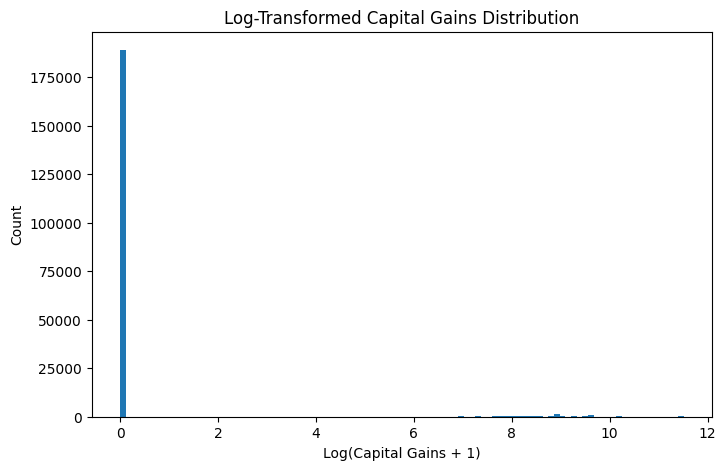

In [ ]:
import numpy as np

plt.figure(figsize=(8,5))

plt.hist(np.log1p(df["capital gains"]), bins=100)

plt.xlabel("Log(Capital Gains + 1)")
plt.ylabel("Count")
plt.title("Log-Transformed Capital Gains Distribution")
plt.show()


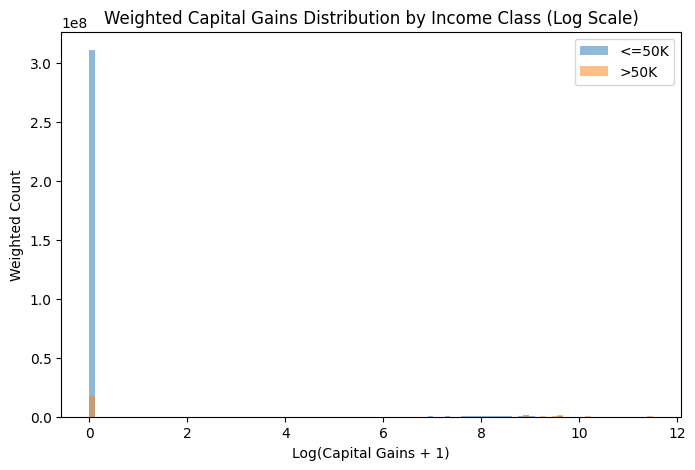

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))

# ≤50K weighted
plt.hist(
    np.log1p(df[df["income_binary"]==0]["capital gains"]),
    weights=df[df["income_binary"]==0]["weight"],
    bins=100,
    alpha=0.5,
    label="<=50K"
)

# >50K weighted
plt.hist(
    np.log1p(df[df["income_binary"]==1]["capital gains"]),
    weights=df[df["income_binary"]==1]["weight"],
    bins=100,
    alpha=0.5,
    label=">50K"
)

plt.xlabel("Log(Capital Gains + 1)")
plt.ylabel("Weighted Count")
plt.title("Weighted Capital Gains Distribution by Income Class (Log Scale)")

plt.legend()

plt.show()


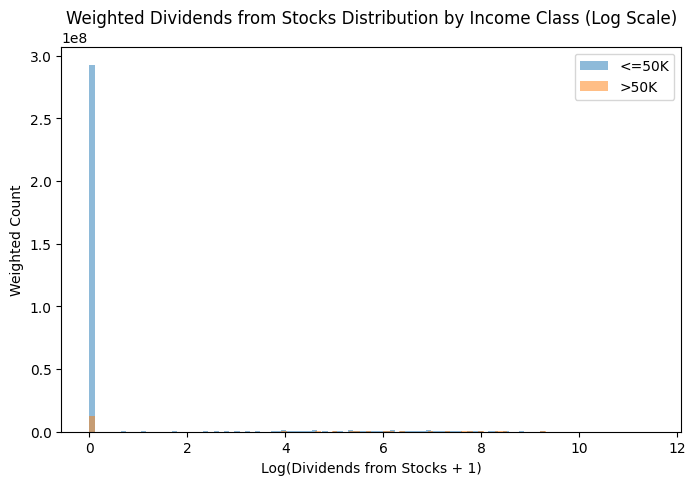

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))

# ≤50K weighted
plt.hist(
    np.log1p(df[df["income_binary"]==0]["dividends from stocks"]),
    weights=df[df["income_binary"]==0]["weight"],
    bins=100,
    alpha=0.5,
    label="<=50K"
)

# >50K weighted
plt.hist(
    np.log1p(df[df["income_binary"]==1]["dividends from stocks"]),
    weights=df[df["income_binary"]==1]["weight"],
    bins=100,
    alpha=0.5,
    label=">50K"
)

plt.xlabel("Log(Dividends from Stocks + 1)")
plt.ylabel("Weighted Count")
plt.title("Weighted Dividends from Stocks Distribution by Income Class (Log Scale)")

plt.legend()

plt.show()


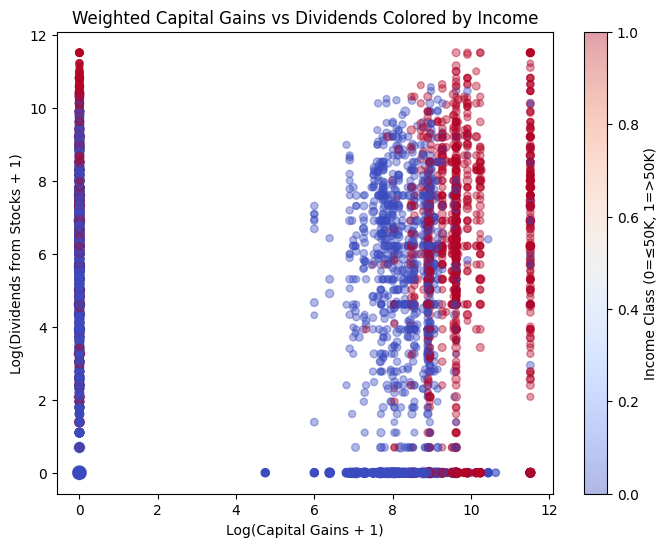

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# log transform (if not already done)
df["capital_gains_log"] = np.log1p(df["capital gains"])
df["dividends_log"] = np.log1p(df["dividends from stocks"])

# normalize weights for plotting (prevents extremely large points)
weights_scaled = df["weight"] / df["weight"].max()

plt.figure(figsize=(8,6))

plt.scatter(
    df["capital_gains_log"],
    df["dividends_log"],
    c=df["income_binary"],
    cmap="coolwarm",
    alpha=0.4,
    s=20 + 80 * weights_scaled   # weighted point size
)

plt.colorbar(label="Income Class (0=≤50K, 1=>50K)")

plt.xlabel("Log(Capital Gains + 1)")
plt.ylabel("Log(Dividends from Stocks + 1)")
plt.title("Weighted Capital Gains vs Dividends Colored by Income")

plt.show()


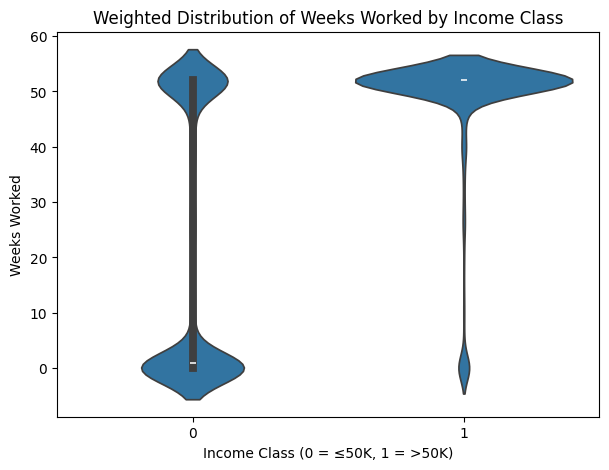

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# create weighted sample (population-representative)
df_weighted = df.sample(
    n=50000,          # adjust size if needed
    weights="weight",
    random_state=42
)

plt.figure(figsize=(7,5))

sns.violinplot(
    x="income_binary",
    y="weeks worked in year",
    data=df_weighted,
    inner="box"
)

plt.title("Weighted Distribution of Weeks Worked by Income Class")
plt.xlabel("Income Class (0 = ≤50K, 1 = >50K)")
plt.ylabel("Weeks Worked")

plt.show()


In [ ]:
import numpy as np

def weighted_median(values, weights):
    sorted_idx = np.argsort(values)
    values, weights = values[sorted_idx], weights[sorted_idx]
    cumsum = weights.cumsum()
    cutoff = weights.sum() / 2
    return values[cumsum >= cutoff][0]

for income in [0,1]:
    subset = df[df["income_binary"]==income]

    wm = weighted_median(
        subset["weeks worked in year"].values,
        subset["weight"].values
    )

    print(f"Weighted median weeks worked (income={income}):", wm)

Weighted median weeks worked (income=0): 4
Weighted median weeks worked (income=1): 52


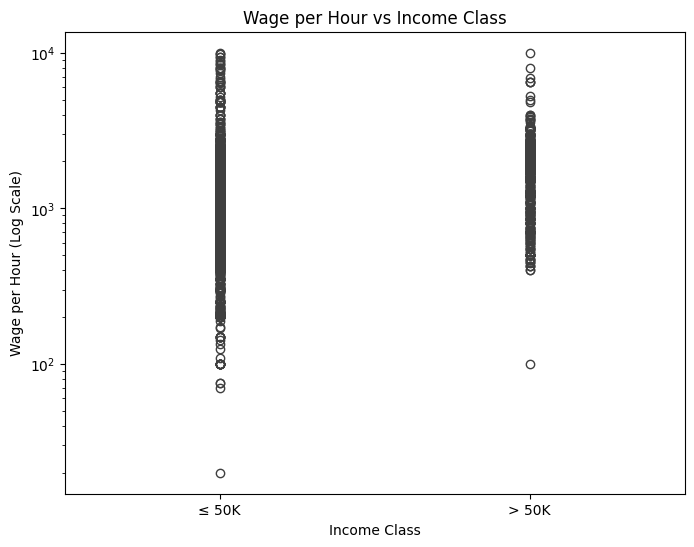

In [ ]:
plt.figure(figsize=(8,6))

sns.boxplot(
    data=df,
    x="income_binary",
    y="wage per hour"
)

plt.yscale("log")

plt.title("Wage per Hour vs Income Class")
plt.xlabel("Income Class")
plt.ylabel("Wage per Hour (Log Scale)")

plt.xticks([0,1], ["≤ 50K", "> 50K"])

plt.show()


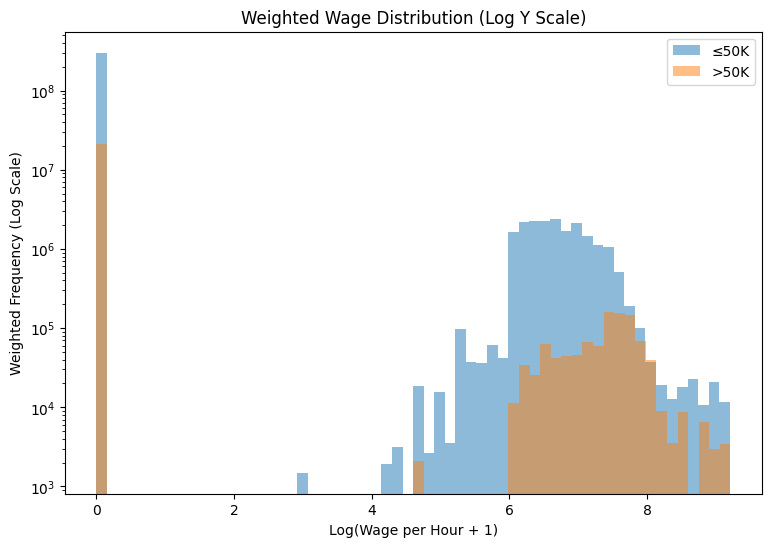

In [ ]:

# log transform
low_income = df[df["income_binary"]==0]
high_income = df[df["income_binary"]==1]

plt.figure(figsize=(9,6))

plt.hist(
    np.log1p(low_income["wage per hour"]),
    weights=low_income["weight"],
    bins=60,
    alpha=0.5,
    label="≤50K"
)

plt.hist(
    np.log1p(high_income["wage per hour"]),
    weights=high_income["weight"],
    bins=60,
    alpha=0.5,
    label=">50K"
)

plt.yscale("log")

plt.title("Weighted Wage Distribution (Log Y Scale)")
plt.xlabel("Log(Wage per Hour + 1)")
plt.ylabel("Weighted Frequency (Log Scale)")

plt.legend()

plt.show()


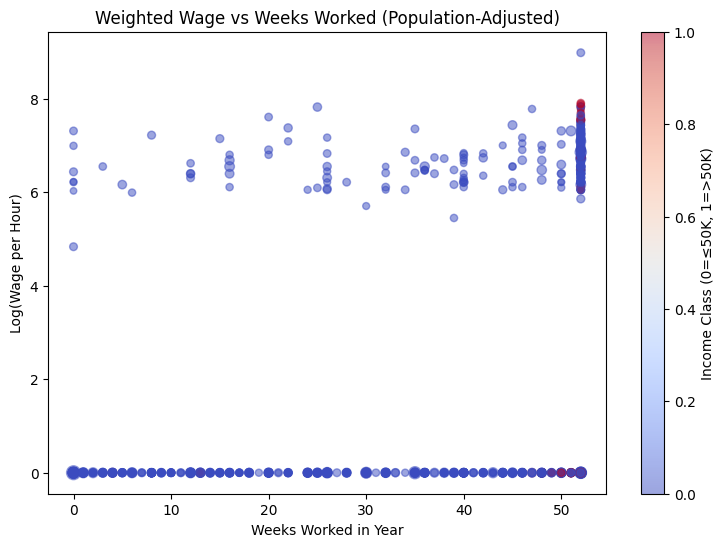

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# weighted sampling (population-representative)
sample = df.sample(
    n=5000,
    weights="weight",
    random_state=42
)

# scale weights for visualization
weights_scaled = sample["weight"] / sample["weight"].max()

plt.figure(figsize=(9,6))

plt.scatter(
    sample["weeks worked in year"],
    np.log1p(sample["wage per hour"]),
    c=sample["income_binary"],
    s=20 + 80 * weights_scaled,   # weighted point size
    alpha=0.5,
    cmap="coolwarm"
)

plt.xlabel("Weeks Worked in Year")
plt.ylabel("Log(Wage per Hour)")
plt.title("Weighted Wage vs Weeks Worked (Population-Adjusted)")

plt.colorbar(label="Income Class (0=≤50K, 1=>50K)")

plt.show()


/tmp/ipython-input-1868703897.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: pd.Series({


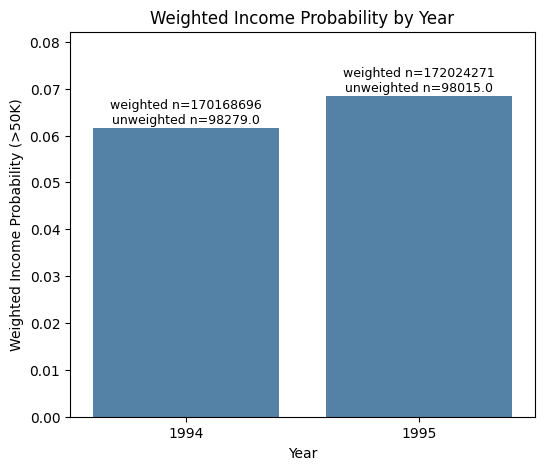


Weighted Income Probability by Year:
   year  weighted_prob    weighted_n  unweighted_n
0  1994       0.061498  1.701687e+08       98279.0
1  1995       0.068456  1.720243e+08       98015.0


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# ---------- Compute weighted probability and counts ----------
year_weighted = (
    df.groupby("year")
      .apply(lambda x: pd.Series({
          "weighted_prob": np.average(x["income_binary"], weights=x["weight"]),
          "weighted_n": x["weight"].sum(),
          "unweighted_n": len(x)
      }))
      .reset_index()
)

# convert year format
year_weighted["year"] = year_weighted["year"].map({94: 1994, 95: 1995})

# ---------- Plot ----------
plt.figure(figsize=(6,5))

sns.barplot(
    data=year_weighted,
    x="year",
    y="weighted_prob",
    color="steelblue"
)

# annotate both weighted and unweighted n
for i, row in year_weighted.iterrows():
    plt.text(
        i,
        row["weighted_prob"] + 0.001,
        f"weighted n={row['weighted_n']:.0f}\nunweighted n={row['unweighted_n']}",
        ha='center',
        fontsize=9
    )

plt.ylabel("Weighted Income Probability (>50K)")
plt.xlabel("Year")
plt.title("Weighted Income Probability by Year")

plt.ylim(0, year_weighted["weighted_prob"].max() * 1.2)

plt.show()

# ---------- Display table ----------
print("\nWeighted Income Probability by Year:")
print(year_weighted)


/tmp/ipython-input-4064530915.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["year", "major occupation code"])
/tmp/ipython-input-4064530915.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["income_binary"], weights=g["weight"]))


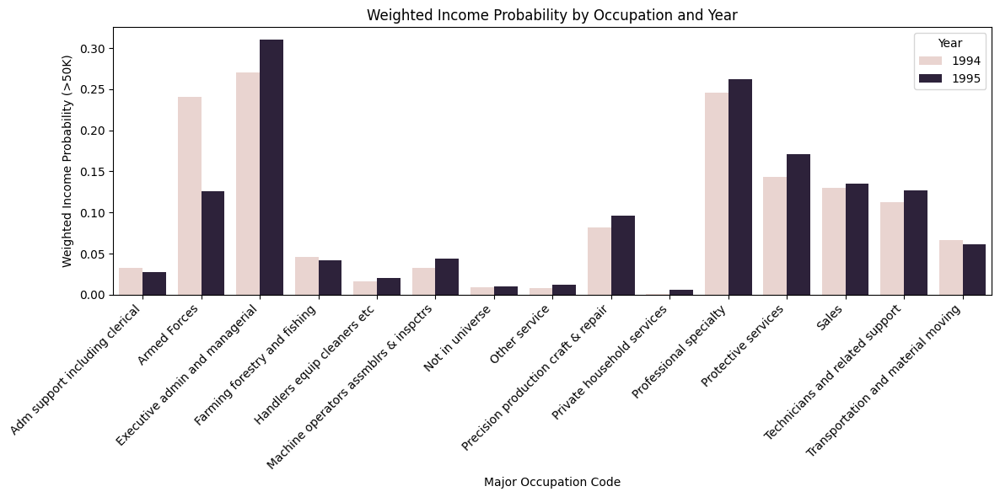

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# weighted income probability by (year, occupation)
year_occ_income_w = (
    df.groupby(["year", "major occupation code"])
      .apply(lambda g: np.average(g["income_binary"], weights=g["weight"]))
      .reset_index(name="income_prob_weighted")
)

# encode occupation
occupation_mapping = {
    occ: i for i, occ in enumerate(year_occ_income_w["major occupation code"].unique())
}
year_occ_income_w["occupation_code"] = year_occ_income_w["major occupation code"].map(occupation_mapping)

# convert year
year_occ_income_w["year_plot"] = year_occ_income_w["year"].map({94: 1994, 95: 1995})

plt.figure(figsize=(12,6))

sns.barplot(
    data=year_occ_income_w,
    x="major occupation code",
    y="income_prob_weighted",
    hue="year_plot",
    errorbar=None
)

plt.xticks(rotation=45, ha="right")

plt.xlabel("Major Occupation Code")
plt.ylabel("Weighted Income Probability (>50K)")

plt.title("Weighted Income Probability by Occupation and Year")

plt.legend(title="Year")

plt.tight_layout()

plt.show()


/tmp/ipython-input-1181904545.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["age_bin", "weeks_bin"])
/tmp/ipython-input-1181904545.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["income_binary"], weights=g["weight"]))


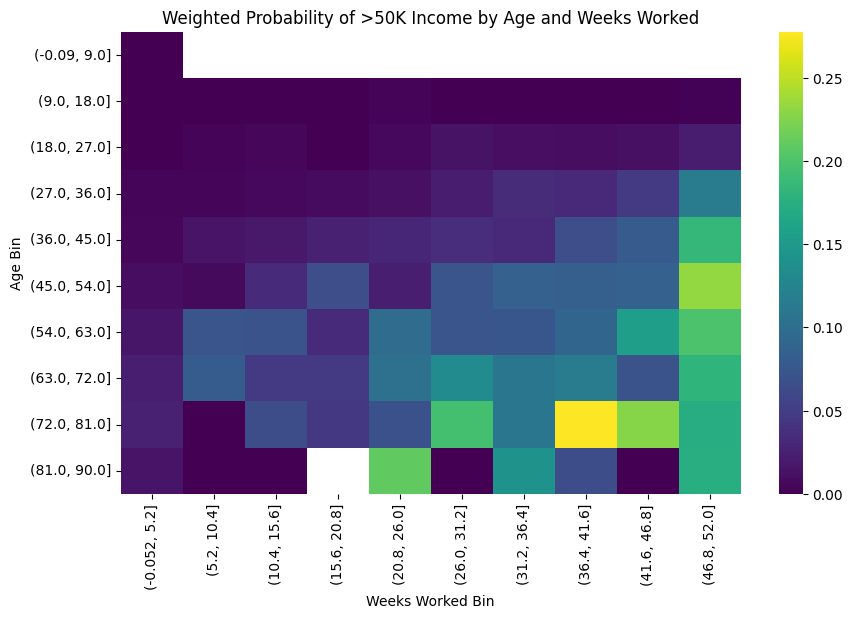

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df["age_bin"] = pd.cut(df["age"], bins=10)
df["weeks_bin"] = pd.cut(df["weeks worked in year"], bins=10)

# compute weighted probability per (age_bin, weeks_bin)
weighted_heat = (
    df.groupby(["age_bin", "weeks_bin"])
      .apply(lambda g: np.average(g["income_binary"], weights=g["weight"]))
      .reset_index(name="weighted_income_prob")
)

# pivot to heatmap format
heatmap_data_w = weighted_heat.pivot(
    index="age_bin",
    columns="weeks_bin",
    values="weighted_income_prob"
)

plt.figure(figsize=(10,6))
sns.heatmap(heatmap_data_w, cmap="viridis")

plt.title("Weighted Probability of >50K Income by Age and Weeks Worked")
plt.xlabel("Weeks Worked Bin")
plt.ylabel("Age Bin")

plt.show()


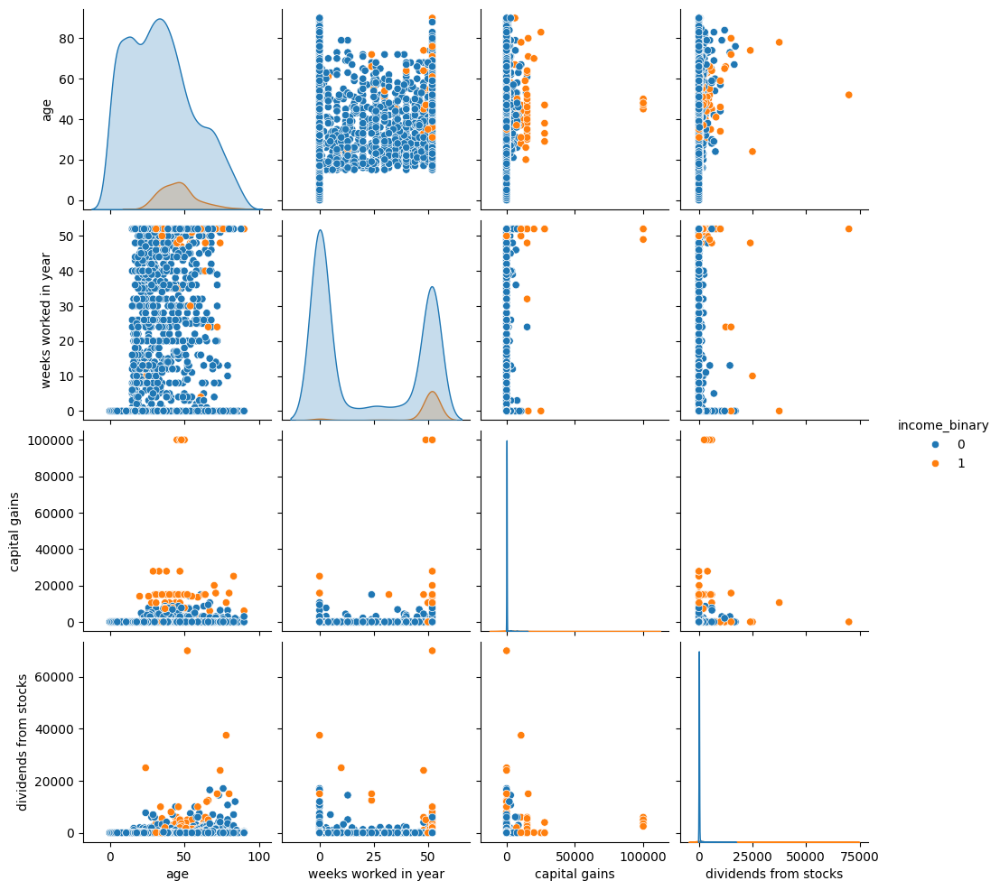

In [ ]:
import seaborn as sns

# weighted sample (population-representative)
sample = df.sample(
    n=5000,
    weights="weight",
    random_state=42
)

sns.pairplot(
    sample,
    vars=[
        "age",
        "weeks worked in year",
        "capital gains",
        "dividends from stocks"
    ],
    hue="income_binary"
)


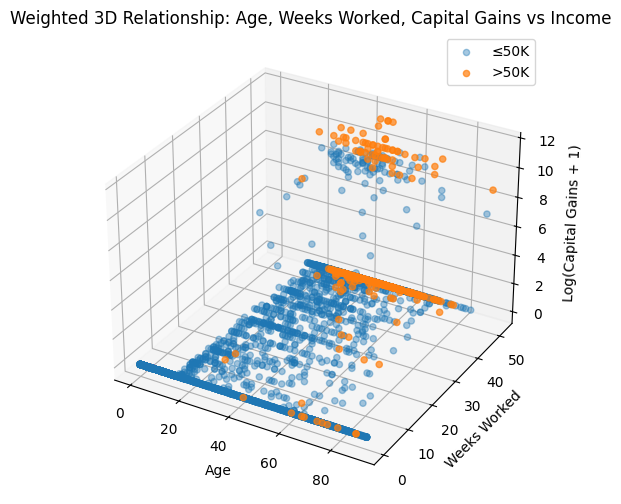

In [ ]:
sample = df.sample(n=5000, weights="weight", random_state=42)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

# ≤50K
low = sample[sample["income_binary"]==0]
ax.scatter(
    low["age"],
    low["weeks worked in year"],
    np.log1p(low["capital gains"]),
    alpha=0.4,
    label="≤50K"
)

# >50K
high = sample[sample["income_binary"]==1]
ax.scatter(
    high["age"],
    high["weeks worked in year"],
    np.log1p(high["capital gains"]),
    alpha=0.7,
    label=">50K"
)

ax.set_xlabel("Age")
ax.set_ylabel("Weeks Worked")
ax.set_zlabel("Log(Capital Gains + 1)")

ax.set_title("Weighted 3D Relationship: Age, Weeks Worked, Capital Gains vs Income")

ax.legend()

plt.show()


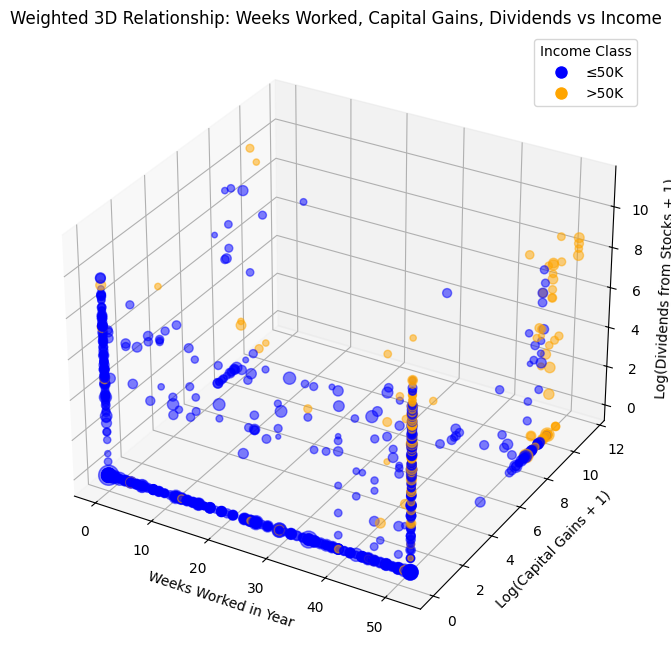

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib.lines import Line2D


sample = df.sample(5000, weights="weight", random_state=42)

x = sample["weeks worked in year"]
y = np.log1p(sample["capital gains"])
z = np.log1p(sample["dividends from stocks"])

colors = sample["income_binary"].map({0: "blue", 1: "orange"})


sizes = (sample["weight"] / sample["weight"].max()) * 200 + 10

fig = plt.figure(figsize=(10, 8)) # Made slightly larger to accommodate the bubbles
ax = fig.add_subplot(111, projection="3d")

ax.scatter(x, y, z, c=colors, s=sizes, alpha=0.5)

ax.set_xlabel("Weeks Worked in Year")
ax.set_ylabel("Log(Capital Gains + 1)")
ax.set_zlabel("Log(Dividends from Stocks + 1)")

ax.set_title("Weighted 3D Relationship: Weeks Worked, Capital Gains, Dividends vs Income")

legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', label='≤50K', markersize=10),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', label='>50K', markersize=10)
]
ax.legend(handles=legend_elements, title="Income Class")

plt.show()

# Exploring Categorical Variables

In [ ]:
weighted_income_stats = {}

for col in CATEGORICAL_FEATURES:

    weighted = df.groupby(col).apply(
        lambda x: np.average(x["income_binary"], weights=x["weight"])
    )

    weighted_income_stats[col] = weighted.sort_values(ascending=False)

display(weighted_income_stats["education"].head(10))


/tmp/ipython-input-2109758968.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted = df.groupby(col).apply(
/tmp/ipython-input-2109758968.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted = df.groupby(col).apply(
/tmp/ipython-input-2109758968.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighte

,0
education,
Prof school degree (MD DDS DVM LLB JD),0.538923
Doctorate degree(PhD EdD),0.526257
Masters degree(MA MS MEng MEd MSW MBA),0.315963
Bachelors degree(BA AB BS),0.203527
Associates degree-academic program,0.096324
Associates degree-occup /vocational,0.075936
Some college but no degree,0.064985
High school graduate,0.037647
12th grade no diploma,0.014818


In [ ]:
category_strength = {}

for col in CATEGORICAL_FEATURES:

    strength = df.groupby(col)["income_binary"].mean().std()

    category_strength[col] = strength

category_strength = pd.Series(category_strength).sort_values(ascending=False)

display(category_strength)


/tmp/ipython-input-263604912.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strength = df.groupby(col)["income_binary"].mean().std()


,0
education,0.177741
detailed occupation recode,0.160796
class of worker,0.110453
detailed industry recode,0.095496
major occupation code,0.093257
own business or self employed,0.090433
major industry code,0.074363
veterans benefits,0.059686
sex,0.054804
country of birth self,0.054473


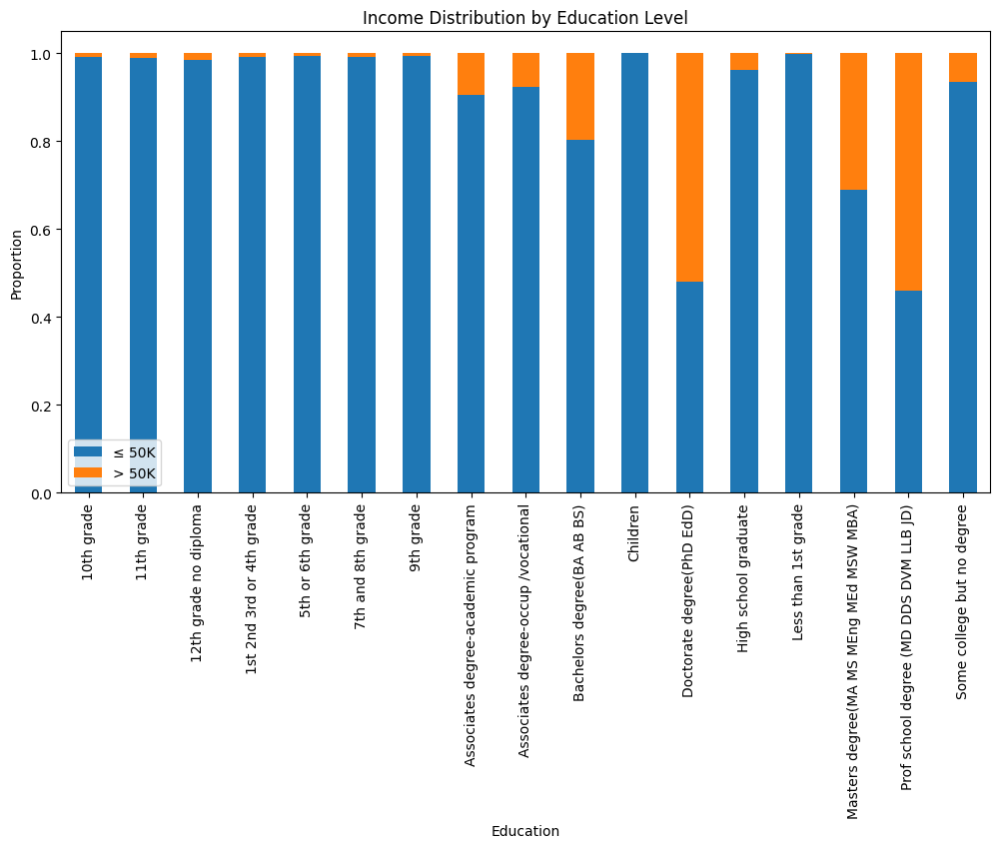

In [ ]:
education_income = pd.crosstab(
    df["education"],
    df["income_binary"],
    normalize="index"
)

education_income.plot(kind="bar", stacked=True, figsize=(12,6))

plt.title("Income Distribution by Education Level")
plt.xlabel("Education")
plt.ylabel("Proportion")

plt.legend(["≤ 50K", "> 50K"])

plt.show()


In [ ]:
TOP_CATEGORICAL_FEATURES = [
    "education",
    "detailed occupation recode",
    "class of worker",
    "detailed industry recode",
    "major occupation code",
    "own business or self employed",
    "major industry code",
    "veterans benefits",
    "sex",
    "full or part time employment stat"
]


In [ ]:
for col in TOP_CATEGORICAL_FEATURES:

    print(f"\n===== {col} =====")

    summary = df.groupby(col)["income_binary"].agg(
        count="count",
        income_probability="mean"
    ).sort_values("income_probability", ascending=False)

    display(summary.head(10))



===== education =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
education,,
Prof school degree (MD DDS DVM LLB JD),1793,0.540435
Doctorate degree(PhD EdD),1263,0.520190
Masters degree(MA MS MEng MEd MSW MBA),6540,0.311621
Bachelors degree(BA AB BS),19859,0.197140
Associates degree-academic program,4363,0.094430
Associates degree-occup /vocational,5358,0.077081
Some college but no degree,27809,0.064260
High school graduate,48374,0.038843
12th grade no diploma,2125,0.016000



===== detailed occupation recode =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
detailed occupation recode,,
7,731,0.683995
11,637,0.659341
4,1364,0.497801
5,855,0.370760
6,441,0.349206
2,8756,0.322179
18,1082,0.274492
17,1771,0.271598
9,738,0.269648



===== class of worker =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
class of worker,,
Self-employed-incorporated,3264,0.347426
Federal government,2925,0.204103
Self-employed-not incorporated,8442,0.129116
State government,4227,0.114739
Local government,7783,0.108827
Private,72021,0.101665
Not in universe,97029,0.009317
Without pay,165,0.006061
Never worked,438,0.004566



===== detailed industry recode =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
detailed industry recode,,
20,32,0.468750
26,126,0.380952
25,1084,0.271218
3,563,0.259325
15,452,0.254425
49,610,0.247541
13,899,0.235818
14,295,0.233898
45,4482,0.232932



===== major occupation code =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
major occupation code,,
Executive admin and managerial,12495,0.287555
Professional specialty,13940,0.249283
Armed Forces,36,0.222222
Protective services,1661,0.155930
Sales,11781,0.129361
Technicians and related support,3018,0.119616
Precision production craft & repair,10517,0.090805
Transportation and material moving,4020,0.064428
Farming forestry and fishing,3143,0.050907



===== own business or self employed =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
own business or self employed,,
1,2698,0.225723
2,16151,0.081791
0,177445,0.058903



===== major industry code =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
major industry code,,
Mining,563,0.259325
Other professional services,4482,0.232932
Communications,1181,0.228620
Armed Forces,36,0.222222
Utilities and sanitary services,1178,0.217317
Finance insurance and real estate,6145,0.182099
Public administration,4610,0.179393
Manufacturing-durable goods,9014,0.165742
Wholesale trade,3594,0.153589



===== veterans benefits =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
veterans benefits,,
1,1984,0.116431
2,149976,0.081020
0,44334,0.000000



===== sex =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
sex,,
Male,93894,0.103510
Female,102400,0.026006



===== full or part time employment stat =====


/tmp/ipython-input-3910660416.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(col)["income_binary"].agg(


,count,income_probability
full or part time employment stat,,
Full-time schedules,40728,0.131752
PT for econ reasons usually PT,1209,0.128205
PT for non-econ reasons usually FT,3322,0.118302
PT for econ reasons usually FT,525,0.059048
Children or Armed Forces,120632,0.048694
Unemployed full-time,2310,0.035931
Unemployed part- time,842,0.021378
Not in labor force,26726,0.017287


In [ ]:
baseline = np.average(df["income_binary"], weights=df["weight"])
print("Weighted baseline probability:", baseline)

Weighted baseline probability: 0.06499620794442151


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

TOP_CATEGORICAL_FEATURES = [
    "education",
    "detailed occupation recode",
    "class of worker",
    "detailed industry recode",
    "major occupation code",
    "own business or self employed",
    "major industry code",
    "veterans benefits",
    "sex",
    "full or part time employment stat"
]

SMALL_N = 200        # categories below this are flagged as "small n"
MIN_COUNT_PLOT = 50  # categories below this can be optionally filtered out for clarity


In [ ]:
def plot_income_probability_by_category(
    df,
    feature,
    target="income_binary",
    weight_col=None,         # set to "weight" for weighted probability
    small_n=200,
    min_count_plot=50,
    max_categories=25,
    filter_rare=True
):
    """
    Plots (1) income probability P(target==1) by category and (2) counts by category,
    flags low-sample categories to avoid overconfident conclusions.
    """

    data = df[[feature, target] + ([weight_col] if weight_col else [])].copy()

    # Compute count + income probability
    if weight_col:
        # weighted probability per category
        grouped = data.groupby(feature).apply(
            lambda x: np.average(x[target], weights=x[weight_col])
        ).rename("income_probability")
        counts = data.groupby(feature).size().rename("count")
        summary = pd.concat([counts, grouped], axis=1).reset_index()
    else:
        summary = data.groupby(feature)[target].agg(
            count="count",
            income_probability="mean"
        ).reset_index()

    # Optional filtering to reduce noise
    if filter_rare:
        summary = summary[summary["count"] >= min_count_plot]

    # Sort by income_probability
    summary = summary.sort_values("income_probability", ascending=False)

    # Keep top N categories for readability
    if len(summary) > max_categories:
        summary = summary.head(max_categories)

    # Small-n categories to flag
    small_n_cats = summary.loc[summary["count"] < small_n, feature].tolist()

    # ---- Plot 1: Probability ----
    plt.figure(figsize=(12, 5))
    plt.bar(summary[feature].astype(str), summary["income_probability"])
    plt.xticks(rotation=60, ha="right")
    plt.ylim(0, min(1.0, summary["income_probability"].max() * 1.15 + 1e-6))
    plt.ylabel("P(Income > 50K)")
    plt.axhline(baseline, color='red', linestyle='--', label='Population baseline')
    title = f"{feature}: Income Probability by Category"
    if weight_col:
        title += " (Weighted)"
    plt.title(title)

    # annotate small n
    for i, row in summary.reset_index(drop=True).iterrows():
        if row["count"] < small_n:
            plt.text(i, row["income_probability"], f"n={int(row['count'])}", ha="center", va="bottom", fontsize=9)

    plt.tight_layout()
    plt.show()

    # ---- Plot 2: Count ----
    plt.figure(figsize=(12, 4))
    plt.bar(summary[feature].astype(str), summary["count"])
    plt.xticks(rotation=60, ha="right")
    plt.ylabel("Count")
    plt.title(f"{feature}: Sample Size by Category (shown categories)")
    plt.tight_layout()
    plt.show()

    # Print small-n warning list (very impor
    print(f"⚠️ Small-n categories in '{feature}' (n < {small_n}) among plotted groups:")
    for c in small_n_cats:
        n_val = int(summary.loc[summary[feature] == c, "count"].iloc[0])
        p_val = summary.loc[summary[feature] == c, "income_probability"].iloc[0]
        print(f"  - {c} (n={n_val}, P(>50K)={p_val:.3f})")
    else:
      print(f"No small-n categories (n < {small_n}) in the plotted set for '{feature}'.")


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

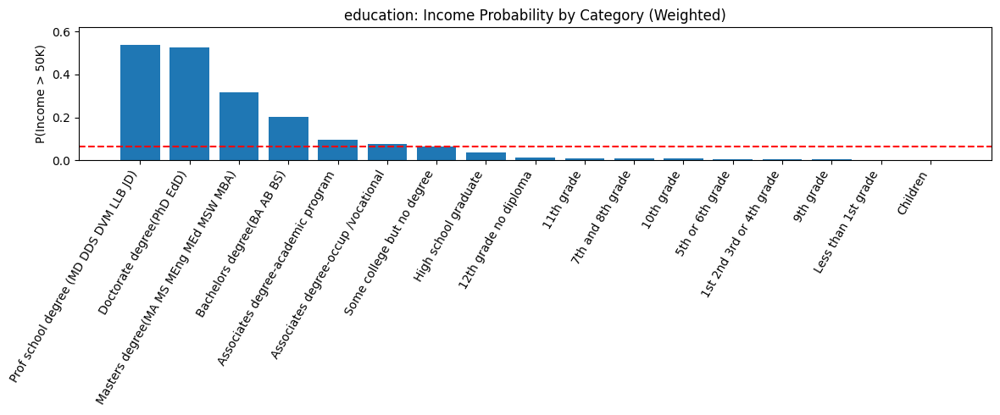

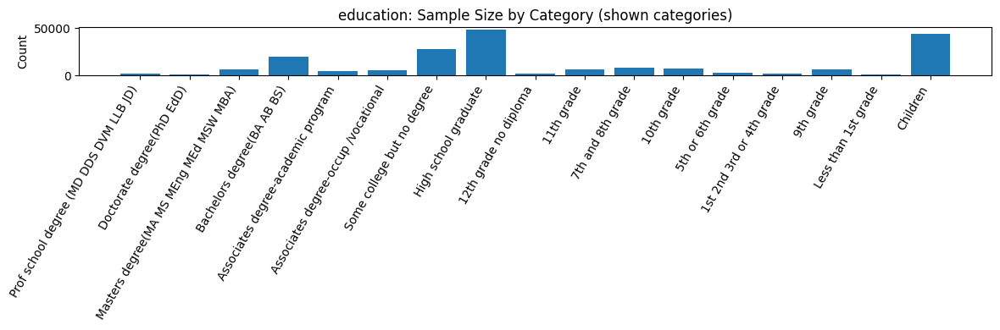

⚠️ Small-n categories in 'education' (n < 200) among plotted groups:
No small-n categories (n < 200) in the plotted set for 'education'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

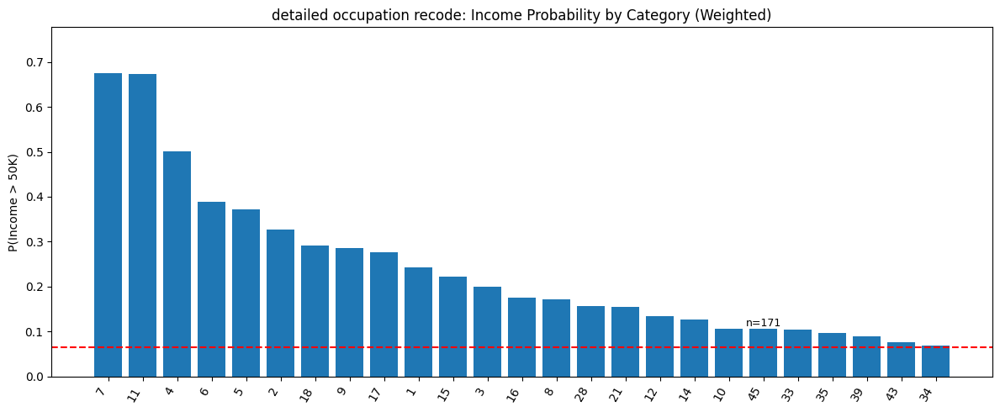

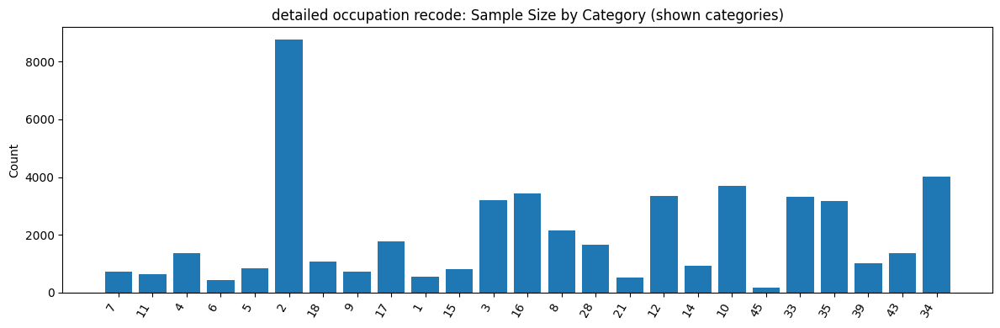

⚠️ Small-n categories in 'detailed occupation recode' (n < 200) among plotted groups:
  - 45 (n=171, P(>50K)=0.106)
No small-n categories (n < 200) in the plotted set for 'detailed occupation recode'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

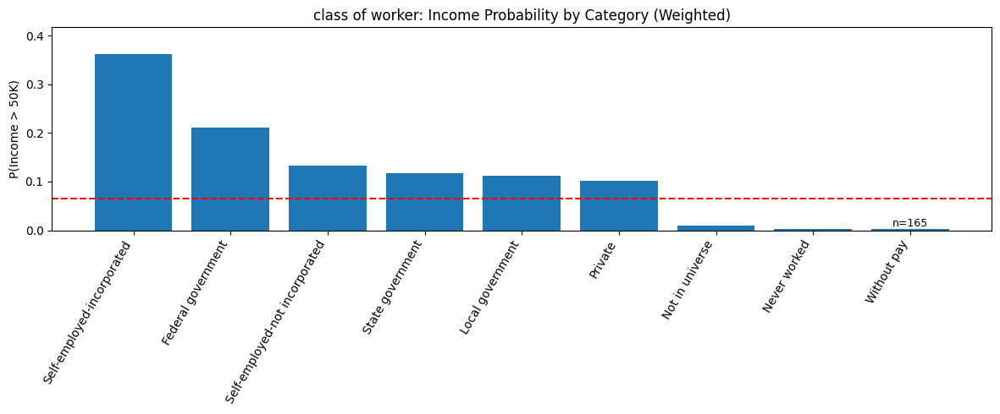

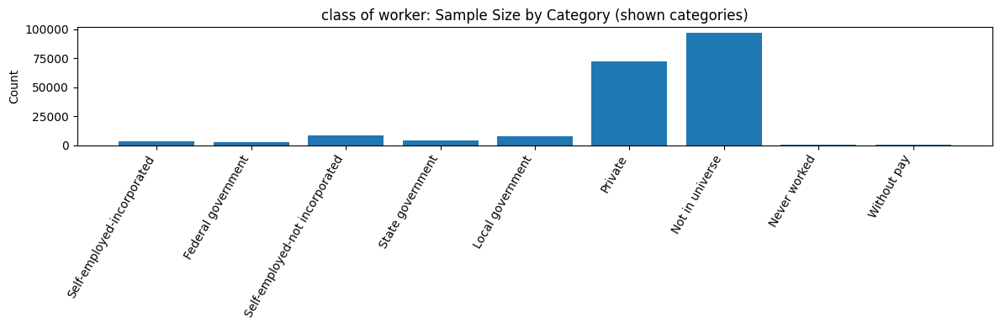

⚠️ Small-n categories in 'class of worker' (n < 200) among plotted groups:
  - Without pay (n=165, P(>50K)=0.002)
No small-n categories (n < 200) in the plotted set for 'class of worker'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

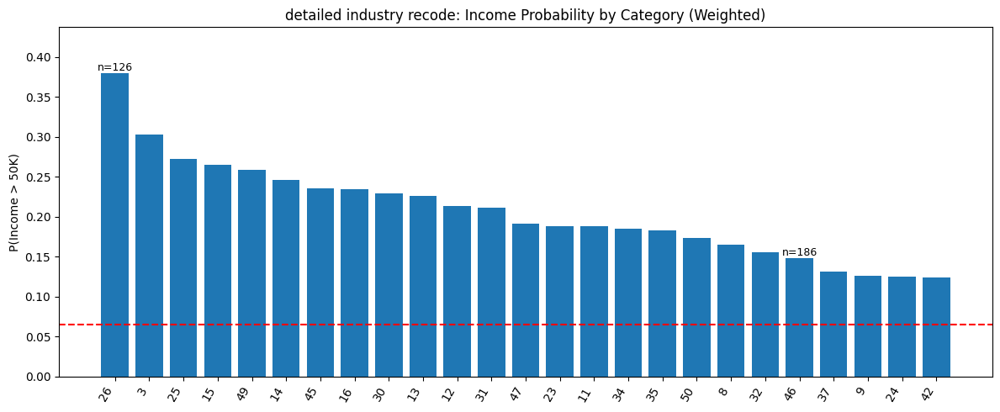

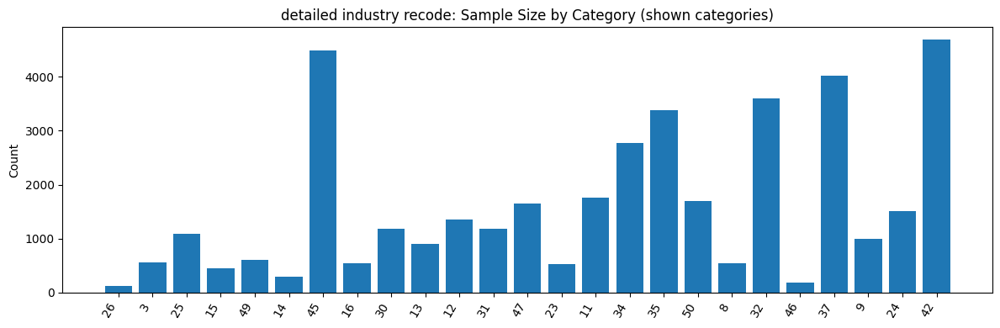

⚠️ Small-n categories in 'detailed industry recode' (n < 200) among plotted groups:
  - 26 (n=126, P(>50K)=0.380)
  - 46 (n=186, P(>50K)=0.148)
No small-n categories (n < 200) in the plotted set for 'detailed industry recode'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

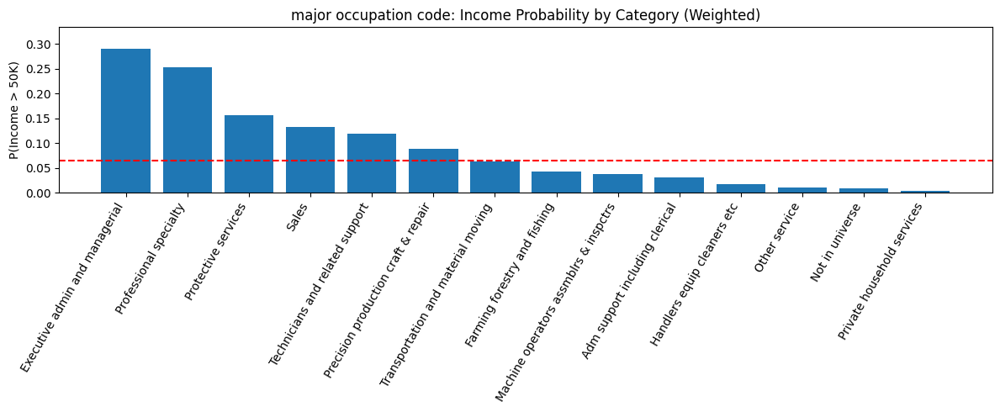

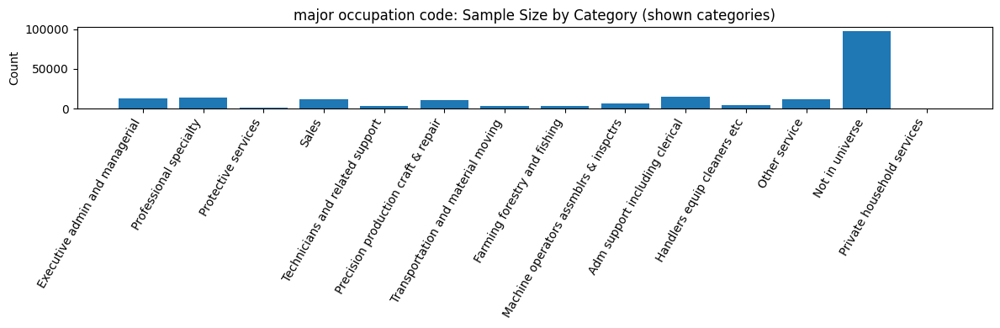

⚠️ Small-n categories in 'major occupation code' (n < 200) among plotted groups:
No small-n categories (n < 200) in the plotted set for 'major occupation code'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

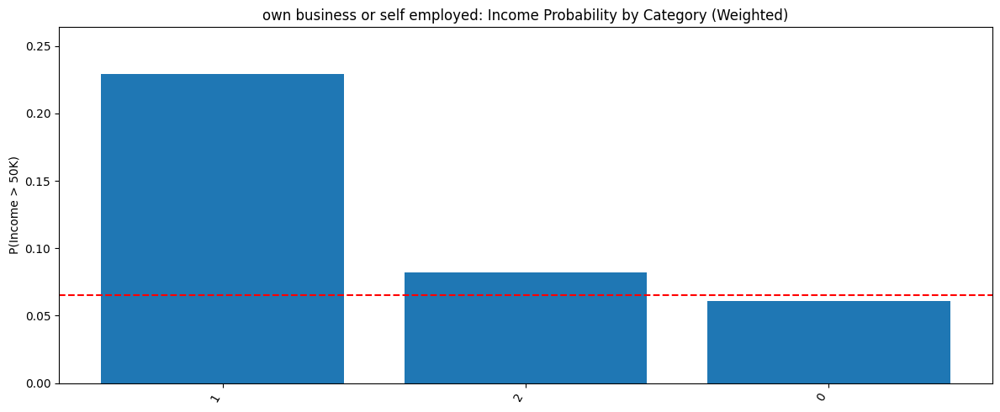

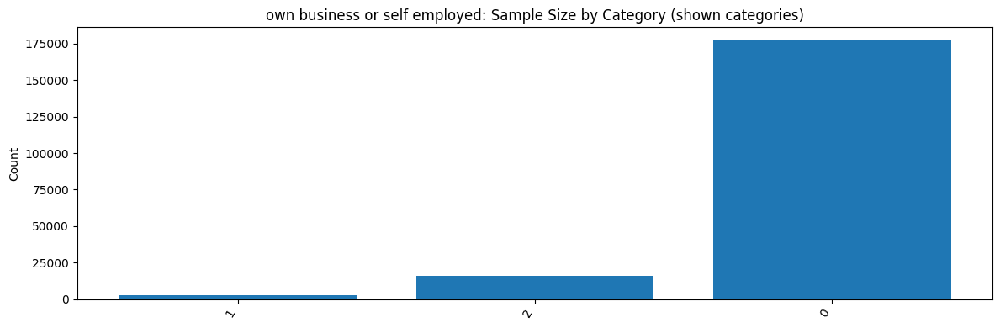

⚠️ Small-n categories in 'own business or self employed' (n < 200) among plotted groups:
No small-n categories (n < 200) in the plotted set for 'own business or self employed'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

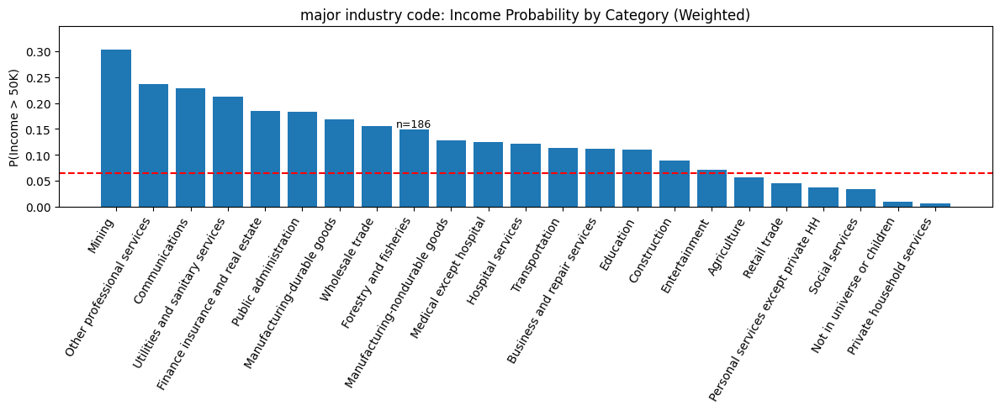

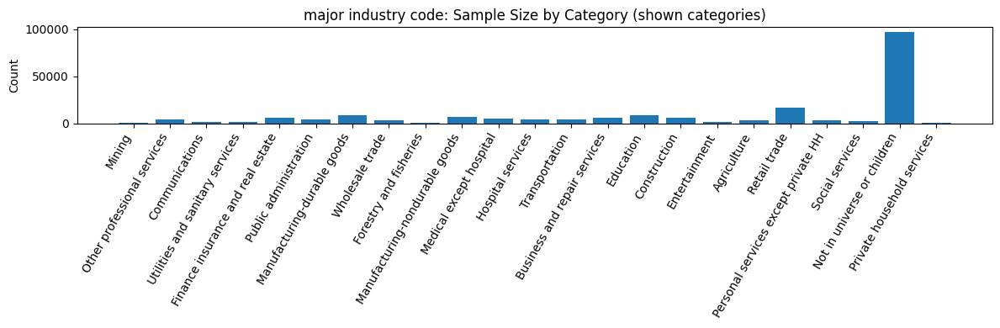

⚠️ Small-n categories in 'major industry code' (n < 200) among plotted groups:
  - Forestry and fisheries (n=186, P(>50K)=0.148)
No small-n categories (n < 200) in the plotted set for 'major industry code'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

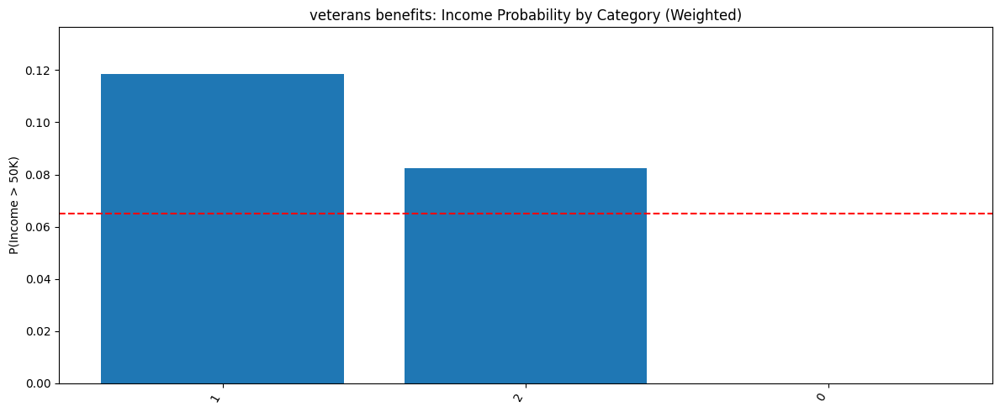

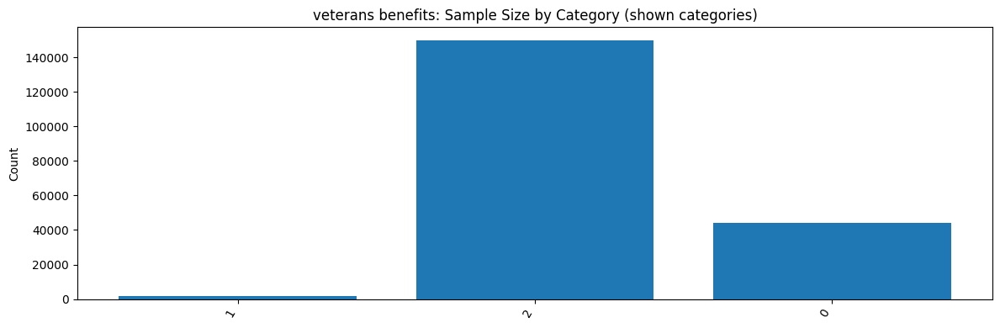

⚠️ Small-n categories in 'veterans benefits' (n < 200) among plotted groups:
No small-n categories (n < 200) in the plotted set for 'veterans benefits'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

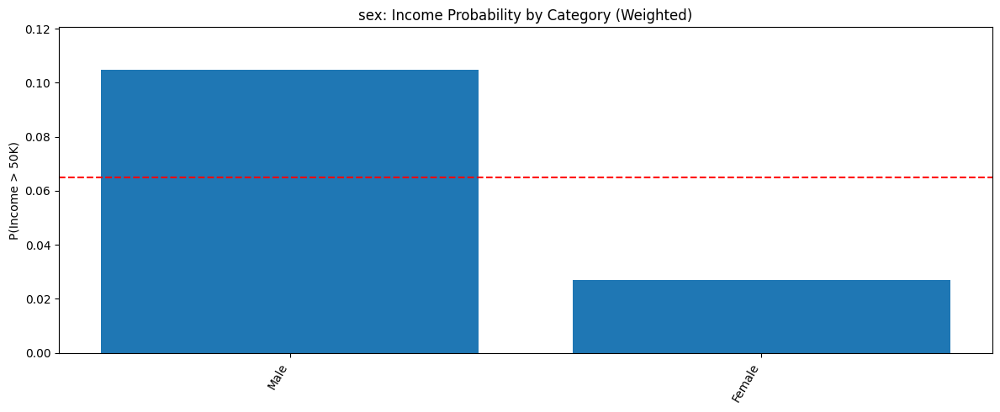

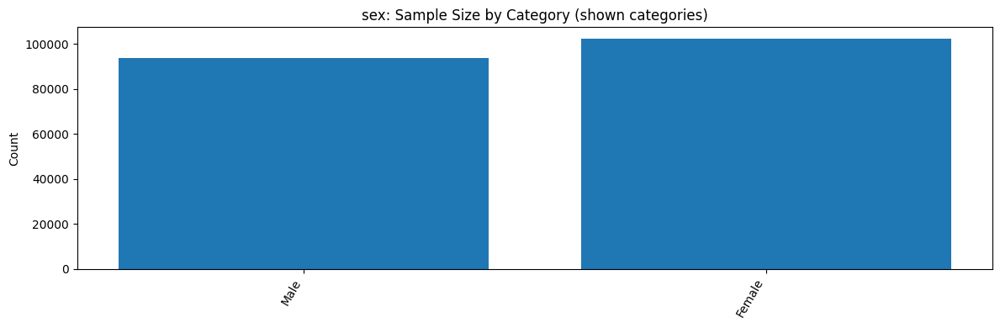

⚠️ Small-n categories in 'sex' (n < 200) among plotted groups:
No small-n categories (n < 200) in the plotted set for 'sex'.


/tmp/ipython-input-3635396265.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = data.groupby(feature).apply(
/tmp/ipython-input-3635396265.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warni

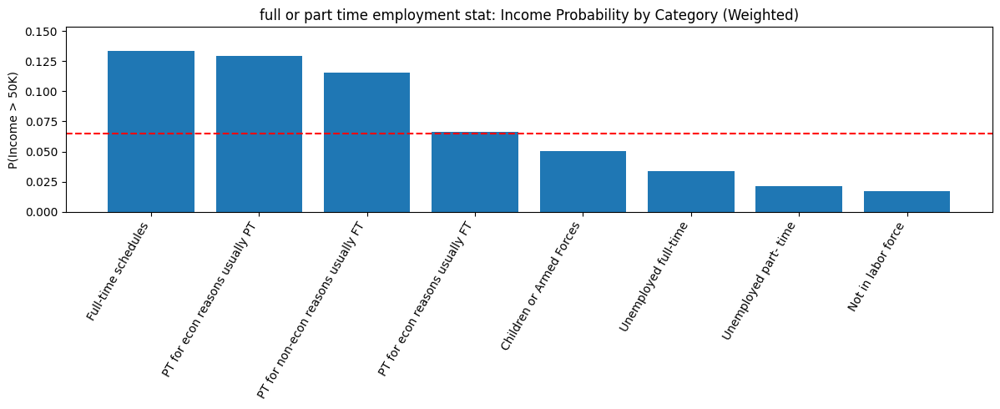

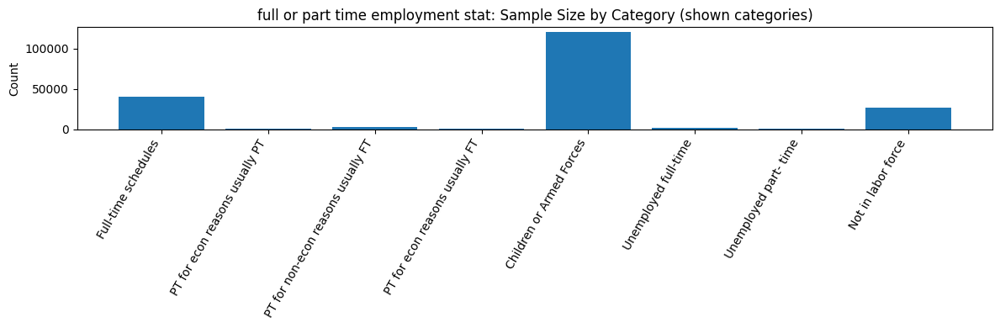

⚠️ Small-n categories in 'full or part time employment stat' (n < 200) among plotted groups:
No small-n categories (n < 200) in the plotted set for 'full or part time employment stat'.


In [ ]:
for col in TOP_CATEGORICAL_FEATURES:
    plot_income_probability_by_category(
        df=df,
        feature=col,
        target="income_binary",
        weight_col="weight",   # weighted probability
        small_n=SMALL_N,
        min_count_plot=MIN_COUNT_PLOT,
        max_categories=25,
        filter_rare=True
    )


# Grouped EDA

In [ ]:
stat_dependence_results = {}

for cat in TOP_CATEGORICAL_FEATURES:

    temp = {}

    for num in NUMERIC_FEATURES:

        grouped = df.groupby(cat)[num].mean()

        # Measure spread of numeric values across categories
        spread = grouped.max() - grouped.min()

        temp[num] = spread

    stat_dependence_results[cat] = temp

stat_dependence_results = pd.DataFrame(stat_dependence_results).T

display(stat_dependence_results.sort_values("capital gains", ascending=False))

/tmp/ipython-input-3750149243.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(cat)[num].mean()


,age,wage per hour,capital gains,capital losses,dividends from stocks,num persons worked for employer,weeks worked in year,year
detailed occupation recode,17.844121,251.301720,10483.987108,187.620433,1118.991186,4.780838,48.568407,0.131145
education,49.750540,120.637365,6748.726715,164.726157,1161.593824,3.667431,42.836587,0.063921
class of worker,25.969913,177.678974,3561.432904,122.231618,766.770305,4.932059,47.239747,0.024578
detailed industry recode,12.697225,224.094549,1769.792726,130.785714,1033.177419,5.508592,48.948683,0.333333
major occupation code,10.826109,191.015242,1753.124387,80.580261,648.106009,4.081402,47.046878,0.092444
major industry code,10.349978,214.042634,1669.886906,95.860643,981.455726,4.670865,47.214070,0.102967
own business or self employed,5.598253,51.637857,1392.702127,49.343672,267.674135,1.974663,25.048530,0.047796
full or part time employment stat,21.750925,169.937143,684.619656,62.536716,318.377993,3.377613,43.143383,0.814701
veterans benefits,52.879994,73.176642,571.947738,65.320565,363.722278,2.580820,30.588794,0.006572
sex,2.318178,13.103745,526.285606,36.482079,45.254984,0.261792,5.497627,0.001181


In [ ]:
def correlation_ratio(categories, measurements):

    categories = pd.Categorical(categories)
    codes = categories.codes

    y_avg = []
    n = []

    for i in range(categories.categories.size):

        vals = measurements[codes == i]

        if len(vals) > 0:
            y_avg.append(vals.mean())
            n.append(len(vals))

    y_avg = np.array(y_avg)
    n = np.array(n)

    y_total = np.sum(y_avg * n) / np.sum(n)

    numerator = np.sum(n * (y_avg - y_total)**2)
    denominator = np.sum((measurements - y_total)**2)

    return np.sqrt(numerator / denominator)


In [ ]:
eta_results = []

for cat in TOP_CATEGORICAL_FEATURES:

    for num in NUMERIC_FEATURES:

        eta = correlation_ratio(df[cat], df[num])

        eta_results.append({
            "categorical": cat,
            "numeric": num,
            "correlation_ratio": eta
        })

eta_results = pd.DataFrame(eta_results)

eta_results.sort_values("correlation_ratio", ascending=False).head(20)


,categorical,numeric,correlation_ratio
14,detailed occupation recode,weeks worked in year,0.883807
38,major occupation code,weeks worked in year,0.881250
30,detailed industry recode,weeks worked in year,0.880894
54,major industry code,weeks worked in year,0.880689
22,class of worker,weeks worked in year,0.877310
79,full or part time employment stat,year,0.793034
21,class of worker,num persons worked for employer,0.754597
29,detailed industry recode,num persons worked for employer,0.751156
53,major industry code,num persons worked for employer,0.746662
13,detailed occupation recode,num persons worked for employer,0.734889


In [ ]:
import numpy as np
import pandas as pd

COMBINATIONS = [
    "education",
    "major occupation code",
    "class of worker",
    "major industry code",
    "full or part time employment stat"
]

NUMERIC_FEATURES = [
    "age",
    "wage per hour",
    "capital gains",
    "dividends from stocks",
    "weeks worked in year"
]

def get_weighted_stats(group):
    """Calculates weighted mean, median, and std for numeric features."""
    w = group["weight"].values
    w_sum = w.sum()

    # Dictionary to store the results
    stats = {}

    # If a group has zero weight (unlikely but safe), skip
    if w_sum == 0:
        return pd.Series(dtype=float)

    for col in NUMERIC_FEATURES:
        x = group[col].values

        # 1. Weighted Mean
        w_mean = np.average(x, weights=w)

        # 2. Weighted Standard Deviation
        # Formula: sqrt( sum(w * (x - mean)^2) / sum(w) )
        w_variance = np.average((x - w_mean)**2, weights=w)
        w_std = np.sqrt(w_variance)

        # 3. Weighted Median
        # Sort values and weights, find where cumulative weight crosses 50%
        sorted_idx = np.argsort(x)
        sorted_x = x[sorted_idx]
        sorted_w = w[sorted_idx]
        cumsum = sorted_w.cumsum()
        cutoff = w_sum / 2.0

        # searchsorted finds the index where cumulative weight >= 50%
        median_idx = np.searchsorted(cumsum, cutoff)
        if median_idx == len(sorted_x): # edge case
            median_idx -= 1
        w_median = sorted_x[median_idx]

        # Store using a tuple key so it creates a nice MultiIndex column layout later
        stats[(col, 'weighted_mean')] = w_mean
        stats[(col, 'weighted_median')] = w_median
        stats[(col, 'weighted_std')] = w_std

    return pd.Series(stats)


# Create the summaries
combined_numeric_summary = {}

for cat in COMBINATIONS:
    # Apply the custom weighted stats function to each group
    # include_groups=False prevents pandas future warnings
    summary = df.groupby(cat).apply(get_weighted_stats, include_groups=False)

    # Optional: ensure columns format matches exactly like your .agg() setup (MultiIndex)
    summary.columns = pd.MultiIndex.from_tuples(summary.columns)

    combined_numeric_summary[cat] = summary

# Display the summary for education
display(combined_numeric_summary["education"])

/tmp/ipython-input-1847565658.py:71: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(cat).apply(get_weighted_stats, include_groups=False)
/tmp/ipython-input-1847565658.py:71: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(cat).apply(get_weighted_stats, include_groups=False)
/tmp/ipython-input-1847565658.py:71: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby(cat).a

age                  \
                                       weighted_mean weighted_median   
education                                                              
10th grade                                 38.090693            31.0   
11th grade                                 34.946391            28.0   
12th grade no diploma                      37.532817            32.0   
1st 2nd 3rd or 4th grade                   56.808470            60.0   
5th or 6th grade                           53.046389            53.0   
7th and 8th grade                          51.459102            57.0   
9th grade                                  35.275479            25.0   
Associates degree-academic program         40.805265            39.0   
Associates degree-occup /vocational        41.387408            39.0   
Bachelors degree(BA AB BS)                 41.743736            39.0   
Children                                    6.900178             7.0   
Doctorate degree(PhD EdD)                  49.363361            47.0   
High school graduate                       44.494365            41.0   
Less than 1st grade                        52.850489            52.0   
Masters degree(MA MS MEng MEd MSW MBA)     46.339026            45.0   
Prof school degree (MD DDS DVM LLB JD)     46.666384            44.0   
Some college but no degree                 39.645405            37.0   

                                                    wage per hour  \
                                       weighted_std weighted_mean   
education                                                           
10th grade                                22.388925     41.583439   
11th grade                                19.612323     58.353940   
12th grade no diploma                     20.135368     47.873420   
1st 2nd 3rd or 4th grade                  18.861960     20.865970   
5th or 6th grade                          20.584413     26.154020   
7th and 8th grade                         25.245530     25.460434   
9th grade                                 22.666033     36.533835   
Associates degree-academic program        13.509948    109.462129   
Associates degree-occup /vocational       14.325226    117.332120   
Bachelors degree(BA AB BS)                14.356108     74.416165   
Children                                   4.307348      0.000000   
Doctorate degree(PhD EdD)                 13.816824     39.346610   
High school graduate                      17.343590     89.201983   
Less than 1st grade                       20.031991     15.715359   
Masters degree(MA MS MEng MEd MSW MBA)    13.151656     52.679532   
Prof school degree (MD DDS DVM LLB JD)    14.052274     39.847113   
Some college but no degree                16.728946     89.243935   

                                                                     \
                                       weighted_median weighted_std   
education                                                             
10th grade                                         0.0   197.479091   
11th grade                                         0.0   272.470823   
12th grade no diploma                              0.0   195.999873   
1st 2nd 3rd or 4th grade                           0.0   125.565978   
5th or 6th grade                                   0.0   144.365793   
7th and 8th grade                                  0.0   206.533260   
9th grade                                          0.0   210.940478   
Associates degree-academic program                 0.0   384.684092   
Associates degree-occup /vocational                0.0   395.764083   
Bachelors degree(BA AB BS)                         0.0   362.230681   
Children                                           0.0     0.000000   
Doctorate degree(PhD EdD)                          0.0   475.894618   
High school graduate                               0.0   336.660285   
Less than 1st grade                                0.0    95.491160   
Masters degree(MA MS

In [ ]:
combined_numeric_summary[  "major occupation code"]

age                  \
                                      weighted_mean weighted_median   
major occupation code                                                 
Adm support including clerical            38.096065            37.0   
Armed Forces                              31.601837            29.0   
Executive admin and managerial            41.871921            41.0   
Farming forestry and fishing              40.168700            38.0   
Handlers equip cleaners etc               32.572215            30.0   
Machine operators assmblrs & inspctrs     37.670105            36.0   
Not in universe                           31.279834            17.0   
Other service                             34.821847            33.0   
Precision production craft & repair       38.600630            37.0   
Private household services                38.079770            36.0   
Professional specialty                    40.428981            40.0   
Protective services                       38.449263            36.0   
Sales                                     37.017413            35.0   
Technicians and related support           37.199917            36.0   
Transportation and material moving        39.655129            38.0   

                                                   wage per hour  \
                                      weighted_std weighted_mean   
major occupation code                                              
Adm support including clerical           12.880460    134.356189   
Armed Forces                              9.769858      0.000000   
Executive admin and managerial           11.679837     57.778467   
Farming forestry and fishing             16.163149     50.950611   
Handlers equip cleaners etc              13.201503    124.221113   
Machine operators assmblrs & inspctrs    12.081537    179.347050   
Not in universe                          28.011902      0.000000   
Other service                            14.113212     99.417162   
Precision production craft & repair      11.579105    174.143234   
Private household services               16.886987     64.791086   
Professional specialty                   11.537376    100.685961   
Protective services                      12.964363    127.875288   
Sales                                    14.329034     69.401442   
Technicians and related support          10.763542    190.063804   
Transportation and material moving       12.476682    139.488190   

                                                                    \
                                      weighted_median weighted_std   
major occupation code                                                
Adm support including clerical                    0.0   387.256238   
Armed Forces                                      0.0     0.000000   
Executive admin and managerial                    0.0   283.830306   
Farming forestry and fishing                      0.0   267.937367   
Handlers equip cleaners etc                       0.0   354.188880   
Machine operators assmblrs & inspctrs             0.0   471.483829   
Not in universe                                   0.0     0.000000   
Other service                                     0.0   329.284677   
Precision production craft & repair               0.0   495.713006   
Private household services                        0.0   192.036615   
Professional specialty                            0.0   449.527339   
Protective services                               0.0   368.892537   
Sales                                             0.0   245.438998   
Technicians and related support                   0.0   549.628498   
Transportation and material moving                0.0   392.330183   

                                      capital gains                  \
                                      weighted_mean weighted_median   
major occupation code                                                 
Adm support including clerical           234.542597             0.0   

In [ ]:
combined_numeric_summary[ "class of worker"]

age                               \
                               weighted_mean weighted_median weighted_std   
class of worker                                                             
Federal government                 41.994342            42.0    11.208235   
Local government                   41.724685            42.0    11.758400   
Never worked                       20.285156            17.0     7.970965   
Not in universe                    31.333285            17.0    28.063890   
Private                            36.621928            35.0    12.730991   
Self-employed-incorporated         45.780008            45.0    12.543828   
Self-employed-not incorporated     44.746470            44.0    13.698037   
State government                   39.637083            39.0    12.095401   
Without pay                        38.784481            39.0    15.492951   

                               wage per hour                               \
                               weighted_mean weighted_median weighted_std   
class of worker                                                             
Federal government                181.728564             0.0   520.205211   
Local government                  114.980014             0.0   409.094998   
Never worked                        0.000000             0.0     0.000000   
Not in universe                     0.000000             0.0     0.000000   
Private                           129.589816             0.0   407.672149   
Self-employed-incorporated          0.000000             0.0     0.000000   
Self-employed-not incorporated      0.000000             0.0     0.000000   
State government                   95.312247             0.0   342.437284   
Without pay                         0.000000             0.0     0.000000   

                               capital gains                                \
                               weighted_mean weighted_median  weighted_std   
class of worker                                                              
Federal government                805.302523             0.0   4318.526511   
Local government                  459.594524             0.0   3217.139277   
Never worked                        0.000000             0.0      0.000000   
Not in universe                   117.774620             0.0   2214.329365   
Private                           639.769127             0.0   5621.647560   
Self-employed-incorporated       3559.188847             0.0  15817.789476   
Self-employed-not incorporated   1080.028500             0.0   8152.021272   
State government                  697.917791             0.0   5680.963375   
Without pay                        11.841680             0.0    168.658204   

                               dividends from stocks                  \
                                       weighted_mean weighted_median   
class of worker                                                        
Federal government                        183.280770             0.0   
Local government                          180.027977             0.0   
Never worked                                0.190310             0.0   
Not in universe                           191.747465             0.0   
Private                                   172.468267             0.0   
Self-employed-incorporated                780.214509             0.0   
Self-employed-not incorporated            379.486666             0.0   
State government                          156.715272             0.0   
Without pay                               215.630919             0.0   

                                            weeks worked in year  \
                               weighted_std        weighted_mean   
class of worker                                                    
Federal government              1217.113150            48.208106   
Local government                1346.956734            46.052657   
Never worked                       2.507189      

In [ ]:
combined_numeric_summary[ "major industry code"]

age                  \
                                    weighted_mean weighted_median   
major industry code                                                 
Agriculture                             40.395197            38.0   
Armed Forces                            31.601837            29.0   
Business and repair services            36.977908            35.0   
Communications                          38.386488            38.0   
Construction                            38.004857            36.0   
Education                               40.674284            41.0   
Entertainment                           34.246086            32.0   
Finance insurance and real estate       39.647566            38.0   
Forestry and fisheries                  39.449326            39.0   
Hospital services                       39.721138            39.0   
Manufacturing-durable goods             39.150237            38.0   
Manufacturing-nondurable goods          38.703143            37.0   
Medical except hospital                 39.426151            39.0   
Mining                                  40.833133            41.0   
Not in universe or children             31.279834            17.0   
Other professional services             41.256767            40.0   
Personal services except private HH     37.923972            36.0   
Private household services              38.289965            36.0   
Public administration                   41.236681            41.0   
Retail trade                            33.633109            31.0   
Social services                         37.939377            37.0   
Transportation                          39.967458            39.0   
Utilities and sanitary services         40.465075            40.0   
Wholesale trade                         39.116887            38.0   

                                                 wage per hour  \
                                    weighted_std weighted_mean   
major industry code                                              
Agriculture                            16.176498     44.055311   
Armed Forces                            9.769858      0.000000   
Business and repair services           12.639236     98.053304   
Communications                         10.092115    140.923282   
Construction                           11.944343    125.559113   
Education                              12.602056     78.964381   
Entertainment                          13.912425    111.036198   
Finance insurance and real estate      12.583766     67.357762   
Forestry and fisheries                 12.515507     56.994385   
Hospital services                      11.246313    218.084795   
Manufacturing-durable goods            11.552130    161.762338   
Manufacturing-nondurable goods         12.107614    134.247667   
Medical except hospital                12.517921    141.001380   
Mining                                 11.407017    138.978706   
Not in universe or children            28.011902      0.000000   
Other professional services            13.002617     81.900130   
Personal services except private HH    13.868741     71.778311   
Private household services             16.732366     60.851019   
Public administration                  11.464649    140.661563   
Retail trade                           14.131528     97.417698   
Social services                        13.383114     97.334228   
Transportation                         11.810726    149.478107   
Utilities and sanitary services        10.272694    192.054065   
Wholesale trade                        12.414725     81.041759   

                                                                  \
                                    weighted_median weighted_std   
major industry code                                                
Agriculture                                     0.0   254.037063   
Armed Forces                                    0.0     0.000000   
Business and repair services                    0.0   345.8

In [ ]:
combined_numeric_summary["full or part time employment stat"]

age                               \
                                   weighted_mean weighted_median weighted_std   
full or part time employment stat                                               
Children or Armed Forces               29.770904            27.0    22.585908   
Full-time schedules                    38.589557            38.0    12.825449   
Not in labor force                     51.044952            56.0    23.221911   
PT for econ reasons usually FT         37.380858            36.0    12.476614   
PT for econ reasons usually PT         41.220733            41.0    12.361775   
PT for non-econ reasons usually FT     39.296524            38.0    13.217751   
Unemployed full-time                   34.523829            33.0    12.013664   
Unemployed part- time                  29.732930            22.0    16.055755   

                                   wage per hour                               \
                                   weighted_mean weighted_median weighted_std   
full or part time employment stat                                               
Children or Armed Forces               47.839870             0.0   263.592514   
Full-time schedules                   119.489990             0.0   385.022309   
Not in labor force                      0.000000             0.0     0.000000   
PT for econ reasons usually FT        173.499336             0.0   438.809929   
PT for econ reasons usually PT        115.147627             0.0   404.292295   
PT for non-econ reasons usually FT    135.123480             0.0   409.302475   
Unemployed full-time                    7.175889             0.0   139.303425   
Unemployed part- time                  23.553125             0.0   150.387731   

                                   capital gains                               \
                                   weighted_mean weighted_median weighted_std   
full or part time employment stat                                               
Children or Armed Forces              343.892165             0.0  4140.183848   
Full-time schedules                   877.261058             0.0  6873.118579   
Not in labor force                    229.349072             0.0  3168.536698   
PT for econ reasons usually FT        293.439867             0.0  1501.495597   
PT for econ reasons usually PT        828.497853             0.0  6677.165608   
PT for non-econ reasons usually FT    684.774405             0.0  5629.689286   
Unemployed full-time                  173.414577             0.0  2173.157156   
Unemployed part- time                 303.288355             0.0  4576.315545   

                                   dividends from stocks                  \
                                           weighted_mean weighted_median   
full or part time employment stat                                          
Children or Armed Forces                      157.334610             0.0   
Full-time schedules                           221.288923             0.0   
Not in labor force                            361.152987             0.0   
PT for econ reasons usually FT                 38.588225             0.0   
PT for econ reasons usually PT                329.157012             0.0   
PT for non-econ reasons usually FT            254.034720             0.0   
Unemployed full-time                           65.678806             0.0   
Unemployed part- time                         231.290003             0.0   

                                                weeks worked in year  \
                                   weighted_std        weighted_mean   
full or part time employment stat                                      
Children or Armed Forces            1709.979094            19.604684   
Full-time schedules                 2069.878160            46.594351   
Not in labor force                  2660.932196             3.591467   
PT for econ reasons usually FT       299.763505            43.848673   
PT for econ reasons usually 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df["income_label"] = df["income_binary"].map({0: "≤50K", 1: ">50K"})

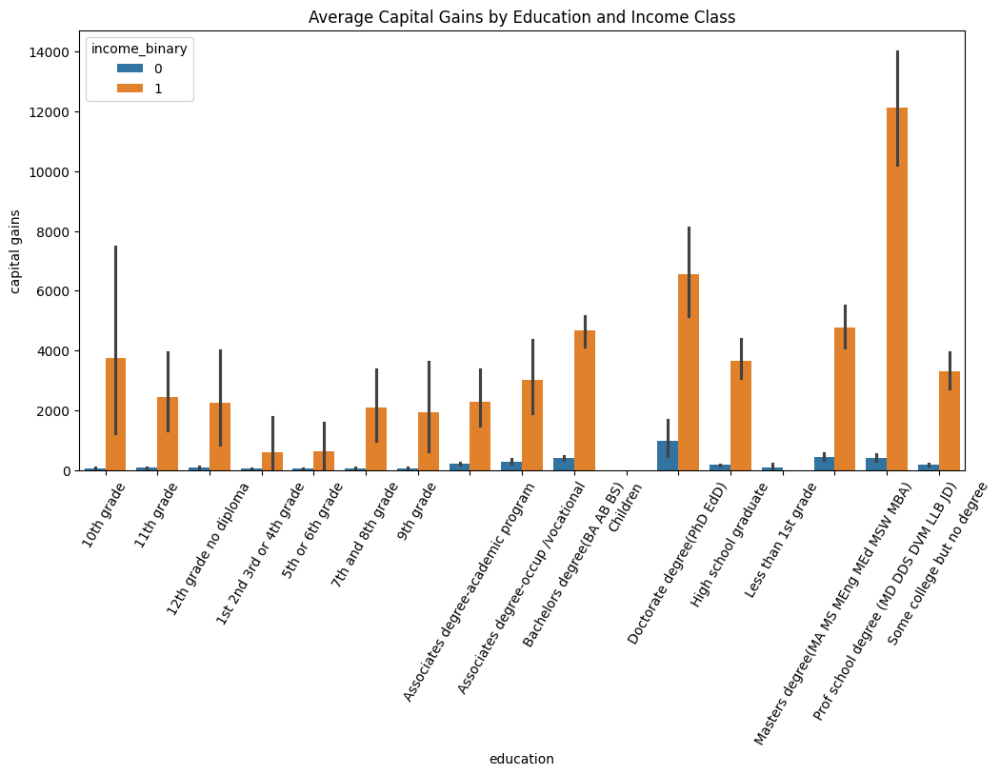

In [ ]:
plt.figure(figsize=(12,6))

sns.barplot(
    data=df,
    x="education",
    y="capital gains",
    hue="income_binary",
    estimator=np.mean
)

plt.xticks(rotation=60)

plt.title("Average Capital Gains by Education and Income Class")

plt.show()


In [ ]:
def plot_zero_inflated_bars(
    df, cat, num, hue="income_label",
    min_count=200, top_k=15, use_median=True
):
    d = df[[cat, num, hue]].copy()
    d[cat] = d[cat].astype(str)

    # Count per (cat, income)
    counts = d.groupby([cat, hue]).size().rename("n").reset_index()

    # Non-zero rate per (cat, income)
    nz_rate = d.assign(nonzero=(d[num] > 0).astype(int)) \
               .groupby([cat, hue])["nonzero"].mean() \
               .rename("nonzero_rate").reset_index()

    # Central tendency among non-zeros per (cat, income)
    nonzero = d[d[num] > 0].copy()
    if use_median:
        center = nonzero.groupby([cat, hue])[num].median().rename("center_nonzero").reset_index()
        center_name = "Median(non-zero)"
    else:
        center = nonzero.groupby([cat, hue])[num].mean().rename("center_nonzero").reset_index()
        center_name = "Mean(non-zero)"

    summary = counts.merge(nz_rate, on=[cat, hue], how="left").merge(center, on=[cat, hue], how="left")

    # Filter to categories with decent support in both classes combined
    total_n = summary.groupby(cat)["n"].sum().sort_values(ascending=False)
    keep = total_n[total_n >= min_count].head(top_k).index
    summary = summary[summary[cat].isin(keep)].copy()

    # Order categories by overall nonzero_rate (avg across income groups)
    order = summary.groupby(cat)["nonzero_rate"].mean().sort_values(ascending=False).index

    # ---- Plot A: Non-zero rate ----
    plt.figure(figsize=(12, 5))
    sns.barplot(data=summary, x=cat, y="nonzero_rate", hue=hue, order=order)
    plt.xticks(rotation=60, ha="right")
    plt.ylabel(f"P({num} > 0)")
    plt.title(f"{num}: Non-zero Rate by {cat} and Income Class (filtered: n≥{min_count}, top {top_k})")
    plt.tight_layout()
    plt.show()

    # Small-n warning list (for the kept categories)
    small = total_n.loc[keep][total_n.loc[keep] < (min_count * 2)]  # tighter warning threshold
    if len(small):
        print("⚠️ Caution: some plotted categories still have relatively small total n:")
        for k, v in small.items():
            print(f"  - {k}: total n={int(v)}")


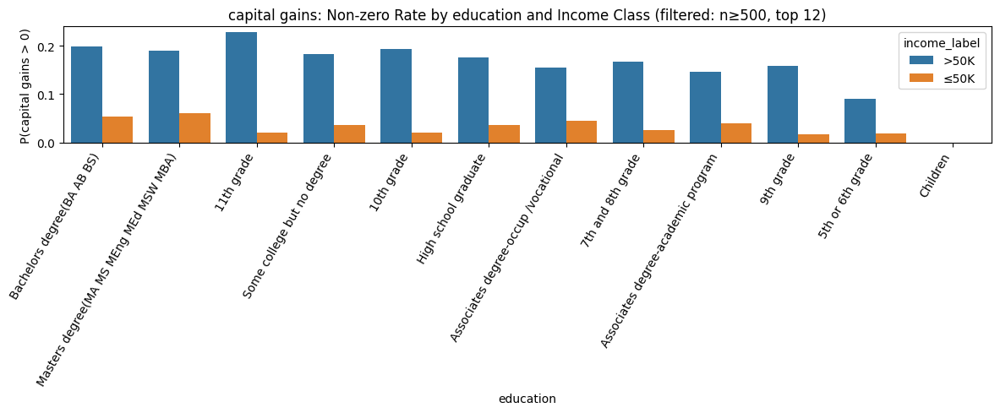

In [ ]:
plot_zero_inflated_bars(df, cat="education", num="capital gains", min_count=500, top_k=12, use_median=True)


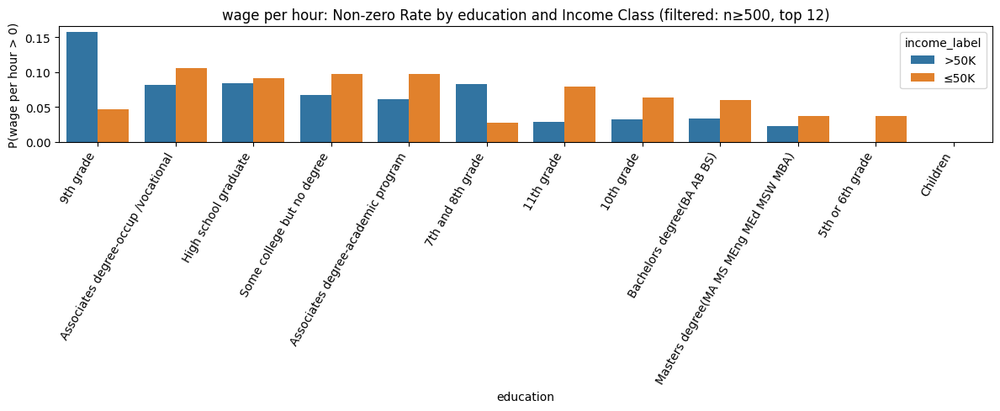

In [ ]:
plot_zero_inflated_bars(df, cat="education", num="wage per hour", min_count=500, top_k=12, use_median=True)


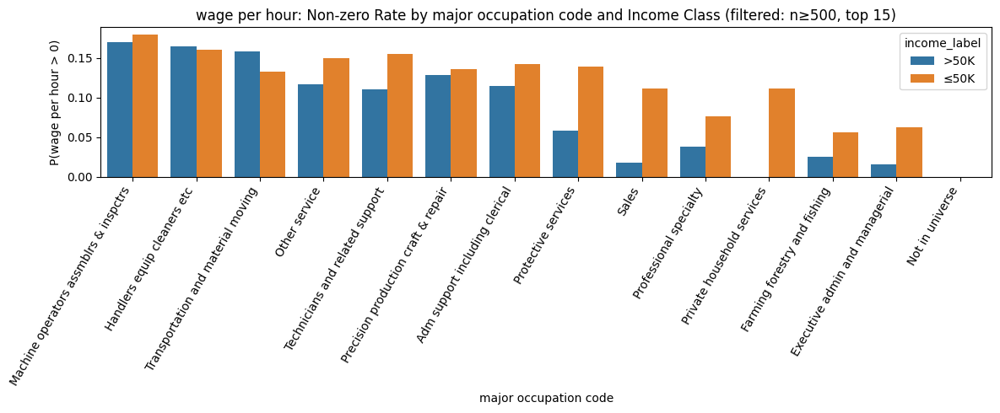

⚠️ Caution: some plotted categories still have relatively small total n:
  - Private household services: total n=780


In [ ]:
plot_zero_inflated_bars(df, cat="major occupation code", num="wage per hour", min_count=500, top_k=15, use_median=True)


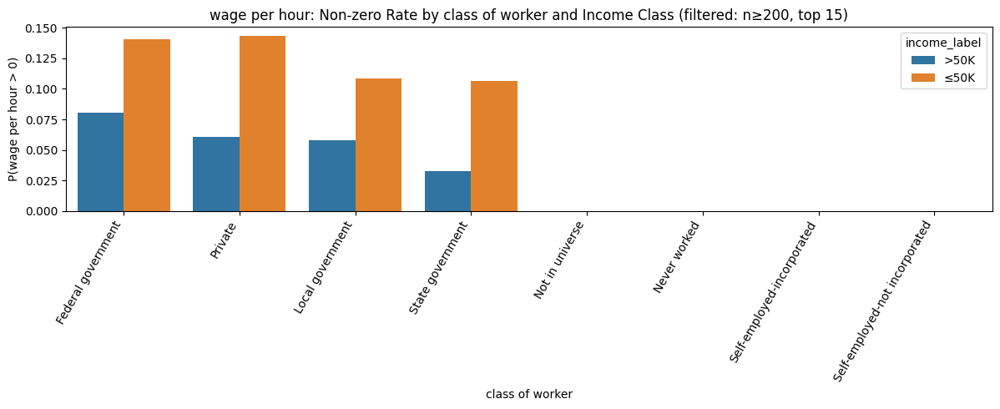

In [ ]:
plot_zero_inflated_bars(df, cat="class of worker", num="wage per hour", min_count=200, top_k=15, use_median=True)

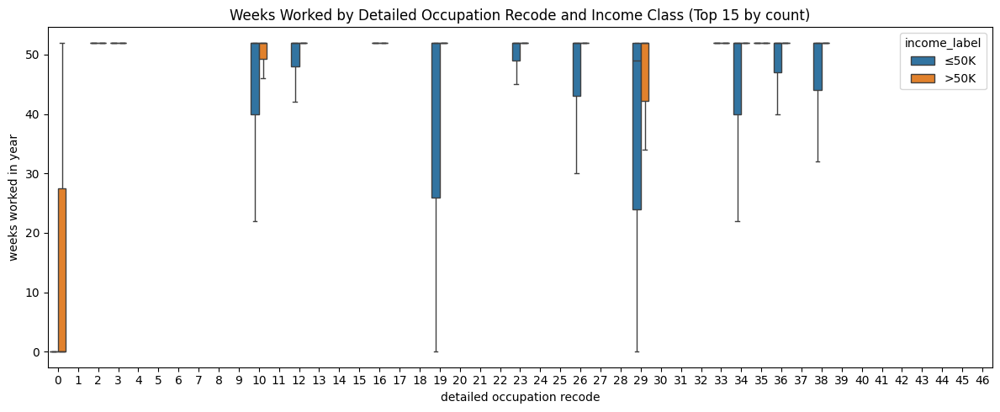

In [ ]:
top_occ = df["detailed occupation recode"].value_counts().head(15).index
tmp = df[df["detailed occupation recode"].isin(top_occ)].copy()

plt.figure(figsize=(12,5))
sns.boxplot(
    data=tmp,
    x="detailed occupation recode",
    y="weeks worked in year",
    hue="income_label",
    showfliers=False
)
plt.title("Weeks Worked by Detailed Occupation Recode and Income Class (Top 15 by count)")
plt.tight_layout()
plt.show()

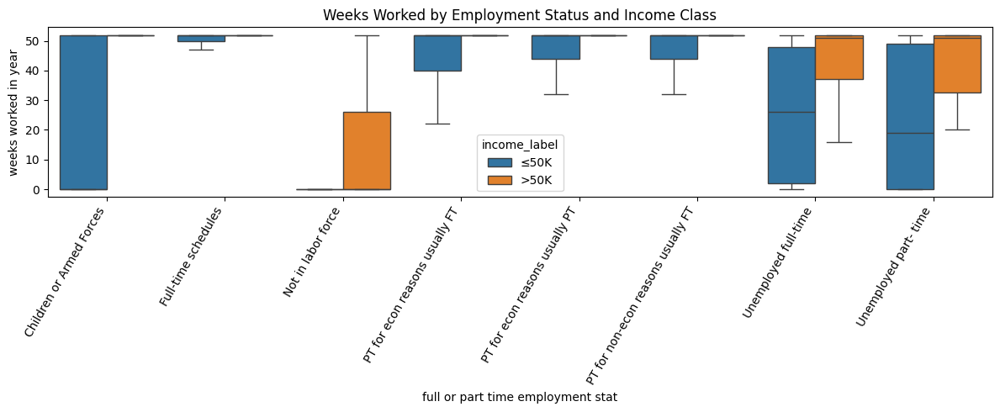

In [ ]:
plt.figure(figsize=(12,5))
sns.boxplot(
    data=df,
    x="full or part time employment stat",
    y="weeks worked in year",
    hue="income_label",
    showfliers=False
)
plt.xticks(rotation=60, ha="right")
plt.title("Weeks Worked by Employment Status and Income Class")
plt.tight_layout()
plt.show()


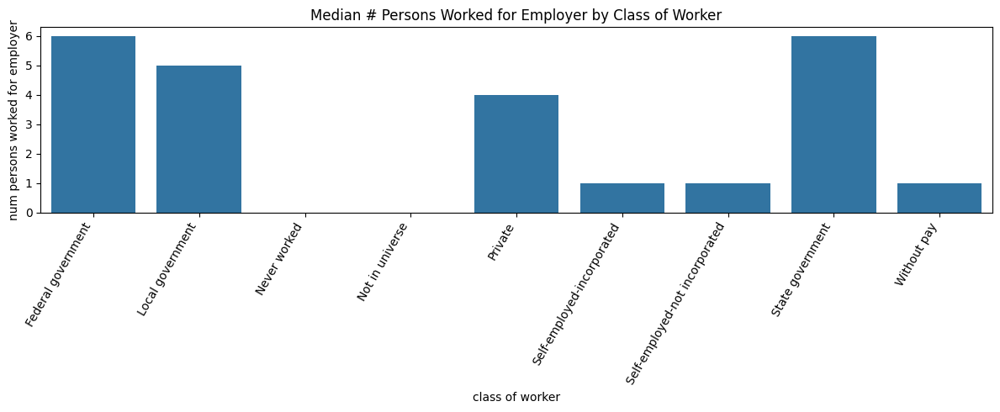

In [ ]:
plt.figure(figsize=(12,5))
sns.barplot(
    data=df,
    x="class of worker",
    y="num persons worked for employer",
    estimator=np.median
)
plt.xticks(rotation=60, ha="right")
plt.title("Median # Persons Worked for Employer by Class of Worker")
plt.tight_layout()
plt.show()


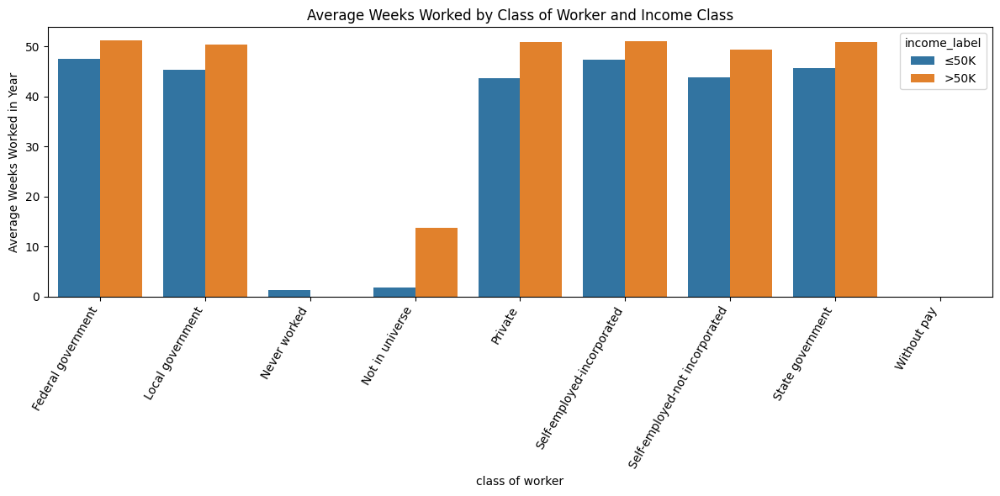

Categories included: ['Not in universe', 'Private', 'Self-employed-not incorporated', 'Local government', 'State government', 'Self-employed-incorporated', 'Federal government', 'Never worked']


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# filter categories with enough samples
min_count = 200
counts = df["class of worker"].value_counts()
valid_classes = counts[counts >= min_count].index

temp = df[df["class of worker"].isin(valid_classes)].copy()

plt.figure(figsize=(12,6))

sns.barplot(
    data=temp,
    x="class of worker",
    y="weeks worked in year",
    hue="income_label",
    estimator=np.mean,
    errorbar=None
)

plt.xticks(rotation=60, ha="right")
plt.ylabel("Average Weeks Worked in Year")
plt.title("Average Weeks Worked by Class of Worker and Income Class")

plt.tight_layout()
plt.show()

print("Categories included:", list(valid_classes))


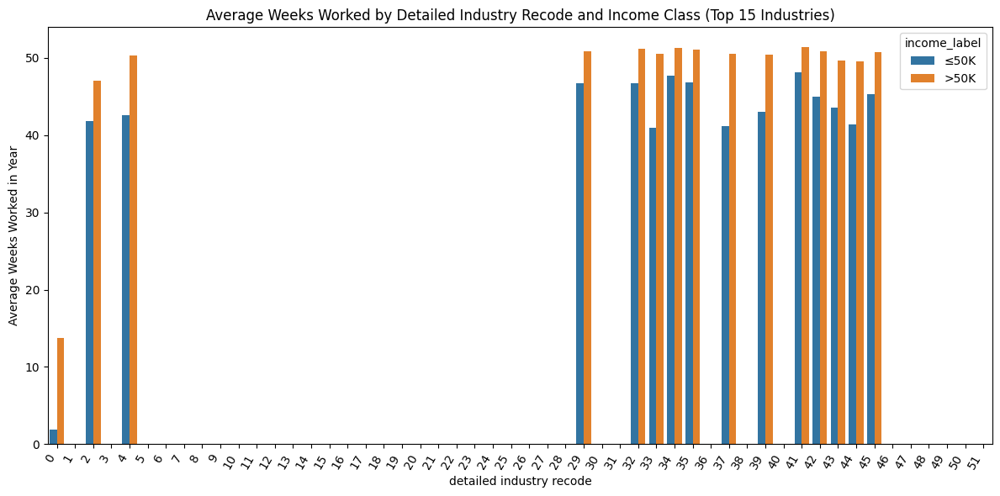

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# select top 15 industries by count
top_dind = df["detailed industry recode"].value_counts().head(15).index

tmp = df[df["detailed industry recode"].isin(top_dind)].copy()

plt.figure(figsize=(12,6))

sns.barplot(
    data=tmp,
    x="detailed industry recode",
    y="weeks worked in year",
    hue="income_label",
    estimator=np.mean,
    errorbar=None
)

plt.xticks(rotation=60, ha="right")

plt.ylabel("Average Weeks Worked in Year")

plt.title("Average Weeks Worked by Detailed Industry Recode and Income Class (Top 15 Industries)")

plt.tight_layout()

plt.show()


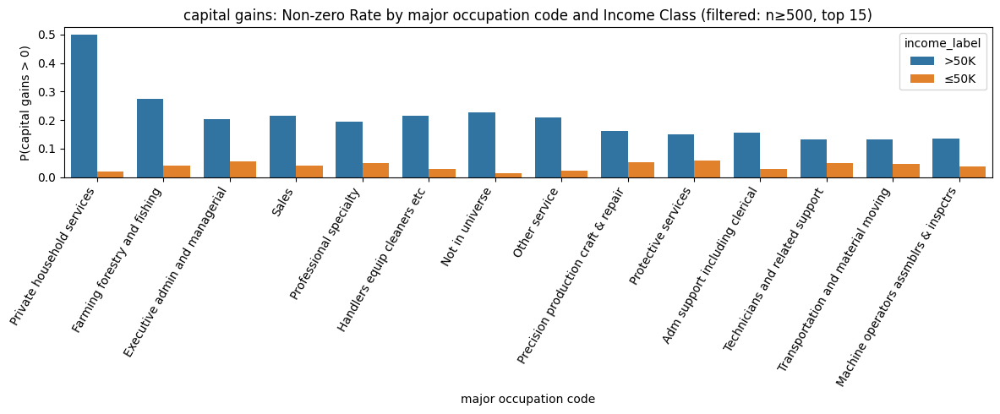

⚠️ Caution: some plotted categories still have relatively small total n:
  - Private household services: total n=780


In [ ]:
plot_zero_inflated_bars(df, cat="major occupation code", num="capital gains", min_count=500, top_k=15, use_median=True)


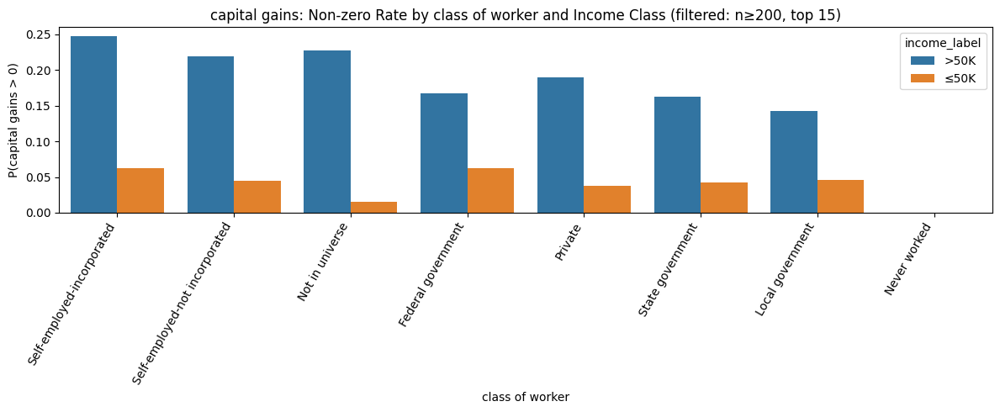

In [ ]:
plot_zero_inflated_bars(df, cat="class of worker", num="capital gains", min_count=200, top_k=15, use_median=True)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

/tmp/ipython-input-4210484827.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier1 = df.groupby("education").agg({


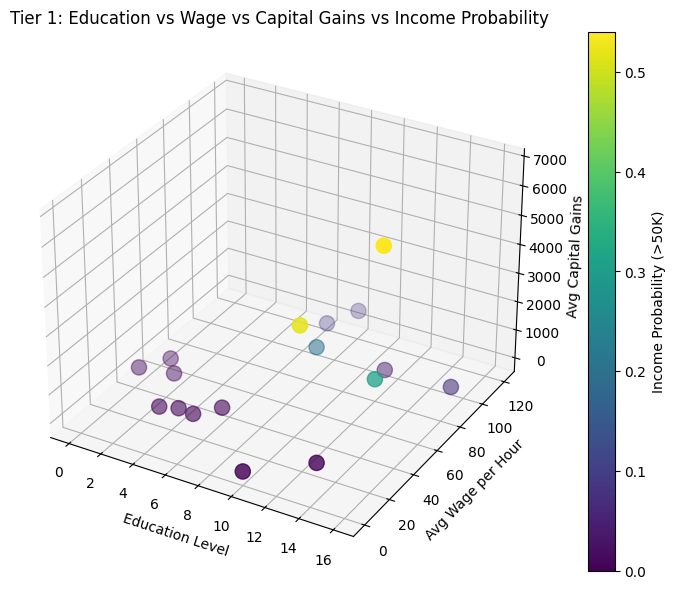

In [ ]:
# aggregate data
tier1 = df.groupby("education").agg({
    "wage per hour": "mean",
    "capital gains": "mean",
    "income_binary": "mean"
}).reset_index()

# encode education
tier1["education_code"] = range(len(tier1))

# plot
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    tier1["education_code"],
    tier1["wage per hour"],
    tier1["capital gains"],
    c=tier1["income_binary"],
    cmap="viridis",
    s=120
)

ax.set_xlabel("Education Level")
ax.set_ylabel("Avg Wage per Hour")
ax.set_zlabel("Avg Capital Gains")

fig.colorbar(sc, label="Income Probability (>50K)")

plt.title("Tier 1: Education vs Wage vs Capital Gains vs Income Probability")

plt.show()


In [ ]:
education_mapping = {
    level: i for i, level in enumerate(sorted(df["education"].unique()))
}

print("Education mapping:")
for k, v in education_mapping.items():
    print(f"{v} → {k}")

tier1["education_code"] = tier1["education"].map(education_mapping)

Education mapping:
0 → 10th grade
1 → 11th grade
2 → 12th grade no diploma
3 → 1st 2nd 3rd or 4th grade
4 → 5th or 6th grade
5 → 7th and 8th grade
6 → 9th grade
7 → Associates degree-academic program
8 → Associates degree-occup /vocational
9 → Bachelors degree(BA AB BS)
10 → Children
11 → Doctorate degree(PhD EdD)
12 → High school graduate
13 → Less than 1st grade
14 → Masters degree(MA MS MEng MEd MSW MBA)
15 → Prof school degree (MD DDS DVM LLB JD)
16 → Some college but no degree


/tmp/ipython-input-569776439.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier2 = df.groupby("major occupation code").agg({


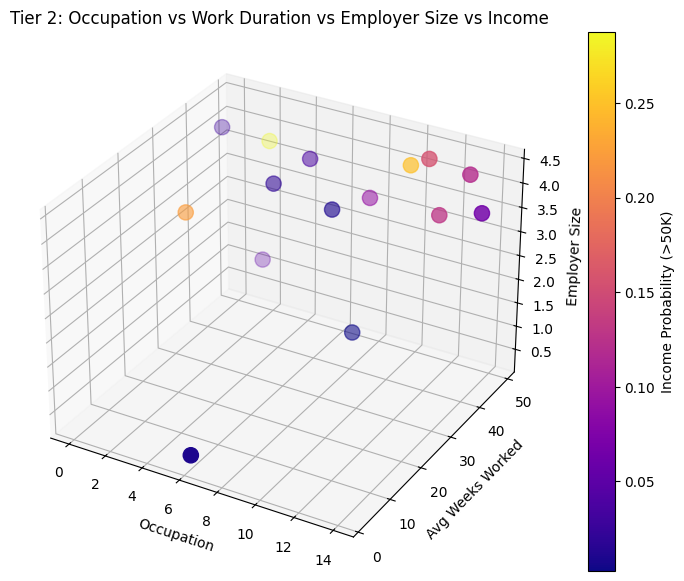

In [ ]:
tier2 = df.groupby("major occupation code").agg({
    "weeks worked in year": "mean",
    "num persons worked for employer": "mean",
    "income_binary": "mean"
}).reset_index()

tier2["occupation_code"] = range(len(tier2))

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    tier2["occupation_code"],
    tier2["weeks worked in year"],
    tier2["num persons worked for employer"],
    c=tier2["income_binary"],
    cmap="plasma",
    s=120
)

ax.set_xlabel("Occupation")
ax.set_ylabel("Avg Weeks Worked")
ax.set_zlabel("Employer Size")

fig.colorbar(sc, label="Income Probability (>50K)")

plt.title("Tier 2: Occupation vs Work Duration vs Employer Size vs Income")

plt.show()


In [ ]:
occupation_mapping = {
    level: i for i, level in enumerate(sorted(df["major occupation code"].unique()))
}

print("\nOccupation mapping:")
for k, v in occupation_mapping.items():
    print(f"{v} → {k}")

tier2["occupation_code"] = tier2["major occupation code"].map(occupation_mapping)



Occupation mapping:
0 → Adm support including clerical
1 → Armed Forces
2 → Executive admin and managerial
3 → Farming forestry and fishing
4 → Handlers equip cleaners etc
5 → Machine operators assmblrs & inspctrs
6 → Not in universe
7 → Other service
8 → Precision production craft & repair
9 → Private household services
10 → Professional specialty
11 → Protective services
12 → Sales
13 → Technicians and related support
14 → Transportation and material moving


/tmp/ipython-input-2870253733.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier3 = df.groupby("class of worker").agg({


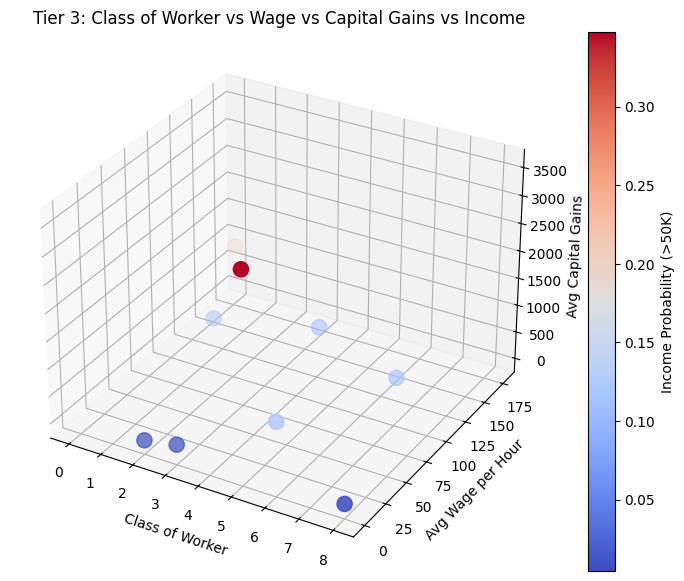

In [ ]:
tier3 = df.groupby("class of worker").agg({
    "capital gains": "mean",
    "wage per hour": "mean",
    "income_binary": "mean"
}).reset_index()

tier3["class_code"] = range(len(tier3))

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    tier3["class_code"],
    tier3["wage per hour"],
    tier3["capital gains"],
    c=tier3["income_binary"],
    cmap="coolwarm",
    s=120
)

ax.set_xlabel("Class of Worker")
ax.set_ylabel("Avg Wage per Hour")
ax.set_zlabel("Avg Capital Gains")

fig.colorbar(sc, label="Income Probability (>50K)")

plt.title("Tier 3: Class of Worker vs Wage vs Capital Gains vs Income")

plt.show()


In [ ]:
class_mapping = {
    level: i for i, level in enumerate(sorted(df["class of worker"].unique()))
}

print("\nClass of worker mapping:")
for k, v in class_mapping.items():
    print(f"{v} → {k}")

tier3["class_code"] = tier3["class of worker"].map(class_mapping)



Class of worker mapping:
0 → Federal government
1 → Local government
2 → Never worked
3 → Not in universe
4 → Private
5 → Self-employed-incorporated
6 → Self-employed-not incorporated
7 → State government
8 → Without pay


In [ ]:
import pandas as pd
import numpy as np

# create age bins
df["age_group"] = pd.cut(
    df["age"],
    bins=[0,18,25,35,45,55,65,100],
    labels=["<18","18-25","26-35","36-45","46-55","56-65","65+"]
)

# numeric encoding for 3D plot
age_mapping = {label:i for i,label in enumerate(df["age_group"].cat.categories)}
df["age_code"] = df["age_group"].map(age_mapping)

print("Age mapping:", age_mapping)


Age mapping: {'<18': 0, '18-25': 1, '26-35': 2, '36-45': 3, '46-55': 4, '56-65': 5, '65+': 6}


/tmp/ipython-input-1634780402.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier = df.groupby(["age_group","education"]).agg({


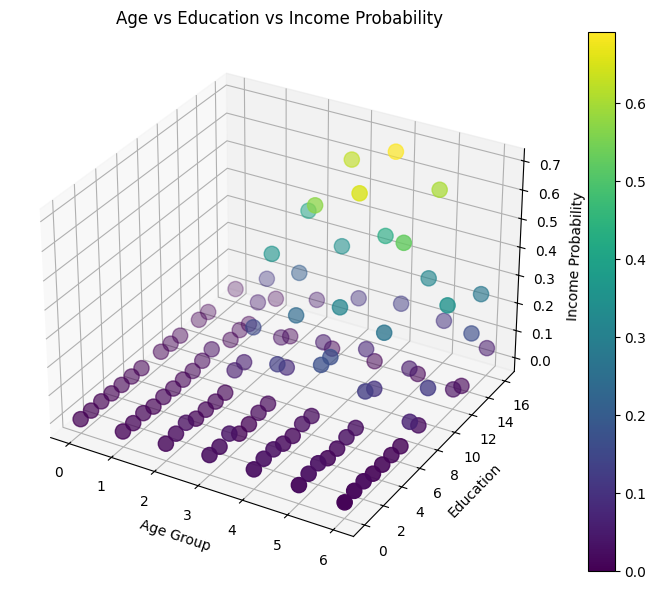

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

tier = df.groupby(["age_group","education"]).agg({
    "income_binary":"mean"
}).reset_index()

# encode
education_mapping = {k:i for i,k in enumerate(tier["education"].unique())}

tier["age_code"] = tier["age_group"].map(age_mapping)
tier["education_code"] = tier["education"].map(education_mapping)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    tier["age_code"],
    tier["education_code"],
    tier["income_binary"],
    c=tier["income_binary"],
    cmap="viridis",
    s=120
)

ax.set_xlabel("Age Group")
ax.set_ylabel("Education")
ax.set_zlabel("Income Probability")

fig.colorbar(sc)

plt.title("Age vs Education vs Income Probability")

plt.show()


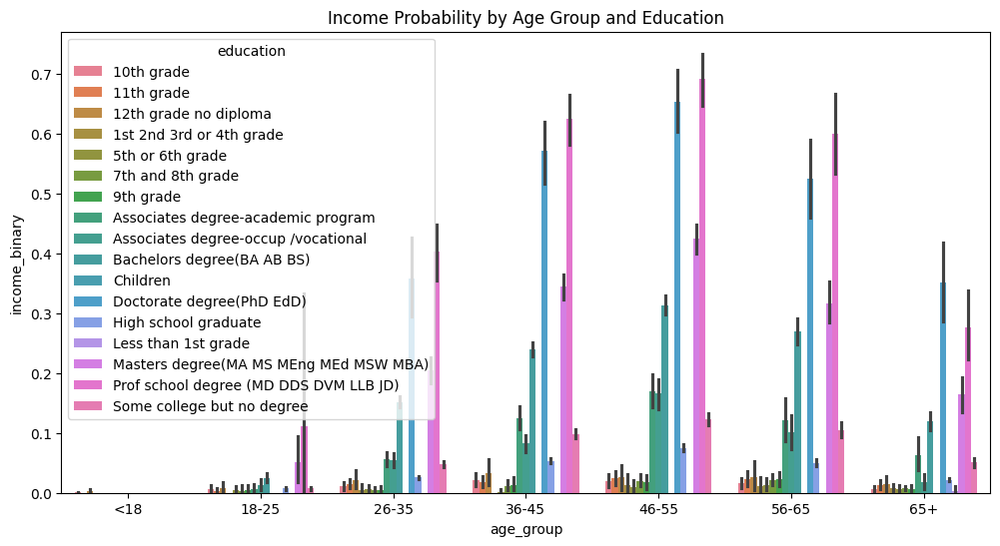

In [ ]:
plt.figure(figsize=(12,6))

sns.barplot(
    data=df,
    x="age_group",
    y="income_binary",
    hue="education",
    estimator=np.mean
)

plt.title("Income Probability by Age Group and Education")

plt.show()


/tmp/ipython-input-994874441.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier = df.groupby(["age_group","major occupation code"]).agg({


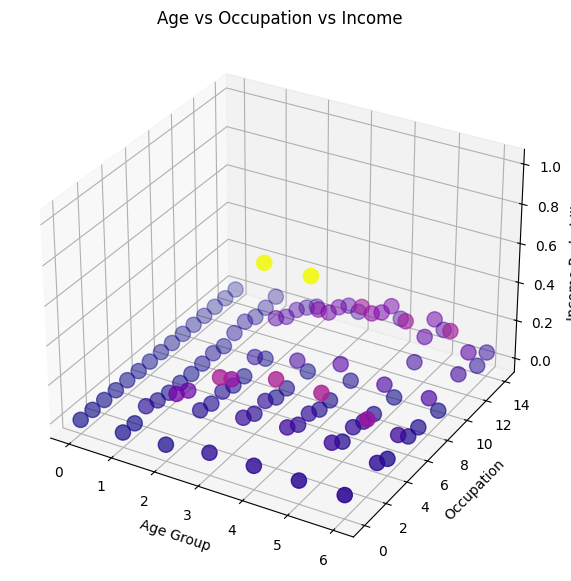

In [ ]:
tier = df.groupby(["age_group","major occupation code"]).agg({
    "income_binary":"mean"
}).reset_index()

occupation_mapping = {k:i for i,k in enumerate(tier["major occupation code"].unique())}

tier["occupation_code"] = tier["major occupation code"].map(occupation_mapping)
tier["age_code"] = tier["age_group"].map(age_mapping)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    tier["age_code"],
    tier["occupation_code"],
    tier["income_binary"],
    c=tier["income_binary"],
    cmap="plasma",
    s=120
)

ax.set_xlabel("Age Group")
ax.set_ylabel("Occupation")
ax.set_zlabel("Income Probability")

plt.title("Age vs Occupation vs Income")

plt.show()


/tmp/ipython-input-542276418.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier = df.groupby(["age_group","veterans benefits"]).agg({


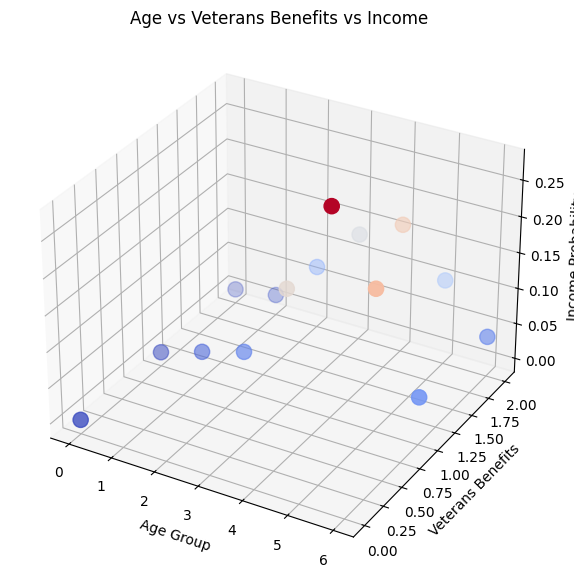

In [ ]:
tier = df.groupby(["age_group","veterans benefits"]).agg({
    "income_binary":"mean"
}).reset_index()

tier["age_code"] = tier["age_group"].map(age_mapping)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    tier["age_code"],
    tier["veterans benefits"],
    tier["income_binary"],
    c=tier["income_binary"],
    cmap="coolwarm",
    s=120
)

ax.set_xlabel("Age Group")
ax.set_ylabel("Veterans Benefits")
ax.set_zlabel("Income Probability")

plt.title("Age vs Veterans Benefits vs Income")

plt.show()


/tmp/ipython-input-1846566175.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier = df.groupby(["age_group","major occupation code"]).agg({


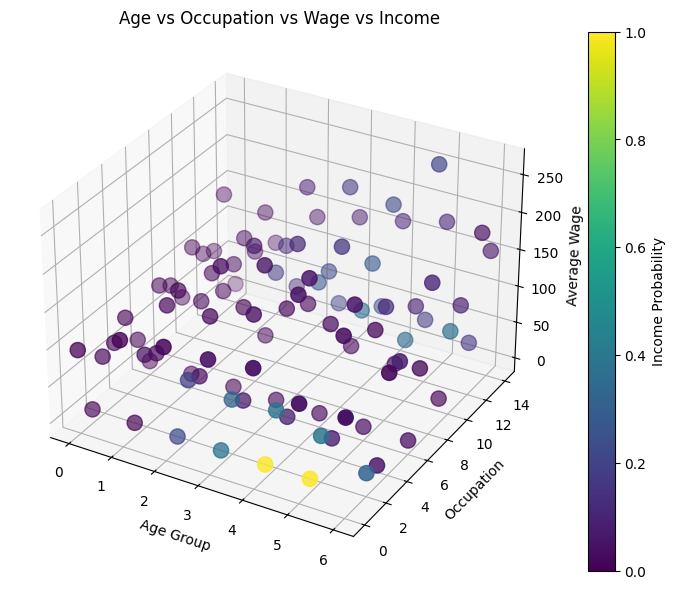

In [ ]:
tier = df.groupby(["age_group","major occupation code"]).agg({
    "wage per hour":"mean",
    "income_binary":"mean"
}).reset_index()

tier["occupation_code"] = tier["major occupation code"].map(occupation_mapping)
tier["age_code"] = tier["age_group"].map(age_mapping)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    tier["age_code"],
    tier["occupation_code"],
    tier["wage per hour"],
    c=tier["income_binary"],
    cmap="viridis",
    s=120
)

ax.set_xlabel("Age Group")
ax.set_ylabel("Occupation")
ax.set_zlabel("Average Wage")

fig.colorbar(sc, label="Income Probability")

plt.title("Age vs Occupation vs Wage vs Income")

plt.show()


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# create readable income label
df["income_label"] = df["income_binary"].map({0: "≤50K", 1: ">50K"})

# create age groups
df["age_group"] = pd.cut(
    df["age"],
    bins=[0,18,25,35,45,55,65,100],
    labels=["<18","18-25","26-35","36-45","46-55","56-65","65+"]
)

# encode age group
age_mapping = {k:i for i,k in enumerate(df["age_group"].cat.categories)}
df["age_code"] = df["age_group"].map(age_mapping)


In [ ]:
tier = df.groupby(["sex","age_group"]).agg({
    "income_binary":"mean"
}).reset_index()

sex_mapping = {"Female":0, "Male":1}

tier["sex_code"] = tier["sex"].map(sex_mapping)
tier["age_code"] = tier["age_group"].map(age_mapping)


/tmp/ipython-input-1960318350.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier = df.groupby(["sex","age_group"]).agg({


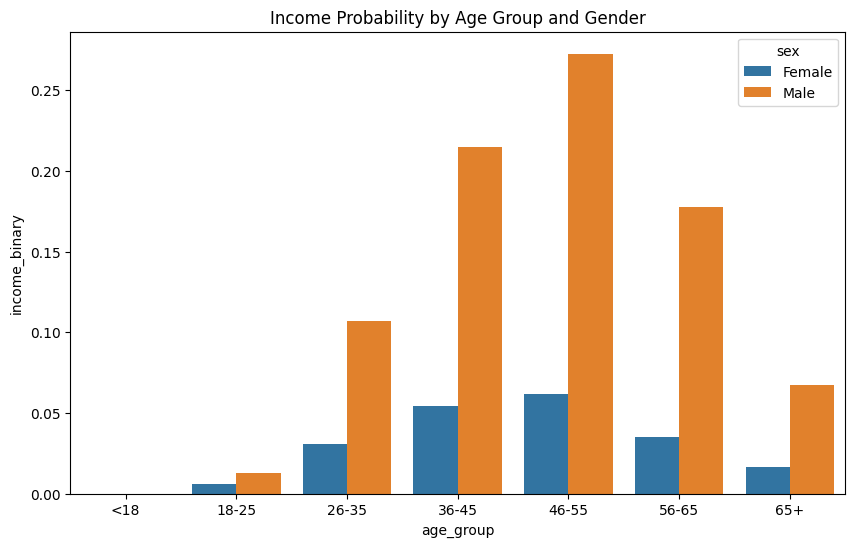

In [ ]:
plt.figure(figsize=(10,6))

sns.barplot(
    data=df,
    x="age_group",
    y="income_binary",
    hue="sex",
    estimator=np.mean,
    errorbar=None
)

plt.title("Income Probability by Age Group and Gender")

plt.show()

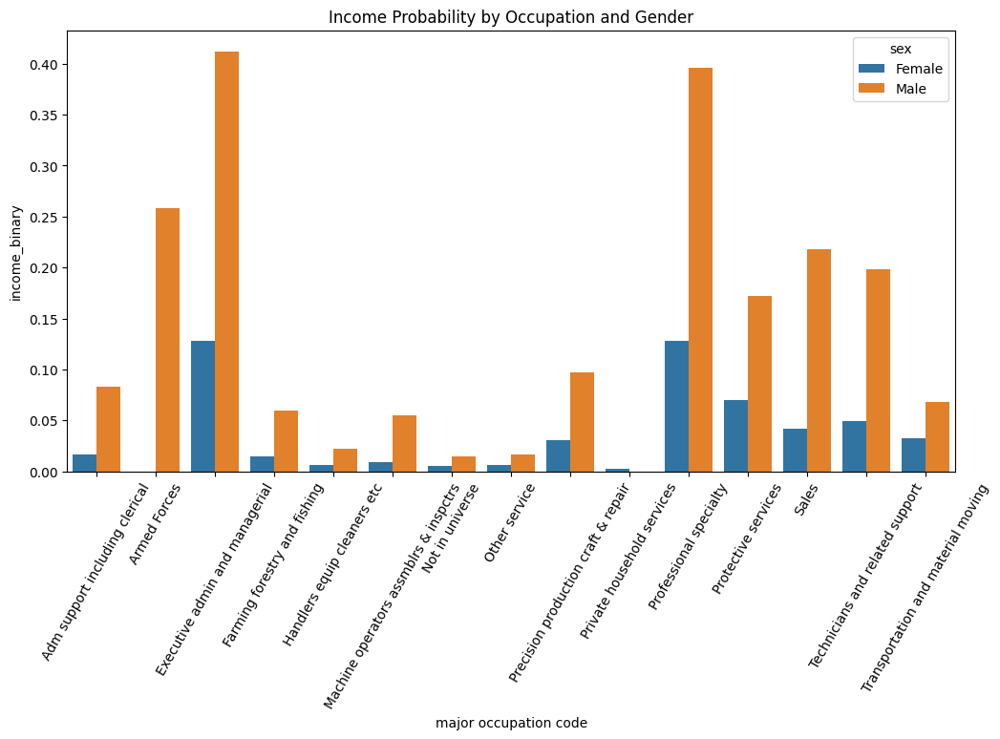

In [ ]:
plt.figure(figsize=(12,6))

sns.barplot(
    data=df,
    x="major occupation code",
    y="income_binary",
    hue="sex",
    estimator=np.mean,
    errorbar=None
)

plt.xticks(rotation=60)

plt.title("Income Probability by Occupation and Gender")

plt.show()


/tmp/ipython-input-2688278265.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tier = df.groupby(["sex","veterans benefits"]).agg({ "income_binary":"mean" }).reset_index()


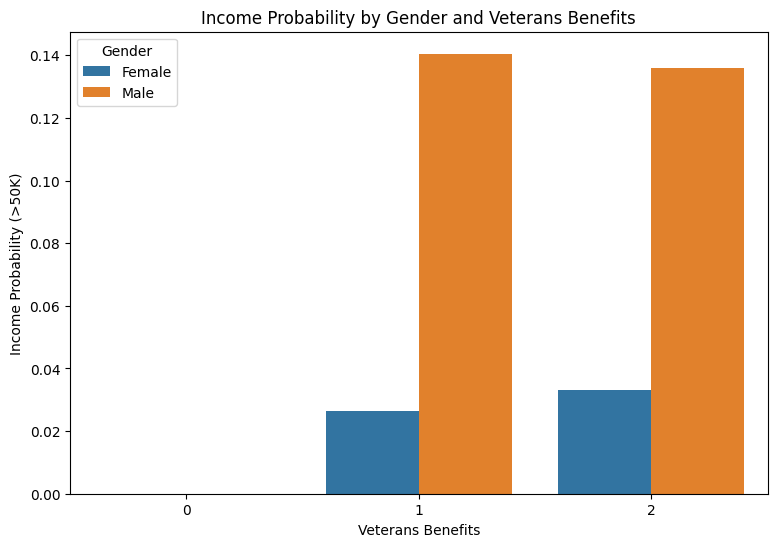

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

tier = df.groupby(["sex","veterans benefits"]).agg({ "income_binary":"mean" }).reset_index()
tier["sex_code"] = tier["sex"].map(sex_mapping)

plt.figure(figsize=(9,6))

sns.barplot(
    data=tier,
    x="veterans benefits",
    y="income_binary",
    hue="sex"
)

plt.xlabel("Veterans Benefits")
plt.ylabel("Income Probability (>50K)")
plt.title("Income Probability by Gender and Veterans Benefits")

plt.legend(title="Gender")

plt.show()


In [ ]:
import pandas as pd

# compute income probability and count
tier = (
    df.groupby(["sex", "education", "major occupation code"])
      .agg(
          income_probability=("income_binary", "mean"),
          count=("income_binary", "count")
      )
      .reset_index()
)


/tmp/ipython-input-3984207481.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["sex", "education", "major occupation code"])


In [ ]:
tier_filtered = tier[tier["count"] >= 100]   # adjust threshold if needed


In [ ]:

top5 = (
    tier_filtered
    .sort_values("income_probability", ascending=False)
    .head(5)
)

top5


,sex,education,major occupation code,income_probability,count
422,Male,Doctorate degree(PhD EdD),Executive admin and managerial,0.723214,112
490,Male,Prof school degree (MD DDS DVM LLB JD),Professional specialty,0.719866,896
482,Male,Prof school degree (MD DDS DVM LLB JD),Executive admin and managerial,0.697248,109
467,Male,Masters degree(MA MS MEng MEd MSW MBA),Executive admin and managerial,0.657950,956
430,Male,Doctorate degree(PhD EdD),Professional specialty,0.652174,575


/tmp/ipython-input-2308732803.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["sex", "education", "major occupation code"])


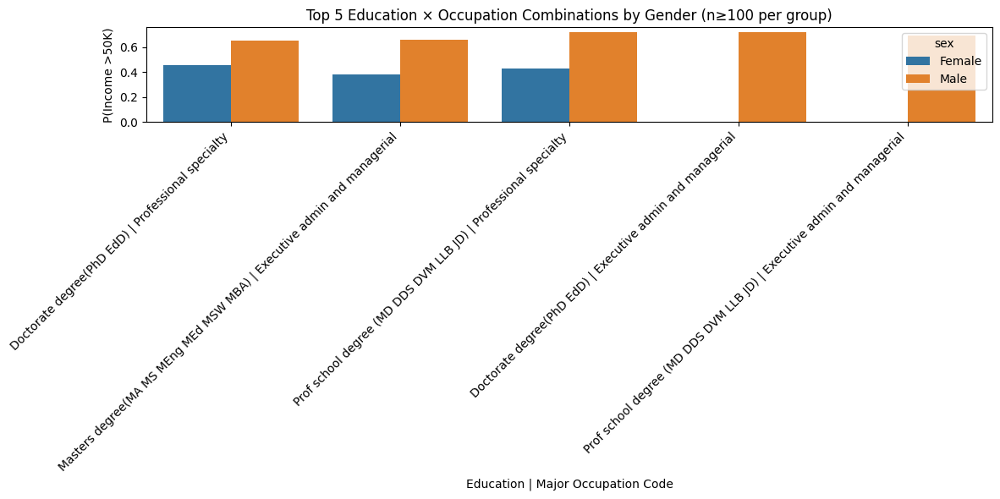

,sex,education,major occupation code,income_probability,count
422,Male,Doctorate degree(PhD EdD),Executive admin and managerial,0.723214,112
490,Male,Prof school degree (MD DDS DVM LLB JD),Professional specialty,0.719866,896
482,Male,Prof school degree (MD DDS DVM LLB JD),Executive admin and managerial,0.697248,109
467,Male,Masters degree(MA MS MEng MEd MSW MBA),Executive admin and managerial,0.657950,956
430,Male,Doctorate degree(PhD EdD),Professional specialty,0.652174,575
175,Female,Doctorate degree(PhD EdD),Professional specialty,0.454167,240
235,Female,Prof school degree (MD DDS DVM LLB JD),Professional specialty,0.428571,329
212,Female,Masters degree(MA MS MEng MEd MSW MBA),Executive admin and managerial,0.382716,486


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Aggregate income probability and count
tier = (
    df.groupby(["sex", "education", "major occupation code"])
      .agg(
          income_probability=("income_binary", "mean"),
          count=("income_binary", "count")
      )
      .reset_index()
)

# 2) Filter small groups (important for reliable conclusions)
min_count = 100
tier_filtered = tier[tier["count"] >= min_count].copy()

# 3) Create combined label safely (convert categoricals to string)
tier_filtered["edu_occ"] = (
    tier_filtered["education"].astype(str) + " | " +
    tier_filtered["major occupation code"].astype(str)
)

# 4) Find top 5 edu_occ combos by avg income probability (across genders)
top_combinations = (
    tier_filtered.groupby("edu_occ")["income_probability"]
    .mean()
    .sort_values(ascending=False)
    .head(5)
    .index
)

plot_data = tier_filtered[tier_filtered["edu_occ"].isin(top_combinations)].copy()

# 5) Bar plot split by gender
plt.figure(figsize=(12,6))
sns.barplot(
    data=plot_data,
    x="edu_occ",
    y="income_probability",
    hue="sex",
    errorbar=None
)

plt.xticks(rotation=45, ha="right")
plt.ylabel("P(Income >50K)")
plt.xlabel("Education | Major Occupation Code")
plt.title(f"Top 5 Education × Occupation Combinations by Gender (n≥{min_count} per group)")
plt.tight_layout()
plt.show()

# 6) Table output for evaluator
plot_data.sort_values(["income_probability", "count"], ascending=[False, False])[
    ["sex", "education", "major occupation code", "income_probability", "count"]
]


# Industry trends

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def weighted_income_prob(group):
    return np.average(group["income_binary"], weights=group["weight"])


/tmp/ipython-input-3078734403.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["year", "own business or self employed"])
/tmp/ipython-input-3078734403.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(weighted_income_prob)


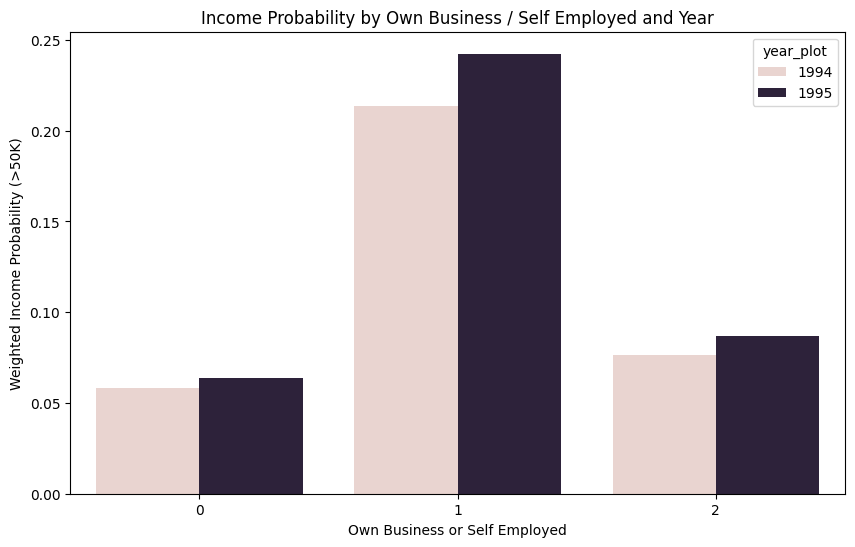

In [ ]:
data = (
    df.groupby(["year", "own business or self employed"])
      .apply(weighted_income_prob)
      .reset_index(name="income_prob")
)

data["year_plot"] = data["year"].map({94:1994, 95:1995})

plt.figure(figsize=(10,6))
sns.barplot(
    data=data,
    x="own business or self employed",
    y="income_prob",
    hue="year_plot"
)

plt.title("Income Probability by Own Business / Self Employed and Year")
plt.ylabel("Weighted Income Probability (>50K)")
plt.xlabel("Own Business or Self Employed")
plt.show()


/tmp/ipython-input-1161514203.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["year", "major industry code"])
/tmp/ipython-input-1161514203.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(weighted_income_prob)
/tmp/ipython-input-1161514203.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  d

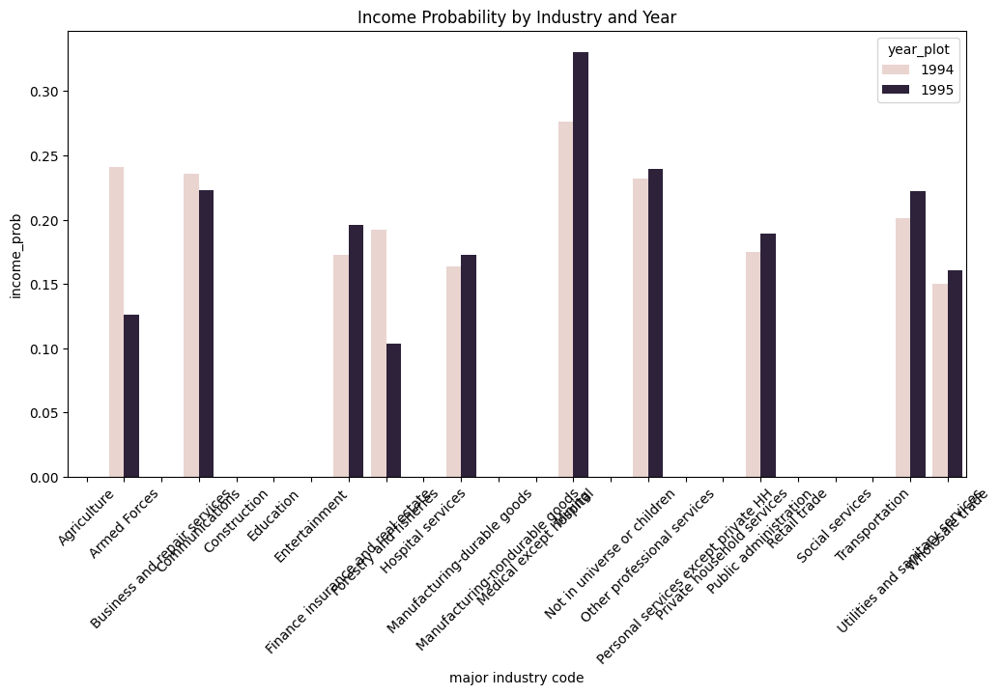

In [ ]:
data = (
    df.groupby(["year", "major industry code"])
      .apply(weighted_income_prob)
      .reset_index(name="income_prob")
)

data["year_plot"] = data["year"].map({94:1994, 95:1995})

# optional: limit to top industries
top_ind = (
    data.groupby("major industry code")["income_prob"]
    .mean().sort_values(ascending=False).head(10).index
)

plot_data = data[data["major industry code"].isin(top_ind)]

plt.figure(figsize=(12,6))
sns.barplot(
    data=plot_data,
    x="major industry code",
    y="income_prob",
    hue="year_plot"
)

plt.xticks(rotation=45)
plt.title("Income Probability by Industry and Year")
plt.show()


/tmp/ipython-input-3471086766.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["year", "full or part time employment stat"])
/tmp/ipython-input-3471086766.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(weighted_income_prob)


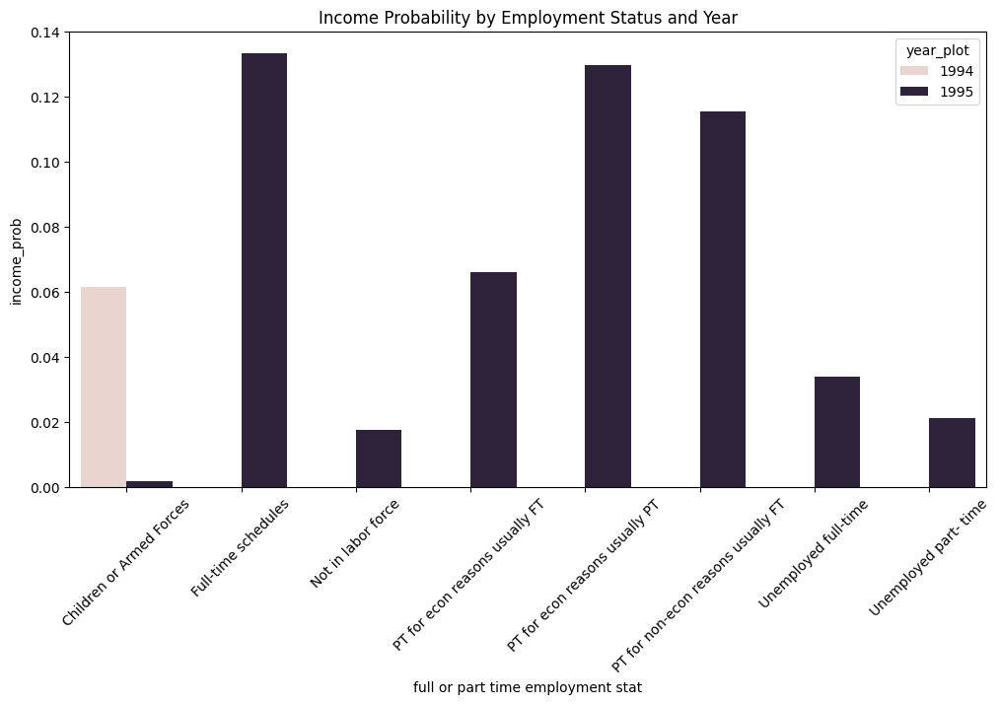

In [ ]:
data = (
    df.groupby(["year", "full or part time employment stat"])
      .apply(weighted_income_prob)
      .reset_index(name="income_prob")
)

data["year_plot"] = data["year"].map({94:1994, 95:1995})

plt.figure(figsize=(12,6))
sns.barplot(
    data=data,
    x="full or part time employment stat",
    y="income_prob",
    hue="year_plot"
)

plt.xticks(rotation=45)
plt.title("Income Probability by Employment Status and Year")
plt.show()


/tmp/ipython-input-1311876724.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["investment_income_log"], weights=g["weight"]))


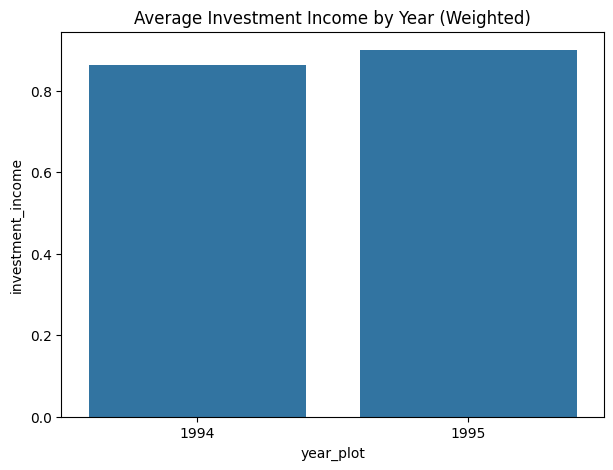

In [ ]:
df["investment_income"] = df["capital gains"] + df["dividends from stocks"]
df["investment_income_log"] = np.log1p(df["investment_income"])

data = (
    df.groupby("year")
      .apply(lambda g: np.average(g["investment_income_log"], weights=g["weight"]))
      .reset_index(name="investment_income")
)

data["year_plot"] = data["year"].map({94:1994, 95:1995})

plt.figure(figsize=(7,5))
sns.barplot(data=data, x="year_plot", y="investment_income")

plt.title("Average Investment Income by Year (Weighted)")
plt.show()


/tmp/ipython-input-247636462.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["major occupation code", "own business or self employed"])
/tmp/ipython-input-247636462.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(weighted_income_prob)
/tmp/ipython-input-247636462.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and si

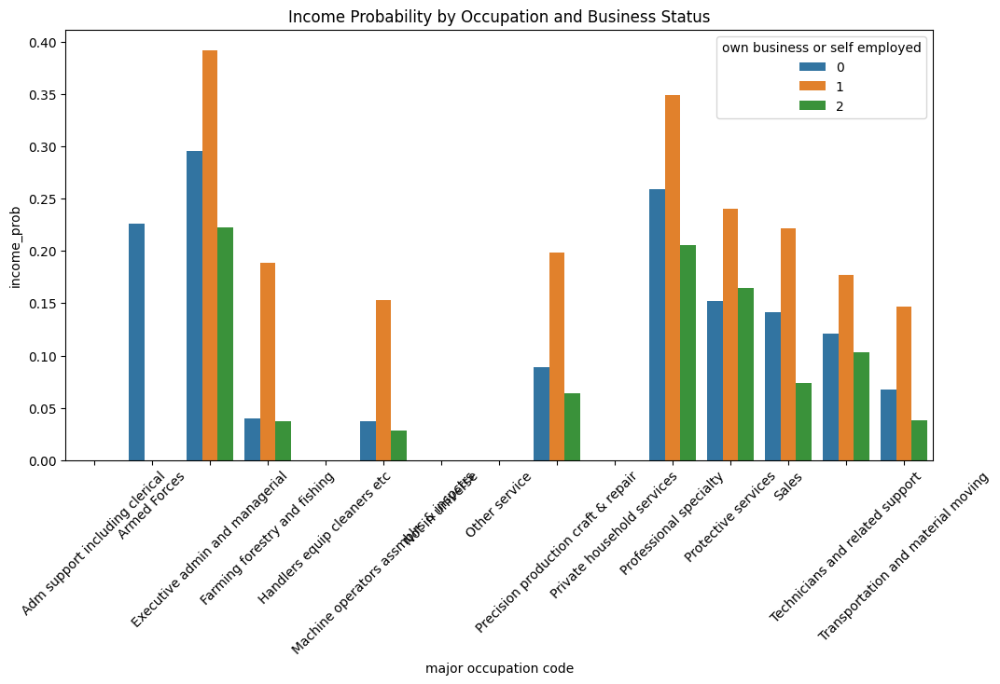

In [ ]:
data = (
    df.groupby(["major occupation code", "own business or self employed"])
      .apply(weighted_income_prob)
      .reset_index(name="income_prob")
)

# limit to top occupations
top_occ = (
    data.groupby("major occupation code")["income_prob"]
    .mean().sort_values(ascending=False).head(10).index
)

plot_data = data[data["major occupation code"].isin(top_occ)]

plt.figure(figsize=(12,6))
sns.barplot(
    data=plot_data,
    x="major occupation code",
    y="income_prob",
    hue="own business or self employed"
)

plt.xticks(rotation=45)
plt.title("Income Probability by Occupation and Business Status")
plt.show()


/tmp/ipython-input-557773633.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["major industry code", "own business or self employed"])
/tmp/ipython-input-557773633.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(weighted_income_prob)
/tmp/ipython-input-557773633.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and sile

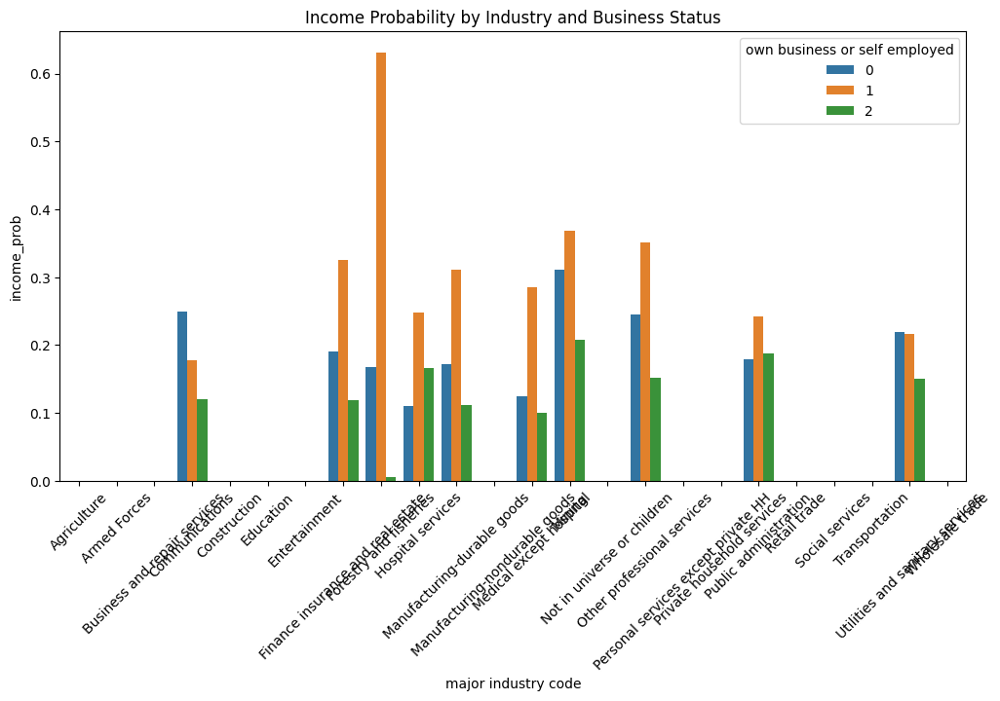

In [ ]:
data = (
    df.groupby(["major industry code", "own business or self employed"])
      .apply(weighted_income_prob)
      .reset_index(name="income_prob")
)

top_ind = (
    data.groupby("major industry code")["income_prob"]
    .mean().sort_values(ascending=False).head(10).index
)

plot_data = data[data["major industry code"].isin(top_ind)]

plt.figure(figsize=(12,6))
sns.barplot(
    data=plot_data,
    x="major industry code",
    y="income_prob",
    hue="own business or self employed"
)

plt.xticks(rotation=45)
plt.title("Income Probability by Industry and Business Status")
plt.show()


# Feature Engineering

In [ ]:
NUMERIC_FEATURES = [
    "age",
    "wage per hour",
    "capital gains",
    "capital losses",
    "dividends from stocks",
    "num persons worked for employer",
    "weeks worked in year",
    "year"
]

CATEGORICAL_FEATURES = [
    "class of worker",
    "detailed industry recode",
    "detailed occupation recode",
    "education",
    "enroll in edu inst last wk",
    "marital stat",
    "major industry code",
    "major occupation code",
    "race",
    "hispanic origin",
    "sex",
    "member of a labor union",
    "reason for unemployment",
    "full or part time employment stat",
    "tax filer stat",
    "region of previous residence",
    "state of previous residence",
    "detailed household and family stat",
    "detailed household summary in household",
    "migration code-change in msa",
    "migration code-change in reg",
    "migration code-move within reg",
    "live in this house 1 year ago",
    "migration prev res in sunbelt",
    "family members under 18",
    "country of birth father",
    "country of birth mother",
    "country of birth self",
    "citizenship",
    "own business or self employed",
    "fill inc questionnaire for veteran's admin",
    "veterans benefits"
]

In [ ]:
# === FE STEP 0: Modeling definitions (match notebook vars) ===
MODEL_TARGET_COL = "income_binary"   # you created this in cell 28
RAW_LABEL_COL = TARGET_COL           # "label" from your cell 8
WEIGHT = WEIGHT_COL                  # "weight" from your cell 8

# Use ALL columns except target + label + weight as predictors
feature_cols_model = [c for c in df.columns if c not in [MODEL_TARGET_COL, RAW_LABEL_COL, WEIGHT]]

print("Target:", MODEL_TARGET_COL)
print("Label:", RAW_LABEL_COL)
print("Weight:", WEIGHT)
print("Total predictors:", len(feature_cols_model))


Target: income_binary
Label: label
Weight: weight
Total predictors: 56


In [ ]:
feature_cols_model

['age',
 'class of worker',
 'detailed industry recode',
 'detailed occupation recode',
 'education',
 'wage per hour',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'major occupation code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'capital gains',
 'capital losses',
 'dividends from stocks',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household and family stat',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'num persons worked for employer',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veteran

In [ ]:
# === FE STEP 1: Zero-inflated numeric feature engineering ===
ZERO_INFLATED_NUMERIC = [
    "wage per hour",
    "capital gains",
    "capital losses",
    "dividends from stocks"
]

engineered_numeric = []

for col in ZERO_INFLATED_NUMERIC:
    nonzero_col = f"{col}_nonzero"
    log_col = f"{col}_log1p"

    if nonzero_col not in df.columns:
        df[nonzero_col] = (df[col] > 0).astype(int)

    if log_col not in df.columns:
        df[log_col] = np.log1p(df[col])

    engineered_numeric.extend([nonzero_col, log_col])

print("Added engineered numeric features:")
print(engineered_numeric)


Added engineered numeric features:
['wage per hour_nonzero', 'wage per hour_log1p', 'capital gains_nonzero', 'capital gains_log1p', 'capital losses_nonzero', 'capital losses_log1p', 'dividends from stocks_nonzero', 'dividends from stocks_log1p']


In [ ]:
len(df.columns)

60

In [ ]:
# === FE STEP 2: Work intensity feature ===
if "work_intensity" not in df.columns:
    df["work_intensity"] = df["weeks worked in year"] / 52.0

if "work_intensity" not in engineered_numeric:
    engineered_numeric.append("work_intensity")

print("work_intensity added. Range:", df["work_intensity"].min(), "to", df["work_intensity"].max())


work_intensity added. Range: 0.0 to 1.0


In [ ]:
# === FE STEP 3: Combined investment income (optional but useful) ===
if "investment_income" not in df.columns:
    df["investment_income"] = df["capital gains"] + df["dividends from stocks"]

if "investment_income_log1p" not in df.columns:
    df["investment_income_log1p"] = np.log1p(df["investment_income"])

for c in ["investment_income", "investment_income_log1p"]:
    if c not in engineered_numeric:
        engineered_numeric.append(c)

print("Added: investment_income and investment_income_log1p")


Added: investment_income and investment_income_log1p


In [ ]:
# === FE STEP 5: Final feature sets for modeling ===

# Base numeric = your NUMERIC_FEATURES except "year" (we keep it) and exclude weight/label/target anyway
BASE_NUMERIC = [c for c in NUMERIC_FEATURES if c in df.columns and c not in [RAW_LABEL_COL, MODEL_TARGET_COL, WEIGHT]]

# Add engineered numeric
FINAL_NUMERIC_FEATURES = BASE_NUMERIC + engineered_numeric

# Base categorical = your CATEGORICAL_FEATURES (already category dtype in your notebook)
FINAL_CATEGORICAL_FEATURES = [c for c in CATEGORICAL_FEATURES if c in df.columns]

# Predictors = everything except label/target/weight (but in practice we’ll use numeric+categorical for pipeline)
FINAL_FEATURES = [c for c in (FINAL_NUMERIC_FEATURES + FINAL_CATEGORICAL_FEATURES) if c not in [RAW_LABEL_COL, MODEL_TARGET_COL, WEIGHT]]

print("Final numeric features:", len(FINAL_NUMERIC_FEATURES))
print("Final categorical features:", len(FINAL_CATEGORICAL_FEATURES))
print("Total model features:", len(FINAL_FEATURES))


Final numeric features: 19
Final categorical features: 32
Total model features: 51


In [ ]:
FINAL_NUMERIC_FEATURES

['age',
 'wage per hour',
 'capital gains',
 'capital losses',
 'dividends from stocks',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'wage per hour_nonzero',
 'wage per hour_log1p',
 'capital gains_nonzero',
 'capital gains_log1p',
 'capital losses_nonzero',
 'capital losses_log1p',
 'dividends from stocks_nonzero',
 'dividends from stocks_log1p',
 'work_intensity',
 'investment_income',
 'investment_income_log1p']

In [ ]:
FINAL_CATEGORICAL_FEATURES

['class of worker',
 'detailed industry recode',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'major occupation code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household and family stat',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

# Random Forest - Feature Redundancy and Importance Analysis

In [ ]:
# ===============================
# PHASE 1.1: Define X, y, weights
# ===============================

MODEL_TARGET = "income_binary"

X = df[FINAL_NUMERIC_FEATURES + FINAL_CATEGORICAL_FEATURES].copy()
y = df[MODEL_TARGET].astype(int)
sample_weight = df[WEIGHT_COL].astype(float)

print("Total features:", X.shape[1])
print("Samples:", X.shape[0])


Total features: 51
Samples: 196294


In [ ]:
# ===============================
# PHASE 1.2: Weighted split
# ===============================

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X,
    y,
    sample_weight,
    test_size=0.2,
    stratify=y,
    random_state=42
)

print("Train:", X_train.shape)
print("Test:", X_test.shape)

print("Weighted positive rate (train):",
      (y_train * w_train).sum() / w_train.sum())


Train: (157035, 51)
Test: (39259, 51)
Weighted positive rate (train): 0.06476433914653738


In [ ]:
# ===============================
# PHASE 1.3: Preprocessing pipeline
# ===============================

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", FINAL_NUMERIC_FEATURES),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False),
         FINAL_CATEGORICAL_FEATURES)
    ]
)


In [ ]:
# ===============================
# PHASE 1.4: Train RF baseline
# ===============================

from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

rf_model = RandomForestClassifier(
    n_estimators=500,
    max_depth=None,
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)

rf_pipeline = Pipeline([
    ("preprocess", preprocessor),
    ("model", rf_model)
])

rf_pipeline.fit(
    X_train,
    y_train,
    model__sample_weight=w_train
)

print("Baseline Random Forest trained.")


Baseline Random Forest trained.


In [ ]:
# ===============================
# PHASE 1.5: Weighted evaluation
# ===============================

from sklearn.metrics import roc_auc_score, log_loss

y_prob = rf_pipeline.predict_proba(X_test)[:, 1]

baseline_auc = roc_auc_score(y_test, y_prob, sample_weight=w_test)
baseline_logloss = log_loss(y_test, y_prob, sample_weight=w_test)

print("BASELINE PERFORMANCE")
print("Weighted ROC-AUC:", baseline_auc)
print("Weighted LogLoss:", baseline_logloss)


BASELINE PERFORMANCE
Weighted ROC-AUC: 0.9491690805236926
Weighted LogLoss: 0.12455391199343392


In [ ]:
# ===============================
# PHASE 2.1: Extract importance safely
# ===============================

ohe = rf_pipeline.named_steps["preprocess"].named_transformers_["cat"]
cat_names = ohe.get_feature_names_out(FINAL_CATEGORICAL_FEATURES)

all_feature_names = FINAL_NUMERIC_FEATURES + list(cat_names)

importances = rf_pipeline.named_steps["model"].feature_importances_

importance_df = (
    pd.DataFrame({
        "feature": all_feature_names,
        "importance": importances
    })
)

# map back to base feature
def base_feature(name):
    for col in FINAL_CATEGORICAL_FEATURES:
        if name.startswith(col + "_"):
            return col
    return name

importance_df["base_feature"] = importance_df["feature"].apply(base_feature)

importance_grouped = (
    importance_df.groupby("base_feature", as_index=False)
    .importance.sum()
    .sort_values("importance", ascending=False)
)

display(importance_grouped.head(30))


,base_feature,importance
15,detailed occupation recode,0.078834
19,education,0.074955
29,major occupation code,0.071965
25,investment_income,0.062189
26,investment_income_log1p,0.061408
41,sex,0.046951
2,capital gains_log1p,0.045199
1,capital gains,0.043563
16,dividends from stocks,0.042430
17,dividends from stocks_log1p,0.038348


In [ ]:
REDUNDANCY_GROUPS = {
    "wage_rep": ["wage per hour", "wage per hour_log1p", "wage per hour_nonzero"],
    "cap_gains_rep": ["capital gains", "capital gains_log1p", "capital gains_nonzero"],
    "dividends_rep": ["dividends from stocks", "dividends from stocks_log1p", "dividends from stocks_nonzero"],
    "cap_losses_rep": ["capital losses", "capital losses_log1p", "capital losses_nonzero"],
    "investment_rep": ["investment_income", "investment_income_log1p"],
    "weeks_rep": ["weeks worked in year", "work_intensity"]
}


In [ ]:
def test_features_within_group(group_name, group_features):

    results = []

    print(f"\nTesting group: {group_name}")
    print("="*60)

    for feature in group_features:

        numeric_subset = [
            f for f in FINAL_NUMERIC_FEATURES
            if f not in group_features or f == feature
        ]

        categorical_subset = FINAL_CATEGORICAL_FEATURES.copy()

        X_train_sub = X_train[numeric_subset + categorical_subset]
        X_test_sub = X_test[numeric_subset + categorical_subset]

        preprocessor_sub = ColumnTransformer(
            transformers=[
                ("num", "passthrough", numeric_subset),
                ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False),
                 categorical_subset)
            ]
        )

        rf_sub = Pipeline([
            ("preprocess", preprocessor_sub),
            ("model", RandomForestClassifier(
                n_estimators=400,
                min_samples_leaf=5,
                n_jobs=-1,
                random_state=42
            ))
        ])

        rf_sub.fit(X_train_sub, y_train, model__sample_weight=w_train)

        # weighted ROC-AUC
        y_prob = rf_sub.predict_proba(X_test_sub)[:,1]
        auc = roc_auc_score(y_test, y_prob, sample_weight=w_test)
        delta = auc - baseline_auc

        # extract importance of the tested feature
        rf_model_sub = rf_sub.named_steps["model"]

        # importance corresponds to numeric_subset first
        feature_index = numeric_subset.index(feature)
        importance = rf_model_sub.feature_importances_[feature_index]

        print(f"{feature:35} AUC={auc:.6f}   delta={delta:.6f}   importance={importance:.6f}")

        results.append({
            "feature": feature,
            "auc": auc,
            "delta": delta,
            "importance": importance
        })

    results_df = pd.DataFrame(results).sort_values("auc", ascending=False)

    display(results_df)

    return results_df


In [ ]:
rep_results = {}
for gname, feats in REDUNDANCY_GROUPS.items():
    rep_results[gname] = test_features_within_group(gname, feats)

rep_results


Testing group: wage_rep
wage per hour                       AUC=0.949234   delta=0.000065   importance=0.005723
wage per hour_log1p                 AUC=0.949114   delta=-0.000055   importance=0.005491
wage per hour_nonzero               AUC=0.949059   delta=-0.000110   importance=0.001938


,feature,auc,delta,importance
0,wage per hour,0.949234,0.000065,0.005723
1,wage per hour_log1p,0.949114,-0.000055,0.005491
2,wage per hour_nonzero,0.949059,-0.000110,0.001938



Testing group: cap_gains_rep
capital gains                       AUC=0.949164   delta=-0.000005   importance=0.052818
capital gains_log1p                 AUC=0.949211   delta=0.000042   importance=0.053909
capital gains_nonzero               AUC=0.948861   delta=-0.000308   importance=0.015825


,feature,auc,delta,importance
1,capital gains_log1p,0.949211,0.000042,0.053909
0,capital gains,0.949164,-0.000005,0.052818
2,capital gains_nonzero,0.948861,-0.000308,0.015825



Testing group: dividends_rep
dividends from stocks               AUC=0.949656   delta=0.000487   importance=0.052738
dividends from stocks_log1p         AUC=0.949777   delta=0.000608   importance=0.056414
dividends from stocks_nonzero       AUC=0.949339   delta=0.000170   importance=0.041558


,feature,auc,delta,importance
1,dividends from stocks_log1p,0.949777,0.000608,0.056414
0,dividends from stocks,0.949656,0.000487,0.052738
2,dividends from stocks_nonzero,0.949339,0.000170,0.041558



Testing group: cap_losses_rep
capital losses                      AUC=0.948798   delta=-0.000371   importance=0.019811
capital losses_log1p                AUC=0.948736   delta=-0.000433   importance=0.021151
capital losses_nonzero              AUC=0.948008   delta=-0.001161   importance=0.009767


,feature,auc,delta,importance
0,capital losses,0.948798,-0.000371,0.019811
1,capital losses_log1p,0.948736,-0.000433,0.021151
2,capital losses_nonzero,0.948008,-0.001161,0.009767



Testing group: investment_rep
investment_income                   AUC=0.949415   delta=0.000246   importance=0.077106
investment_income_log1p             AUC=0.949414   delta=0.000245   importance=0.077106


,feature,auc,delta,importance
0,investment_income,0.949415,0.000246,0.077106
1,investment_income_log1p,0.949414,0.000245,0.077106



Testing group: weeks_rep
weeks worked in year                AUC=0.949165   delta=-0.000004   importance=0.031634
work_intensity                      AUC=0.949101   delta=-0.000069   importance=0.029006


,feature,auc,delta,importance
0,weeks worked in year,0.949165,-0.000004,0.031634
1,work_intensity,0.949101,-0.000069,0.029006


{'wage_rep':                  feature       auc     delta  importance
 0          wage per hour  0.949234  0.000065    0.005723
 1    wage per hour_log1p  0.949114 -0.000055    0.005491
 2  wage per hour_nonzero  0.949059 -0.000110    0.001938,
 'cap_gains_rep':                  feature       auc     delta  importance
 1    capital gains_log1p  0.949211  0.000042    0.053909
 0          capital gains  0.949164 -0.000005    0.052818
 2  capital gains_nonzero  0.948861 -0.000308    0.015825,
 'dividends_rep':                          feature       auc     delta  importance
 1    dividends from stocks_log1p  0.949777  0.000608    0.056414
 0          dividends from stocks  0.949656  0.000487    0.052738
 2  dividends from stocks_nonzero  0.949339  0.000170    0.041558,
 'cap_losses_rep':                   feature       auc     delta  importance
 0          capital losses  0.948798 -0.000371    0.019811
 1    capital losses_log1p  0.948736 -0.000433    0.021151
 2  capital losses_nonzero  

In [ ]:
# ===============================
# Build pruned numeric list based on within-group results
# ===============================

DROP_NUMERIC = [
    "wage per hour_log1p", "wage per hour_nonzero",
    "capital gains", "capital gains_nonzero",
    "dividends from stocks", "dividends from stocks_nonzero",
    "capital losses_log1p", "capital losses_nonzero",   # (keeping raw)
    "investment_income_log1p",
    "work_intensity",
    # only if exists (ignore if not)
]

# keep only columns that actually exist
DROP_NUMERIC = [c for c in DROP_NUMERIC if c in df.columns]

FINAL_NUMERIC_PRUNED = [c for c in FINAL_NUMERIC_FEATURES if c not in DROP_NUMERIC]

print("Original numeric count:", len(FINAL_NUMERIC_FEATURES))
print("Pruned numeric count:", len(FINAL_NUMERIC_PRUNED))
print("Pruned numeric features:\n", FINAL_NUMERIC_PRUNED)


Original numeric count: 19
Pruned numeric count: 9
Pruned numeric features:
 ['age', 'wage per hour', 'capital losses', 'num persons worked for employer', 'weeks worked in year', 'year', 'capital gains_log1p', 'dividends from stocks_log1p', 'investment_income']


In [ ]:
# ===============================
# Retrain RF with pruned numeric set
# ===============================

X_pruned = df[FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_FEATURES].copy()
y = df["income_binary"].astype(int)
w = df[WEIGHT_COL].astype(float)

from sklearn.model_selection import train_test_split
Xtr, Xte, ytr, yte, wtr, wte = train_test_split(
    X_pruned, y, w, test_size=0.2, random_state=42, stratify=y
)

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, log_loss

pre = ColumnTransformer(
    transformers=[
        ("num", "passthrough", FINAL_NUMERIC_PRUNED),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), FINAL_CATEGORICAL_FEATURES)
    ]
)

rf = RandomForestClassifier(
    n_estimators=500, min_samples_leaf=5, n_jobs=-1, random_state=42
)

pipe = Pipeline([("preprocess", pre), ("model", rf)])
pipe.fit(Xtr, ytr, model__sample_weight=wtr)

prob = pipe.predict_proba(Xte)[:,1]
auc = roc_auc_score(yte, prob, sample_weight=wte)
ll = log_loss(yte, prob, sample_weight=wte)

print("PRUNED MODEL PERFORMANCE")
print("Weighted ROC-AUC:", auc, "  delta vs baseline:", auc - baseline_auc)
print("Weighted LogLoss:", ll)


PRUNED MODEL PERFORMANCE
Weighted ROC-AUC: 0.9494854341471666   delta vs baseline: 0.0003163536234739306
Weighted LogLoss: 0.1259613070446311


In [ ]:
# ===============================
# Build pruned numeric list based on within-group results
# ===============================

DROP_NUMERIC = [
    "wage per hour_log1p", "wage per hour_nonzero",
    "capital gains", "capital gains_nonzero",
    "dividends from stocks", "dividends from stocks_nonzero",
    "capital losses_log1p", "capital losses_nonzero",   # (keeping raw)
    "investment_income_log1p",
    "work_intensity",
    # only if exists (ignore if not)
]

# keep only columns that actually exist
DROP_NUMERIC = [c for c in DROP_NUMERIC if c in df.columns]

FINAL_NUMERIC_PRUNED = [c for c in FINAL_NUMERIC_FEATURES if c not in DROP_NUMERIC]

print("Original numeric count:", len(FINAL_NUMERIC_FEATURES))
print("Pruned numeric count:", len(FINAL_NUMERIC_PRUNED))
print("Pruned numeric features:\n", FINAL_NUMERIC_PRUNED)


Original numeric count: 19
Pruned numeric count: 9
Pruned numeric features:
 ['age', 'wage per hour', 'capital losses', 'num persons worked for employer', 'weeks worked in year', 'year', 'capital gains_log1p', 'dividends from stocks_log1p', 'investment_income']


In [ ]:
FINAL_NUMERIC_PRUNED

['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p',
 'investment_income']

In [ ]:
FINAL_CATEGORICAL_FEATURES

['class of worker',
 'detailed industry recode',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'major occupation code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household and family stat',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
# ===============================
# Retrain RF with pruned numeric set
# ===============================

X_pruned = df[FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_FEATURES].copy()
y = df["income_binary"].astype(int)
w = df[WEIGHT_COL].astype(float)

from sklearn.model_selection import train_test_split
Xtr, Xte, ytr, yte, wtr, wte = train_test_split(
    X_pruned, y, w, test_size=0.2, random_state=42, stratify=y
)

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, log_loss

pre = ColumnTransformer(
    transformers=[
        ("num", "passthrough", FINAL_NUMERIC_PRUNED),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), FINAL_CATEGORICAL_FEATURES)
    ]
)

rf = RandomForestClassifier(
    n_estimators=500, min_samples_leaf=5, n_jobs=-1, random_state=42
)

pipe = Pipeline([("preprocess", pre), ("model", rf)])
pipe.fit(Xtr, ytr, model__sample_weight=wtr)

prob = pipe.predict_proba(Xte)[:,1]
auc = roc_auc_score(yte, prob, sample_weight=wte)
ll = log_loss(yte, prob, sample_weight=wte)

print("PRUNED MODEL PERFORMANCE")
print("Weighted ROC-AUC:", auc, "  delta vs baseline:", auc - baseline_auc)
print("Weighted LogLoss:", ll)


PRUNED MODEL PERFORMANCE
Weighted ROC-AUC: 0.9494854341471666   delta vs baseline: 0.0003163536234739306
Weighted LogLoss: 0.1259613070446311


In [ ]:
# ===============================
# Extract feature importance (correct mapping)
# ===============================

import pandas as pd
import numpy as np

# Get trained RF model
rf_model = pipe.named_steps["model"]

# Get preprocessor
preprocessor = pipe.named_steps["preprocess"]

# Get categorical encoder
ohe = preprocessor.named_transformers_["cat"]

# Get expanded categorical feature names
cat_feature_names = ohe.get_feature_names_out(FINAL_CATEGORICAL_FEATURES)

# Combine numeric + categorical feature names
all_feature_names = np.concatenate([
    FINAL_NUMERIC_PRUNED,
    cat_feature_names
])

# Extract importance values
importances = rf_model.feature_importances_

# Create dataframe
importance_df = pd.DataFrame({
    "feature": all_feature_names,
    "importance": importances
})

# Sort
importance_df = importance_df.sort_values("importance", ascending=False)

# Display top features
print("\nTop 50 Feature Importances:")
display(importance_df.head(50))

# ===============================
# Aggregate importance back to base feature level
# ===============================

importance_df["base_feature"] = importance_df["feature"].apply(
    lambda x: x.split("_")[0] if x not in FINAL_NUMERIC_PRUNED else x
)

base_importance = (
    importance_df
    .groupby("base_feature")["importance"]
    .sum()
    .sort_values(ascending=False)
    .reset_index()
)

print("\nBase Feature Importance Ranking:")
display(base_importance.head(50))



Top 50 Feature Importances:


,feature,importance
8,investment_income,0.108954
7,dividends from stocks_log1p,0.071415
6,capital gains_log1p,0.068203
0,age,0.043067
4,weeks worked in year,0.033571
170,major occupation code_Executive admin and mana...,0.030543
3,num persons worked for employer,0.029215
178,major occupation code_Professional specialty,0.026627
72,detailed occupation recode_2,0.026296
199,sex_Male,0.026139



Base Feature Importance Ranking:


,base_feature,importance
0,investment_income,0.108954
1,detailed occupation recode,0.096816
2,education,0.095856
3,major occupation code,0.088853
4,dividends from stocks_log1p,0.071415
5,capital gains_log1p,0.068203
6,sex,0.051535
7,age,0.043067
8,detailed industry recode,0.041679
9,major industry code,0.038225


In [ ]:

BASE_NUMERIC = [c for c in FINAL_NUMERIC_PRUNED]
BASE_CATEGORICAL = [c for c in FINAL_CATEGORICAL_FEATURES]

print("Base numeric:", BASE_NUMERIC)
print("Base categorical:", BASE_CATEGORICAL)
print(len(BASE_NUMERIC+BASE_CATEGORICAL))

Base numeric: ['age', 'wage per hour', 'capital losses', 'num persons worked for employer', 'weeks worked in year', 'year', 'capital gains_log1p', 'dividends from stocks_log1p', 'investment_income']
Base categorical: ['class of worker', 'detailed industry recode', 'detailed occupation recode', 'education', 'enroll in edu inst last wk', 'marital stat', 'major industry code', 'major occupation code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat', 'tax filer stat', 'region of previous residence', 'state of previous residence', 'detailed household and family stat', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt', 'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'own business or self empl

In [ ]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

CATEGORICAL_REDUNDANCY_GROUPS = {
    "occupation_granularity": [
        "major occupation code",
        "detailed occupation recode"
    ],
    "industry_granularity": [
        "major industry code",
        "detailed industry recode"
    ],
    "household_structure": [
        "detailed household and family stat",
        "detailed household summary in household"
    ]
}

def test_categorical_features_within_group(group_name, group_features):
    results = []
    print(f"\nTesting group: {group_name}")
    print("="*60)

    for feature in group_features:
        # UPDATED: Using BASE_NUMERIC and BASE_CATEGORICAL
        numeric_subset = [f for f in BASE_NUMERIC if f not in group_features or f == feature]
        categorical_subset = [f for f in BASE_CATEGORICAL if f not in group_features or f == feature]

        X_train_sub = X_train[numeric_subset + categorical_subset]
        X_test_sub = X_test[numeric_subset + categorical_subset]

        preprocessor_sub = ColumnTransformer(
            transformers=[
                ("num", "passthrough", numeric_subset),
                ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_subset)
            ]
        )

        rf_sub = Pipeline([
            ("preprocess", preprocessor_sub),
            ("model", RandomForestClassifier(
                n_estimators=400,
                min_samples_leaf=5,
                n_jobs=-1,
                random_state=42
            ))
        ])

        rf_sub.fit(X_train_sub, y_train, model__sample_weight=w_train)

        # Weighted ROC-AUC of the model keeping this specific feature
        y_prob = rf_sub.predict_proba(X_test_sub)[:,1]
        auc = roc_auc_score(y_test, y_prob, sample_weight=w_test)
        delta = auc - baseline_auc

        # Extract Importance of this specific feature
        rf_model_sub = rf_sub.named_steps["model"]
        importances = rf_model_sub.feature_importances_

        cat_encoder = preprocessor_sub.named_transformers_['cat']
        cat_out_names = cat_encoder.get_feature_names_out(categorical_subset)
        all_feature_names = numeric_subset + list(cat_out_names)

        if feature in categorical_subset:
            feature_indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
            total_importance = sum(importances[i] for i in feature_indices)
        else:
            feature_index = all_feature_names.index(feature)
            total_importance = importances[feature_index]

        print(f"{feature:40} AUC={auc:.6f}   delta={delta:.6f}   importance={total_importance:.6f}")

        results.append({
            "feature": feature,
            "auc": auc,
            "delta": delta,
            "importance": total_importance
        })

    results_df = pd.DataFrame(results).sort_values("auc", ascending=False)
    display(results_df)
    return results_df

# Run the tests
cat_rep_results = {}
for gname, feats in CATEGORICAL_REDUNDANCY_GROUPS.items():
    cat_rep_results[gname] = test_categorical_features_within_group(gname, feats)


Testing group: occupation_granularity
major occupation code                    AUC=0.948517   delta=-0.000652   importance=0.103737
detailed occupation recode               AUC=0.948904   delta=-0.000265   importance=0.120903


,feature,auc,delta,importance
1,detailed occupation recode,0.948904,-0.000265,0.120903
0,major occupation code,0.948517,-0.000652,0.103737



Testing group: industry_granularity
major industry code                      AUC=0.949186   delta=0.000017   importance=0.044570
detailed industry recode                 AUC=0.949094   delta=-0.000076   importance=0.047950


,feature,auc,delta,importance
0,major industry code,0.949186,0.000017,0.04457
1,detailed industry recode,0.949094,-0.000076,0.04795



Testing group: household_structure
detailed household and family stat       AUC=0.949467   delta=0.000298   importance=0.031817
detailed household summary in household  AUC=0.949959   delta=0.000789   importance=0.029527


,feature,auc,delta,importance
1,detailed household summary in household,0.949959,0.000789,0.029527
0,detailed household and family stat,0.949467,0.000298,0.031817


In [ ]:
INVESTMENT_TEST_GROUPS = {
    "Option A: Separate Components": ["capital gains_log1p", "dividends from stocks_log1p"],
    "Option B: Combined Feature": ["investment_income"]
}

def test_investment_components():
    print("\nTesting group: investment_components (Component vs Composite)")
    print("="*60)

    all_clash_features = ["capital gains_log1p", "dividends from stocks_log1p", "investment_income"]
    results = []

    for option_name, features_to_keep in INVESTMENT_TEST_GROUPS.items():

        features_to_drop = [f for f in all_clash_features if f not in features_to_keep]

        # UPDATED: Using BASE_NUMERIC and BASE_CATEGORICAL
        numeric_subset = [f for f in BASE_NUMERIC if f not in features_to_drop]
        categorical_subset = BASE_CATEGORICAL.copy()

        X_train_sub = X_train[numeric_subset + categorical_subset]
        X_test_sub = X_test[numeric_subset + categorical_subset]

        preprocessor_sub = ColumnTransformer(
            transformers=[
                ("num", "passthrough", numeric_subset),
                ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_subset)
            ]
        )

        rf_sub = Pipeline([
            ("preprocess", preprocessor_sub),
            ("model", RandomForestClassifier(n_estimators=400, min_samples_leaf=5, n_jobs=-1, random_state=42))
        ])

        rf_sub.fit(X_train_sub, y_train, model__sample_weight=w_train)

        y_prob = rf_sub.predict_proba(X_test_sub)[:,1]
        auc = roc_auc_score(y_test, y_prob, sample_weight=w_test)
        delta = auc - baseline_auc

        rf_model_sub = rf_sub.named_steps["model"]
        total_importance = sum(rf_model_sub.feature_importances_[numeric_subset.index(f)] for f in features_to_keep)

        print(f"{option_name:40} AUC={auc:.6f}   delta={delta:.6f}   importance={total_importance:.6f}")

        results.append({
            "Option": option_name,
            "Features Kept": ", ".join(features_to_keep),
            "auc": auc,
            "delta": delta,
            "importance": total_importance
        })

    results_df = pd.DataFrame(results).sort_values("auc", ascending=False)
    display(results_df)
    return results_df

# Run the test
inv_results = test_investment_components()


Testing group: investment_components (Component vs Composite)
Option A: Separate Components            AUC=0.949298   delta=0.000129   importance=0.195977
Option B: Combined Feature               AUC=0.948252   delta=-0.000917   importance=0.155975


,Option,Features Kept,auc,delta,importance
0,Option A: Separate Components,"capital gains_log1p, dividends from stocks_log1p",0.949298,0.000129,0.195977
1,Option B: Combined Feature,investment_income,0.948252,-0.000917,0.155975


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, log_loss

# ===============================
# 1. Define Features to Drop
# ===============================

DROP_NUMERIC = [
    "investment_income"
]

# ---> UPDATE THESE based on the losers from your Categorical Ablation Test
DROP_CATEGORICAL = []

# Keep only columns that actually exist in the dataframe to prevent errors
DROP_NUMERIC = [c for c in DROP_NUMERIC if c in df.columns]
DROP_CATEGORICAL = [c for c in DROP_CATEGORICAL if c in df.columns]

# Assuming BASE_NUMERIC and BASE_CATEGORICAL are defined from your previous steps
FINAL_NUMERIC_PRUNED = [c for c in BASE_NUMERIC if c not in DROP_NUMERIC]
FINAL_CATEGORICAL_PRUNED = [c for c in BASE_CATEGORICAL if c not in DROP_CATEGORICAL]

print("--- Feature Pruning Summary ---")
print(f"Original Feature Count: {len(BASE_NUMERIC) + len(BASE_CATEGORICAL)}")
print(f"Pruned Feature Count: {len(FINAL_NUMERIC_PRUNED) + len(FINAL_CATEGORICAL_PRUNED)}")
print("Dropped Numeric:", len(DROP_NUMERIC))
print("Dropped Categorical:", len(DROP_CATEGORICAL))

# ===============================
# 2. Subset and Split Data
# ===============================

X_pruned = df[FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float) # adjust WEIGHT_COL if it's named differently

Xtr, Xte, ytr, yte, wtr, wte = train_test_split(
    X_pruned, y, w, test_size=0.2, random_state=42, stratify=y
)

# ===============================
# 3. Build & Train Pipeline
# ===============================

pre = ColumnTransformer(
    transformers=[
        ("num", "passthrough", FINAL_NUMERIC_PRUNED),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), FINAL_CATEGORICAL_PRUNED)
    ]
)

rf = RandomForestClassifier(
    n_estimators=500,
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)

pipe = Pipeline([("preprocess", pre), ("model", rf)])

print("\nTraining pruned model...")
pipe.fit(Xtr, ytr, model__sample_weight=wtr)

# ===============================
# 4. Evaluate Performance
# ===============================

prob = pipe.predict_proba(Xte)[:,1]
auc = roc_auc_score(yte, prob, sample_weight=wte)
ll = log_loss(yte, prob, sample_weight=wte)

print("\n--- PRUNED MODEL PERFORMANCE ---")
print(f"Weighted ROC-AUC: {auc:.6f}")
try:
    print(f"Delta vs Baseline: {auc - 0.9494854341471666}")
except NameError:
    pass # If baseline_auc isn't in memory
print(f"Weighted LogLoss: {ll:.6f}")

# ===============================
# 5. Extract Aggregated Feature Importances
# ===============================

rf_model = pipe.named_steps["model"]
raw_importances = rf_model.feature_importances_

# Get output feature names from the OneHotEncoder
cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = cat_encoder.get_feature_names_out(FINAL_CATEGORICAL_PRUNED)
all_out_names = FINAL_NUMERIC_PRUNED + list(cat_out_names)

final_importances = []

# Map importances back to their original parent features
for feature in FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED:
    if feature in FINAL_CATEGORICAL_PRUNED:
        # Sum all dummy columns belonging to this categorical feature
        feature_indices = [i for i, col in enumerate(all_out_names) if col.startswith(feature + '_')]
        total_importance = sum(raw_importances[i] for i in feature_indices)
    else:
        # Direct lookup for numeric features
        feature_index = all_out_names.index(feature)
        total_importance = raw_importances[feature_index]

    final_importances.append({
        "Feature": feature,
        "Type": "Categorical" if feature in FINAL_CATEGORICAL_PRUNED else "Numeric",
        "Importance": total_importance
    })

# Convert to DataFrame and display
importance_df = pd.DataFrame(final_importances).sort_values(by="Importance", ascending=False).reset_index(drop=True)

print("\n--- FINAL PRUNED FEATURE IMPORTANCES ---")
display(importance_df)

--- Feature Pruning Summary ---
Original Feature Count: 41
Pruned Feature Count: 40
Dropped Numeric: 1
Dropped Categorical: 0

Training pruned model...

--- PRUNED MODEL PERFORMANCE ---
Weighted ROC-AUC: 0.949226
Delta vs Baseline: -0.00025903104104241237
Weighted LogLoss: 0.127644

--- FINAL PRUNED FEATURE IMPORTANCES ---


,Feature,Type,Importance
0,detailed occupation recode,Categorical,0.109059
1,education,Categorical,0.108916
2,capital gains_log1p,Numeric,0.097727
3,dividends from stocks_log1p,Numeric,0.095549
4,major occupation code,Categorical,0.090421
5,sex,Categorical,0.053252
6,age,Numeric,0.044734
7,detailed industry recode,Categorical,0.043681
8,major industry code,Categorical,0.039164
9,weeks worked in year,Numeric,0.034225


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, log_loss

# ===============================
# 1. Define Features to Drop
# ===============================

DROP_NUMERIC = [
    "investment_income"
]

# ---> UPDATE THESE based on the losers from your Categorical Ablation Test
DROP_CATEGORICAL = ["major occupation code", "detailed industry recode",
    "detailed household and family stat"]

# Keep only columns that actually exist in the dataframe to prevent errors
DROP_NUMERIC = [c for c in DROP_NUMERIC if c in df.columns]
DROP_CATEGORICAL = [c for c in DROP_CATEGORICAL if c in df.columns]

# Assuming BASE_NUMERIC and BASE_CATEGORICAL are defined from your previous steps
FINAL_NUMERIC_PRUNED = [c for c in BASE_NUMERIC if c not in DROP_NUMERIC]
FINAL_CATEGORICAL_PRUNED = [c for c in BASE_CATEGORICAL if c not in DROP_CATEGORICAL]

print("--- Feature Pruning Summary ---")
print(f"Original Feature Count: {len(BASE_NUMERIC) + len(BASE_CATEGORICAL)}")
print(f"Pruned Feature Count: {len(FINAL_NUMERIC_PRUNED) + len(FINAL_CATEGORICAL_PRUNED)}")
print("Dropped Numeric:", len(DROP_NUMERIC))
print("Dropped Categorical:", len(DROP_CATEGORICAL))

# ===============================
# 2. Subset and Split Data
# ===============================

X_pruned = df[FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float) # adjust WEIGHT_COL if it's named differently

Xtr, Xte, ytr, yte, wtr, wte = train_test_split(
    X_pruned, y, w, test_size=0.2, random_state=42, stratify=y
)

# ===============================
# 3. Build & Train Pipeline
# ===============================

pre = ColumnTransformer(
    transformers=[
        ("num", "passthrough", FINAL_NUMERIC_PRUNED),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), FINAL_CATEGORICAL_PRUNED)
    ]
)

rf = RandomForestClassifier(
    n_estimators=500,
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)

pipe = Pipeline([("preprocess", pre), ("model", rf)])

print("\nTraining pruned model...")
pipe.fit(Xtr, ytr, model__sample_weight=wtr)

# ===============================
# 4. Evaluate Performance
# ===============================

prob = pipe.predict_proba(Xte)[:,1]
auc = roc_auc_score(yte, prob, sample_weight=wte)
ll = log_loss(yte, prob, sample_weight=wte)

print("\n--- PRUNED MODEL PERFORMANCE ---")
print(f"Weighted ROC-AUC: {auc:.6f}")
try:
    print(f"Delta vs Baseline: {auc - 0.9494854341471666}")
except NameError:
    pass # If baseline_auc isn't in memory
print(f"Weighted LogLoss: {ll:.6f}")

# ===============================
# 5. Extract Aggregated Feature Importances
# ===============================

rf_model = pipe.named_steps["model"]
raw_importances = rf_model.feature_importances_

# Get output feature names from the OneHotEncoder
cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = cat_encoder.get_feature_names_out(FINAL_CATEGORICAL_PRUNED)
all_out_names = FINAL_NUMERIC_PRUNED + list(cat_out_names)

final_importances = []

# Map importances back to their original parent features
for feature in FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED:
    if feature in FINAL_CATEGORICAL_PRUNED:
        # Sum all dummy columns belonging to this categorical feature
        feature_indices = [i for i, col in enumerate(all_out_names) if col.startswith(feature + '_')]
        total_importance = sum(raw_importances[i] for i in feature_indices)
    else:
        # Direct lookup for numeric features
        feature_index = all_out_names.index(feature)
        total_importance = raw_importances[feature_index]

    final_importances.append({
        "Feature": feature,
        "Type": "Categorical" if feature in FINAL_CATEGORICAL_PRUNED else "Numeric",
        "Importance": total_importance
    })

# Convert to DataFrame and display
importance_df = pd.DataFrame(final_importances).sort_values(by="Importance", ascending=False).reset_index(drop=True)

print("\n--- FINAL PRUNED FEATURE IMPORTANCES ---")
display(importance_df)

--- Feature Pruning Summary ---
Original Feature Count: 41
Pruned Feature Count: 37
Dropped Numeric: 1
Dropped Categorical: 3

Training pruned model...

--- PRUNED MODEL PERFORMANCE ---
Weighted ROC-AUC: 0.949818
Delta vs Baseline: 0.0003326673419487003
Weighted LogLoss: 0.126895

--- FINAL PRUNED FEATURE IMPORTANCES ---


,Feature,Type,Importance
0,detailed occupation recode,Categorical,0.142266
1,education,Categorical,0.134664
2,capital gains_log1p,Numeric,0.110824
3,dividends from stocks_log1p,Numeric,0.101600
4,sex,Categorical,0.059863
5,major industry code,Categorical,0.054754
6,age,Numeric,0.051617
7,weeks worked in year,Numeric,0.046051
8,class of worker,Categorical,0.039014
9,num persons worked for employer,Numeric,0.036504


# XGBoost SHAP - Feature Redundancy and Importance Analysis

In [ ]:
FINAL_NUMERIC_FEATURES = ['age',
 'wage per hour',
 'capital gains',
 'capital losses',
 'dividends from stocks',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'wage per hour_nonzero',
 'wage per hour_log1p',
 'capital gains_nonzero',
 'capital gains_log1p',
 'capital losses_nonzero',
 'capital losses_log1p',
 'dividends from stocks_nonzero',
 'dividends from stocks_log1p',
 'work_intensity',
 'investment_income',
 'investment_income_log1p']

In [ ]:
FINAL_CATEGORICAL_FEATURES = ['class of worker',
 'detailed industry recode',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'major occupation code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household and family stat',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
import shap
from xgboost import XGBClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score

# ==========================================
# 1. Define the Groups to Validate
# ==========================================

VALIDATION_GROUPS = {
    # Numeric Redundancies
    "wage_rep": ["wage per hour", "wage per hour_log1p", "wage per hour_nonzero"],
    "cap_gains_rep": ["capital gains", "capital gains_log1p", "capital gains_nonzero"]

}

# ==========================================
# 2. The Validation Function
# ==========================================

def test_with_xgboost_and_shap(group_name, group_features):
    results = []
    print(f"\nValidating Group: {group_name}")
    print("="*60)

    for feature in group_features:
        # UPDATED: Using FINAL_NUMERIC_FEATURES and FINAL_CATEGORICAL_FEATURES
        numeric_subset = [f for f in FINAL_NUMERIC_FEATURES if f not in group_features or f == feature]
        categorical_subset = [f for f in FINAL_CATEGORICAL_FEATURES if f not in group_features or f == feature]

        X_train_sub = X_train[numeric_subset + categorical_subset]
        X_test_sub = X_test[numeric_subset + categorical_subset]

        # Build Preprocessor
        preprocessor_sub = ColumnTransformer(
            transformers=[
                ("num", "passthrough", numeric_subset),
                ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_subset)
            ]
        )

        # XGBoost Model
        xgb_model = XGBClassifier(
            n_estimators=400,
            learning_rate=0.05,
            max_depth=6,
            random_state=42,
            eval_metric="auc",
            n_jobs=-1
        )

        pipe = Pipeline([("preprocess", preprocessor_sub), ("model", xgb_model)])

        # Train
        pipe.fit(X_train_sub, y_train, model__sample_weight=w_train)

        # Evaluate AUC
        y_prob = pipe.predict_proba(X_test_sub)[:, 1]
        auc = roc_auc_score(y_test, y_prob, sample_weight=w_test)

        # SHAP Value Calculation
        X_test_transformed = pipe.named_steps["preprocess"].transform(X_test_sub)
        trained_xgb = pipe.named_steps["model"]

        explainer = shap.TreeExplainer(trained_xgb)
        shap_values = explainer.shap_values(X_test_transformed)
        mean_abs_shap = np.abs(shap_values).mean(axis=0)

        # Map SHAP values back
        cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
        cat_out_names = cat_encoder.get_feature_names_out(categorical_subset)
        all_feature_names = numeric_subset + list(cat_out_names)

        if feature in categorical_subset:
            feature_indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
            total_shap_importance = sum(mean_abs_shap[i] for i in feature_indices)
        else:
            feature_index = all_feature_names.index(feature)
            total_shap_importance = mean_abs_shap[feature_index]

        print(f"{feature:40} AUC={auc:.6f}   Mean |SHAP|={total_shap_importance:.5f}")

        results.append({
            "Feature": feature,
            "AUC": auc,
            "SHAP Importance": total_shap_importance
        })

    results_df = pd.DataFrame(results).sort_values("SHAP Importance", ascending=False)
    display(results_df)
    return results_df

# Run validation loop
shap_validation_results = {}
for gname, feats in VALIDATION_GROUPS.items():
    shap_validation_results[gname] = test_with_xgboost_and_shap(gname, feats)


Validating Group: wage_rep
wage per hour                            AUC=0.953808   Mean |SHAP|=0.04415
wage per hour_log1p                      AUC=0.953806   Mean |SHAP|=0.04411
wage per hour_nonzero                    AUC=0.953926   Mean |SHAP|=0.02392


,Feature,AUC,SHAP Importance
0,wage per hour,0.953808,0.044153
1,wage per hour_log1p,0.953806,0.044111
2,wage per hour_nonzero,0.953926,0.023920



Validating Group: cap_gains_rep
capital gains                            AUC=0.954208   Mean |SHAP|=0.03873
capital gains_log1p                      AUC=0.954223   Mean |SHAP|=0.03852
capital gains_nonzero                    AUC=0.953548   Mean |SHAP|=0.04270


,Feature,AUC,SHAP Importance
2,capital gains_nonzero,0.953548,0.042697
0,capital gains,0.954208,0.038728
1,capital gains_log1p,0.954223,0.038519


In [ ]:
import pandas as pd
import numpy as np
import shap
from xgboost import XGBClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score

# ==========================================
# 1. Define the Groups to Validate
# ==========================================

VALIDATION_GROUPS = {
    # Numeric Redundancies
    "dividends_rep": ["dividends from stocks", "dividends from stocks_log1p", "dividends from stocks_nonzero"],
    "cap_losses_rep": ["capital losses", "capital losses_log1p", "capital losses_nonzero"],
    "weeks_rep": ["weeks worked in year", "work_intensity"]

}

# ==========================================
# 2. The Validation Function
# ==========================================

def test_with_xgboost_and_shap(group_name, group_features):
    results = []
    print(f"\nValidating Group: {group_name}")
    print("="*60)

    for feature in group_features:
        # UPDATED: Using FINAL_NUMERIC_FEATURES and FINAL_CATEGORICAL_FEATURES
        numeric_subset = [f for f in FINAL_NUMERIC_FEATURES if f not in group_features or f == feature]
        categorical_subset = [f for f in FINAL_CATEGORICAL_FEATURES if f not in group_features or f == feature]

        X_train_sub = X_train[numeric_subset + categorical_subset]
        X_test_sub = X_test[numeric_subset + categorical_subset]

        # Build Preprocessor
        preprocessor_sub = ColumnTransformer(
            transformers=[
                ("num", "passthrough", numeric_subset),
                ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_subset)
            ]
        )

        # XGBoost Model
        xgb_model = XGBClassifier(
            n_estimators=400,
            learning_rate=0.05,
            max_depth=6,
            random_state=42,
            eval_metric="auc",
            n_jobs=-1
        )

        pipe = Pipeline([("preprocess", preprocessor_sub), ("model", xgb_model)])

        # Train
        pipe.fit(X_train_sub, y_train, model__sample_weight=w_train)

        # Evaluate AUC
        y_prob = pipe.predict_proba(X_test_sub)[:, 1]
        auc = roc_auc_score(y_test, y_prob, sample_weight=w_test)

        # SHAP Value Calculation
        X_test_transformed = pipe.named_steps["preprocess"].transform(X_test_sub)
        trained_xgb = pipe.named_steps["model"]

        explainer = shap.TreeExplainer(trained_xgb)
        shap_values = explainer.shap_values(X_test_transformed)
        mean_abs_shap = np.abs(shap_values).mean(axis=0)

        # Map SHAP values back
        cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
        cat_out_names = cat_encoder.get_feature_names_out(categorical_subset)
        all_feature_names = numeric_subset + list(cat_out_names)

        if feature in categorical_subset:
            feature_indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
            total_shap_importance = sum(mean_abs_shap[i] for i in feature_indices)
        else:
            feature_index = all_feature_names.index(feature)
            total_shap_importance = mean_abs_shap[feature_index]

        print(f"{feature:40} AUC={auc:.6f}   Mean |SHAP|={total_shap_importance:.5f}")

        results.append({
            "Feature": feature,
            "AUC": auc,
            "SHAP Importance": total_shap_importance
        })

    results_df = pd.DataFrame(results).sort_values("SHAP Importance", ascending=False)
    display(results_df)
    return results_df

# Run validation loop
shap_validation_results = {}
for gname, feats in VALIDATION_GROUPS.items():
    shap_validation_results[gname] = test_with_xgboost_and_shap(gname, feats)


Validating Group: dividends_rep
dividends from stocks                    AUC=0.954208   Mean |SHAP|=0.09426
dividends from stocks_log1p              AUC=0.954203   Mean |SHAP|=0.09403
dividends from stocks_nonzero            AUC=0.953683   Mean |SHAP|=0.04344


,Feature,AUC,SHAP Importance
0,dividends from stocks,0.954208,0.094257
1,dividends from stocks_log1p,0.954203,0.094031
2,dividends from stocks_nonzero,0.953683,0.043442



Validating Group: cap_losses_rep
capital losses                           AUC=0.954208   Mean |SHAP|=0.05981
capital losses_log1p                     AUC=0.954199   Mean |SHAP|=0.05970
capital losses_nonzero                   AUC=0.952065   Mean |SHAP|=0.05518


,Feature,AUC,SHAP Importance
0,capital losses,0.954208,0.059806
1,capital losses_log1p,0.954199,0.059703
2,capital losses_nonzero,0.952065,0.055178



Validating Group: weeks_rep
weeks worked in year                     AUC=0.954208   Mean |SHAP|=0.78627
work_intensity                           AUC=0.954208   Mean |SHAP|=0.78625


,Feature,AUC,SHAP Importance
0,weeks worked in year,0.954208,0.786270
1,work_intensity,0.954208,0.786246


In [ ]:
FINAL_NUMERIC_PRUNED = ['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p',
 'investment_income']

In [ ]:
FINAL_CATEGORICAL_PRUNED = ['class of worker',
 'detailed industry recode',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'major occupation code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household and family stat',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, log_loss

# ===============================
# 1. Define Pruned Features
# ===============================
# (Make sure FINAL_NUMERIC_PRUNED and FINAL_CATEGORICAL_PRUNED
# are loaded in your environment from the previous step)

print("--- XGBoost Baseline Feature Summary ---")
print(f"Numeric Features: {len(FINAL_NUMERIC_PRUNED)}")
print(f"Categorical Features: {len(FINAL_CATEGORICAL_PRUNED)}")
print(f"Total Features: {len(FINAL_NUMERIC_PRUNED) + len(FINAL_CATEGORICAL_PRUNED)}")

# ===============================
# 2. Subset and Split Data
# ===============================

X_pruned = df[FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

Xtr, Xte, ytr, yte, wtr, wte = train_test_split(
    X_pruned, y, w, test_size=0.2, random_state=42, stratify=y
)

# ===============================
# 3. Build & Train Pipeline
# ===============================

preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", FINAL_NUMERIC_PRUNED),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), FINAL_CATEGORICAL_PRUNED)
    ]
)

xgb_model = XGBClassifier(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    random_state=42,
    eval_metric="auc",
    n_jobs=-1
)

pipe = Pipeline([
    ("preprocess", preprocessor),
    ("model", xgb_model)
])

print("\nTraining Pruned XGBoost Baseline...")
pipe.fit(Xtr, ytr, model__sample_weight=wtr)

# ===============================
# 4. Evaluate Performance
# ===============================

prob = pipe.predict_proba(Xte)[:,1]
auc = roc_auc_score(yte, prob, sample_weight=wte)
ll = log_loss(yte, prob, sample_weight=wte)

print("\n--- XGBOOST PRUNED BASELINE PERFORMANCE ---")
print(f"Weighted ROC-AUC: {auc:.6f}")
print(f"Weighted LogLoss: {ll:.6f}")

# ===============================
# 5. Extract Aggregated SHAP Importances
# ===============================
print("\nCalculating SHAP values (this might take a moment)...")

# Transform the test set to get the One-Hot Encoded columns
Xte_transformed = pipe.named_steps["preprocess"].transform(Xte)
trained_xgb = pipe.named_steps["model"]

# Calculate SHAP values
explainer = shap.TreeExplainer(trained_xgb)
shap_values = explainer.shap_values(Xte_transformed)

# Get mean absolute SHAP values for every single output column
mean_abs_shap = np.abs(shap_values).mean(axis=0)

# Map dummy columns back to parent features
cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = cat_encoder.get_feature_names_out(FINAL_CATEGORICAL_PRUNED)
all_out_names = FINAL_NUMERIC_PRUNED + list(cat_out_names)

final_importances = []

for feature in FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED:
    if feature in FINAL_CATEGORICAL_PRUNED:
        # Sum SHAP values of all dummy columns for this categorical feature
        feature_indices = [i for i, col in enumerate(all_out_names) if col.startswith(feature + '_')]
        total_importance = sum(mean_abs_shap[i] for i in feature_indices)
    else:
        # Direct lookup for numeric features
        feature_index = all_out_names.index(feature)
        total_importance = mean_abs_shap[feature_index]

    final_importances.append({
        "Feature": feature,
        "Type": "Categorical" if feature in FINAL_CATEGORICAL_PRUNED else "Numeric",
        "SHAP Importance": total_importance
    })

# Convert to DataFrame and display
importance_df = pd.DataFrame(final_importances).sort_values(by="SHAP Importance", ascending=False).reset_index(drop=True)

print("\n--- FINAL PRUNED SHAP FEATURE IMPORTANCES ---")
display(importance_df)

--- XGBoost Baseline Feature Summary ---
Numeric Features: 9
Categorical Features: 32
Total Features: 41

Training Pruned XGBoost Baseline...

--- XGBOOST PRUNED BASELINE PERFORMANCE ---
Weighted ROC-AUC: 0.954094
Weighted LogLoss: 0.115950

Calculating SHAP values (this might take a moment)...

--- FINAL PRUNED SHAP FEATURE IMPORTANCES ---


,Feature,Type,SHAP Importance
0,age,Numeric,1.385179
1,weeks worked in year,Numeric,0.774677
2,tax filer stat,Categorical,0.739847
3,education,Categorical,0.554764
4,major occupation code,Categorical,0.372915
5,sex,Categorical,0.362653
6,investment_income,Numeric,0.305514
7,detailed industry recode,Categorical,0.288028
8,detailed occupation recode,Categorical,0.229602
9,num persons worked for employer,Numeric,0.227365


In [ ]:
FINAL_NUMERIC_PRUNED = ['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p',
 'investment_income']

In [ ]:
FINAL_CATEGORICAL_PRUNED = ['class of worker',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, log_loss

# ===============================
# 1. Define Pruned Features
# ===============================
# (Make sure FINAL_NUMERIC_PRUNED and FINAL_CATEGORICAL_PRUNED
# are loaded in your environment from the previous step)

print("--- XGBoost Baseline Feature Summary ---")
print(f"Numeric Features: {len(FINAL_NUMERIC_PRUNED)}")
print(f"Categorical Features: {len(FINAL_CATEGORICAL_PRUNED)}")
print(f"Total Features: {len(FINAL_NUMERIC_PRUNED) + len(FINAL_CATEGORICAL_PRUNED)}")

# ===============================
# 2. Subset and Split Data
# ===============================

X_pruned = df[FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

Xtr, Xte, ytr, yte, wtr, wte = train_test_split(
    X_pruned, y, w, test_size=0.2, random_state=42, stratify=y
)

# ===============================
# 3. Build & Train Pipeline
# ===============================

preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", FINAL_NUMERIC_PRUNED),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), FINAL_CATEGORICAL_PRUNED)
    ]
)

xgb_model = XGBClassifier(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    random_state=42,
    eval_metric="auc",
    n_jobs=-1
)

pipe = Pipeline([
    ("preprocess", preprocessor),
    ("model", xgb_model)
])

print("\nTraining Pruned XGBoost Baseline...")
pipe.fit(Xtr, ytr, model__sample_weight=wtr)

# ===============================
# 4. Evaluate Performance
# ===============================

prob = pipe.predict_proba(Xte)[:,1]
auc = roc_auc_score(yte, prob, sample_weight=wte)
ll = log_loss(yte, prob, sample_weight=wte)

print("\n--- XGBOOST PRUNED BASELINE PERFORMANCE ---")
print(f"Weighted ROC-AUC: {auc:.6f}")
print(f"Weighted LogLoss: {ll:.6f}")

# ===============================
# 5. Extract Aggregated SHAP Importances
# ===============================
print("\nCalculating SHAP values (this might take a moment)...")

# Transform the test set to get the One-Hot Encoded columns
Xte_transformed = pipe.named_steps["preprocess"].transform(Xte)
trained_xgb = pipe.named_steps["model"]

# Calculate SHAP values
explainer = shap.TreeExplainer(trained_xgb)
shap_values = explainer.shap_values(Xte_transformed)

# Get mean absolute SHAP values for every single output column
mean_abs_shap = np.abs(shap_values).mean(axis=0)

# Map dummy columns back to parent features
cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = cat_encoder.get_feature_names_out(FINAL_CATEGORICAL_PRUNED)
all_out_names = FINAL_NUMERIC_PRUNED + list(cat_out_names)

final_importances = []

for feature in FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED:
    if feature in FINAL_CATEGORICAL_PRUNED:
        # Sum SHAP values of all dummy columns for this categorical feature
        feature_indices = [i for i, col in enumerate(all_out_names) if col.startswith(feature + '_')]
        total_importance = sum(mean_abs_shap[i] for i in feature_indices)
    else:
        # Direct lookup for numeric features
        feature_index = all_out_names.index(feature)
        total_importance = mean_abs_shap[feature_index]

    final_importances.append({
        "Feature": feature,
        "Type": "Categorical" if feature in FINAL_CATEGORICAL_PRUNED else "Numeric",
        "SHAP Importance": total_importance
    })

# Convert to DataFrame and display
importance_df = pd.DataFrame(final_importances).sort_values(by="SHAP Importance", ascending=False).reset_index(drop=True)

print("\n--- FINAL PRUNED SHAP FEATURE IMPORTANCES ---")
display(importance_df)

--- XGBoost Baseline Feature Summary ---
Numeric Features: 9
Categorical Features: 29
Total Features: 38

Training Pruned XGBoost Baseline...

--- XGBOOST PRUNED BASELINE PERFORMANCE ---
Weighted ROC-AUC: 0.954317
Weighted LogLoss: 0.115492

Calculating SHAP values (this might take a moment)...

--- FINAL PRUNED SHAP FEATURE IMPORTANCES ---


,Feature,Type,SHAP Importance
0,age,Numeric,1.400590
1,weeks worked in year,Numeric,0.798645
2,tax filer stat,Categorical,0.721089
3,detailed occupation recode,Categorical,0.602455
4,education,Categorical,0.593838
5,sex,Categorical,0.339236
6,investment_income,Numeric,0.283203
7,num persons worked for employer,Numeric,0.218732
8,major industry code,Categorical,0.199006
9,detailed household summary in household,Categorical,0.187923


In [ ]:
FINAL_NUMERIC_FEATURES = ['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p','investment_income']

In [ ]:
FINAL_CATEGORICAL_FEATURES = ['class of worker',
 'detailed industry recode',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'major occupation code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household and family stat',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
import shap
from xgboost import XGBClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score

# ==========================================
# 1. Define the Groups to Validate
# ==========================================

VALIDATION_GROUPS = {
    # Numeric Redundancies
    "occupation_rep": ['detailed occupation recode',  'major occupation code'],
    "industry_rep": ['detailed industry recode',  'major industry code'],
    "household_rep": ['detailed household and family stat',  'detailed household summary in household']

}

# ==========================================
# 2. The Validation Function
# ==========================================

def test_with_xgboost_and_shap(group_name, group_features):
    results = []
    print(f"\nValidating Group: {group_name}")
    print("="*60)

    for feature in group_features:
        # UPDATED: Using FINAL_NUMERIC_FEATURES and FINAL_CATEGORICAL_FEATURES
        numeric_subset = [f for f in FINAL_NUMERIC_FEATURES if f not in group_features or f == feature]
        categorical_subset = [f for f in FINAL_CATEGORICAL_FEATURES if f not in group_features or f == feature]

        X_train_sub = X_train[numeric_subset + categorical_subset]
        X_test_sub = X_test[numeric_subset + categorical_subset]

        # Build Preprocessor
        preprocessor_sub = ColumnTransformer(
            transformers=[
                ("num", "passthrough", numeric_subset),
                ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_subset)
            ]
        )

        # XGBoost Model
        xgb_model = XGBClassifier(
            n_estimators=400,
            learning_rate=0.05,
            max_depth=6,
            random_state=42,
            eval_metric="auc",
            n_jobs=-1
        )

        pipe = Pipeline([("preprocess", preprocessor_sub), ("model", xgb_model)])

        # Train
        pipe.fit(X_train_sub, y_train, model__sample_weight=w_train)

        # Evaluate AUC
        y_prob = pipe.predict_proba(X_test_sub)[:, 1]
        auc = roc_auc_score(y_test, y_prob, sample_weight=w_test)

        # SHAP Value Calculation
        X_test_transformed = pipe.named_steps["preprocess"].transform(X_test_sub)
        trained_xgb = pipe.named_steps["model"]

        explainer = shap.TreeExplainer(trained_xgb)
        shap_values = explainer.shap_values(X_test_transformed)
        mean_abs_shap = np.abs(shap_values).mean(axis=0)

        # Map SHAP values back
        cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
        cat_out_names = cat_encoder.get_feature_names_out(categorical_subset)
        all_feature_names = numeric_subset + list(cat_out_names)

        if feature in categorical_subset:
            feature_indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
            total_shap_importance = sum(mean_abs_shap[i] for i in feature_indices)
        else:
            feature_index = all_feature_names.index(feature)
            total_shap_importance = mean_abs_shap[feature_index]

        print(f"{feature:40} AUC={auc:.6f}   Mean |SHAP|={total_shap_importance:.5f}")

        results.append({
            "Feature": feature,
            "AUC": auc,
            "SHAP Importance": total_shap_importance
        })

    results_df = pd.DataFrame(results).sort_values("SHAP Importance", ascending=False)
    display(results_df)
    return results_df

# Run validation loop
shap_validation_results = {}
for gname, feats in VALIDATION_GROUPS.items():
    shap_validation_results[gname] = test_with_xgboost_and_shap(gname, feats)


Validating Group: occupation_rep
detailed occupation recode               AUC=0.953776   Mean |SHAP|=0.48715
major occupation code                    AUC=0.953579   Mean |SHAP|=0.45356


,Feature,AUC,SHAP Importance
0,detailed occupation recode,0.953776,0.48715
1,major occupation code,0.953579,0.45356



Validating Group: industry_rep
detailed industry recode                 AUC=0.954539   Mean |SHAP|=0.26060
major industry code                      AUC=0.954384   Mean |SHAP|=0.18323


,Feature,AUC,SHAP Importance
0,detailed industry recode,0.954539,0.260603
1,major industry code,0.954384,0.183225



Validating Group: household_rep
detailed household and family stat       AUC=0.954239   Mean |SHAP|=0.14236
detailed household summary in household  AUC=0.954127   Mean |SHAP|=0.20768


,Feature,AUC,SHAP Importance
1,detailed household summary in household,0.954127,0.207684
0,detailed household and family stat,0.954239,0.142364


In [ ]:
FINAL_NUMERIC_PRUNED = ['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p']

In [ ]:
FINAL_CATEGORICAL_PRUNED = ['class of worker',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, log_loss

# ===============================
# 1. Define Pruned Features
# ===============================
# (Make sure FINAL_NUMERIC_PRUNED and FINAL_CATEGORICAL_PRUNED
# are loaded in your environment from the previous step)

print("--- XGBoost Baseline Feature Summary ---")
print(f"Numeric Features: {len(FINAL_NUMERIC_PRUNED)}")
print(f"Categorical Features: {len(FINAL_CATEGORICAL_PRUNED)}")
print(f"Total Features: {len(FINAL_NUMERIC_PRUNED) + len(FINAL_CATEGORICAL_PRUNED)}")

# ===============================
# 2. Subset and Split Data
# ===============================

X_pruned = df[FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

Xtr, Xte, ytr, yte, wtr, wte = train_test_split(
    X_pruned, y, w, test_size=0.2, random_state=42, stratify=y
)

# ===============================
# 3. Build & Train Pipeline
# ===============================

preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", FINAL_NUMERIC_PRUNED),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), FINAL_CATEGORICAL_PRUNED)
    ]
)

xgb_model = XGBClassifier(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    random_state=42,
    eval_metric="auc",
    n_jobs=-1
)

pipe = Pipeline([
    ("preprocess", preprocessor),
    ("model", xgb_model)
])

print("\nTraining Pruned XGBoost Baseline...")
pipe.fit(Xtr, ytr, model__sample_weight=wtr)

# ===============================
# 4. Evaluate Performance
# ===============================

prob = pipe.predict_proba(Xte)[:,1]
auc = roc_auc_score(yte, prob, sample_weight=wte)
ll = log_loss(yte, prob, sample_weight=wte)

print("\n--- XGBOOST PRUNED BASELINE PERFORMANCE ---")
print(f"Weighted ROC-AUC: {auc:.6f}")
print(f"Weighted LogLoss: {ll:.6f}")

# ===============================
# 5. Extract Aggregated SHAP Importances
# ===============================
print("\nCalculating SHAP values (this might take a moment)...")

# Transform the test set to get the One-Hot Encoded columns
Xte_transformed = pipe.named_steps["preprocess"].transform(Xte)
trained_xgb = pipe.named_steps["model"]

# Calculate SHAP values
explainer = shap.TreeExplainer(trained_xgb)
shap_values = explainer.shap_values(Xte_transformed)

# Get mean absolute SHAP values for every single output column
mean_abs_shap = np.abs(shap_values).mean(axis=0)

# Map dummy columns back to parent features
cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = cat_encoder.get_feature_names_out(FINAL_CATEGORICAL_PRUNED)
all_out_names = FINAL_NUMERIC_PRUNED + list(cat_out_names)

final_importances = []

for feature in FINAL_NUMERIC_PRUNED + FINAL_CATEGORICAL_PRUNED:
    if feature in FINAL_CATEGORICAL_PRUNED:
        # Sum SHAP values of all dummy columns for this categorical feature
        feature_indices = [i for i, col in enumerate(all_out_names) if col.startswith(feature + '_')]
        total_importance = sum(mean_abs_shap[i] for i in feature_indices)
    else:
        # Direct lookup for numeric features
        feature_index = all_out_names.index(feature)
        total_importance = mean_abs_shap[feature_index]

    final_importances.append({
        "Feature": feature,
        "Type": "Categorical" if feature in FINAL_CATEGORICAL_PRUNED else "Numeric",
        "SHAP Importance": total_importance
    })

# Convert to DataFrame and display
importance_df = pd.DataFrame(final_importances).sort_values(by="SHAP Importance", ascending=False).reset_index(drop=True)

print("\n--- FINAL PRUNED SHAP FEATURE IMPORTANCES ---")
display(importance_df)

--- XGBoost Baseline Feature Summary ---
Numeric Features: 8
Categorical Features: 29
Total Features: 37

Training Pruned XGBoost Baseline...

--- XGBOOST PRUNED BASELINE PERFORMANCE ---
Weighted ROC-AUC: 0.954502
Weighted LogLoss: 0.115428

Calculating SHAP values (this might take a moment)...

--- FINAL PRUNED SHAP FEATURE IMPORTANCES ---


,Feature,Type,SHAP Importance
0,age,Numeric,1.356229
1,weeks worked in year,Numeric,0.784038
2,tax filer stat,Categorical,0.731264
3,detailed occupation recode,Categorical,0.628285
4,education,Categorical,0.597800
5,sex,Categorical,0.337671
6,dividends from stocks_log1p,Numeric,0.266073
7,num persons worked for employer,Numeric,0.225453
8,detailed household summary in household,Categorical,0.194772
9,major industry code,Categorical,0.194604


# Feature Combination Analysis

In [ ]:
FINAL_NUMERIC_PRUNED = ['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p']

In [ ]:
FINAL_CATEGORICAL_PRUNED = ['class of worker',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
import shap
from xgboost import XGBClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score

# ==========================================
# PART A: Create Features Safely & Check Cardinality
# ==========================================
print("--- COMBINATION FEASIBILITY CHECK ---")

# 1. Capital Total (Reversing the log properly)
raw_gains = np.expm1(df["capital gains_log1p"]) if "capital gains_log1p" in df.columns else df["capital gains"]
raw_losses = df["capital losses"]

df["capital_total_raw"] = raw_gains - raw_losses
df["capital_total_log1p"] = np.sign(df["capital_total_raw"]) * np.log1p(np.abs(df["capital_total_raw"]))

# 2. Marital + Tax
df["marital_tax_combo"] = (df["marital stat"].astype(str) + "__" + df["tax filer stat"].astype(str)).astype("category")

# 3. Class + Business
business_map = {0: "Not_in_universe", 1: "Yes", 2: "No"}
mapped_business = df["own business or self employed"].map(business_map).astype(str)
df["class_business_combo"] = (df["class of worker"].astype(str) + "__" + mapped_business).astype("category")

# ==========================================
# 🚨 BUG FIX: Copy new columns into X_train and X_test 🚨
# ==========================================
# Use .copy() to prevent SettingWithCopyWarning
X_train = X_train.copy()
X_test = X_test.copy()

new_cols = ["capital_total_raw", "capital_total_log1p", "marital_tax_combo", "class_business_combo"]
for col in new_cols:
    X_train[col] = df.loc[X_train.index, col]
    X_test[col] = df.loc[X_test.index, col]

print("Features successfully added to X_train and X_test!")
print("==========================================\n")



--- COMBINATION FEASIBILITY CHECK ---
Features successfully added to X_train and X_test!



In [ ]:
# ==========================================
# PART A.2: Display the actual combinations
# ==========================================

print("--- MARITAL + TAX COMBINATIONS ---")
# Using reset_index() makes it display as a nice, clean table
display(df['marital_tax_combo'].value_counts().reset_index().rename(
    columns={'count': 'Number of People', 'marital_tax_combo': 'Combination'}
))

print("\n--- CLASS + BUSINESS COMBINATIONS ---")
display(df['class_business_combo'].value_counts().reset_index().rename(
    columns={'count': 'Number of People', 'class_business_combo': 'Combination'}
))

--- MARITAL + TAX COMBINATIONS ---


,Combination,Number of People
0,Married-civilian spouse present__Joint both un...,66722
1,Never married__Nonfiler,58266
2,Never married__Single,22930
3,Married-civilian spouse present__Joint both 65+,8322
4,Divorced__Single,7104
5,Married-civilian spouse present__Nonfiler,5275
6,Widowed__Single,5206
7,Widowed__Nonfiler,4562
8,Married-civilian spouse present__Joint one und...,3864
9,Divorced__Head of household,3277



--- CLASS + BUSINESS COMBINATIONS ---


,Combination,Number of People
0,Not in universe__Not_in_universe,95937
1,Private__Not_in_universe,58771
2,Private__No,11676
3,Self-employed-not incorporated__Not_in_universe,7153
4,Local government__Not_in_universe,6299
5,State government__Not_in_universe,3330
6,Self-employed-incorporated__Not_in_universe,2858
7,Federal government__Not_in_universe,2520
8,Private__Yes,1574
9,Local government__No,1262


In [ ]:
df['marital_tax_combo']

,marital_tax_combo
0,Widowed__Nonfiler
1,Divorced__Head of household
2,Never married__Nonfiler
3,Never married__Nonfiler
4,Never married__Nonfiler
...,...
199518,Married-civilian spouse present__Joint both 65+
199519,Married-civilian spouse present__Joint one und...
199520,Married-civilian spouse present__Joint both un...
199521,Never married__Nonfiler


In [ ]:
df['class_business_combo'].dtype

CategoricalDtype(categories=['Federal government__No',
                  'Federal government__Not_in_universe',
                  'Federal government__Yes', 'Local government__No',
                  'Local government__Not_in_universe', 'Local government__Yes',
                  'Never worked__No', 'Never worked__Not_in_universe',
                  'Not in universe__No', 'Not in universe__Not_in_universe',
                  'Not in universe__Yes', 'Private__No',
                  'Private__Not_in_universe', 'Private__Yes',
                  'Self-employed-incorporated__No',
                  'Self-employed-incorporated__Not_in_universe',
                  'Self-employed-incorporated__Yes',
                  'Self-employed-not incorporated__No',
                  'Self-employed-not incorporated__Not_in_universe',
                  'Self-employed-not incorporated__Yes',
                  'State government__No', 'State government__Not_in_universe',
                  'State government__Yes'

In [ ]:

# ==========================================
# PART B: Test Scenarios (Augmented vs Replacement)
# ==========================================

capital_originals = [f for f in FINAL_NUMERIC_PRUNED if "capital" in f]

COMBINATION_TESTS = {
    "Capital Total (RAW)": {
        "combo_feature": "capital_total_raw",
        "type": "num",
        "originals": capital_originals
    },
    "Capital Total (LOG)": {
        "combo_feature": "capital_total_log1p",
        "type": "num",
        "originals": capital_originals
    },
    "Marital + Tax": {
        "combo_feature": "marital_tax_combo",
        "type": "cat",
        "originals": ["marital stat", "tax filer stat"]
    },
    "Class + Business": {
        "combo_feature": "class_business_combo",
        "type": "cat",
        "originals": ["class of worker", "own business or self employed"]
    }
}

def test_combination(test_name, setup):
    results = []
    combo_feat = setup["combo_feature"]
    originals = setup["originals"]
    feat_type = setup["type"]

    print(f"\nTesting Group: {test_name}")
    print("=" * 80)

    scenarios = {
        "1. Augmented (Originals + Combo)": {"add_combo": True, "drop_originals": False},
        "2. Replaced (Combo Only)": {"add_combo": True, "drop_originals": True}
    }

    for sc_name, rules in scenarios.items():
        num_cols = FINAL_NUMERIC_PRUNED.copy()
        cat_cols = FINAL_CATEGORICAL_PRUNED.copy()

        if rules["drop_originals"]:
            num_cols = [c for c in num_cols if c not in originals]
            cat_cols = [c for c in cat_cols if c not in originals]

        if rules["add_combo"]:
            if feat_type == "num":
                num_cols.append(combo_feat)
            else:
                cat_cols.append(combo_feat)

        # Train & Evaluate
        X_train_sub = X_train[num_cols + cat_cols]
        X_test_sub = X_test[num_cols + cat_cols]

        preprocessor = ColumnTransformer([
            ("num", "passthrough", num_cols),
            ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
        ])

        xgb = XGBClassifier(
            n_estimators=400,
            learning_rate=0.05,
            max_depth=6,
            random_state=42,
            eval_metric="auc",
            n_jobs=-1
        )
        pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])

        pipe.fit(X_train_sub, y_train, model__sample_weight=w_train)
        prob = pipe.predict_proba(X_test_sub)[:, 1]
        auc = roc_auc_score(y_test, prob, sample_weight=w_test)

        # ---------------------------------------------------------
        # SHAP VALUE CALCULATION
        # ---------------------------------------------------------
        X_test_transformed = pipe.named_steps["preprocess"].transform(X_test_sub)
        trained_xgb = pipe.named_steps["model"]

        explainer = shap.TreeExplainer(trained_xgb)
        shap_values = explainer.shap_values(X_test_transformed)
        mean_abs_shap = np.abs(shap_values).mean(axis=0)

        cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
        cat_out_names = list(cat_encoder.get_feature_names_out(cat_cols))
        all_feature_names = num_cols + cat_out_names

        def get_shap_importance(feat_name):
            if feat_name in num_cols:
                idx = all_feature_names.index(feat_name)
                return mean_abs_shap[idx]
            elif feat_name in cat_cols:
                indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feat_name + '_')]
                return sum(mean_abs_shap[i] for i in indices)
            return 0.0

        features_to_report = [combo_feat]
        if not rules["drop_originals"]:
            features_to_report.extend(originals)

        importances_str = []
        combo_shap_val = 0
        for f in features_to_report:
            imp = get_shap_importance(f)
            if f == combo_feat:
                combo_shap_val = imp
            importances_str.append(f"{f}: {imp:.5f}")

        imp_display = " | ".join(importances_str)

        print(f"{sc_name:35} AUC = {auc:.6f}")
        print(f"   ↳ SHAP: {imp_display}\n")

        results.append({
            "Scenario": sc_name,
            "AUC": auc,
            "Combo Feature SHAP": combo_shap_val
        })

    return pd.DataFrame(results)

# Run tests
combo_results = {}
for name, setup in COMBINATION_TESTS.items():
    combo_results[name] = test_combination(name, setup)


Testing Group: Capital Total (RAW)
1. Augmented (Originals + Combo)    AUC = 0.954296
   ↳ SHAP: capital_total_raw: 0.00000 | capital losses: 0.05750 | capital gains_log1p: 0.14723

2. Replaced (Combo Only)            AUC = 0.954291
   ↳ SHAP: capital_total_raw: 0.20152


Testing Group: Capital Total (LOG)
1. Augmented (Originals + Combo)    AUC = 0.954296
   ↳ SHAP: capital_total_log1p: 0.00000 | capital losses: 0.05750 | capital gains_log1p: 0.14723

2. Replaced (Combo Only)            AUC = 0.954291
   ↳ SHAP: capital_total_log1p: 0.20152


Testing Group: Marital + Tax
1. Augmented (Originals + Combo)    AUC = 0.954114
   ↳ SHAP: marital_tax_combo: 0.02118 | marital stat: 0.06941 | tax filer stat: 0.68281

2. Replaced (Combo Only)            AUC = 0.953494
   ↳ SHAP: marital_tax_combo: 0.41594


Testing Group: Class + Business
1. Augmented (Originals + Combo)    AUC = 0.954236
   ↳ SHAP: class_business_combo: 0.05432 | class of worker: 0.06350 | own business or self employed: 0.023

In [ ]:
FINAL_NUMERIC_PRUNED = ['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p']

In [ ]:
FINAL_CATEGORICAL_PRUNED = ['class of worker',
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital stat',
 'major industry code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'tax filer stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'own business or self employed',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

# ==========================================
# PART B (RF VERSION): Test Scenarios (Augmented vs Replacement)
# ==========================================

# We map exactly what originals to drop if the combination replaces them
capital_originals = [f for f in FINAL_NUMERIC_PRUNED if "capital" in f]

COMBINATION_TESTS = {
    "Capital Total (RAW)": {
        "combo_feature": "capital_total_raw",
        "type": "num",
        "originals": capital_originals
    },
    "Capital Total (LOG)": {
        "combo_feature": "capital_total_log1p",
        "type": "num",
        "originals": capital_originals
    },
    "Marital + Tax": {
        "combo_feature": "marital_tax_combo",
        "type": "cat",
        "originals": ["marital stat", "tax filer stat"]
    },
    "Class + Business": {
        "combo_feature": "class_business_combo",
        "type": "cat",
        "originals": ["class of worker", "own business or self employed"]
    }
}

def test_combination_rf(test_name, setup):
    results = []
    combo_feat = setup["combo_feature"]
    originals = setup["originals"]
    feat_type = setup["type"]

    print(f"\nTesting Group (Random Forest): {test_name}")
    print("=" * 80)

    scenarios = {
        "1. Augmented (Originals + Combo)": {"add_combo": True, "drop_originals": False},
        "2. Replaced (Combo Only)": {"add_combo": True, "drop_originals": True}
    }

    for sc_name, rules in scenarios.items():
        # Build feature lists based on current finalized pruned features
        num_cols = FINAL_NUMERIC_PRUNED.copy()
        cat_cols = FINAL_CATEGORICAL_PRUNED.copy()

        if rules["drop_originals"]:
            num_cols = [c for c in num_cols if c not in originals]
            cat_cols = [c for c in cat_cols if c not in originals]

        if rules["add_combo"]:
            if feat_type == "num":
                num_cols.append(combo_feat)
            else:
                cat_cols.append(combo_feat)

        # Train & Evaluate
        X_train_sub = X_train[num_cols + cat_cols]
        X_test_sub = X_test[num_cols + cat_cols]

        preprocessor = ColumnTransformer([
            ("num", "passthrough", num_cols),
            ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
        ])

        # Use your specified RF hyperparameters
        rf = RandomForestClassifier(
            n_estimators=400,
            min_samples_leaf=5,
            n_jobs=-1,
            random_state=42
        )
        pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])

        # Fit model
        pipe.fit(X_train_sub, y_train, model__sample_weight=w_train)

        # Calculate AUC
        prob = pipe.predict_proba(X_test_sub)[:, 1]
        auc = roc_auc_score(y_test, prob, sample_weight=w_test)

        # ---------------------------------------------------------
        # RF FEATURE IMPORTANCE CALCULATION
        # ---------------------------------------------------------
        rf_model = pipe.named_steps["model"]
        importances = rf_model.feature_importances_

        cat_encoder = pipe.named_steps["preprocess"].named_transformers_['cat']
        cat_out_names = list(cat_encoder.get_feature_names_out(cat_cols))
        all_feature_names = num_cols + cat_out_names

        def get_rf_importance(feat_name):
            if feat_name in num_cols:
                idx = all_feature_names.index(feat_name)
                return importances[idx]
            elif feat_name in cat_cols:
                # Sum RF importances for all one-hot encoded columns of this categorical feature
                indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feat_name + '_')]
                return sum(importances[i] for i in indices)
            return 0.0

        # Get importances for the combined feature, and the originals (if they are present)
        features_to_report = [combo_feat]
        if not rules["drop_originals"]:
            features_to_report.extend(originals)

        importances_str = []
        combo_imp_val = 0
        for f in features_to_report:
            imp = get_rf_importance(f)
            if f == combo_feat:
                combo_imp_val = imp
            importances_str.append(f"{f}: {imp:.5f}")

        imp_display = " | ".join(importances_str)

        # Print results
        print(f"{sc_name:35} AUC = {auc:.6f}")
        print(f"   ↳ RF Importance: {imp_display}\n")

        results.append({
            "Scenario": sc_name,
            "AUC": auc,
            "Combo Feature Importance": combo_imp_val
        })

    return pd.DataFrame(results)

# Run tests
rf_combo_results = {}
for name, setup in COMBINATION_TESTS.items():
    rf_combo_results[name] = test_combination_rf(name, setup)


Testing Group (Random Forest): Capital Total (RAW)
1. Augmented (Originals + Combo)    AUC = 0.950039
   ↳ RF Importance: capital_total_raw: 0.09654 | capital losses: 0.02438 | capital gains_log1p: 0.08203

2. Replaced (Combo Only)            AUC = 0.949126
   ↳ RF Importance: capital_total_raw: 0.12474


Testing Group (Random Forest): Capital Total (LOG)
1. Augmented (Originals + Combo)    AUC = 0.950037
   ↳ RF Importance: capital_total_log1p: 0.09654 | capital losses: 0.02438 | capital gains_log1p: 0.08203

2. Replaced (Combo Only)            AUC = 0.949121
   ↳ RF Importance: capital_total_log1p: 0.12474


Testing Group (Random Forest): Marital + Tax
1. Augmented (Originals + Combo)    AUC = 0.949627
   ↳ RF Importance: marital_tax_combo: 0.02513 | marital stat: 0.02055 | tax filer stat: 0.02497

2. Replaced (Combo Only)            AUC = 0.949496
   ↳ RF Importance: marital_tax_combo: 0.04247


Testing Group (Random Forest): Class + Business
1. Augmented (Originals + Combo)    AUC

In [ ]:
FINAL_NUMERIC_PRUNED = ['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p']

In [ ]:
FINAL_CATEGORICAL_PRUNED = [
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital_tax_combo',
 'major industry code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'class_business_combo',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

print("==========================================================")
print("FINAL FEATURE SET EVALUATION: RANDOM FOREST vs XGBOOST")
print("==========================================================\n")

# 1. Subset the data to use only the finalized pruned features
num_cols = FINAL_NUMERIC_PRUNED.copy()
cat_cols = FINAL_CATEGORICAL_PRUNED.copy()

X_train_final = X_train[num_cols + cat_cols]
X_test_final = X_test[num_cols + cat_cols]

# 2. Define Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]
)

# ==========================================
# MODEL 1: RANDOM FOREST
# ==========================================
print("Training Random Forest...")
rf = RandomForestClassifier(
    n_estimators=500,
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)

rf_pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])
rf_pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

# RF AUC
rf_prob = rf_pipe.predict_proba(X_test_final)[:, 1]
rf_auc = roc_auc_score(y_test, rf_prob, sample_weight=w_test)
print(f"✅ Random Forest Weighted ROC-AUC: {rf_auc:.6f}")

# RF Feature Importance
rf_model = rf_pipe.named_steps["model"]
rf_importances = rf_model.feature_importances_

cat_encoder = rf_pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = list(cat_encoder.get_feature_names_out(cat_cols))
all_feature_names = num_cols + cat_out_names

rf_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_imp = sum(rf_importances[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_imp = rf_importances[idx]
    rf_imp_results.append({"Feature": feature, "RF Importance (Gini)": total_imp})

df_rf_imp = pd.DataFrame(rf_imp_results).sort_values("RF Importance (Gini)", ascending=False).reset_index(drop=True)




FINAL FEATURE SET EVALUATION: RANDOM FOREST vs XGBOOST

Training Random Forest...
✅ Random Forest Weighted ROC-AUC: 0.949603


In [ ]:
print(num_cols)
print(cat_cols)
print(len(num_cols+cat_cols))

['age', 'wage per hour', 'capital losses', 'num persons worked for employer', 'weeks worked in year', 'year', 'capital gains_log1p', 'dividends from stocks_log1p']
['detailed occupation recode', 'education', 'enroll in edu inst last wk', 'marital_tax_combo', 'major industry code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat', 'region of previous residence', 'state of previous residence', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt', 'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'class_business_combo', "fill inc questionnaire for veteran's admin", 'veterans benefits']
35


In [ ]:
# ==========================================
# MODEL 2: XGBOOST
# ==========================================
print("\nTraining XGBoost...")
xgb = XGBClassifier(
    n_estimators=400,
    learning_rate=0.05,
    max_depth=6,
    random_state=42,
    eval_metric="auc",
    n_jobs=-1
)

xgb_pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])
xgb_pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

# XGB AUC
xgb_prob = xgb_pipe.predict_proba(X_test_final)[:, 1]
xgb_auc = roc_auc_score(y_test, xgb_prob, sample_weight=w_test)
print(f"✅ XGBoost Weighted ROC-AUC: {xgb_auc:.6f}")

# XGBoost Feature Importance (SHAP)
print("Calculating SHAP values for XGBoost...")
X_test_transformed = xgb_pipe.named_steps["preprocess"].transform(X_test_final)
trained_xgb = xgb_pipe.named_steps["model"]

explainer = shap.TreeExplainer(trained_xgb)
shap_values = explainer.shap_values(X_test_transformed)
# Weighted average of SHAP values to represent the population
mean_abs_shap = np.average(np.abs(shap_values), axis=0, weights=w_test)

xgb_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_shap = sum(mean_abs_shap[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_shap = mean_abs_shap[idx]
    xgb_imp_results.append({"Feature": feature, "XGB Importance (SHAP)": total_shap})

df_xgb_imp = pd.DataFrame(xgb_imp_results).sort_values("XGB Importance (SHAP)", ascending=False).reset_index(drop=True)

# ==========================================
# RESULTS DISPLAY
# ==========================================
print("\n==========================================================")
print("COMPARISON SUMMARY")
print("==========================================================")
print(f"Random Forest AUC : {rf_auc:.6f}")
print(f"XGBoost AUC       : {xgb_auc:.6f}")
print("==========================================================\n")

# Merge importances for a clean side-by-side view
df_comparison = pd.merge(df_rf_imp, df_xgb_imp, on="Feature")

# Add ranking columns to easily see if RF and XGB rank things differently
df_comparison["RF Rank"] = df_comparison["RF Importance (Gini)"].rank(ascending=False).astype(int)
df_comparison["XGB Rank"] = df_comparison["XGB Importance (SHAP)"].rank(ascending=False).astype(int)

# Reorder columns
df_comparison = df_comparison[["Feature", "RF Rank", "XGB Rank", "RF Importance (Gini)", "XGB Importance (SHAP)"]]
df_comparison = df_comparison.sort_values("XGB Rank").reset_index(drop=True)

print("--- TOP 30 FEATURES COMPARISON ---")
display(df_comparison.head(30))


Training XGBoost...
✅ XGBoost Weighted ROC-AUC: 0.953272
Calculating SHAP values for XGBoost...

COMPARISON SUMMARY
Random Forest AUC : 0.949603
XGBoost AUC       : 0.953272

--- TOP 30 FEATURES COMPARISON ---


,Feature,RF Rank,XGB Rank,RF Importance (Gini),XGB Importance (SHAP)
0,age,7,1,0.053731,1.470409
1,weeks worked in year,8,2,0.043973,0.829193
2,detailed occupation recode,1,3,0.151444,0.584240
3,education,2,4,0.135143,0.567081
4,marital_tax_combo,10,5,0.039463,0.408066
5,sex,5,6,0.060464,0.341598
6,dividends from stocks_log1p,4,7,0.104947,0.273339
7,detailed household summary in household,11,8,0.037905,0.229946
8,num persons worked for employer,12,9,0.035329,0.219401
9,major industry code,6,10,0.055661,0.175774


In [ ]:
FINAL_NUMERIC_PRUNED = ['age',
 'wage per hour',
 'capital losses',
 'num persons worked for employer',
 'weeks worked in year',
 'year',
 'capital gains_log1p',
 'dividends from stocks_log1p']

In [ ]:
FINAL_CATEGORICAL_PRUNED = [
 'detailed occupation recode',
 'education',
 'enroll in edu inst last wk',
 'marital_tax_combo',
 'major industry code',
 'race',
 'hispanic origin',
 'sex',
 'member of a labor union',
 'reason for unemployment',
 'full or part time employment stat',
 'region of previous residence',
 'state of previous residence',
 'detailed household summary in household',
 'migration code-change in msa',
 'migration code-change in reg',
 'migration code-move within reg',
 'live in this house 1 year ago',
 'migration prev res in sunbelt',
 'family members under 18',
 'country of birth father',
 'country of birth mother',
 'country of birth self',
 'citizenship',
 'class_business_combo',
 "fill inc questionnaire for veteran's admin",
 'veterans benefits']

In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

print("==========================================================")
print("FEATURE COMBINATION: NET INVESTMENT INCOME")
print("==========================================================\n")

# ==========================================
# 1. CREATE THE NEW COMBINED FEATURE
# ==========================================
# Reconstruct raw values just in case only log1p versions are in the dataframe
raw_gains = np.expm1(df["capital gains_log1p"]) if "capital gains_log1p" in df.columns else df["capital gains"]
raw_dividends = np.expm1(df["dividends from stocks_log1p"]) if "dividends from stocks_log1p" in df.columns else df["dividends from stocks"]
raw_losses = df["capital losses"]

# Calculate Net Investment Income (Gains + Dividends - Losses)
df["net_investment_income"] = raw_gains + raw_dividends - raw_losses

# Create a signed log version (highly recommended for zero-inflated money features)
df["net_investment_income_log1p"] = np.sign(df["net_investment_income"]) * np.log1p(np.abs(df["net_investment_income"]))

# Safely copy into X_train and X_test
X_train = X_train.copy()
X_test = X_test.copy()
X_train["net_investment_income"] = df.loc[X_train.index, "net_investment_income"]
X_test["net_investment_income"] = df.loc[X_test.index, "net_investment_income"]


FEATURE COMBINATION: NET INVESTMENT INCOME



In [ ]:
# ==========================================
# 2. DEFINE THE NEW PRUNED FEATURE LISTS
# ==========================================
# Get all the original investment-related columns so we can DROP them
investment_originals = [
    f for f in FINAL_NUMERIC_PRUNED
    if "capital" in f or "dividend" in f or "investment" in f
]

# Create the new feature sets (Dropping originals, adding the new combination)
num_cols = [c for c in FINAL_NUMERIC_PRUNED if c not in investment_originals]
num_cols.append("net_investment_income")

# Assuming no changes to categorical features here
cat_cols = FINAL_CATEGORICAL_PRUNED.copy()

print(num_cols)
print(cat_cols)

X_train_sub = X_train[num_cols + cat_cols]
X_test_sub = X_test[num_cols + cat_cols]

print(f"Dropped Original Features: {investment_originals}")
print(f"Added New Feature: ['net_investment_income']")
print(f"Total Numeric Features: {len(num_cols)}")
print(f"Total Categorical Features: {len(cat_cols)}\n")

# ==========================================
# 3. BUILD PREPROCESSOR
# ==========================================
preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]
)

# ==========================================
# MODEL 1: RANDOM FOREST
# ==========================================
print("Training Random Forest...")
rf = RandomForestClassifier(n_estimators=500, min_samples_leaf=5, n_jobs=-1, random_state=42)
rf_pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])
rf_pipe.fit(X_train_sub, y_train, model__sample_weight=w_train)

# RF AUC
rf_prob = rf_pipe.predict_proba(X_test_sub)[:, 1]
rf_auc = roc_auc_score(y_test, rf_prob, sample_weight=w_test)

# RF Feature Importance
rf_importances = rf_pipe.named_steps["model"].feature_importances_
cat_encoder = rf_pipe.named_steps["preprocess"].named_transformers_['cat']
all_feature_names = num_cols + list(cat_encoder.get_feature_names_out(cat_cols))

rf_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_imp = sum(rf_importances[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_imp = rf_importances[idx]
    rf_imp_results.append({"Feature": feature, "RF Importance (Gini)": total_imp})

df_rf_imp = pd.DataFrame(rf_imp_results)

# ==========================================
# MODEL 2: XGBOOST
# ==========================================
print("Training XGBoost...")
xgb = XGBClassifier(n_estimators=400, learning_rate=0.05, max_depth=6, random_state=42, eval_metric="auc", n_jobs=-1)
xgb_pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])
xgb_pipe.fit(X_train_sub, y_train, model__sample_weight=w_train)

# XGB AUC
xgb_prob = xgb_pipe.predict_proba(X_test_sub)[:, 1]
xgb_auc = roc_auc_score(y_test, xgb_prob, sample_weight=w_test)

# XGB Feature Importance (SHAP)
print("Calculating SHAP values for XGBoost...")
X_test_transformed = xgb_pipe.named_steps["preprocess"].transform(X_test_sub)
trained_xgb = xgb_pipe.named_steps["model"]

explainer = shap.TreeExplainer(trained_xgb)
shap_values = explainer.shap_values(X_test_transformed)
mean_abs_shap = np.average(np.abs(shap_values), axis=0, weights=w_test)

xgb_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_shap = sum(mean_abs_shap[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_shap = mean_abs_shap[idx]
    xgb_imp_results.append({"Feature": feature, "XGB Importance (SHAP)": total_shap})

df_xgb_imp = pd.DataFrame(xgb_imp_results)

# ==========================================
# RESULTS DISPLAY
# ==========================================
print("\n==========================================================")
print("COMPRESSION SUMMARY")
print("==========================================================")
print(f"Random Forest AUC : {rf_auc:.6f}")
print(f"XGBoost AUC       : {xgb_auc:.6f}")
print("==========================================================\n")

# Merge importances for a clean side-by-side view
df_comparison = pd.merge(df_rf_imp, df_xgb_imp, on="Feature")
df_comparison["RF Rank"] = df_comparison["RF Importance (Gini)"].rank(ascending=False).astype(int)
df_comparison["XGB Rank"] = df_comparison["XGB Importance (SHAP)"].rank(ascending=False).astype(int)

df_comparison = df_comparison[["Feature", "RF Rank", "XGB Rank", "RF Importance (Gini)", "XGB Importance (SHAP)"]]
df_comparison = df_comparison.sort_values("XGB Rank").reset_index(drop=True)

print("--- TOP FEATURES COMPARISON (With New Net Investment Feature) ---")
display(df_comparison.head(30))

['age', 'wage per hour', 'num persons worked for employer', 'weeks worked in year', 'year', 'net_investment_income']
['detailed occupation recode', 'education', 'enroll in edu inst last wk', 'marital_tax_combo', 'major industry code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat', 'region of previous residence', 'state of previous residence', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt', 'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'class_business_combo', "fill inc questionnaire for veteran's admin", 'veterans benefits']
Dropped Original Features: ['capital losses', 'capital gains_log1p', 'dividends from stocks_log1p']
Added New Feature: ['net_investment_income']
Total Numeric

,Feature,RF Rank,XGB Rank,RF Importance (Gini),XGB Importance (SHAP)
0,age,6,1,0.057078,1.529709
1,weeks worked in year,7,2,0.047862,0.832027
2,detailed occupation recode,2,3,0.164874,0.588556
3,education,3,4,0.154755,0.584899
4,net_investment_income,1,5,0.179836,0.414731
5,marital_tax_combo,8,6,0.045088,0.369289
6,sex,4,7,0.062010,0.328709
7,num persons worked for employer,10,8,0.040480,0.220357
8,detailed household summary in household,11,9,0.040397,0.206023
9,major industry code,5,10,0.059824,0.172026


In [ ]:
print(num_cols)
print(cat_cols)
print(len(num_cols+cat_cols))

['age', 'wage per hour', 'num persons worked for employer', 'weeks worked in year', 'year', 'net_investment_income']
['detailed occupation recode', 'education', 'enroll in edu inst last wk', 'marital_tax_combo', 'major industry code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat', 'region of previous residence', 'state of previous residence', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt', 'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'class_business_combo', "fill inc questionnaire for veteran's admin", 'veterans benefits']
33


In [ ]:
print(num_cols)
print(cat_cols)
print(len(num_cols+cat_cols))

['age', 'wage per hour', 'num persons worked for employer', 'weeks worked in year', 'year', 'net_investment_income']
['detailed occupation recode', 'education', 'enroll in edu inst last wk', 'marital_tax_combo', 'major industry code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat', 'region of previous residence', 'state of previous residence', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt', 'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'class_business_combo', "fill inc questionnaire for veteran's admin", 'veterans benefits']
33


In [ ]:
# ==========================================
# RESULTS DISPLAY
# ==========================================
print("\n==========================================================")
print("COMPRESSION SUMMARY")
print("==========================================================")
print(f"Random Forest AUC : {rf_auc:.6f}")
print(f"XGBoost AUC       : {xgb_auc:.6f}")
print("==========================================================\n")

# 1. Format and display Random Forest Importances separately
df_rf_sorted = df_rf_imp.sort_values("RF Importance (Gini)", ascending=False).reset_index(drop=True)

print("--- RANDOM FOREST TOP FEATURES (Gini Importance) ---")
display(df_rf_sorted.head(40))

print("\n" + "="*60 + "\n")

# 2. Format and display XGBoost Importances separately
df_xgb_sorted = df_xgb_imp.sort_values("XGB Importance (SHAP)", ascending=False).reset_index(drop=True)

print("--- XGBOOST TOP FEATURES (SHAP Importance) ---")
display(df_xgb_sorted.head(40))


COMPRESSION SUMMARY
Random Forest AUC : 0.946936
XGBoost AUC       : 0.951081

--- RANDOM FOREST TOP FEATURES (Gini Importance) ---


,Feature,RF Importance (Gini)
0,net_investment_income,0.179836
1,detailed occupation recode,0.164874
2,education,0.154755
3,sex,0.062010
4,major industry code,0.059824
5,age,0.057078
6,weeks worked in year,0.047862
7,marital_tax_combo,0.045088
8,class_business_combo,0.044557
9,num persons worked for employer,0.040480




--- XGBOOST TOP FEATURES (SHAP Importance) ---


,Feature,XGB Importance (SHAP)
0,age,1.529709
1,weeks worked in year,0.832027
2,detailed occupation recode,0.588556
3,education,0.584899
4,net_investment_income,0.414731
5,marital_tax_combo,0.369289
6,sex,0.328709
7,num persons worked for employer,0.220357
8,detailed household summary in household,0.206023
9,major industry code,0.172026


In [ ]:
# ==========================================
# 1. CREATE THE COMPRESSED FEATURES
# ==========================================
# Combo 1: Recent Mobility (Migrant Flag)
# We calculate the Yes/No array first, assign it to the dataframe, then cast to category.
df["is_recent_migrant"] = np.where(
    df["live in this house 1 year ago"].astype(str).str.contains("No", case=False),
    "Yes",
    "No"
)
df["is_recent_migrant"] = df["is_recent_migrant"].astype("category")

# Combo 2: Veteran Affiliation
df["veteran_affiliation"] = (df["veterans benefits"].astype(str) + "__" + df["fill inc questionnaire for veteran's admin"].astype(str)).astype("category")

# Safely copy into X_train and X_test
X_train = X_train.copy()
X_test = X_test.copy()
for col in ["is_recent_migrant", "veteran_affiliation"]:
    X_train[col] = df.loc[X_train.index, col]
    X_test[col] = df.loc[X_test.index, col]

print(f"is_recent_migrant unique categories: {df['is_recent_migrant'].nunique()}")
print(f"veteran_affiliation unique categories: {df['veteran_affiliation'].nunique()}")
print("==========================================\n")

is_recent_migrant unique categories: 2
veteran_affiliation unique categories: 4



In [ ]:
# ==========================================
# 2. TEST SCENARIOS
# ==========================================
# Define the original columns we want to compress
COMPRESSIONS = {
    "Mobility Combo": {
        "combo_feature": "is_recent_migrant",
        "originals": [
            "migration code-change in msa", "migration code-change in reg",
            "migration code-move within reg", "migration prev res in sunbelt",
            "live in this house 1 year ago"
        ]
    },
    "Veteran Combo": {
        "combo_feature": "veteran_affiliation",
        "originals": ["veterans benefits", "fill inc questionnaire for veteran's admin"]
    }
}

def test_low_impact_compression(test_name, setup):
    results = []
    combo_feat = setup["combo_feature"]
    originals = setup["originals"]

    print(f"\nTesting Compression: {test_name}")
    print("=" * 80)

    scenarios = {
        "1. Augmented (Originals + Combo)": {"add_combo": True, "drop_originals": False},
        "2. Replaced (Combo Only)": {"add_combo": True, "drop_originals": True}
    }

    for sc_name, rules in scenarios.items():
        # Changed variable names to curr_num_cols to prevent the UnboundLocalError
        curr_num_cols = num_cols.copy()
        curr_cat_cols = cat_cols.copy()

        if rules["drop_originals"]:
            # Drop from whichever list they belong to
            curr_num_cols = [c for c in curr_num_cols if c not in originals]
            curr_cat_cols = [c for c in curr_cat_cols if c not in originals]

        if rules["add_combo"]:
            curr_cat_cols.append(combo_feat)

        # Train & Evaluate
        X_train_sub = X_train[curr_num_cols + curr_cat_cols]
        X_test_sub = X_test[curr_num_cols + curr_cat_cols]

        preprocessor = ColumnTransformer([
            ("num", "passthrough", curr_num_cols),
            ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), curr_cat_cols)
        ])

        xgb = XGBClassifier(n_estimators=400, learning_rate=0.05, max_depth=6, random_state=42, eval_metric="auc", n_jobs=-1)
        pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])

        pipe.fit(X_train_sub, y_train, model__sample_weight=w_train)
        prob = pipe.predict_proba(X_test_sub)[:, 1]
        auc = roc_auc_score(y_test, prob, sample_weight=w_test)

        print(f"{sc_name:35} AUC = {auc:.6f}")
        results.append({"Scenario": sc_name, "AUC": auc})

    return pd.DataFrame(results)

# Run tests
compression_results = {}
for name, setup in COMPRESSIONS.items():
    compression_results[name] = test_low_impact_compression(name, setup)


Testing Compression: Mobility Combo
1. Augmented (Originals + Combo)    AUC = 0.951081
2. Replaced (Combo Only)            AUC = 0.951001

Testing Compression: Veteran Combo
1. Augmented (Originals + Combo)    AUC = 0.951081
2. Replaced (Combo Only)            AUC = 0.951058


In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

print("==========================================================")
print("FINAL FEATURE SET EVALUATION: RANDOM FOREST vs XGBOOST")
print("==========================================================\n")

# 1. Subset the data to use only the finalized pruned features
num_cols = ['age', 'wage per hour', 'num persons worked for employer', 'weeks worked in year', 'year', 'net_investment_income']
cat_cols = ['detailed occupation recode', 'education', 'enroll in edu inst last wk', 'marital_tax_combo', 'major industry code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat',
            'region of previous residence', 'state of previous residence', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
            'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'class_business_combo', "veteran_affiliation"]

X_train_final = X_train[num_cols + cat_cols]
X_test_final = X_test[num_cols + cat_cols]

# 2. Define Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]
)

# ==========================================
# MODEL 1: RANDOM FOREST
# ==========================================
print("Training Random Forest...")
rf = RandomForestClassifier(
    n_estimators=500,
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)

rf_pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])
rf_pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

# RF AUC
rf_prob = rf_pipe.predict_proba(X_test_final)[:, 1]
rf_auc = roc_auc_score(y_test, rf_prob, sample_weight=w_test)
print(f"✅ Random Forest Weighted ROC-AUC: {rf_auc:.6f}")

# RF Feature Importance
rf_model = rf_pipe.named_steps["model"]
rf_importances = rf_model.feature_importances_

cat_encoder = rf_pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = list(cat_encoder.get_feature_names_out(cat_cols))
all_feature_names = num_cols + cat_out_names

rf_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_imp = sum(rf_importances[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_imp = rf_importances[idx]
    rf_imp_results.append({"Feature": feature, "RF Importance (Gini)": total_imp})

df_rf_imp = pd.DataFrame(rf_imp_results).sort_values("RF Importance (Gini)", ascending=False).reset_index(drop=True)

FINAL FEATURE SET EVALUATION: RANDOM FOREST vs XGBOOST

Training Random Forest...
✅ Random Forest Weighted ROC-AUC: 0.947180


In [ ]:
# ==========================================
# MODEL 2: XGBOOST
# ==========================================
print("\nTraining XGBoost...")
xgb = XGBClassifier(
    n_estimators=400,
    learning_rate=0.05,
    max_depth=6,
    random_state=42,
    eval_metric="auc",
    n_jobs=-1
)

xgb_pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])
xgb_pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

# XGB AUC
xgb_prob = xgb_pipe.predict_proba(X_test_final)[:, 1]
xgb_auc = roc_auc_score(y_test, xgb_prob, sample_weight=w_test)
print(f"✅ XGBoost Weighted ROC-AUC: {xgb_auc:.6f}")

# XGBoost Feature Importance (SHAP)
print("Calculating SHAP values for XGBoost...")
X_test_transformed = xgb_pipe.named_steps["preprocess"].transform(X_test_final)
trained_xgb = xgb_pipe.named_steps["model"]

explainer = shap.TreeExplainer(trained_xgb)
shap_values = explainer.shap_values(X_test_transformed)
# Weighted average of SHAP values to represent the population
mean_abs_shap = np.average(np.abs(shap_values), axis=0, weights=w_test)

xgb_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_shap = sum(mean_abs_shap[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_shap = mean_abs_shap[idx]
    xgb_imp_results.append({"Feature": feature, "XGB Importance (SHAP)": total_shap})

df_xgb_imp = pd.DataFrame(xgb_imp_results).sort_values("XGB Importance (SHAP)", ascending=False).reset_index(drop=True)

# ==========================================
# RESULTS DISPLAY
# ==========================================
print("\n==========================================================")
print("COMPARISON SUMMARY")
print("==========================================================")
print(f"Random Forest AUC : {rf_auc:.6f}")
print(f"XGBoost AUC       : {xgb_auc:.6f}")
print("==========================================================\n")

# Merge importances for a clean side-by-side view
df_comparison = pd.merge(df_rf_imp, df_xgb_imp, on="Feature")

# Add ranking columns to easily see if RF and XGB rank things differently
df_comparison["RF Rank"] = df_comparison["RF Importance (Gini)"].rank(ascending=False).astype(int)
df_comparison["XGB Rank"] = df_comparison["XGB Importance (SHAP)"].rank(ascending=False).astype(int)

# Reorder columns
df_comparison = df_comparison[["Feature", "RF Rank", "XGB Rank", "RF Importance (Gini)", "XGB Importance (SHAP)"]]
df_comparison = df_comparison.sort_values("XGB Rank").reset_index(drop=True)

print("--- TOP 30 FEATURES COMPARISON ---")
display(df_comparison.head(30))


Training XGBoost...
✅ XGBoost Weighted ROC-AUC: 0.951058
Calculating SHAP values for XGBoost...

COMPARISON SUMMARY
Random Forest AUC : 0.947180
XGBoost AUC       : 0.951058

--- TOP 30 FEATURES COMPARISON ---


,Feature,RF Rank,XGB Rank,RF Importance (Gini),XGB Importance (SHAP)
0,age,6,1,0.058602,1.525680
1,weeks worked in year,7,2,0.050163,0.826754
2,detailed occupation recode,2,3,0.168432,0.595750
3,education,3,4,0.157512,0.588145
4,net_investment_income,1,5,0.173243,0.423716
5,marital_tax_combo,9,6,0.044677,0.372444
6,sex,5,7,0.061246,0.330266
7,num persons worked for employer,11,8,0.038615,0.219998
8,detailed household summary in household,10,9,0.040477,0.204493
9,major industry code,4,10,0.061586,0.175621


In [ ]:
display(df_comparison.head(40))

,Feature,RF Rank,XGB Rank,RF Importance (Gini),XGB Importance (SHAP)
0,age,6,1,0.058602,1.525680
1,weeks worked in year,7,2,0.050163,0.826754
2,detailed occupation recode,2,3,0.168432,0.595750
3,education,3,4,0.157512,0.588145
4,net_investment_income,1,5,0.173243,0.423716
5,marital_tax_combo,9,6,0.044677,0.372444
6,sex,5,7,0.061246,0.330266
7,num persons worked for employer,11,8,0.038615,0.219998
8,detailed household summary in household,10,9,0.040477,0.204493
9,major industry code,4,10,0.061586,0.175621


In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

print("==========================================================")
print("FINAL FEATURE SET EVALUATION: RANDOM FOREST vs XGBOOST")
print("==========================================================\n")

# 1. Subset the data to use only the finalized pruned features
num_cols = ['age', 'wage per hour', 'num persons worked for employer', 'weeks worked in year', 'year', 'net_investment_income']
cat_cols = ['detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat',
            'region of previous residence', 'state of previous residence', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
            'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'class_business_combo', "veteran_affiliation"]

X_train_final = X_train[num_cols + cat_cols]
X_test_final = X_test[num_cols + cat_cols]

# 2. Define Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]
)

# ==========================================
# MODEL 1: RANDOM FOREST
# ==========================================
print("Training Random Forest...")
rf = RandomForestClassifier(
    n_estimators=500,
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)

rf_pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])
rf_pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

# RF AUC
rf_prob = rf_pipe.predict_proba(X_test_final)[:, 1]
rf_auc = roc_auc_score(y_test, rf_prob, sample_weight=w_test)
print(f"✅ Random Forest Weighted ROC-AUC: {rf_auc:.6f}")

# RF Feature Importance
rf_model = rf_pipe.named_steps["model"]
rf_importances = rf_model.feature_importances_

cat_encoder = rf_pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = list(cat_encoder.get_feature_names_out(cat_cols))
all_feature_names = num_cols + cat_out_names

rf_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_imp = sum(rf_importances[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_imp = rf_importances[idx]
    rf_imp_results.append({"Feature": feature, "RF Importance (Gini)": total_imp})

df_rf_imp = pd.DataFrame(rf_imp_results).sort_values("RF Importance (Gini)", ascending=False).reset_index(drop=True)

FINAL FEATURE SET EVALUATION: RANDOM FOREST vs XGBOOST

Training Random Forest...
✅ Random Forest Weighted ROC-AUC: 0.947145


In [ ]:
# ==========================================
# MODEL 2: XGBOOST
# ==========================================
print("\nTraining XGBoost...")
xgb = XGBClassifier(
    n_estimators=400,
    learning_rate=0.05,
    max_depth=6,
    random_state=42,
    eval_metric="auc",
    n_jobs=-1
)

xgb_pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])
xgb_pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

# XGB AUC
xgb_prob = xgb_pipe.predict_proba(X_test_final)[:, 1]
xgb_auc = roc_auc_score(y_test, xgb_prob, sample_weight=w_test)
print(f"✅ XGBoost Weighted ROC-AUC: {xgb_auc:.6f}")

# XGBoost Feature Importance (SHAP)
print("Calculating SHAP values for XGBoost...")
X_test_transformed = xgb_pipe.named_steps["preprocess"].transform(X_test_final)
trained_xgb = xgb_pipe.named_steps["model"]

explainer = shap.TreeExplainer(trained_xgb)
shap_values = explainer.shap_values(X_test_transformed)
# Weighted average of SHAP values to represent the population
mean_abs_shap = np.average(np.abs(shap_values), axis=0, weights=w_test)

xgb_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_shap = sum(mean_abs_shap[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_shap = mean_abs_shap[idx]
    xgb_imp_results.append({"Feature": feature, "XGB Importance (SHAP)": total_shap})

df_xgb_imp = pd.DataFrame(xgb_imp_results).sort_values("XGB Importance (SHAP)", ascending=False).reset_index(drop=True)

# ==========================================
# RESULTS DISPLAY
# ==========================================
print("\n==========================================================")
print("COMPARISON SUMMARY")
print("==========================================================")
print(f"Random Forest AUC : {rf_auc:.6f}")
print(f"XGBoost AUC       : {xgb_auc:.6f}")
print("==========================================================\n")

# Merge importances for a clean side-by-side view
df_comparison = pd.merge(df_rf_imp, df_xgb_imp, on="Feature")

# Add ranking columns to easily see if RF and XGB rank things differently
df_comparison["RF Rank"] = df_comparison["RF Importance (Gini)"].rank(ascending=False).astype(int)
df_comparison["XGB Rank"] = df_comparison["XGB Importance (SHAP)"].rank(ascending=False).astype(int)

# Reorder columns
df_comparison = df_comparison[["Feature", "RF Rank", "XGB Rank", "RF Importance (Gini)", "XGB Importance (SHAP)"]]
df_comparison = df_comparison.sort_values("XGB Rank").reset_index(drop=True)

print("--- TOP 30 FEATURES COMPARISON ---")
display(df_comparison.head(30))


Training XGBoost...
✅ XGBoost Weighted ROC-AUC: 0.951140
Calculating SHAP values for XGBoost...

COMPARISON SUMMARY
Random Forest AUC : 0.947145
XGBoost AUC       : 0.951140

--- TOP 30 FEATURES COMPARISON ---


,Feature,RF Rank,XGB Rank,RF Importance (Gini),XGB Importance (SHAP)
0,age,6,1,0.059650,1.546428
1,weeks worked in year,8,2,0.047303,0.846720
2,detailed occupation recode,2,3,0.169688,0.613329
3,education,3,4,0.154313,0.584909
4,net_investment_income,1,5,0.176991,0.422901
5,marital_tax_combo,9,6,0.043327,0.365567
6,sex,5,7,0.062058,0.326444
7,num persons worked for employer,10,8,0.039138,0.214070
8,detailed household summary in household,11,9,0.038714,0.206957
9,major industry code,4,10,0.062407,0.177378


In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

print("==========================================================")
print("FINAL FEATURE SET EVALUATION: RANDOM FOREST vs XGBOOST")
print("==========================================================\n")

# 1. Subset the data to use only the finalized pruned features
num_cols = ['age', 'wage per hour', 'num persons worked for employer', 'weeks worked in year', 'net_investment_income']
cat_cols = ['detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code', 'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment', 'full or part time employment stat',
            'region of previous residence', 'state of previous residence', 'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg', 'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
            'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self', 'citizenship', 'class_business_combo', "veteran_affiliation"]

X_train_final = X_train[num_cols + cat_cols]
X_test_final = X_test[num_cols + cat_cols]

# 2. Define Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ("num", "passthrough", num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]
)

# ==========================================
# MODEL 1: RANDOM FOREST
# ==========================================
print("Training Random Forest...")
rf = RandomForestClassifier(
    n_estimators=500,
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)

rf_pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])
rf_pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

# RF AUC
rf_prob = rf_pipe.predict_proba(X_test_final)[:, 1]
rf_auc = roc_auc_score(y_test, rf_prob, sample_weight=w_test)
print(f"✅ Random Forest Weighted ROC-AUC: {rf_auc:.6f}")

# RF Feature Importance
rf_model = rf_pipe.named_steps["model"]
rf_importances = rf_model.feature_importances_

cat_encoder = rf_pipe.named_steps["preprocess"].named_transformers_['cat']
cat_out_names = list(cat_encoder.get_feature_names_out(cat_cols))
all_feature_names = num_cols + cat_out_names

rf_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_imp = sum(rf_importances[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_imp = rf_importances[idx]
    rf_imp_results.append({"Feature": feature, "RF Importance (Gini)": total_imp})

df_rf_imp = pd.DataFrame(rf_imp_results).sort_values("RF Importance (Gini)", ascending=False).reset_index(drop=True)

FINAL FEATURE SET EVALUATION: RANDOM FOREST vs XGBOOST

Training Random Forest...
✅ Random Forest Weighted ROC-AUC: 0.946938


In [ ]:
# ==========================================
# MODEL 2: XGBOOST
# ==========================================
print("\nTraining XGBoost...")
xgb = XGBClassifier(
    n_estimators=400,
    learning_rate=0.05,
    max_depth=6,
    random_state=42,
    eval_metric="auc",
    n_jobs=-1
)

xgb_pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])
xgb_pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

# XGB AUC
xgb_prob = xgb_pipe.predict_proba(X_test_final)[:, 1]
xgb_auc = roc_auc_score(y_test, xgb_prob, sample_weight=w_test)
print(f"✅ XGBoost Weighted ROC-AUC: {xgb_auc:.6f}")

# XGBoost Feature Importance (SHAP)
print("Calculating SHAP values for XGBoost...")
X_test_transformed = xgb_pipe.named_steps["preprocess"].transform(X_test_final)
trained_xgb = xgb_pipe.named_steps["model"]

explainer = shap.TreeExplainer(trained_xgb)
shap_values = explainer.shap_values(X_test_transformed)
# Weighted average of SHAP values to represent the population
mean_abs_shap = np.average(np.abs(shap_values), axis=0, weights=w_test)

xgb_imp_results = []
for feature in num_cols + cat_cols:
    if feature in cat_cols:
        indices = [i for i, col in enumerate(all_feature_names) if col.startswith(feature + '_')]
        total_shap = sum(mean_abs_shap[i] for i in indices)
    else:
        idx = all_feature_names.index(feature)
        total_shap = mean_abs_shap[idx]
    xgb_imp_results.append({"Feature": feature, "XGB Importance (SHAP)": total_shap})

df_xgb_imp = pd.DataFrame(xgb_imp_results).sort_values("XGB Importance (SHAP)", ascending=False).reset_index(drop=True)

# ==========================================
# RESULTS DISPLAY
# ==========================================
print("\n==========================================================")
print("COMPARISON SUMMARY")
print("==========================================================")
print(f"Random Forest AUC : {rf_auc:.6f}")
print(f"XGBoost AUC       : {xgb_auc:.6f}")
print("==========================================================\n")

# Merge importances for a clean side-by-side view
df_comparison = pd.merge(df_rf_imp, df_xgb_imp, on="Feature")

# Add ranking columns to easily see if RF and XGB rank things differently
df_comparison["RF Rank"] = df_comparison["RF Importance (Gini)"].rank(ascending=False).astype(int)
df_comparison["XGB Rank"] = df_comparison["XGB Importance (SHAP)"].rank(ascending=False).astype(int)

# Reorder columns
df_comparison = df_comparison[["Feature", "RF Rank", "XGB Rank", "RF Importance (Gini)", "XGB Importance (SHAP)"]]
df_comparison = df_comparison.sort_values("XGB Rank").reset_index(drop=True)

print("--- TOP 30 FEATURES COMPARISON ---")
display(df_comparison.head(30))


Training XGBoost...
✅ XGBoost Weighted ROC-AUC: 0.951141
Calculating SHAP values for XGBoost...

COMPARISON SUMMARY
Random Forest AUC : 0.946938
XGBoost AUC       : 0.951141

--- TOP 30 FEATURES COMPARISON ---


,Feature,RF Rank,XGB Rank,RF Importance (Gini),XGB Importance (SHAP)
0,age,6,1,0.060422,1.546514
1,weeks worked in year,7,2,0.047698,0.846686
2,detailed occupation recode,2,3,0.167199,0.613203
3,education,3,4,0.153755,0.584901
4,net_investment_income,1,5,0.174920,0.422943
5,marital_tax_combo,9,6,0.045548,0.365521
6,sex,4,7,0.063218,0.326512
7,num persons worked for employer,11,8,0.037693,0.214089
8,detailed household summary in household,10,9,0.040379,0.206977
9,major industry code,5,10,0.062608,0.177408


In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.base import BaseEstimator, TransformerMixin

print("==========================================================")
print("FINAL ENCODING STRATEGY TEST")
print("==========================================================\n")

# 1. Define your exact final columns
num_cols = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', 'net_investment_income'
]

cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure data is ready
X_train_final = X_train[num_cols + cat_cols]
X_test_final = X_test[num_cols + cat_cols]

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 15]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]

print(f"High Cardinality Columns (Testing advanced encoding): \n{HIGH_CARD_COLS}\n")
print(f"Low Cardinality Columns (Staying One-Hot): {len(LOW_CARD_COLS)} columns\n")

# 3. Custom Frequency Encoder (BULLETPROOF FIX)
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.freq_maps = {}
        for col in X.columns:
            self.freq_maps[col] = X[col].value_counts(normalize=True).to_dict()
        return self

    def transform(self, X):
        X_out = X.copy()
        for col in X.columns:
            # Bypass Pandas mapping entirely using a dictionary lookup
            numeric_array = [self.freq_maps[col].get(val, 0.0) for val in X[col]]
            X_out[col] = numeric_array
            X_out[col] = X_out[col].astype(float)
        return X_out

# 4. Define the three encoding pipelines
ENCODING_TESTS = {
    "1. All One-Hot (Baseline)": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_all", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]),

    "2. Frequency Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", FrequencyEncoder(), HIGH_CARD_COLS)
    ]),

    "3. Target Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
    ])
}

# 5. Run Test Loop
results = []
for name, preprocessor in ENCODING_TESTS.items():
    print(f"Running pipeline: {name}...")

    xgb = XGBClassifier(
        n_estimators=400,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        eval_metric="auc",
        n_jobs=-1
    )

    pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])

    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)
    prob = pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    results.append({
        "Encoding Strategy": name,
        "ROC-AUC": auc,
        "LogLoss": ll
    })

# 6. Display Results
df_encoding_results = pd.DataFrame(results).sort_values("ROC-AUC", ascending=False).reset_index(drop=True)
print("\n==========================================================")
print("ENCODING ABLATION RESULTS")
print("==========================================================")
display(df_encoding_results)

FINAL ENCODING STRATEGY TEST

High Cardinality Columns (Testing advanced encoding): 
['detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code', 'state of previous residence', 'country of birth father', 'country of birth mother', 'country of birth self', 'class_business_combo']

Low Cardinality Columns (Staying One-Hot): 16 columns

Running pipeline: 1. All One-Hot (Baseline)...
Running pipeline: 2. Frequency Encoding (High Card) + One-Hot...
Running pipeline: 3. Target Encoding (High Card) + One-Hot...

ENCODING ABLATION RESULTS


,Encoding Strategy,ROC-AUC,LogLoss
0,3. Target Encoding (High Card) + One-Hot,0.952000,0.119052
1,1. All One-Hot (Baseline),0.951141,0.119341
2,2. Frequency Encoding (High Card) + One-Hot,0.950974,0.119217


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.base import BaseEstimator, TransformerMixin

print("==========================================================")
print("FINAL ENCODING STRATEGY TEST (RANDOM FOREST)")
print("==========================================================\n")

# 1. Define your exact final columns
num_cols = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', 'net_investment_income'
]

cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure data is ready
X_train_final = X_train[num_cols + cat_cols]
X_test_final = X_test[num_cols + cat_cols]

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 15]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]

print(f"High Cardinality Columns (Testing advanced encoding): \n{HIGH_CARD_COLS}\n")
print(f"Low Cardinality Columns (Staying One-Hot): {len(LOW_CARD_COLS)} columns\n")

# 3. Custom Frequency Encoder (BULLETPROOF FIX)
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.freq_maps = {}
        for col in X.columns:
            self.freq_maps[col] = X[col].value_counts(normalize=True).to_dict()
        return self

    def transform(self, X):
        X_out = X.copy()
        for col in X.columns:
            # Bypass Pandas mapping entirely using a dictionary lookup
            numeric_array = [self.freq_maps[col].get(val, 0.0) for val in X[col]]
            X_out[col] = numeric_array
            X_out[col] = X_out[col].astype(float)
        return X_out

# 4. Define the three encoding pipelines
ENCODING_TESTS = {
    "1. All One-Hot (Baseline)": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_all", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]),

    "2. Frequency Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", FrequencyEncoder(), HIGH_CARD_COLS)
    ]),

    "3. Target Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
    ])
}

# 5. Run Test Loop
results = []
for name, preprocessor in ENCODING_TESTS.items():
    print(f"Running pipeline: {name}...")

    # Swapped XGBoost for Random Forest
    rf = RandomForestClassifier(
        n_estimators=500,
        min_samples_leaf=5,
        n_jobs=-1,
        random_state=42
    )

    pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])

    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)
    prob = pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    results.append({
        "Encoding Strategy": name,
        "ROC-AUC": auc,
        "LogLoss": ll
    })

# 6. Display Results
df_encoding_results = pd.DataFrame(results).sort_values("ROC-AUC", ascending=False).reset_index(drop=True)
print("\n==========================================================")
print("RANDOM FOREST ENCODING ABLATION RESULTS")
print("==========================================================")
display(df_encoding_results)

FINAL ENCODING STRATEGY TEST (RANDOM FOREST)

High Cardinality Columns (Testing advanced encoding): 
['detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code', 'state of previous residence', 'country of birth father', 'country of birth mother', 'country of birth self', 'class_business_combo']

Low Cardinality Columns (Staying One-Hot): 16 columns

Running pipeline: 1. All One-Hot (Baseline)...
Running pipeline: 2. Frequency Encoding (High Card) + One-Hot...
Running pipeline: 3. Target Encoding (High Card) + One-Hot...

RANDOM FOREST ENCODING ABLATION RESULTS


,Encoding Strategy,ROC-AUC,LogLoss
0,3. Target Encoding (High Card) + One-Hot,0.946976,0.126491
1,1. All One-Hot (Baseline),0.946938,0.130045
2,2. Frequency Encoding (High Card) + One-Hot,0.941541,0.133003


In [ ]:
print(len(num_cols+cat_cols))

30


In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.base import BaseEstimator, TransformerMixin

print("==========================================================")
print("FINAL ENCODING STRATEGY TEST")
print("==========================================================\n")

# 1. Define your exact final columns
num_cols = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', 'net_investment_income'
]

cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure data is ready
X_train_final = X_train[num_cols + cat_cols]
X_test_final = X_test[num_cols + cat_cols]

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 30]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]

print(f"High Cardinality Columns (Testing advanced encoding): \n{HIGH_CARD_COLS}\n")
print(f"Low Cardinality Columns (Staying One-Hot): {len(LOW_CARD_COLS)} columns\n")

# 3. Custom Frequency Encoder (BULLETPROOF FIX)
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.freq_maps = {}
        for col in X.columns:
            self.freq_maps[col] = X[col].value_counts(normalize=True).to_dict()
        return self

    def transform(self, X):
        X_out = X.copy()
        for col in X.columns:
            # Bypass Pandas mapping entirely using a dictionary lookup
            numeric_array = [self.freq_maps[col].get(val, 0.0) for val in X[col]]
            X_out[col] = numeric_array
            X_out[col] = X_out[col].astype(float)
        return X_out

# 4. Define the three encoding pipelines
ENCODING_TESTS = {
    "1. All One-Hot (Baseline)": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_all", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]),

    "2. Frequency Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", FrequencyEncoder(), HIGH_CARD_COLS)
    ]),

    "3. Target Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
    ])
}

# 5. Run Test Loop
results = []
for name, preprocessor in ENCODING_TESTS.items():
    print(f"Running pipeline: {name}...")

    xgb = XGBClassifier(
        n_estimators=400,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        eval_metric="auc",
        n_jobs=-1
    )

    pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])

    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)
    prob = pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    results.append({
        "Encoding Strategy": name,
        "ROC-AUC": auc,
        "LogLoss": ll
    })

# 6. Display Results
df_encoding_results = pd.DataFrame(results).sort_values("ROC-AUC", ascending=False).reset_index(drop=True)
print("\n==========================================================")
print("ENCODING ABLATION RESULTS")
print("==========================================================")
display(df_encoding_results)

FINAL ENCODING STRATEGY TEST

High Cardinality Columns (Testing advanced encoding): 
['detailed occupation recode', 'state of previous residence', 'country of birth father', 'country of birth mother', 'country of birth self']

Low Cardinality Columns (Staying One-Hot): 20 columns

Running pipeline: 1. All One-Hot (Baseline)...
Running pipeline: 2. Frequency Encoding (High Card) + One-Hot...
Running pipeline: 3. Target Encoding (High Card) + One-Hot...

ENCODING ABLATION RESULTS


,Encoding Strategy,ROC-AUC,LogLoss
0,3. Target Encoding (High Card) + One-Hot,0.951193,0.119893
1,1. All One-Hot (Baseline),0.951141,0.119341
2,2. Frequency Encoding (High Card) + One-Hot,0.951132,0.119362


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.base import BaseEstimator, TransformerMixin

print("==========================================================")
print("FINAL ENCODING STRATEGY TEST (RANDOM FOREST)")
print("==========================================================\n")

# 1. Define your exact final columns
num_cols = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', 'net_investment_income'
]

cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure data is ready
X_train_final = X_train[num_cols + cat_cols]
X_test_final = X_test[num_cols + cat_cols]

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 30]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]

print(f"High Cardinality Columns (Testing advanced encoding): \n{HIGH_CARD_COLS}\n")
print(f"Low Cardinality Columns (Staying One-Hot): {len(LOW_CARD_COLS)} columns\n")

# 3. Custom Frequency Encoder (BULLETPROOF FIX)
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.freq_maps = {}
        for col in X.columns:
            self.freq_maps[col] = X[col].value_counts(normalize=True).to_dict()
        return self

    def transform(self, X):
        X_out = X.copy()
        for col in X.columns:
            # Bypass Pandas mapping entirely using a dictionary lookup
            numeric_array = [self.freq_maps[col].get(val, 0.0) for val in X[col]]
            X_out[col] = numeric_array
            X_out[col] = X_out[col].astype(float)
        return X_out

# 4. Define the three encoding pipelines
ENCODING_TESTS = {
    "1. All One-Hot (Baseline)": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_all", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]),

    "2. Frequency Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", FrequencyEncoder(), HIGH_CARD_COLS)
    ]),

    "3. Target Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
    ])
}

# 5. Run Test Loop
results = []
for name, preprocessor in ENCODING_TESTS.items():
    print(f"Running pipeline: {name}...")

    # Swapped XGBoost for Random Forest
    rf = RandomForestClassifier(
        n_estimators=500,
        min_samples_leaf=5,
        n_jobs=-1,
        random_state=42
    )

    pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])

    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)
    prob = pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    results.append({
        "Encoding Strategy": name,
        "ROC-AUC": auc,
        "LogLoss": ll
    })

# 6. Display Results
df_encoding_results = pd.DataFrame(results).sort_values("ROC-AUC", ascending=False).reset_index(drop=True)
print("\n==========================================================")
print("RANDOM FOREST ENCODING ABLATION RESULTS")
print("==========================================================")
display(df_encoding_results)

FINAL ENCODING STRATEGY TEST (RANDOM FOREST)

High Cardinality Columns (Testing advanced encoding): 
['detailed occupation recode', 'state of previous residence', 'country of birth father', 'country of birth mother', 'country of birth self']

Low Cardinality Columns (Staying One-Hot): 20 columns

Running pipeline: 1. All One-Hot (Baseline)...
Running pipeline: 2. Frequency Encoding (High Card) + One-Hot...
Running pipeline: 3. Target Encoding (High Card) + One-Hot...

RANDOM FOREST ENCODING ABLATION RESULTS


,Encoding Strategy,ROC-AUC,LogLoss
0,3. Target Encoding (High Card) + One-Hot,0.947503,0.126918
1,1. All One-Hot (Baseline),0.946938,0.130045
2,2. Frequency Encoding (High Card) + One-Hot,0.945434,0.129549


# Model Building and Testing

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

print("==========================================================")
print("MASTER FEATURE ENGINEERING & TRAIN-TEST SPLIT (FINAL)")
print("==========================================================\n")

# === FE STEP 1: Zero-inflated numeric feature engineering ===
ZERO_INFLATED_NUMERIC = [
    "wage per hour",
    "capital gains",
    "capital losses",
    "dividends from stocks"
]

engineered_numeric = []

for col in ZERO_INFLATED_NUMERIC:
    nonzero_col = f"{col}_nonzero"
    log_col = f"{col}_log1p"

    if nonzero_col not in df.columns:
        df[nonzero_col] = (df[col] > 0).astype(int)

    if log_col not in df.columns:
        df[log_col] = np.log1p(df[col])

    engineered_numeric.extend([nonzero_col, log_col])

print("Added engineered numeric features:")
print(engineered_numeric)

# === FE STEP 2: Work intensity feature ===
if "work_intensity" not in df.columns:
    df["work_intensity"] = df["weeks worked in year"] / 52.0

if "work_intensity" not in engineered_numeric:
    engineered_numeric.append("work_intensity")

print("work_intensity added. Range:", df["work_intensity"].min(), "to", df["work_intensity"].max())

# === FE STEP 3: Combined investment income (optional but useful) ===
if "investment_income" not in df.columns:
    df["investment_income"] = df["capital gains"] + df["dividends from stocks"]

if "investment_income_log1p" not in df.columns:
    df["investment_income_log1p"] = np.log1p(df["investment_income"])

for c in ["investment_income", "investment_income_log1p"]:
    if c not in engineered_numeric:
        engineered_numeric.append(c)

print("Added: investment_income and investment_income_log1p")

# ==========================================
# 1. CREATE THE NEW COMBINED FEATURE
# ==========================================
# Reconstruct raw values just in case only log1p versions are in the dataframe
raw_gains = np.expm1(df["capital gains_log1p"]) if "capital gains_log1p" in df.columns else df["capital gains"]
raw_dividends = np.expm1(df["dividends from stocks_log1p"]) if "dividends from stocks_log1p" in df.columns else df["dividends from stocks"]
raw_losses = df["capital losses"]

# Calculate Net Investment Income (Gains + Dividends - Losses)
df["net_investment_income"] = raw_gains + raw_dividends - raw_losses

# Create a signed log version (highly recommended for zero-inflated money features)
df["net_investment_income_log1p"] = np.sign(df["net_investment_income"]) * np.log1p(np.abs(df["net_investment_income"]))

# 2. Marital + Tax
df["marital_tax_combo"] = (df["marital stat"].astype(str) + "__" + df["tax filer stat"].astype(str)).astype("category")

# Combo 2: Veteran Affiliation
df["veteran_affiliation"] = (df["veterans benefits"].astype(str) + "__" + df["fill inc questionnaire for veteran's admin"].astype(str)).astype("category")

# 3. Class + Business
business_map = {0: "Not_in_universe", 1: "Yes", 2: "No"}
mapped_business = df["own business or self employed"].map(business_map).astype(str)
df["class_business_combo"] = (df["class of worker"].astype(str) + "__" + mapped_business).astype("category")


# ==========================================
# DEFINING FINAL COLUMNS AND SPLITTING
# ==========================================

# 1. Define your exact final columns
num_cols = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', 'net_investment_income'
]

cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

MODEL_TARGET = "income_binary"
WEIGHT_COL = "weight"

# Extract Data safely for split
X = df[num_cols + cat_cols].copy()
y = df[MODEL_TARGET].astype(int)
w = df[WEIGHT_COL].astype(float)

X_train_final, X_test_final, y_train, y_test, w_train, w_test = train_test_split(
    X, y, w, test_size=0.2, stratify=y, random_state=42
)

HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 30]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]


# ==========================================
# PART A.2: Display the actual combinations
# ==========================================

print("\n--- MARITAL + TAX COMBINATIONS ---")
# Using reset_index() makes it display as a nice, clean table
display(df['marital_tax_combo'].value_counts().reset_index().rename(
    columns={'count': 'Number of People', 'marital_tax_combo': 'Combination'}
))

print("\n--- CLASS + BUSINESS COMBINATIONS ---")
display(df['class_business_combo'].value_counts().reset_index().rename(
    columns={'count': 'Number of People', 'class_business_combo': 'Combination'}
))

print("\n==========================================================")
print("READY FOR MODELING")
print("==========================================================")
print(f"Training Set : {X_train_final.shape[0]:,} rows")
print(f"Testing Set  : {X_test_final.shape[0]:,} rows")
print(f"\nHigh Cardinality (>15): {len(HIGH_CARD_COLS)} columns (Target Encoded)")
print(f"Low Cardinality (<=15): {len(LOW_CARD_COLS)} columns (One-Hot Encoded)")

MASTER FEATURE ENGINEERING & TRAIN-TEST SPLIT (FINAL)

Added engineered numeric features:
['wage per hour_nonzero', 'wage per hour_log1p', 'capital gains_nonzero', 'capital gains_log1p', 'capital losses_nonzero', 'capital losses_log1p', 'dividends from stocks_nonzero', 'dividends from stocks_log1p']
work_intensity added. Range: 0.0 to 1.0
Added: investment_income and investment_income_log1p

--- MARITAL + TAX COMBINATIONS ---


,Combination,Number of People
0,Married-civilian spouse present__Joint both un...,66722
1,Never married__Nonfiler,58266
2,Never married__Single,22930
3,Married-civilian spouse present__Joint both 65+,8322
4,Divorced__Single,7104
5,Married-civilian spouse present__Nonfiler,5275
6,Widowed__Single,5206
7,Widowed__Nonfiler,4562
8,Married-civilian spouse present__Joint one und...,3864
9,Divorced__Head of household,3277



--- CLASS + BUSINESS COMBINATIONS ---


,Combination,Number of People
0,Not in universe__Not_in_universe,95937
1,Private__Not_in_universe,58771
2,Private__No,11676
3,Self-employed-not incorporated__Not_in_universe,7153
4,Local government__Not_in_universe,6299
5,State government__Not_in_universe,3330
6,Self-employed-incorporated__Not_in_universe,2858
7,Federal government__Not_in_universe,2520
8,Private__Yes,1574
9,Local government__No,1262



READY FOR MODELING
Training Set : 157,035 rows
Testing Set  : 39,259 rows

High Cardinality (>15): 5 columns (Target Encoded)
Low Cardinality (<=15): 20 columns (One-Hot Encoded)


In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.base import BaseEstimator, TransformerMixin

print("==========================================================")
print("FINAL ENCODING STRATEGY TEST")
print("==========================================================\n")

# 1. Define your exact final columns
num_cols = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', 'net_investment_income'
]

cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure data is ready
X_train_final = X_train_final[num_cols + cat_cols]
X_test_final = X_test_final[num_cols + cat_cols]

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 45]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]

print(f"High Cardinality Columns (Testing advanced encoding): \n{HIGH_CARD_COLS}\n")
print(f"Low Cardinality Columns (Staying One-Hot): {len(LOW_CARD_COLS)} columns\n")

# 3. Custom Frequency Encoder (BULLETPROOF FIX)
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.freq_maps = {}
        for col in X.columns:
            self.freq_maps[col] = X[col].value_counts(normalize=True).to_dict()
        return self

    def transform(self, X):
        X_out = X.copy()
        for col in X.columns:
            # Bypass Pandas mapping entirely using a dictionary lookup
            numeric_array = [self.freq_maps[col].get(val, 0.0) for val in X[col]]
            X_out[col] = numeric_array
            X_out[col] = X_out[col].astype(float)
        return X_out

# 4. Define the three encoding pipelines
ENCODING_TESTS = {
    "1. All One-Hot (Baseline)": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_all", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]),

    "3. Target Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
    ])
}

# 5. Run Test Loop
results = []
for name, preprocessor in ENCODING_TESTS.items():
    print(f"Running pipeline: {name}...")

    xgb = XGBClassifier(
        n_estimators=400,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        eval_metric="auc",
        n_jobs=-1
    )

    pipe = Pipeline([("preprocess", preprocessor), ("model", xgb)])

    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)
    prob = pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    results.append({
        "Encoding Strategy": name,
        "ROC-AUC": auc,
        "LogLoss": ll
    })

# 6. Display Results
df_encoding_results = pd.DataFrame(results).sort_values("ROC-AUC", ascending=False).reset_index(drop=True)
print("\n==========================================================")
print("ENCODING ABLATION RESULTS")
print("==========================================================")
display(df_encoding_results)

FINAL ENCODING STRATEGY TEST

High Cardinality Columns (Testing advanced encoding): 
['detailed occupation recode', 'state of previous residence']

Low Cardinality Columns (Staying One-Hot): 23 columns

Running pipeline: 1. All One-Hot (Baseline)...
Running pipeline: 3. Target Encoding (High Card) + One-Hot...

ENCODING ABLATION RESULTS


,Encoding Strategy,ROC-AUC,LogLoss
0,3. Target Encoding (High Card) + One-Hot,0.951725,0.119279
1,1. All One-Hot (Baseline),0.951141,0.119341


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.base import BaseEstimator, TransformerMixin

print("==========================================================")
print("FINAL ENCODING STRATEGY TEST (RANDOM FOREST)")
print("==========================================================\n")

# 1. Define your exact final columns
num_cols = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', 'net_investment_income'
]

cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure data is ready
X_train_final = X_train_final[num_cols + cat_cols]
X_test_final = X_test_final[num_cols + cat_cols]

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 40]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]

print(f"High Cardinality Columns (Testing advanced encoding): \n{HIGH_CARD_COLS}\n")
print(f"Low Cardinality Columns (Staying One-Hot): {len(LOW_CARD_COLS)} columns\n")

# 3. Custom Frequency Encoder (BULLETPROOF FIX)
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.freq_maps = {}
        for col in X.columns:
            self.freq_maps[col] = X[col].value_counts(normalize=True).to_dict()
        return self

    def transform(self, X):
        X_out = X.copy()
        for col in X.columns:
            # Bypass Pandas mapping entirely using a dictionary lookup
            numeric_array = [self.freq_maps[col].get(val, 0.0) for val in X[col]]
            X_out[col] = numeric_array
            X_out[col] = X_out[col].astype(float)
        return X_out

# 4. Define the three encoding pipelines
ENCODING_TESTS = {
    "1. All One-Hot (Baseline)": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_all", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
    ]),

    "3. Target Encoding (High Card) + One-Hot": ColumnTransformer([
        ("num", "passthrough", num_cols),
        ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
        ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
    ])
}

# 5. Run Test Loop
results = []
for name, preprocessor in ENCODING_TESTS.items():
    print(f"Running pipeline: {name}...")

    # Swapped XGBoost for Random Forest
    rf = RandomForestClassifier(
        n_estimators=500,
        min_samples_leaf=5,
        n_jobs=-1,
        random_state=42
    )

    pipe = Pipeline([("preprocess", preprocessor), ("model", rf)])

    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)
    prob = pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    results.append({
        "Encoding Strategy": name,
        "ROC-AUC": auc,
        "LogLoss": ll
    })

# 6. Display Results
df_encoding_results = pd.DataFrame(results).sort_values("ROC-AUC", ascending=False).reset_index(drop=True)
print("\n==========================================================")
print("RANDOM FOREST ENCODING ABLATION RESULTS")
print("==========================================================")
display(df_encoding_results)

FINAL ENCODING STRATEGY TEST (RANDOM FOREST)

High Cardinality Columns (Testing advanced encoding): 
['detailed occupation recode', 'state of previous residence', 'country of birth father', 'country of birth mother', 'country of birth self']

Low Cardinality Columns (Staying One-Hot): 20 columns

Running pipeline: 1. All One-Hot (Baseline)...
Running pipeline: 3. Target Encoding (High Card) + One-Hot...

RANDOM FOREST ENCODING ABLATION RESULTS


,Encoding Strategy,ROC-AUC,LogLoss
0,3. Target Encoding (High Card) + One-Hot,0.947510,0.126850
1,1. All One-Hot (Baseline),0.946938,0.130045


In [ ]:
print(len(LOW_CARD_COLS + HIGH_CARD_COLS))
print(len(LOW_CARD_COLS))
print(len(HIGH_CARD_COLS))

25
20
5


In [ ]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, average_precision_score, log_loss
import warnings
warnings.filterwarnings('ignore')

print("==========================================================")
print("EXTENSIVE GRIDSEARCH CV: SETUP")
print("==========================================================\n")

# 1. Preprocessor
preprocessor = ColumnTransformer([
    ("num", StandardScaler(), num_cols),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
])

# 2. Calculate XGBoost Scale Weight
weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

print("RAM Protection Active: Evaluating sequentially (GridSearch n_jobs=1).")
print("CPU Acceleration Active: Tree building in parallel (Estimator n_jobs=-1).")
print(f"Calculated XGBoost scale_pos_weight: {xgb_scale_weight:.2f}\n")

# 3. Initialize Global Storage
results = []
best_estimators = {}
print("Setup Complete! Ready to run models.")

EXTENSIVE GRIDSEARCH CV: SETUP

RAM Protection Active: Evaluating sequentially (GridSearch n_jobs=1).
CPU Acceleration Active: Tree building in parallel (Estimator n_jobs=-1).
Calculated XGBoost scale_pos_weight: 14.44

Setup Complete! Ready to run models.


In [ ]:
print("==========================================================")
print("1. TUNING LOGISTIC REGRESSION")
print("==========================================================\n")

lr_config = {
    "estimator": LogisticRegression(max_iter=1000, random_state=42),
    "param_grid": {"model__C": [0.01, 0.1, 1.0, 10.0]}
}

lr_modes = {
    "Unbalanced": {"model__class_weight": None},
    "Balanced": {"model__class_weight": "balanced"}
}

for mode_name, mode_params in lr_modes.items():
    print(f"--- Running Mode: {mode_name.upper()} ---")

    pipe = Pipeline([("preprocess", preprocessor), ("model", lr_config["estimator"])])
    pipe.set_params(**mode_params)

    search = GridSearchCV(pipe, param_grid=lr_config["param_grid"], cv=3, scoring='average_precision', n_jobs=1)
    search.fit(X_train_final, y_train, model__sample_weight=w_train)

    best_pipe = search.best_estimator_
    best_estimators[f"Logistic Regression_{mode_name}"] = best_pipe

    prob = best_pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    pr_auc = average_precision_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    print(f"  Best Params: {search.best_params_}")
    results.append({
        "Mode": mode_name, "Model": "Logistic Regression",
        "Best Params": str(search.best_params_), "ROC-AUC": auc, "PR-AUC": pr_auc, "LogLoss": ll
    })
print("\nLogistic Regression Tuning Complete!")

1. TUNING LOGISTIC REGRESSION

--- Running Mode: UNBALANCED ---
  Best Params: {'model__C': 0.1}
--- Running Mode: BALANCED ---
  Best Params: {'model__C': 10.0}

Logistic Regression Tuning Complete!


In [ ]:
print("==========================================================")
print("2. TUNING RANDOM FOREST")
print("==========================================================\n")

rf_config = {
    "estimator": RandomForestClassifier(n_jobs=-1, random_state=42),
    "param_grid": {
        "model__n_estimators": [400, 500],
        "model__max_depth": [10, 20, None],
        "model__min_samples_leaf": [2, 5, 10]
    }
}

rf_modes = {
    "Unbalanced": {"model__class_weight": None},
    "Balanced": {"model__class_weight": "balanced"}
}

for mode_name, mode_params in rf_modes.items():
    print(f"--- Running Mode: {mode_name.upper()} ---")

    pipe = Pipeline([("preprocess", preprocessor), ("model", rf_config["estimator"])])
    pipe.set_params(**mode_params)

    search = GridSearchCV(pipe, param_grid=rf_config["param_grid"], cv=3, scoring='average_precision', n_jobs=1)
    search.fit(X_train_final, y_train, model__sample_weight=w_train)

    best_pipe = search.best_estimator_
    best_estimators[f"Random Forest_{mode_name}"] = best_pipe

    prob = best_pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    pr_auc = average_precision_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    print(f"  Best Params: {search.best_params_}")
    results.append({
        "Mode": mode_name, "Model": "Random Forest",
        "Best Params": str(search.best_params_), "ROC-AUC": auc, "PR-AUC": pr_auc, "LogLoss": ll
    })
print("\nRandom Forest Tuning Complete!")

2. TUNING RANDOM FOREST

--- Running Mode: UNBALANCED ---
  Best Params: {'model__max_depth': None, 'model__min_samples_leaf': 2, 'model__n_estimators': 500}
--- Running Mode: BALANCED ---
  Best Params: {'model__max_depth': None, 'model__min_samples_leaf': 2, 'model__n_estimators': 400}

Random Forest Tuning Complete!


In [ ]:
print("==========================================================")
print("3. TUNING XGBOOST")
print("==========================================================\n")

xgb_config = {
    "estimator": XGBClassifier(tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42),
    "param_grid": {
        "model__n_estimators": [300, 500],
        "model__learning_rate": [0.01, 0.05, 0.1],
        "model__max_depth": [4, 6, 8],
        "model__subsample": [0.8, 1.0],
        "model__colsample_bytree": [0.8, 1.0]
    }
}

xgb_modes = {
    "Unbalanced": {"model__scale_pos_weight": 1},
    "Balanced": {"model__scale_pos_weight": xgb_scale_weight}
}

for mode_name, mode_params in xgb_modes.items():
    print(f"--- Running Mode: {mode_name.upper()} ---")

    pipe = Pipeline([("preprocess", preprocessor), ("model", xgb_config["estimator"])])
    pipe.set_params(**mode_params)

    search = GridSearchCV(pipe, param_grid=xgb_config["param_grid"], cv=3, scoring='average_precision', n_jobs=1)
    search.fit(X_train_final, y_train, model__sample_weight=w_train)

    best_pipe = search.best_estimator_
    best_estimators[f"XGBoost_{mode_name}"] = best_pipe

    prob = best_pipe.predict_proba(X_test_final)[:, 1]
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)
    pr_auc = average_precision_score(y_test, prob, sample_weight=w_test)
    ll = log_loss(y_test, prob, sample_weight=w_test)

    print(f"  Best Params: {search.best_params_}")
    results.append({
        "Mode": mode_name, "Model": "XGBoost",
        "Best Params": str(search.best_params_), "ROC-AUC": auc, "PR-AUC": pr_auc, "LogLoss": ll
    })
print("\nXGBoost Tuning Complete!")

3. TUNING XGBOOST

--- Running Mode: UNBALANCED ---
  Best Params: {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_depth': 6, 'model__n_estimators': 500, 'model__subsample': 0.8}
--- Running Mode: BALANCED ---
  Best Params: {'model__colsample_bytree': 1.0, 'model__learning_rate': 0.05, 'model__max_depth': 4, 'model__n_estimators': 500, 'model__subsample': 0.8}

XGBoost Tuning Complete!


In [ ]:
# Display Results
df_tuning_results = pd.DataFrame(results)

if not df_tuning_results.empty:
    df_tuning_results = df_tuning_results.sort_values(by=["PR-AUC"], ascending=False).reset_index(drop=True)

    print("\n==========================================================")
    print("EXTENSIVE GRIDSEARCH RESULTS (Ranked by PR-AUC)")
    print("==========================================================")
    display(df_tuning_results[["Mode", "Model", "ROC-AUC", "PR-AUC", "LogLoss", "Best Params"]])
else:
    print("No models have finished running yet!")


EXTENSIVE GRIDSEARCH RESULTS (Ranked by PR-AUC)


,Mode,Model,ROC-AUC,PR-AUC,LogLoss,Best Params
0,Unbalanced,XGBoost,0.951504,0.668048,0.119732,"{'model__colsample_bytree': 0.8, 'model__learn..."
1,Balanced,XGBoost,0.950233,0.663247,0.286476,"{'model__colsample_bytree': 1.0, 'model__learn..."
2,Unbalanced,Random Forest,0.947338,0.652638,0.125791,"{'model__max_depth': None, 'model__min_samples..."
3,Balanced,Random Forest,0.945286,0.621270,0.162100,"{'model__max_depth': None, 'model__min_samples..."
4,Unbalanced,Logistic Regression,0.940392,0.610494,0.132714,{'model__C': 0.1}
5,Balanced,Logistic Regression,0.941010,0.603999,0.336043,{'model__C': 10.0}


# COMPRESSED MODEL - 30 FEATURES

In [ ]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, average_precision_score, log_loss
import warnings
warnings.filterwarnings('ignore')

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 40]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]
results_lr = []

print("==========================================================")
print("EXTENSIVE GRIDSEARCH CV: SETUP")
print("==========================================================\n")

# 1. Preprocessor
preprocessor = ColumnTransformer([
    ("num", StandardScaler(), num_cols),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
])

# 2. Calculate XGBoost Scale Weight
weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

print("RAM Protection Active: Evaluating sequentially (GridSearch n_jobs=1).")
print("CPU Acceleration Active: Tree building in parallel (Estimator n_jobs=-1).")
print(f"Calculated XGBoost scale_pos_weight: {xgb_scale_weight:.2f}\n")

# 3. Initialize Global Storage
results = []
best_estimators = {}
print("Setup Complete! Ready to run models.")

EXTENSIVE GRIDSEARCH CV: SETUP

RAM Protection Active: Evaluating sequentially (GridSearch n_jobs=1).
CPU Acceleration Active: Tree building in parallel (Estimator n_jobs=-1).
Calculated XGBoost scale_pos_weight: 14.44

Setup Complete! Ready to run models.


In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

print("==========================================================")
print("1. LOGISTIC REGRESSION: BALANCED VS UNBALANCED")
print("==========================================================\n")

# Increased max_iter to 3000 to allow the math to fully converge
lr_models = {
    "Unbalanced": LogisticRegression(
        C=0.1, class_weight=None, max_iter=3000, random_state=42
    ),
    "Balanced": LogisticRegression(
        C=10.0, class_weight="balanced", max_iter=3000, random_state=42
    )
}

results_lr = []

for mode, model in lr_models.items():
    print(f"Training Logistic Regression ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor), ("model", model)])
    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_final)[:, 1]
    preds = pipe.predict(X_test_final)

    # Calculate weighted metrics
    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_lr.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "ROC-AUC": auc
    })

display(pd.DataFrame(results_lr).round(4))

1. LOGISTIC REGRESSION: BALANCED VS UNBALANCED

Training Logistic Regression (Unbalanced)...
Training Logistic Regression (Balanced)...


,Mode,Accuracy,Precision,Recall,ROC-AUC
0,Unbalanced,0.9502,0.7281,0.3902,0.9404
1,Balanced,0.8430,0.2819,0.8930,0.9411


In [ ]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, average_precision_score, log_loss
import warnings
warnings.filterwarnings('ignore')

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 40]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]
results_lr = []

print("==========================================================")
print("EXTENSIVE GRIDSEARCH CV: SETUP")
print("==========================================================\n")

# 1. Preprocessor
preprocessor = ColumnTransformer([
    ("num", StandardScaler(), num_cols),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
])

# 2. Calculate XGBoost Scale Weight
weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

print("RAM Protection Active: Evaluating sequentially (GridSearch n_jobs=1).")
print("CPU Acceleration Active: Tree building in parallel (Estimator n_jobs=-1).")
print(f"Calculated XGBoost scale_pos_weight: {xgb_scale_weight:.2f}\n")

# 3. Initialize Global Storage
results = []
best_estimators = {}
print("Setup Complete! Ready to run models.")

EXTENSIVE GRIDSEARCH CV: SETUP

RAM Protection Active: Evaluating sequentially (GridSearch n_jobs=1).
CPU Acceleration Active: Tree building in parallel (Estimator n_jobs=-1).
Calculated XGBoost scale_pos_weight: 14.44

Setup Complete! Ready to run models.


In [ ]:
from sklearn.ensemble import RandomForestClassifier

print("==========================================================")
print("2. RANDOM FOREST: BALANCED VS UNBALANCED")
print("==========================================================\n")

# Using exact GridSearch winners
rf_models = {
    "Unbalanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=500,
        class_weight=None, n_jobs=-1, random_state=42
    ),
    "Balanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=400,
        class_weight="balanced", n_jobs=-1, random_state=42
    )
}

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 40]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]
results_rf = []

for mode, model in rf_models.items():
    print(f"Training Random Forest ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor), ("model", model)])
    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_final)[:, 1]
    preds = pipe.predict(X_test_final)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_rf.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "ROC-AUC": auc
    })

display(pd.DataFrame(results_rf).round(4))

2. RANDOM FOREST: BALANCED VS UNBALANCED

Training Random Forest (Unbalanced)...
Training Random Forest (Balanced)...


,Mode,Accuracy,Precision,Recall,ROC-AUC
0,Unbalanced,0.9520,0.7914,0.3687,0.9475
1,Balanced,0.9372,0.5188,0.6559,0.9445


In [ ]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, average_precision_score, log_loss
import warnings
warnings.filterwarnings('ignore')

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 45]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]
results_lr = []

print("==========================================================")
print("EXTENSIVE GRIDSEARCH CV: SETUP")
print("==========================================================\n")

# 1. Preprocessor
preprocessor = ColumnTransformer([
    ("num", StandardScaler(), num_cols),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS)
])

# 2. Calculate XGBoost Scale Weight
weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

print("RAM Protection Active: Evaluating sequentially (GridSearch n_jobs=1).")
print("CPU Acceleration Active: Tree building in parallel (Estimator n_jobs=-1).")
print(f"Calculated XGBoost scale_pos_weight: {xgb_scale_weight:.2f}\n")

# 3. Initialize Global Storage
results = []
best_estimators = {}
print("Setup Complete! Ready to run models.")

EXTENSIVE GRIDSEARCH CV: SETUP

RAM Protection Active: Evaluating sequentially (GridSearch n_jobs=1).
CPU Acceleration Active: Tree building in parallel (Estimator n_jobs=-1).
Calculated XGBoost scale_pos_weight: 14.44

Setup Complete! Ready to run models.


In [ ]:
import numpy as np
from xgboost import XGBClassifier

print("==========================================================")
print("3. XGBOOST: BALANCED VS UNBALANCED")
print("==========================================================\n")

# Recalculate XGB scale weight just in case it was lost from memory
weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

# Using exact GridSearch winners
xgb_models = {
    "Unbalanced": XGBClassifier(
        colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=500, subsample=0.8,
        scale_pos_weight=1, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    ),
    "Balanced": XGBClassifier(
        colsample_bytree=1.0, learning_rate=0.05, max_depth=4, n_estimators=500, subsample=0.8,
        scale_pos_weight=xgb_scale_weight, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    )
}

# 2. Identify High vs Low Cardinality Categoricals dynamically
HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 45]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]

results_xgb = []

for mode, model in xgb_models.items():
    print(f"Training XGBoost ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor), ("model", model)])
    pipe.fit(X_train_final, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_final)[:, 1]
    preds = pipe.predict(X_test_final)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_xgb.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "ROC-AUC": auc
    })

display(pd.DataFrame(results_xgb).round(4))

3. XGBOOST: BALANCED VS UNBALANCED

Training XGBoost (Unbalanced)...
Training XGBoost (Balanced)...


,Mode,Accuracy,Precision,Recall,ROC-AUC
0,Unbalanced,0.9542,0.7393,0.4715,0.9520
1,Balanced,0.8636,0.3135,0.8993,0.9507


In [ ]:
results_xgb

[{'Mode': 'Unbalanced',
  'Accuracy': 0.9541960491068222,
  'Precision': 0.73928538624194,
  'Recall': 0.4715076913164621,
  'ROC-AUC': np.float64(0.9519580563716368)},
 {'Mode': 'Balanced',
  'Accuracy': 0.8635502666657507,
  'Precision': 0.3135252623703055,
  'Recall': 0.8992798406138166,
  'ROC-AUC': np.float64(0.9507379673469349)}]

# ORIGINAL FEATURE MODEL - 40 FEATURES

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: ORIGINAL RAW FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", "num persons worked for employer", "weeks worked in year", "year"]

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    "class of worker", "detailed industry recode", "detailed occupation recode",
    "education", "enroll in edu inst last wk", "marital stat", "major industry code",
    "major occupation code", "race", "hispanic origin", "sex", "member of a labor union",
    "reason for unemployment", "full or part time employment stat", "tax filer stat",
    "region of previous residence", "state of previous residence",
    "detailed household and family stat", "detailed household summary in household",
    "migration code-change in msa", "migration code-change in reg",
    "migration code-move within reg", "live in this house 1 year ago",
    "migration prev res in sunbelt", "family members under 18", "country of birth father",
    "country of birth mother", "country of birth self", "citizenship",
    "own business or self employed", "fill inc questionnaire for veteran's admin",
    "veterans benefits"
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 40]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: ORIGINAL RAW FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 8 Numeric, 32 Categorical
Baseline Preprocessor Ready!


In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

print("==========================================================")
print("1. BASELINE LOGISTIC REGRESSION (ORIGINAL FEATURES)")
print("==========================================================\n")

lr_models = {
    "Unbalanced": LogisticRegression(
        C=0.1, class_weight=None, max_iter=3000, random_state=42
    ),
    "Balanced": LogisticRegression(
        C=10.0, class_weight="balanced", max_iter=3000, random_state=42
    )
}

results_lr_base = []

for mode, model in lr_models.items():
    print(f"Training Baseline Logistic Regression ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_lr_base.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "F1-Score": f1, "ROC-AUC": auc
    })

display(pd.DataFrame(results_lr_base).round(4))

1. BASELINE LOGISTIC REGRESSION (ORIGINAL FEATURES)

Training Baseline Logistic Regression (Unbalanced)...
Training Baseline Logistic Regression (Balanced)...


,Mode,Accuracy,Precision,Recall,F1-Score,ROC-AUC
0,Unbalanced,0.9515,0.7326,0.4173,0.5318,0.9447
1,Balanced,0.8478,0.2899,0.9030,0.4389,0.9457


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: ORIGINAL RAW FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", "num persons worked for employer", "weeks worked in year", "year"]

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    "class of worker", "detailed industry recode", "detailed occupation recode",
    "education", "enroll in edu inst last wk", "marital stat", "major industry code",
    "major occupation code", "race", "hispanic origin", "sex", "member of a labor union",
    "reason for unemployment", "full or part time employment stat", "tax filer stat",
    "region of previous residence", "state of previous residence",
    "detailed household and family stat", "detailed household summary in household",
    "migration code-change in msa", "migration code-change in reg",
    "migration code-move within reg", "live in this house 1 year ago",
    "migration prev res in sunbelt", "family members under 18", "country of birth father",
    "country of birth mother", "country of birth self", "citizenship",
    "own business or self employed", "fill inc questionnaire for veteran's admin",
    "veterans benefits"
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 40]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: ORIGINAL RAW FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 8 Numeric, 32 Categorical
Baseline Preprocessor Ready!


In [ ]:
from sklearn.ensemble import RandomForestClassifier

print("==========================================================")
print("2. BASELINE RANDOM FOREST (ORIGINAL FEATURES)")
print("==========================================================\n")

rf_models = {
    "Unbalanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=500,
        class_weight=None, n_jobs=-1, random_state=42
    ),
    "Balanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=400,
        class_weight="balanced", n_jobs=-1, random_state=42
    )
}

results_rf_base = []

for mode, model in rf_models.items():
    print(f"Training Baseline Random Forest ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_rf_base.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "F1-Score": f1, "ROC-AUC": auc
    })

display(pd.DataFrame(results_rf_base).round(4))

2. BASELINE RANDOM FOREST (ORIGINAL FEATURES)

Training Baseline Random Forest (Unbalanced)...
Training Baseline Random Forest (Balanced)...


,Mode,Accuracy,Precision,Recall,F1-Score,ROC-AUC
0,Unbalanced,0.9529,0.8000,0.3808,0.5160,0.9504
1,Balanced,0.9409,0.5445,0.6350,0.5863,0.9473


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: ORIGINAL RAW FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", "num persons worked for employer", "weeks worked in year", "year"]

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    "class of worker", "detailed industry recode", "detailed occupation recode",
    "education", "enroll in edu inst last wk", "marital stat", "major industry code",
    "major occupation code", "race", "hispanic origin", "sex", "member of a labor union",
    "reason for unemployment", "full or part time employment stat", "tax filer stat",
    "region of previous residence", "state of previous residence",
    "detailed household and family stat", "detailed household summary in household",
    "migration code-change in msa", "migration code-change in reg",
    "migration code-move within reg", "live in this house 1 year ago",
    "migration prev res in sunbelt", "family members under 18", "country of birth father",
    "country of birth mother", "country of birth self", "citizenship",
    "own business or self employed", "fill inc questionnaire for veteran's admin",
    "veterans benefits"
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 45]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: ORIGINAL RAW FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 8 Numeric, 32 Categorical
Baseline Preprocessor Ready!


In [ ]:
import numpy as np
from xgboost import XGBClassifier

print("==========================================================")
print("3. BASELINE XGBOOST (ORIGINAL FEATURES)")
print("==========================================================\n")

weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

xgb_models = {
    "Unbalanced": XGBClassifier(
        colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=500, subsample=0.8,
        scale_pos_weight=1, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    ),
    "Balanced": XGBClassifier(
        colsample_bytree=1.0, learning_rate=0.05, max_depth=4, n_estimators=500, subsample=0.8,
        scale_pos_weight=xgb_scale_weight, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    )
}

results_xgb_base = []

for mode, model in xgb_models.items():
    print(f"Training Baseline XGBoost ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_xgb_base.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "F1-Score": f1, "ROC-AUC": auc
    })

display(pd.DataFrame(results_xgb_base).round(4))

3. BASELINE XGBOOST (ORIGINAL FEATURES)

Training Baseline XGBoost (Unbalanced)...
Training Baseline XGBoost (Balanced)...


,Mode,Accuracy,Precision,Recall,F1-Score,ROC-AUC
0,Unbalanced,0.9556,0.7466,0.4933,0.5941,0.9553
1,Balanced,0.8703,0.3243,0.8925,0.4758,0.9531


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: ORIGINAL RAW FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", "num persons worked for employer", "weeks worked in year", "year"]

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    "class of worker", "detailed industry recode", "detailed occupation recode",
    "education", "enroll in edu inst last wk", "marital stat", "major industry code",
    "major occupation code", "race", "hispanic origin", "sex", "member of a labor union",
    "reason for unemployment", "full or part time employment stat", "tax filer stat",
    "region of previous residence", "state of previous residence",
    "detailed household and family stat", "detailed household summary in household",
    "migration code-change in msa", "migration code-change in reg",
    "migration code-move within reg", "live in this house 1 year ago",
    "migration prev res in sunbelt", "family members under 18", "country of birth father",
    "country of birth mother", "country of birth self", "citizenship",
    "own business or self employed", "fill inc questionnaire for veteran's admin",
    "veterans benefits"
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 40]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: ORIGINAL RAW FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 8 Numeric, 32 Categorical
Baseline Preprocessor Ready!


In [ ]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score

print("==========================================================")
print("2. BASELINE RANDOM FOREST (ORIGINAL FEATURES) & IMPORTANCE (WITH CV)")
print("==========================================================\n")

rf_models = {
    "Unbalanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=500,
        class_weight=None, n_jobs=-1, random_state=42
    ),
    "Balanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=400,
        class_weight="balanced", n_jobs=-1, random_state=42
    )
}

results_rf_base = []
importance_dict_rf_base = {}

# Define the Cross-Validation Strategy (5 folds)
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for mode, model in rf_models.items():
    print(f"\nTraining Baseline Random Forest ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])

    # ----------------------------------------------------
    # NEW: Cross-Validation Step
    # ----------------------------------------------------
    print(f"  -> Running 5-Fold Cross-Validation (This will take a moment)...")
    cv_scores = cross_val_score(
        pipe, X_train_orig, y_train,
        cv=cv_strategy,
        scoring='roc_auc',
        params={'model__sample_weight': w_train}, # Correct argument for new sklearn versions
        n_jobs=1
    )
    cv_mean = cv_scores.mean()
    cv_std = cv_scores.std()
    print(f"  -> CV ROC-AUC: {cv_mean:.4f} (+/- {cv_std:.4f})")

    # ----------------------------------------------------
    # 1. Prediction and Metrics
    # ----------------------------------------------------
    print("  -> Fitting final model on full training data...")
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_rf_base.append({
        "Mode": mode,
        "CV Mean AUC": cv_mean,
        "CV Std AUC": cv_std,
        "Test Accuracy": acc,
        "Test Precision": prec,
        "Test Recall": rec,
        "Test F1-Score": f1,
        "Test ROC-AUC": auc
    })

    # ----------------------------------------------------
    # 2. Extract Feature Importances
    # ----------------------------------------------------
    # Get extracted feature names from the baseline preprocessor
    ohe = pipe.named_steps["preprocess"].named_transformers_["cat_low"]
    te = pipe.named_steps["preprocess"].named_transformers_["cat_high"]

    cat_low_names = ohe.get_feature_names_out(LOW_CARD_COLS_ORIG)
    cat_high_names = te.get_feature_names_out(HIGH_CARD_COLS_ORIG)

    # Combine all names in the exact order the ColumnTransformer outputs them
    all_feature_names = num_cols_orig + list(cat_low_names) + list(cat_high_names)

    # Get raw importances from the Random Forest model
    importances = pipe.named_steps["model"].feature_importances_

    # Create DataFrame
    imp_df = pd.DataFrame({
        "feature": all_feature_names,
        "importance": importances
    })

    # Function to map One-Hot expanded names back to their original Base Feature
    def get_base_feature(feat_name):
        for col in LOW_CARD_COLS_ORIG:
            if feat_name.startswith(col + "_"):
                return col
        return feat_name

    imp_df["base_feature"] = imp_df["feature"].apply(get_base_feature)

    # Group by the base feature and sum the importances (Random Forest uses Gini Importance)
    base_imp = (
        imp_df.groupby("base_feature")["importance"]
        .sum()
        .sort_values(ascending=False)
        .reset_index()
    )

    importance_dict_rf_base[mode] = base_imp

# ==========================================================
# DISPLAY ALL RESULTS
# ==========================================================
print("\n--- MODEL PERFORMANCE ---")
display(pd.DataFrame(results_rf_base).round(4))

for mode in importance_dict_rf_base.keys():
    print(f"\n--- TOP 40 FEATURE IMPORTANCES ({mode.upper()} MODEL) ---")
    display(importance_dict_rf_base[mode].head(40))

2. BASELINE RANDOM FOREST (ORIGINAL FEATURES) & IMPORTANCE (WITH CV)


Training Baseline Random Forest (Unbalanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9473 (+/- 0.0016)
  -> Fitting final model on full training data...

Training Baseline Random Forest (Balanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9456 (+/- 0.0012)
  -> Fitting final model on full training data...

--- MODEL PERFORMANCE ---


,Mode,CV Mean AUC,CV Std AUC,Test Accuracy,Test Precision,Test Recall,Test F1-Score,Test ROC-AUC
0,Unbalanced,0.9473,0.0016,0.9535,0.8057,0.3889,0.5246,0.9502
1,Balanced,0.9456,0.0012,0.9416,0.5491,0.6423,0.5921,0.9473



--- TOP 40 FEATURE IMPORTANCES (UNBALANCED MODEL) ---


,base_feature,importance
0,detailed occupation recode,0.115105
1,education,0.084718
2,dividends from stocks,0.075933
3,capital gains,0.075156
4,major occupation code,0.065871
5,age,0.059648
6,detailed industry recode,0.054961
7,major industry code,0.046522
8,sex,0.040799
9,class of worker,0.032260



--- TOP 40 FEATURE IMPORTANCES (BALANCED MODEL) ---


,base_feature,importance
0,detailed occupation recode,0.117573
1,age,0.070321
2,major occupation code,0.070267
3,education,0.065075
4,weeks worked in year,0.062501
5,detailed industry recode,0.059449
6,dividends from stocks,0.047929
7,major industry code,0.047001
8,tax filer stat,0.045445
9,sex,0.043253


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: ORIGINAL RAW FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", "num persons worked for employer", "weeks worked in year", "year"]

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    "class of worker", "detailed industry recode", "detailed occupation recode",
    "education", "enroll in edu inst last wk", "marital stat", "major industry code",
    "major occupation code", "race", "hispanic origin", "sex", "member of a labor union",
    "reason for unemployment", "full or part time employment stat", "tax filer stat",
    "region of previous residence", "state of previous residence",
    "detailed household and family stat", "detailed household summary in household",
    "migration code-change in msa", "migration code-change in reg",
    "migration code-move within reg", "live in this house 1 year ago",
    "migration prev res in sunbelt", "family members under 18", "country of birth father",
    "country of birth mother", "country of birth self", "citizenship",
    "own business or self employed", "fill inc questionnaire for veteran's admin",
    "veterans benefits"
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 45]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: ORIGINAL RAW FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 8 Numeric, 32 Categorical
Baseline Preprocessor Ready!


In [ ]:
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold, cross_val_score

print("==========================================================")
print("3. BASELINE XGBOOST (ORIGINAL FEATURES) & IMPORTANCE (WITH CV)")
print("==========================================================\n")

weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

xgb_models = {
    "Unbalanced": XGBClassifier(
        colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=500, subsample=0.8,
        scale_pos_weight=1, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    ),
    "Balanced": XGBClassifier(
        colsample_bytree=1.0, learning_rate=0.05, max_depth=4, n_estimators=500, subsample=0.8,
        scale_pos_weight=xgb_scale_weight, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    )
}

results_xgb_base = []
importance_dict_xgb_base = {}

# Define the Cross-Validation Strategy (5 folds)
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for mode, model in xgb_models.items():
    print(f"\nTraining Baseline XGBoost ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])

    # ----------------------------------------------------
    # NEW: Cross-Validation Step
    # ----------------------------------------------------
    print(f"  -> Running 5-Fold Cross-Validation (This will take a moment)...")
    cv_scores = cross_val_score(
        pipe, X_train_orig, y_train,
        cv=cv_strategy,
        scoring='roc_auc',
        params={'model__sample_weight': w_train}, # Correct argument for current sklearn versions
        n_jobs=1
    )
    cv_mean = cv_scores.mean()
    cv_std = cv_scores.std()
    print(f"  -> CV ROC-AUC: {cv_mean:.4f} (+/- {cv_std:.4f})")

    # ----------------------------------------------------
    # 1. Prediction and Metrics
    # ----------------------------------------------------
    print("  -> Fitting final model on full training data...")
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_xgb_base.append({
        "Mode": mode,
        "CV Mean AUC": cv_mean,
        "CV Std AUC": cv_std,
        "Test Accuracy": acc,
        "Test Precision": prec,
        "Test Recall": rec,
        "Test F1-Score": f1,
        "Test ROC-AUC": auc
    })

    # ----------------------------------------------------
    # 2. Extract Feature Importances
    # ----------------------------------------------------
    # Extract feature names from the baseline preprocessor
    ohe = pipe.named_steps["preprocess"].named_transformers_["cat_low"]
    te = pipe.named_steps["preprocess"].named_transformers_["cat_high"]

    cat_low_names = ohe.get_feature_names_out(LOW_CARD_COLS_ORIG)
    cat_high_names = te.get_feature_names_out(HIGH_CARD_COLS_ORIG)

    # Combine all names in the exact order the ColumnTransformer outputs them
    all_feature_names = num_cols_orig + list(cat_low_names) + list(cat_high_names)

    # Get raw importances from the XGBoost model (Default is Gain)
    importances = pipe.named_steps["model"].feature_importances_

    # Create DataFrame
    imp_df = pd.DataFrame({
        "feature": all_feature_names,
        "importance": importances
    })

    # Function to map One-Hot expanded names back to their original Base Feature
    def get_base_feature(feat_name):
        for col in LOW_CARD_COLS_ORIG:
            if feat_name.startswith(col + "_"):
                return col
        return feat_name

    imp_df["base_feature"] = imp_df["feature"].apply(get_base_feature)

    # Group by the base feature and sum the importances
    base_imp = (
        imp_df.groupby("base_feature")["importance"]
        .sum()
        .sort_values(ascending=False)
        .reset_index()
    )

    importance_dict_xgb_base[mode] = base_imp

# ==========================================================
# DISPLAY ALL RESULTS
# ==========================================================
print("\n--- MODEL PERFORMANCE ---")
display(pd.DataFrame(results_xgb_base).round(4))

for mode in importance_dict_xgb_base.keys():
    print(f"\n--- TOP 40 FEATURE IMPORTANCES ({mode.upper()} MODEL) ---")
    display(importance_dict_xgb_base[mode].head(40))

3. BASELINE XGBOOST (ORIGINAL FEATURES) & IMPORTANCE (WITH CV)


Training Baseline XGBoost (Unbalanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9516 (+/- 0.0014)
  -> Fitting final model on full training data...

Training Baseline XGBoost (Balanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9504 (+/- 0.0014)
  -> Fitting final model on full training data...

--- MODEL PERFORMANCE ---


,Mode,CV Mean AUC,CV Std AUC,Test Accuracy,Test Precision,Test Recall,Test F1-Score,Test ROC-AUC
0,Unbalanced,0.9516,0.0014,0.9555,0.7420,0.4986,0.5964,0.9547
1,Balanced,0.9504,0.0014,0.8701,0.3245,0.8970,0.4766,0.9534



--- TOP 40 FEATURE IMPORTANCES (UNBALANCED MODEL) ---


,base_feature,importance
0,country of birth father,0.094064
1,country of birth self,0.080391
2,tax filer stat,0.080049
3,country of birth mother,0.073831
4,education,0.071022
5,major industry code,0.061836
6,detailed household and family stat,0.049115
7,sex,0.045827
8,major occupation code,0.041316
9,detailed occupation recode,0.040555



--- TOP 40 FEATURE IMPORTANCES (BALANCED MODEL) ---


,base_feature,importance
0,tax filer stat,0.091830
1,detailed occupation recode,0.088657
2,education,0.087321
3,country of birth father,0.062145
4,detailed household summary in household,0.062115
5,country of birth mother,0.056582
6,country of birth self,0.055693
7,major industry code,0.049246
8,detailed household and family stat,0.045173
9,class of worker,0.039548


# HYBRID MODEL

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: ORIGINAL RAW FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", 'num persons worked for employer',
    'weeks worked in year']

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 40]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: ORIGINAL RAW FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 7 Numeric, 25 Categorical
Baseline Preprocessor Ready!


In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

print("==========================================================")
print("1. BASELINE LOGISTIC REGRESSION (ORIGINAL FEATURES)")
print("==========================================================\n")

lr_models = {
    "Unbalanced": LogisticRegression(
        C=0.1, class_weight=None, max_iter=3000, random_state=42
    ),
    "Balanced": LogisticRegression(
        C=10.0, class_weight="balanced", max_iter=3000, random_state=42
    )
}

results_lr_base = []

for mode, model in lr_models.items():
    print(f"Training Baseline Logistic Regression ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_lr_base.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "F1-Score": f1, "ROC-AUC": auc
    })

display(pd.DataFrame(results_lr_base).round(4))

1. BASELINE LOGISTIC REGRESSION (ORIGINAL FEATURES)

Training Baseline Logistic Regression (Unbalanced)...
Training Baseline Logistic Regression (Balanced)...


,Mode,Accuracy,Precision,Recall,F1-Score,ROC-AUC
0,Unbalanced,0.9510,0.7297,0.4079,0.5233,0.9440
1,Balanced,0.8476,0.2892,0.8999,0.4378,0.9449


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: ORIGINAL RAW FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", 'num persons worked for employer',
    'weeks worked in year']

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 40]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: ORIGINAL RAW FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 7 Numeric, 25 Categorical
Baseline Preprocessor Ready!


In [ ]:
from sklearn.ensemble import RandomForestClassifier

print("==========================================================")
print("2. BASELINE RANDOM FOREST (ORIGINAL FEATURES)")
print("==========================================================\n")

rf_models = {
    "Unbalanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=500,
        class_weight=None, n_jobs=-1, random_state=42
    ),
    "Balanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=400,
        class_weight="balanced", n_jobs=-1, random_state=42
    )
}

results_rf_base = []

for mode, model in rf_models.items():
    print(f"Training Baseline Random Forest ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_rf_base.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "F1-Score": f1, "ROC-AUC": auc
    })

display(pd.DataFrame(results_rf_base).round(4))

2. BASELINE RANDOM FOREST (ORIGINAL FEATURES)

Training Baseline Random Forest (Unbalanced)...
Training Baseline Random Forest (Balanced)...


,Mode,Accuracy,Precision,Recall,F1-Score,ROC-AUC
0,Unbalanced,0.9539,0.8124,0.3911,0.5280,0.9499
1,Balanced,0.9398,0.5351,0.6629,0.5922,0.9478


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: ORIGINAL RAW FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", 'num persons worked for employer',
    'weeks worked in year']

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 45]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: ORIGINAL RAW FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 7 Numeric, 25 Categorical
Baseline Preprocessor Ready!


In [ ]:
import numpy as np
from xgboost import XGBClassifier

print("==========================================================")
print("3. BASELINE XGBOOST (ORIGINAL FEATURES)")
print("==========================================================\n")

weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

xgb_models = {
    "Unbalanced": XGBClassifier(
        colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=500, subsample=0.8,
        scale_pos_weight=1, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    ),
    "Balanced": XGBClassifier(
        colsample_bytree=1.0, learning_rate=0.05, max_depth=4, n_estimators=500, subsample=0.8,
        scale_pos_weight=xgb_scale_weight, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    )
}

results_xgb_base = []

for mode, model in xgb_models.items():
    print(f"Training Baseline XGBoost ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_xgb_base.append({
        "Mode": mode, "Accuracy": acc, "Precision": prec, "Recall": rec, "F1-Score": f1, "ROC-AUC": auc
    })

display(pd.DataFrame(results_xgb_base).round(4))

3. BASELINE XGBOOST (ORIGINAL FEATURES)

Training Baseline XGBoost (Unbalanced)...
Training Baseline XGBoost (Balanced)...


,Mode,Accuracy,Precision,Recall,F1-Score,ROC-AUC
0,Unbalanced,0.9558,0.7551,0.4868,0.5919,0.9552
1,Balanced,0.8677,0.3204,0.8984,0.4723,0.9528


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP:  HYBRID FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", 'num persons worked for employer',
    'weeks worked in year']

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 40]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP:  HYBRID FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 7 Numeric, 25 Categorical
Baseline Preprocessor Ready!


In [ ]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score

print("==========================================================")
print("2. BASELINE RANDOM FOREST HYBRID & IMPORTANCE (WITH CV)")
print("==========================================================\n")

rf_models = {
    "Unbalanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=500,
        class_weight=None, n_jobs=-1, random_state=42
    ),
    "Balanced": RandomForestClassifier(
        max_depth=None, min_samples_leaf=2, n_estimators=400,
        class_weight="balanced", n_jobs=-1, random_state=42
    )
}

results_rf_base = []
importance_dict_rf_base = {}

# Define the Cross-Validation Strategy (5 folds)
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for mode, model in rf_models.items():
    print(f"\nTraining Baseline Random Forest ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])

    # ----------------------------------------------------
    # NEW: Cross-Validation Step
    # ----------------------------------------------------
    print(f"  -> Running 5-Fold Cross-Validation (This will take a moment)...")

    # FIXED: Replaced 'fit_params' with 'params' for new Scikit-Learn versions
    cv_scores = cross_val_score(
        pipe, X_train_orig, y_train,
        cv=cv_strategy,
        scoring='roc_auc',
        params={'model__sample_weight': w_train},
        n_jobs=1 # Keeps RAM safe, Random Forest will still use all CPU cores
    )
    cv_mean = cv_scores.mean()
    cv_std = cv_scores.std()
    print(f"  -> CV ROC-AUC: {cv_mean:.4f} (+/- {cv_std:.4f})")

    # ----------------------------------------------------
    # 1. Final Prediction and Metrics
    # ----------------------------------------------------
    print("  -> Fitting final model on full training data...")
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_rf_base.append({
        "Mode": mode,
        "CV Mean AUC": cv_mean,
        "CV Std AUC": cv_std,
        "Test Accuracy": acc,
        "Test Precision": prec,
        "Test Recall": rec,
        "Test F1-Score": f1,
        "Test ROC-AUC": auc
    })

    # ----------------------------------------------------
    # 2. Extract Feature Importances
    # ----------------------------------------------------
    # Get extracted feature names from the baseline preprocessor
    ohe = pipe.named_steps["preprocess"].named_transformers_["cat_low"]
    te = pipe.named_steps["preprocess"].named_transformers_["cat_high"]

    cat_low_names = ohe.get_feature_names_out(LOW_CARD_COLS_ORIG)
    cat_high_names = te.get_feature_names_out(HIGH_CARD_COLS_ORIG)

    # Combine all names in the exact order the ColumnTransformer outputs them
    all_feature_names = num_cols_orig + list(cat_low_names) + list(cat_high_names)

    # Get raw importances from the Random Forest model
    importances = pipe.named_steps["model"].feature_importances_

    # Create DataFrame
    imp_df = pd.DataFrame({
        "feature": all_feature_names,
        "importance": importances
    })

    # Function to map One-Hot expanded names back to their original Base Feature
    def get_base_feature(feat_name):
        for col in LOW_CARD_COLS_ORIG:
            if feat_name.startswith(col + "_"):
                return col
        return feat_name

    imp_df["base_feature"] = imp_df["feature"].apply(get_base_feature)

    # Group by the base feature and sum the importances (Random Forest uses Gini Importance)
    base_imp = (
        imp_df.groupby("base_feature")["importance"]
        .sum()
        .sort_values(ascending=False)
        .reset_index()
    )

    importance_dict_rf_base[mode] = base_imp

# ==========================================================
# DISPLAY ALL RESULTS
# ==========================================================
print("\n--- MODEL PERFORMANCE ---")
display(pd.DataFrame(results_rf_base).round(4))

for mode in importance_dict_rf_base.keys():
    print(f"\n--- TOP 32 FEATURE IMPORTANCES ({mode.upper()} MODEL) ---")
    display(importance_dict_rf_base[mode].head(32))

2. BASELINE RANDOM FOREST HYBRID & IMPORTANCE (WITH CV)


Training Baseline Random Forest (Unbalanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9469 (+/- 0.0018)
  -> Fitting final model on full training data...

Training Baseline Random Forest (Balanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9456 (+/- 0.0014)
  -> Fitting final model on full training data...

--- MODEL PERFORMANCE ---


,Mode,CV Mean AUC,CV Std AUC,Test Accuracy,Test Precision,Test Recall,Test F1-Score,Test ROC-AUC
0,Unbalanced,0.9469,0.0018,0.9539,0.8060,0.3969,0.5319,0.9495
1,Balanced,0.9456,0.0014,0.9393,0.5316,0.6627,0.5900,0.9478



--- TOP 32 FEATURE IMPORTANCES (UNBALANCED MODEL) ---


,base_feature,importance
0,detailed occupation recode,0.143554
1,education,0.099617
2,dividends from stocks,0.088277
3,capital gains,0.087172
4,age,0.068081
5,major industry code,0.066700
6,class_business_combo,0.047179
7,sex,0.044415
8,marital_tax_combo,0.039736
9,num persons worked for employer,0.038058



--- TOP 32 FEATURE IMPORTANCES (BALANCED MODEL) ---


,base_feature,importance
0,detailed occupation recode,0.137897
1,education,0.083083
2,age,0.082571
3,major industry code,0.078584
4,weeks worked in year,0.074457
5,detailed household summary in household,0.061057
6,marital_tax_combo,0.058962
7,dividends from stocks,0.058645
8,num persons worked for employer,0.053541
9,class_business_combo,0.051758


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: HYBRID FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", 'num persons worked for employer',
    'weeks worked in year']

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 45]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: HYBRID FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 7 Numeric, 25 Categorical
Baseline Preprocessor Ready!


In [ ]:
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold, cross_val_score

print("==========================================================")
print("3. BASELINE XGBOOST HYBRID & IMPORTANCE (WITH CV)")
print("==========================================================\n")

weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

xgb_models = {
    "Unbalanced": XGBClassifier(
        colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=500, subsample=0.8,
        scale_pos_weight=1, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    ),
    "Balanced": XGBClassifier(
        colsample_bytree=1.0, learning_rate=0.05, max_depth=4, n_estimators=500, subsample=0.8,
        scale_pos_weight=xgb_scale_weight, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    )
}

results_xgb_base = []
importance_dict_xgb_base = {}

# Define the Cross-Validation Strategy (5 folds)
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for mode, model in xgb_models.items():
    print(f"\nTraining Baseline XGBoost ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])

    # ----------------------------------------------------
    # NEW: Cross-Validation Step
    # ----------------------------------------------------
    print(f"  -> Running 5-Fold Cross-Validation (This will take a moment)...")
    cv_scores = cross_val_score(
        pipe, X_train_orig, y_train,
        cv=cv_strategy,
        scoring='roc_auc',
        params={'model__sample_weight': w_train},
        n_jobs=1 # Keeps RAM safe, XGBoost will still use all CPU cores
    )
    cv_mean = cv_scores.mean()
    cv_std = cv_scores.std()
    print(f"  -> CV ROC-AUC: {cv_mean:.4f} (+/- {cv_std:.4f})")

    # ----------------------------------------------------
    # 1. Final Prediction and Metrics
    # ----------------------------------------------------
    print("  -> Fitting final model on full training data...")
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_xgb_base.append({
        "Mode": mode,
        "CV Mean AUC": cv_mean,
        "CV Std AUC": cv_std,
        "Test Accuracy": acc,
        "Test Precision": prec,
        "Test Recall": rec,
        "Test F1-Score": f1,
        "Test ROC-AUC": auc
    })

    # ----------------------------------------------------
    # 2. Extract Feature Importances
    # ----------------------------------------------------
    # Get extracted feature names from the baseline preprocessor
    ohe = pipe.named_steps["preprocess"].named_transformers_["cat_low"]
    te = pipe.named_steps["preprocess"].named_transformers_["cat_high"]

    cat_low_names = ohe.get_feature_names_out(LOW_CARD_COLS_ORIG)
    cat_high_names = te.get_feature_names_out(HIGH_CARD_COLS_ORIG)

    # Combine all names in the exact order the ColumnTransformer outputs them
    all_feature_names = num_cols_orig + list(cat_low_names) + list(cat_high_names)

    # Get raw importances from the XGBoost model
    importances = pipe.named_steps["model"].feature_importances_

    # Create DataFrame
    imp_df = pd.DataFrame({
        "feature": all_feature_names,
        "importance": importances
    })

    # Function to map One-Hot expanded names back to their original Base Feature
    def get_base_feature(feat_name):
        for col in LOW_CARD_COLS_ORIG:
            if feat_name.startswith(col + "_"):
                return col
        return feat_name

    imp_df["base_feature"] = imp_df["feature"].apply(get_base_feature)

    # Group by the base feature and sum the importances (XGBoost default is Gain)
    base_imp = (
        imp_df.groupby("base_feature")["importance"]
        .sum()
        .sort_values(ascending=False)
        .reset_index()
    )

    importance_dict_xgb_base[mode] = base_imp

# ==========================================================
# DISPLAY ALL RESULTS
# ==========================================================
print("\n--- MODEL PERFORMANCE ---")
display(pd.DataFrame(results_xgb_base).round(4))

for mode in importance_dict_xgb_base.keys():
    print(f"\n--- TOP 32 FEATURE IMPORTANCES ({mode.upper()} MODEL) ---")
    display(importance_dict_xgb_base[mode].head(32))

3. BASELINE XGBOOST HYBRID & IMPORTANCE (WITH CV)


Training Baseline XGBoost (Unbalanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9512 (+/- 0.0014)
  -> Fitting final model on full training data...

Training Baseline XGBoost (Balanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9497 (+/- 0.0016)
  -> Fitting final model on full training data...

--- MODEL PERFORMANCE ---


,Mode,CV Mean AUC,CV Std AUC,Test Accuracy,Test Precision,Test Recall,Test F1-Score,Test ROC-AUC
0,Unbalanced,0.9512,0.0014,0.9562,0.7591,0.4914,0.5966,0.9547
1,Balanced,0.9497,0.0016,0.8669,0.3194,0.9001,0.4714,0.9529



--- TOP 32 FEATURE IMPORTANCES (UNBALANCED MODEL) ---


,base_feature,importance
0,marital_tax_combo,0.105425
1,country of birth mother,0.097240
2,country of birth father,0.092496
3,country of birth self,0.083669
4,major industry code,0.078194
5,education,0.074851
6,class_business_combo,0.067188
7,sex,0.041386
8,detailed household summary in household,0.037862
9,detailed occupation recode,0.032950



--- TOP 32 FEATURE IMPORTANCES (BALANCED MODEL) ---


,base_feature,importance
0,education,0.103227
1,detailed occupation recode,0.081967
2,marital_tax_combo,0.080303
3,country of birth father,0.077646
4,detailed household summary in household,0.072520
5,major industry code,0.068675
6,country of birth mother,0.061606
7,class_business_combo,0.059481
8,country of birth self,0.057706
9,weeks worked in year,0.043930


VISUALIZING XGBOOST HYBRID: FEATURE IMPORTANCE



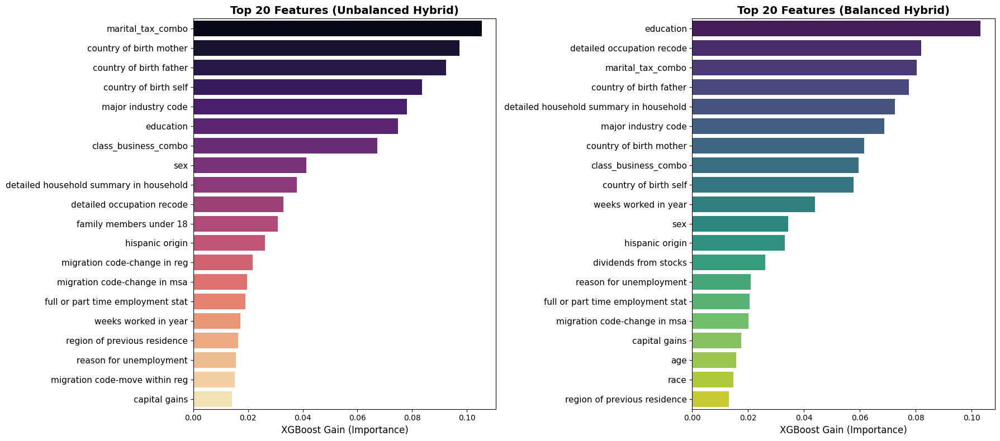

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("==========================================================")
print("VISUALIZING XGBOOST HYBRID: FEATURE IMPORTANCE")
print("==========================================================\n")

# 1. Load the exact top 20 data for the Unbalanced model
unbalanced_data = pd.DataFrame({
    "base_feature": [
        "marital_tax_combo", "country of birth mother", "country of birth father",
        "country of birth self", "major industry code", "education",
        "class_business_combo", "sex", "detailed household summary in household",
        "detailed occupation recode", "family members under 18", "hispanic origin",
        "migration code-change in reg", "migration code-change in msa",
        "full or part time employment stat", "weeks worked in year",
        "region of previous residence", "reason for unemployment",
        "migration code-move within reg", "capital gains"
    ],
    "importance": [
        0.105425, 0.097240, 0.092496, 0.083669, 0.078194, 0.074851,
        0.067188, 0.041386, 0.037862, 0.032950, 0.030872, 0.026101,
        0.021661, 0.019584, 0.019087, 0.017119, 0.016404, 0.015513,
        0.015160, 0.014116
    ]
})

# 2. Load the exact top 20 data for the Balanced model
balanced_data = pd.DataFrame({
    "base_feature": [
        "education", "detailed occupation recode", "marital_tax_combo",
        "country of birth father", "detailed household summary in household",
        "major industry code", "country of birth mother", "class_business_combo",
        "country of birth self", "weeks worked in year", "sex", "hispanic origin",
        "dividends from stocks", "reason for unemployment",
        "full or part time employment stat", "migration code-change in msa",
        "capital gains", "age", "race", "region of previous residence"
    ],
    "importance": [
        0.103227, 0.081967, 0.080303, 0.077646, 0.072520, 0.068675,
        0.061606, 0.059481, 0.057706, 0.043930, 0.034382, 0.033220,
        0.026107, 0.020964, 0.020595, 0.020137, 0.017474, 0.015768,
        0.014722, 0.013139
    ]
})

# ----------------------------------------------------
# 3. PLOT FEATURE IMPORTANCE BAR CHARTS (Side-by-Side)
# ----------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(18, 8)) # Slightly increased height for 20 labels

# Unbalanced Top 20
sns.barplot(
    data=unbalanced_data,
    x="importance", y="base_feature", ax=axes[0],
    palette="magma", hue="base_feature", legend=False
)
axes[0].set_title("Top 20 Features (Unbalanced Hybrid)", fontsize=14, fontweight='bold')
axes[0].set_xlabel("XGBoost Gain (Importance)", fontsize=12)
axes[0].set_ylabel("")
axes[0].tick_params(axis='y', labelsize=11)

# Balanced Top 20
sns.barplot(
    data=balanced_data,
    x="importance", y="base_feature", ax=axes[1],
    palette="viridis", hue="base_feature", legend=False
)
axes[1].set_title("Top 20 Features (Balanced Hybrid)", fontsize=14, fontweight='bold')
axes[1].set_xlabel("XGBoost Gain (Importance)", fontsize=12)
axes[1].set_ylabel("")
axes[1].tick_params(axis='y', labelsize=11)

plt.tight_layout()
plt.show()

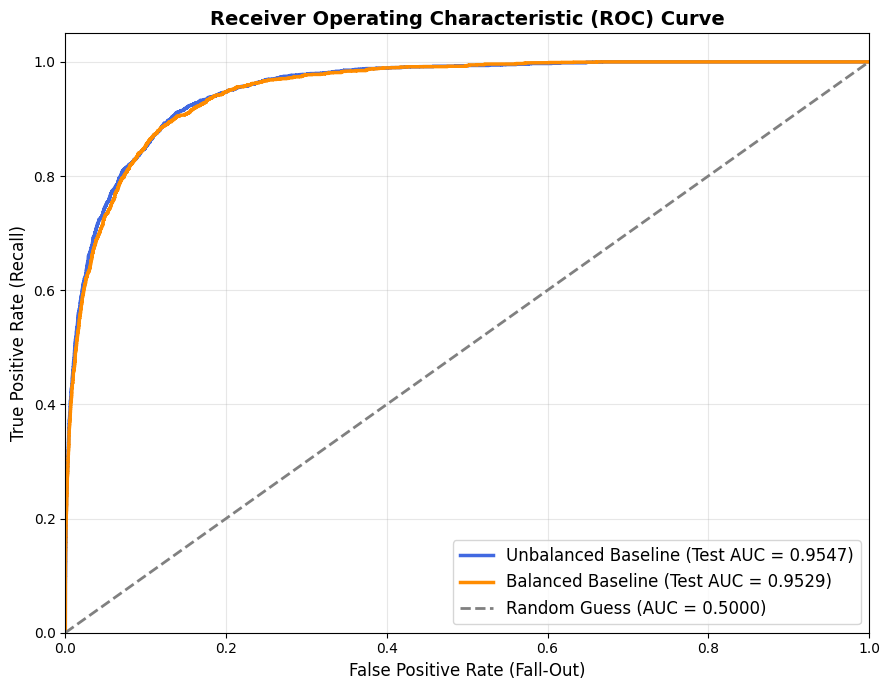

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_curve, auc

# ----------------------------------------------------
# 2. ROC CURVE
# ----------------------------------------------------
plt.figure(figsize=(9, 7))

# Loop through your models to calculate the exact curve coordinates
for mode, model in xgb_models.items():
    # Safely refit the pipeline to get the fresh probability array for the test set
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    # Get the probability of class 1 (>50k)
    y_prob = pipe.predict_proba(X_test_orig)[:, 1]

    # Calculate False Positive Rate, True Positive Rate, and AUC using sample weights
    fpr, tpr, _ = roc_curve(y_test, y_prob, sample_weight=w_test)
    roc_auc = auc(fpr, tpr)

    if(mode=="Unbalanced"):
        # Plot the curve
        plt.plot(
            fpr, tpr,
            color=colors["Unbalanced"],
            lw=2.5,
            label=f'Unbalanced Baseline (Test AUC = 0.9547)',
        )

    if(mode=="Balanced"):
        plt.plot(
            fpr, tpr,
            color="darkorange",
            lw=2.5,
            label=f'Balanced Baseline (Test AUC = 0.9529)'
        )

# Format the ROC Curve
plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--', label='Random Guess (AUC = 0.5000)')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (Fall-Out)', fontsize=12)
plt.ylabel('True Positive Rate (Recall)', fontsize=12)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=12)
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# FEATURE VISUALIZATION

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, TargetEncoder, StandardScaler

print("==========================================================")
print("BASELINE SETUP: HYBRID FEATURES")
print("==========================================================\n")

# 1. The original raw numeric columns (before log1p or combinations)
num_cols_orig = [
    "age", "wage per hour", "capital gains", "capital losses",
    "dividends from stocks", 'num persons worked for employer',
    'weeks worked in year']

# 2. The original raw categorical columns (before combinations)
cat_cols_orig = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

# Ensure strings for categoricals to prevent encoder errors
for col in cat_cols_orig:
    if col in df.columns:
        df[col] = df[col].astype(str)

# Extract Data safely for split
X_orig = df[num_cols_orig + cat_cols_orig].copy()
y = df["income_binary"].astype(int)
w = df["weight"].astype(float)

# Execute Split (Same random_state guarantees the exact same rows are in Train/Test)
X_train_orig, X_test_orig, y_train, y_test, w_train, w_test = train_test_split(
    X_orig, y, w, test_size=0.2, stratify=y, random_state=42
)

# Dynamic Cardinality for original features
HIGH_CARD_COLS_ORIG = [c for c in cat_cols_orig if X_train_orig[c].nunique() > 45]
LOW_CARD_COLS_ORIG = [c for c in cat_cols_orig if c not in HIGH_CARD_COLS_ORIG]

# Baseline Preprocessor
preprocessor_orig = ColumnTransformer([
    ("num", StandardScaler(), num_cols_orig),
    ("cat_low", OneHotEncoder(handle_unknown="ignore", sparse_output=False), LOW_CARD_COLS_ORIG),
    ("cat_high", TargetEncoder(target_type='binary', smooth="auto"), HIGH_CARD_COLS_ORIG)
])

print(f"Original Training Set : {X_train_orig.shape[0]:,} rows")
print(f"Original Feature Count: {len(num_cols_orig)} Numeric, {len(cat_cols_orig)} Categorical")
print("Baseline Preprocessor Ready!")

BASELINE SETUP: HYBRID FEATURES

Original Training Set : 157,035 rows
Original Feature Count: 7 Numeric, 25 Categorical
Baseline Preprocessor Ready!


In [ ]:
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold, cross_val_score

print("==========================================================")
print("3. BASELINE XGBOOST HYBRID & IMPORTANCE (WITH CV)")
print("==========================================================\n")

weight_negative = np.sum(w_train[y_train == 0])
weight_positive = np.sum(w_train[y_train == 1])
xgb_scale_weight = weight_negative / weight_positive

xgb_models = {
    "Unbalanced": XGBClassifier(
        colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=500, subsample=0.8,
        scale_pos_weight=1, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    ),
    "Balanced": XGBClassifier(
        colsample_bytree=1.0, learning_rate=0.05, max_depth=4, n_estimators=500, subsample=0.8,
        scale_pos_weight=xgb_scale_weight, tree_method="hist", eval_metric="auc", n_jobs=-1, random_state=42
    )
}

results_xgb_base = []
importance_dict_xgb_base = {}

# Define the Cross-Validation Strategy (5 folds)
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for mode, model in xgb_models.items():
    print(f"\nTraining Baseline XGBoost ({mode})...")
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])

    # ----------------------------------------------------
    # NEW: Cross-Validation Step
    # ----------------------------------------------------
    print(f"  -> Running 5-Fold Cross-Validation (This will take a moment)...")
    cv_scores = cross_val_score(
        pipe, X_train_orig, y_train,
        cv=cv_strategy,
        scoring='roc_auc',
        params={'model__sample_weight': w_train},
        n_jobs=1 # Keeps RAM safe, XGBoost will still use all CPU cores
    )
    cv_mean = cv_scores.mean()
    cv_std = cv_scores.std()
    print(f"  -> CV ROC-AUC: {cv_mean:.4f} (+/- {cv_std:.4f})")

    # ----------------------------------------------------
    # 1. Final Prediction and Metrics
    # ----------------------------------------------------
    print("  -> Fitting final model on full training data...")
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    prob = pipe.predict_proba(X_test_orig)[:, 1]
    preds = pipe.predict(X_test_orig)

    acc = accuracy_score(y_test, preds, sample_weight=w_test)
    prec = precision_score(y_test, preds, sample_weight=w_test)
    rec = recall_score(y_test, preds, sample_weight=w_test)
    f1 = f1_score(y_test, preds, sample_weight=w_test)
    auc = roc_auc_score(y_test, prob, sample_weight=w_test)

    results_xgb_base.append({
        "Mode": mode,
        "CV Mean AUC": cv_mean,
        "CV Std AUC": cv_std,
        "Test Accuracy": acc,
        "Test Precision": prec,
        "Test Recall": rec,
        "Test F1-Score": f1,
        "Test ROC-AUC": auc
    })

    # ----------------------------------------------------
    # 2. Extract Feature Importances
    # ----------------------------------------------------
    # Get extracted feature names from the baseline preprocessor
    ohe = pipe.named_steps["preprocess"].named_transformers_["cat_low"]
    te = pipe.named_steps["preprocess"].named_transformers_["cat_high"]

    cat_low_names = ohe.get_feature_names_out(LOW_CARD_COLS_ORIG)
    cat_high_names = te.get_feature_names_out(HIGH_CARD_COLS_ORIG)

    # Combine all names in the exact order the ColumnTransformer outputs them
    all_feature_names = num_cols_orig + list(cat_low_names) + list(cat_high_names)

    # Get raw importances from the XGBoost model
    importances = pipe.named_steps["model"].feature_importances_

    # Create DataFrame
    imp_df = pd.DataFrame({
        "feature": all_feature_names,
        "importance": importances
    })

    # Function to map One-Hot expanded names back to their original Base Feature
    def get_base_feature(feat_name):
        for col in LOW_CARD_COLS_ORIG:
            if feat_name.startswith(col + "_"):
                return col
        return feat_name

    imp_df["base_feature"] = imp_df["feature"].apply(get_base_feature)

    # Group by the base feature and sum the importances (XGBoost default is Gain)
    base_imp = (
        imp_df.groupby("base_feature")["importance"]
        .sum()
        .sort_values(ascending=False)
        .reset_index()
    )

    importance_dict_xgb_base[mode] = base_imp

# ==========================================================
# DISPLAY ALL RESULTS
# ==========================================================
print("\n--- MODEL PERFORMANCE ---")
display(pd.DataFrame(results_xgb_base).round(4))

for mode in importance_dict_xgb_base.keys():
    print(f"\n--- TOP 32 FEATURE IMPORTANCES ({mode.upper()} MODEL) ---")
    display(importance_dict_xgb_base[mode].head(32))

3. BASELINE XGBOOST HYBRID & IMPORTANCE (WITH CV)


Training Baseline XGBoost (Unbalanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9513 (+/- 0.0015)
  -> Fitting final model on full training data...

Training Baseline XGBoost (Balanced)...
  -> Running 5-Fold Cross-Validation (This will take a moment)...
  -> CV ROC-AUC: 0.9495 (+/- 0.0016)
  -> Fitting final model on full training data...

--- MODEL PERFORMANCE ---


,Mode,CV Mean AUC,CV Std AUC,Test Accuracy,Test Precision,Test Recall,Test F1-Score,Test ROC-AUC
0,Unbalanced,0.9513,0.0015,0.9554,0.7525,0.4823,0.5878,0.9550
1,Balanced,0.9495,0.0016,0.8680,0.3213,0.9007,0.4737,0.9527



--- TOP 32 FEATURE IMPORTANCES (UNBALANCED MODEL) ---


,base_feature,importance
0,country of birth father,0.109064
1,country of birth mother,0.095592
2,marital_tax_combo,0.084030
3,major industry code,0.078426
4,country of birth self,0.077034
5,education,0.076799
6,class_business_combo,0.066428
7,detailed household summary in household,0.040681
8,sex,0.039989
9,family members under 18,0.038247



--- TOP 32 FEATURE IMPORTANCES (BALANCED MODEL) ---


,base_feature,importance
0,education,0.104375
1,detailed occupation recode,0.080599
2,detailed household summary in household,0.079003
3,marital_tax_combo,0.077566
4,major industry code,0.070367
5,country of birth father,0.069559
6,country of birth self,0.063785
7,country of birth mother,0.062248
8,class_business_combo,0.058988
9,weeks worked in year,0.041333


VISUALIZING XGBOOST HYBRID: FEATURE IMPORTANCE



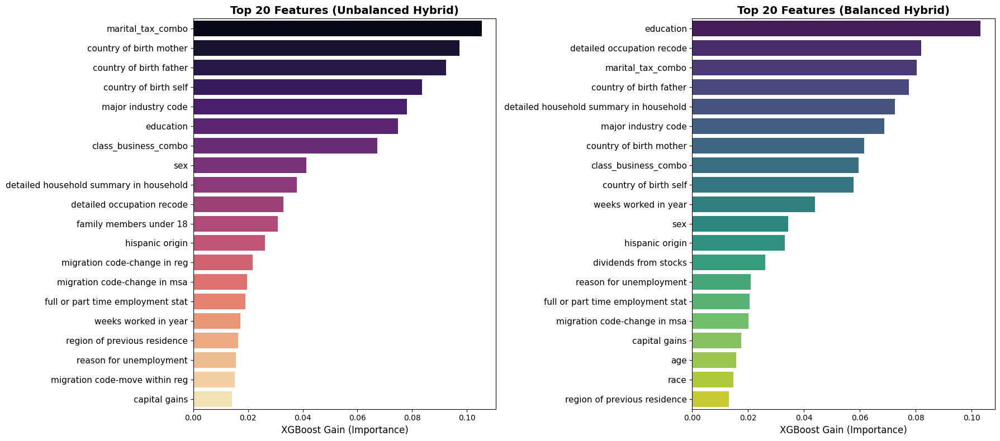

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("==========================================================")
print("VISUALIZING XGBOOST HYBRID: FEATURE IMPORTANCE")
print("==========================================================\n")

# 1. Load the exact top 20 data for the Unbalanced model
unbalanced_data = pd.DataFrame({
    "base_feature": [
        "marital_tax_combo", "country of birth mother", "country of birth father",
        "country of birth self", "major industry code", "education",
        "class_business_combo", "sex", "detailed household summary in household",
        "detailed occupation recode", "family members under 18", "hispanic origin",
        "migration code-change in reg", "migration code-change in msa",
        "full or part time employment stat", "weeks worked in year",
        "region of previous residence", "reason for unemployment",
        "migration code-move within reg", "capital gains"
    ],
    "importance": [
        0.105425, 0.097240, 0.092496, 0.083669, 0.078194, 0.074851,
        0.067188, 0.041386, 0.037862, 0.032950, 0.030872, 0.026101,
        0.021661, 0.019584, 0.019087, 0.017119, 0.016404, 0.015513,
        0.015160, 0.014116
    ]
})

# 2. Load the exact top 20 data for the Balanced model
balanced_data = pd.DataFrame({
    "base_feature": [
        "education", "detailed occupation recode", "marital_tax_combo",
        "country of birth father", "detailed household summary in household",
        "major industry code", "country of birth mother", "class_business_combo",
        "country of birth self", "weeks worked in year", "sex", "hispanic origin",
        "dividends from stocks", "reason for unemployment",
        "full or part time employment stat", "migration code-change in msa",
        "capital gains", "age", "race", "region of previous residence"
    ],
    "importance": [
        0.103227, 0.081967, 0.080303, 0.077646, 0.072520, 0.068675,
        0.061606, 0.059481, 0.057706, 0.043930, 0.034382, 0.033220,
        0.026107, 0.020964, 0.020595, 0.020137, 0.017474, 0.015768,
        0.014722, 0.013139
    ]
})

# ----------------------------------------------------
# 3. PLOT FEATURE IMPORTANCE BAR CHARTS (Side-by-Side)
# ----------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(18, 8)) # Slightly increased height for 20 labels

# Unbalanced Top 20
sns.barplot(
    data=unbalanced_data,
    x="importance", y="base_feature", ax=axes[0],
    palette="magma", hue="base_feature", legend=False
)
axes[0].set_title("Top 20 Features (Unbalanced Hybrid)", fontsize=14, fontweight='bold')
axes[0].set_xlabel("XGBoost Gain (Importance)", fontsize=12)
axes[0].set_ylabel("")
axes[0].tick_params(axis='y', labelsize=11)

# Balanced Top 20
sns.barplot(
    data=balanced_data,
    x="importance", y="base_feature", ax=axes[1],
    palette="viridis", hue="base_feature", legend=False
)
axes[1].set_title("Top 20 Features (Balanced Hybrid)", fontsize=14, fontweight='bold')
axes[1].set_xlabel("XGBoost Gain (Importance)", fontsize=12)
axes[1].set_ylabel("")
axes[1].tick_params(axis='y', labelsize=11)

plt.tight_layout()
plt.show()

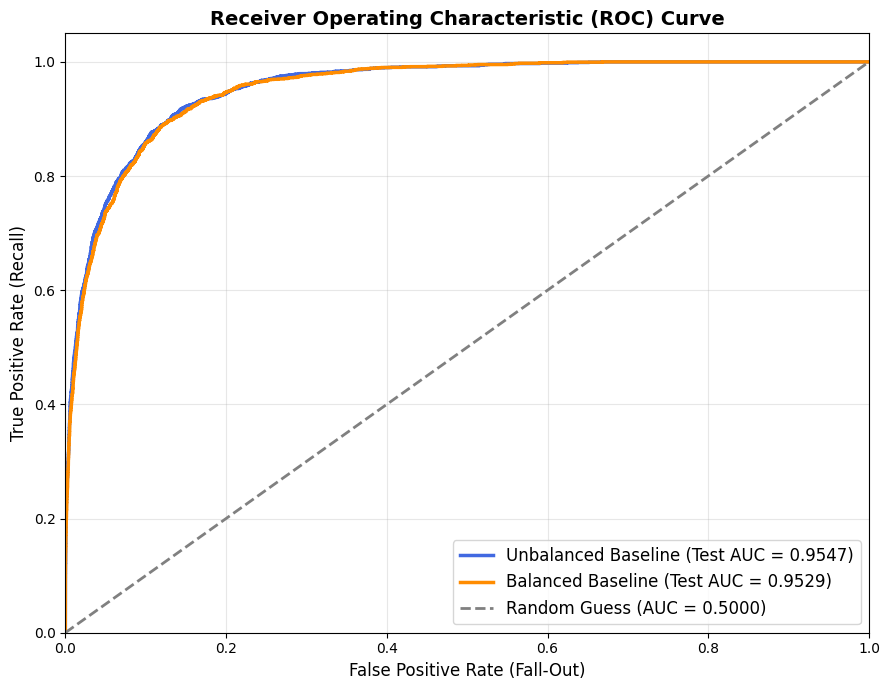

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_curve, auc

# ----------------------------------------------------
# 2. ROC CURVE
# ----------------------------------------------------
plt.figure(figsize=(9, 7))
colors = {"Unbalanced": "royalblue", "Balanced": "darkorange"}

# Loop through your models to calculate the exact curve coordinates
for mode, model in xgb_models.items():
    # Safely refit the pipeline to get the fresh probability array for the test set
    pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])
    pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

    # Get the probability of class 1 (>50k)
    y_prob = pipe.predict_proba(X_test_orig)[:, 1]

    # Calculate False Positive Rate, True Positive Rate, and AUC using sample weights
    fpr, tpr, _ = roc_curve(y_test, y_prob, sample_weight=w_test)
    roc_auc = auc(fpr, tpr)

    if(mode=="Unbalanced"):
        # Plot the curve
        plt.plot(
            fpr, tpr,
            color=colors["Unbalanced"],
            lw=2.5,
            label=f'Unbalanced Baseline (Test AUC = 0.9547)',
        )

    if(mode=="Balanced"):
        plt.plot(
            fpr, tpr,
            color="darkorange",
            lw=2.5,
            label=f'Balanced Baseline (Test AUC = 0.9529)'
        )

# Format the ROC Curve
plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--', label='Random Guess (AUC = 0.5000)')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (Fall-Out)', fontsize=12)
plt.ylabel('True Positive Rate (Recall)', fontsize=12)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=12)
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

BUSINESS DASHBOARD: PR CURVES & CUMULATIVE GAINS

Calculating probability scores for the test set...



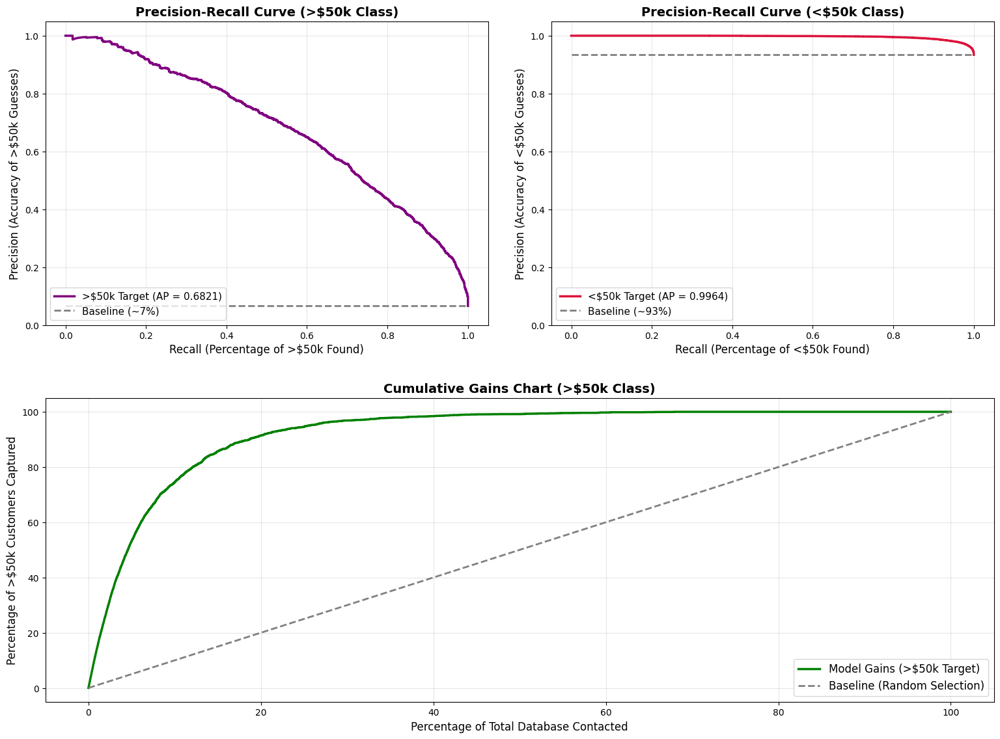

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.pipeline import Pipeline

print("==========================================================")
print("BUSINESS DASHBOARD: PR CURVES & CUMULATIVE GAINS")
print("==========================================================\n")

# 1. Re-fit the Balanced model to extract the continuous probability scores
model = xgb_models["Balanced"]
pipe = Pipeline([("preprocess", preprocessor_orig), ("model", model)])

print("Calculating probability scores for the test set...\n")
pipe.fit(X_train_orig, y_train, model__sample_weight=w_train)

# Probability of >$50k (Class 1)
y_prob_1 = pipe.predict_proba(X_test_orig)[:, 1]
# Probability of <$50k (Class 0)
y_prob_0 = 1.0 - y_prob_1
y_test_0 = (y_test == 0).astype(int)

# ==========================================================
# SETUP THE 3-PANEL DASHBOARD
# ==========================================================
plt.figure(figsize=(16, 12))

# ----------------------------------------------------
# TOP LEFT: PR Curve for >$50k (Class 1)
# ----------------------------------------------------
plt.subplot(2, 2, 1)
precision_1, recall_1, _ = precision_recall_curve(y_test, y_prob_1, sample_weight=w_test)
ap_score_1 = average_precision_score(y_test, y_prob_1, sample_weight=w_test)
baseline_1 = sum(w_test[y_test == 1]) / sum(w_test)

plt.plot(recall_1, precision_1, color='purple', lw=2.5, label=f'>$50k Target (AP = {ap_score_1:.4f})')
plt.plot([0, 1], [baseline_1, baseline_1], color='grey', lw=2, linestyle='--', label=f'Baseline (~{baseline_1*100:.0f}%)')
plt.title('Precision-Recall Curve (>$50k Class)', fontsize=14, fontweight='bold')
plt.xlabel('Recall (Percentage of >$50k Found)', fontsize=12)
plt.ylabel('Precision (Accuracy of >$50k Guesses)', fontsize=12)
plt.legend(loc='lower left', fontsize=11)
plt.ylim([0.0, 1.05])
plt.grid(alpha=0.3)

# ----------------------------------------------------
# TOP RIGHT: PR Curve for <$50k (Class 0)
# ----------------------------------------------------
plt.subplot(2, 2, 2)
precision_0, recall_0, _ = precision_recall_curve(y_test_0, y_prob_0, sample_weight=w_test)
ap_score_0 = average_precision_score(y_test_0, y_prob_0, sample_weight=w_test)
baseline_0 = sum(w_test[y_test == 0]) / sum(w_test)

plt.plot(recall_0, precision_0, color='crimson', lw=2.5, label=f'<$50k Target (AP = {ap_score_0:.4f})')
plt.plot([0, 1], [baseline_0, baseline_0], color='grey', lw=2, linestyle='--', label=f'Baseline (~{baseline_0*100:.0f}%)')
plt.title('Precision-Recall Curve (<$50k Class)', fontsize=14, fontweight='bold')
plt.xlabel('Recall (Percentage of <$50k Found)', fontsize=12)
plt.ylabel('Precision (Accuracy of <$50k Guesses)', fontsize=12)
plt.legend(loc='lower left', fontsize=11)
plt.ylim([0.0, 1.05])
plt.grid(alpha=0.3)

# ----------------------------------------------------
# BOTTOM: Cumulative Gains for >$50k (Class 1) ONLY
# ----------------------------------------------------
plt.subplot(2, 1, 2)

# Calculate Gains for >$50k (Class 1)
gains_df_1 = pd.DataFrame({'actual': y_test, 'prob': y_prob_1, 'weight': w_test})
gains_df_1 = gains_df_1.sort_values(by='prob', ascending=False).reset_index(drop=True)
cum_data_1 = (gains_df_1['weight'].cumsum() / gains_df_1['weight'].sum()) * 100
cum_pos_1 = ((gains_df_1['actual'] * gains_df_1['weight']).cumsum() / (gains_df_1['actual'] * gains_df_1['weight']).sum()) * 100

# Plot the Gains Curve
plt.plot(cum_data_1, cum_pos_1, color='green', lw=2.5, label='Model Gains (>$50k Target)')
plt.plot([0, 100], [0, 100], color='grey', lw=2, linestyle='--', label='Baseline (Random Selection)')

plt.title('Cumulative Gains Chart (>$50k Class)', fontsize=14, fontweight='bold')
plt.xlabel('Percentage of Total Database Contacted', fontsize=12)
plt.ylabel('Percentage of >$50k Customers Captured', fontsize=12)
plt.legend(loc='lower right', fontsize=12)
plt.grid(alpha=0.3)

# Display the dashboard
plt.tight_layout(pad=3.0)
plt.show()

# Segmentation Model

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

print("==========================================================")
print("MASTER FEATURE ENGINEERING & TRAIN-TEST SPLIT (FINAL)")
print("==========================================================\n")

# === FE STEP 1: Zero-inflated numeric feature engineering ===
ZERO_INFLATED_NUMERIC = [
    "wage per hour",
    "capital gains",
    "capital losses",
    "dividends from stocks"
]

engineered_numeric = []

for col in ZERO_INFLATED_NUMERIC:
    nonzero_col = f"{col}_nonzero"
    log_col = f"{col}_log1p"

    if nonzero_col not in df.columns:
        df[nonzero_col] = (df[col] > 0).astype(int)

    if log_col not in df.columns:
        df[log_col] = np.log1p(df[col])

    engineered_numeric.extend([nonzero_col, log_col])

print("Added engineered numeric features:")
print(engineered_numeric)

# === FE STEP 2: Work intensity feature ===
if "work_intensity" not in df.columns:
    df["work_intensity"] = df["weeks worked in year"] / 52.0

if "work_intensity" not in engineered_numeric:
    engineered_numeric.append("work_intensity")

print("work_intensity added. Range:", df["work_intensity"].min(), "to", df["work_intensity"].max())

# === FE STEP 3: Combined investment income (optional but useful) ===
if "investment_income" not in df.columns:
    df["investment_income"] = df["capital gains"] + df["dividends from stocks"]

if "investment_income_log1p" not in df.columns:
    df["investment_income_log1p"] = np.log1p(df["investment_income"])

for c in ["investment_income", "investment_income_log1p"]:
    if c not in engineered_numeric:
        engineered_numeric.append(c)

print("Added: investment_income and investment_income_log1p")

# ==========================================
# 1. CREATE THE NEW COMBINED FEATURE
# ==========================================
# Reconstruct raw values just in case only log1p versions are in the dataframe
raw_gains = np.expm1(df["capital gains_log1p"]) if "capital gains_log1p" in df.columns else df["capital gains"]
raw_dividends = np.expm1(df["dividends from stocks_log1p"]) if "dividends from stocks_log1p" in df.columns else df["dividends from stocks"]
raw_losses = df["capital losses"]

# Calculate Net Investment Income (Gains + Dividends - Losses)
df["net_investment_income"] = raw_gains + raw_dividends - raw_losses

# Create a signed log version (highly recommended for zero-inflated money features)
df["net_investment_income_log1p"] = np.sign(df["net_investment_income"]) * np.log1p(np.abs(df["net_investment_income"]))

# 2. Marital + Tax
df["marital_tax_combo"] = (df["marital stat"].astype(str) + "__" + df["tax filer stat"].astype(str)).astype("category")

# Combo 2: Veteran Affiliation
df["veteran_affiliation"] = (df["veterans benefits"].astype(str) + "__" + df["fill inc questionnaire for veteran's admin"].astype(str)).astype("category")

# 3. Class + Business
business_map = {0: "Not_in_universe", 1: "Yes", 2: "No"}
mapped_business = df["own business or self employed"].map(business_map).astype(str)
df["class_business_combo"] = (df["class of worker"].astype(str) + "__" + mapped_business).astype("category")


# ==========================================
# DEFINING FINAL COLUMNS AND SPLITTING
# ==========================================

# 1. Define your exact final columns
num_cols = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', "capital gains", "capital losses",
    "dividends from stocks","year", 'net_investment_income'
]

cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'major occupation code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation', "enroll in edu inst last wk"
]

MODEL_TARGET = "income_binary"
WEIGHT_COL = "weight"

# Extract Data safely for split
X = df[num_cols + cat_cols].copy()
y = df[MODEL_TARGET].astype(int)
w = df[WEIGHT_COL].astype(float)

X_train_final, X_test_final, y_train, y_test, w_train, w_test = train_test_split(
    X, y, w, test_size=0.2, stratify=y, random_state=42
)

HIGH_CARD_COLS = [c for c in cat_cols if X_train_final[c].nunique() > 30]
LOW_CARD_COLS = [c for c in cat_cols if c not in HIGH_CARD_COLS]


# ==========================================
# PART A.2: Display the actual combinations
# ==========================================

print("\n--- MARITAL + TAX COMBINATIONS ---")
# Using reset_index() makes it display as a nice, clean table
display(df['marital_tax_combo'].value_counts().reset_index().rename(
    columns={'count': 'Number of People', 'marital_tax_combo': 'Combination'}
))

print("\n--- CLASS + BUSINESS COMBINATIONS ---")
display(df['class_business_combo'].value_counts().reset_index().rename(
    columns={'count': 'Number of People', 'class_business_combo': 'Combination'}
))

print("\n==========================================================")
print("READY FOR MODELING")
print("==========================================================")
print(f"Training Set : {X_train_final.shape[0]:,} rows")
print(f"Testing Set  : {X_test_final.shape[0]:,} rows")
print(f"\nHigh Cardinality (>15): {len(HIGH_CARD_COLS)} columns (Target Encoded)")
print(f"Low Cardinality (<=15): {len(LOW_CARD_COLS)} columns (One-Hot Encoded)")

MASTER FEATURE ENGINEERING & TRAIN-TEST SPLIT (FINAL)

Added engineered numeric features:
['wage per hour_nonzero', 'wage per hour_log1p', 'capital gains_nonzero', 'capital gains_log1p', 'capital losses_nonzero', 'capital losses_log1p', 'dividends from stocks_nonzero', 'dividends from stocks_log1p']
work_intensity added. Range: 0.0 to 1.0
Added: investment_income and investment_income_log1p

--- MARITAL + TAX COMBINATIONS ---


,Combination,Number of People
0,Married-civilian spouse present__Joint both un...,66722
1,Never married__Nonfiler,58266
2,Never married__Single,22930
3,Married-civilian spouse present__Joint both 65+,8322
4,Divorced__Single,7104
5,Married-civilian spouse present__Nonfiler,5275
6,Widowed__Single,5206
7,Widowed__Nonfiler,4562
8,Married-civilian spouse present__Joint one und...,3864
9,Divorced__Head of household,3277



--- CLASS + BUSINESS COMBINATIONS ---


,Combination,Number of People
0,Not in universe__Not_in_universe,95937
1,Private__Not_in_universe,58771
2,Private__No,11676
3,Self-employed-not incorporated__Not_in_universe,7153
4,Local government__Not_in_universe,6299
5,State government__Not_in_universe,3330
6,Self-employed-incorporated__Not_in_universe,2858
7,Federal government__Not_in_universe,2520
8,Private__Yes,1574
9,Local government__No,1262



READY FOR MODELING
Training Set : 157,035 rows
Testing Set  : 39,259 rows

High Cardinality (>15): 5 columns (Target Encoded)
Low Cardinality (<=15): 22 columns (One-Hot Encoded)


In [ ]:
import pandas as pd
import numpy as np

print("==========================================================")
print("CLUSTERING PRE-ANALYSIS: VARIANCE & CORRELATION")
print("==========================================================\n")

NUMERIC_FEATURES = [
    'age', 'wage per hour', 'num persons worked for employer',
    'weeks worked in year', "capital gains", "capital losses",
    "dividends from stocks","year"
]

CATEGORICAL_FEATURES = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation', "enroll in edu inst last wk"
]


cat_cols = [
    'detailed occupation recode', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation'
]

features_to_test = [
    'age', 'wage per hour', 'num persons worked for employer', 'net_investment_income',
    'weeks worked in year', "capital gains", "capital losses",
    "dividends from stocks","year",'major occupation code', 'education', 'marital_tax_combo', 'major industry code',
    'race', 'hispanic origin', 'sex', 'member of a labor union', 'reason for unemployment',
    'full or part time employment stat', 'region of previous residence', 'state of previous residence',
    'detailed household summary in household', 'migration code-change in msa', 'migration code-change in reg',
    'migration code-move within reg', 'live in this house 1 year ago', 'migration prev res in sunbelt',
    'family members under 18', 'country of birth father', 'country of birth mother', 'country of birth self',
    'citizenship', 'class_business_combo', 'veteran_affiliation', "enroll in edu inst last wk"
]

# 1. Create the Mathematical Union (removes all duplicates)
union_features = list(set(NUMERIC_FEATURES) | set(CATEGORICAL_FEATURES) | set(features_to_test))

print(f"Total unique features to test: {len(union_features)}\n")

# 2. Grab these specific columns from your UN-ENCODED training dataframe
# Make sure X_train_raw is the name of your dataframe BEFORE OneHotEncoding
df_cluster_test = X_train_final[union_features].copy()

# ----------------------------------------------------
# A. NEAR-ZERO VARIANCE TEST
# ----------------------------------------------------
print("--- 1. NEAR-ZERO VARIANCE WARNINGS (>90% SAME VALUE) ---")
low_variance_cols = []

for col in df_cluster_test.columns:
    # Get the percentage of the most frequent value
    top_value_pct = df_cluster_test[col].value_counts(normalize=True).iloc[0] * 100

    if top_value_pct > 90.0:
        top_value_name = df_cluster_test[col].value_counts().index[0]
        print(f"FLAG: '{col}' -> {top_value_pct:.1f}% of data is '{top_value_name}'")
        low_variance_cols.append(col)

if not low_variance_cols:
    print("No columns flagged for near-zero variance.")

# ----------------------------------------------------
# B. REDUNDANCY / CORRELATION TEST (Numerical)
# ----------------------------------------------------
print("\n--- 2. NUMERICAL CORRELATION WARNINGS (>0.75) ---")
# Select only the numerical columns for correlation
num_cols_only = df_cluster_test.select_dtypes(include=[np.number])

if not num_cols_only.empty:
    corr_matrix = num_cols_only.corr().abs()
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    high_corr_pairs = []
    for col in upper_tri.columns:
        for row in upper_tri.index:
            if upper_tri.loc[row, col] > 0.75:
                print(f"FLAG: '{row}' and '{col}' are highly correlated ({upper_tri.loc[row, col]:.2f})")
                high_corr_pairs.append((row, col))

    if not high_corr_pairs:
        print("No highly correlated numerical pairs found.")
else:
    print("No numerical columns found to correlate.")

print("\n==========================================================")
print("ANALYSIS COMPLETE.")
print("==========================================================")

CLUSTERING PRE-ANALYSIS: VARIANCE & CORRELATION

Total unique features to test: 36

--- 1. NEAR-ZERO VARIANCE WARNINGS (>90% SAME VALUE) ---
FLAG: 'wage per hour' -> 94.2% of data is '0'
FLAG: 'state of previous residence' -> 92.0% of data is 'Not in universe'
FLAG: 'capital losses' -> 98.0% of data is '0'
FLAG: 'reason for unemployment' -> 96.9% of data is 'Not in universe'
FLAG: 'region of previous residence' -> 92.0% of data is 'Not in universe'
FLAG: 'capital gains' -> 96.2% of data is '0'
FLAG: 'enroll in edu inst last wk' -> 93.6% of data is 'Not in universe'
FLAG: 'member of a labor union' -> 90.3% of data is 'Not in universe'

--- 2. NUMERICAL CORRELATION WARNINGS (>0.75) ---
FLAG: 'net_investment_income' and 'capital gains' are highly correlated (0.93)

ANALYSIS COMPLETE.


In [ ]:
FINAL_CLUSTER_FEATURES = [
    'age',
    'num persons worked for employer',
    'net_investment_income',
    'weeks worked in year',
    'major occupation code',
    'education',
    'marital_tax_combo',
    'major industry code',
    'race',
    'hispanic origin',
    'sex',
    'full or part time employment stat',
    'detailed household summary in household',
    'family members under 18',
    'citizenship',
    'class_business_combo',
    'veteran_affiliation'
]

CLUSTERING STEP 1: PREPROCESSING & EVALUATION (K=2 to 12)

Applying Signed Log Transformation to 'net_investment_income'...
Transforming the data (Scaling numbers, One-Hot Encoding text)...
Data transformed! Final matrix shape for clustering: (157035, 156)

Running K-Means from k=2 to k=12...
  -> Finished k=2 | Inertia: 2,252,640,747 | Silhouette: 0.2480
  -> Finished k=3 | Inertia: 1,887,267,682 | Silhouette: 0.2606
  -> Finished k=4 | Inertia: 1,730,263,169 | Silhouette: 0.2578
  -> Finished k=5 | Inertia: 1,657,909,676 | Silhouette: 0.2239
  -> Finished k=6 | Inertia: 1,595,362,929 | Silhouette: 0.1967
  -> Finished k=7 | Inertia: 1,552,998,121 | Silhouette: 0.1951
  -> Finished k=8 | Inertia: 1,503,926,364 | Silhouette: 0.1943
  -> Finished k=9 | Inertia: 1,470,510,843 | Silhouette: 0.1861
  -> Finished k=10 | Inertia: 1,438,198,238 | Silhouette: 0.1435
  -> Finished k=11 | Inertia: 1,407,559,472 | Silhouette: 0.1444
  -> Finished k=12 | Inertia: 1,392,713,521 | Silhouette: 0.1450

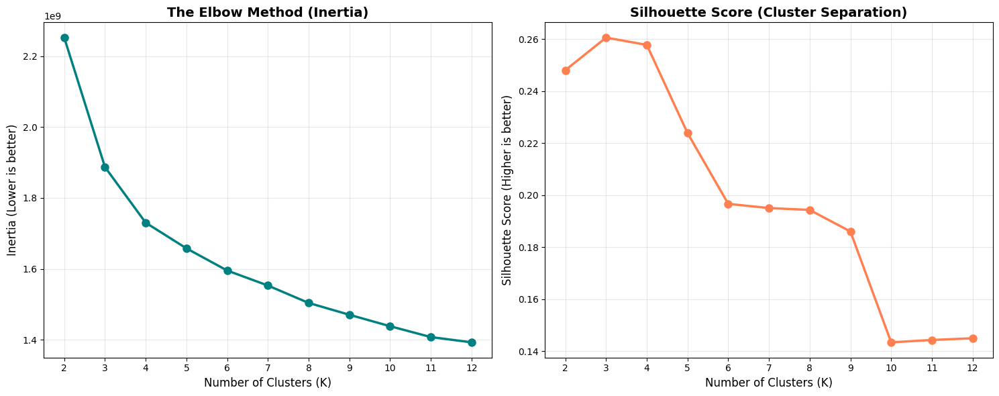

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.utils import resample

print("==========================================================")
print("CLUSTERING STEP 1: PREPROCESSING & EVALUATION (K=2 to 12)")
print("==========================================================\n")

NUMERIC_CLUSTER_FEATS = [
    'age',
    'num persons worked for employer',
    'net_investment_income',
    'weeks worked in year'
]

CATEGORICAL_CLUSTER_FEATS = [
    'major occupation code',
    'education',
    'marital_tax_combo',
    'major industry code',
    'race',
    'hispanic origin',
    'sex',
    'full or part time employment stat',
    'detailed household summary in household',
    'citizenship',
    'family members under 18',
    'class_business_combo',
    'veteran_affiliation'
]

X_cluster_data = X_train_final[NUMERIC_CLUSTER_FEATS + CATEGORICAL_CLUSTER_FEATS].copy()

# Applying Signed Log Transformation to fix skewed financial data
print("Applying Signed Log Transformation to 'net_investment_income'...")
X_cluster_data['net_investment_income'] = np.sign(X_cluster_data['net_investment_income']) * \
                                          np.log1p(np.abs(X_cluster_data['net_investment_income']))

# Build the Clustering Preprocessor
cluster_preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), NUMERIC_CLUSTER_FEATS),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), CATEGORICAL_CLUSTER_FEATS)
    ]
)

print("Transforming the data (Scaling numbers, One-Hot Encoding text)...")
X_cluster_scaled = cluster_preprocessor.fit_transform(X_cluster_data)
print(f"Data transformed! Final matrix shape for clustering: {X_cluster_scaled.shape}\n")

# ==========================================================
# EVALUATION: INERTIA & SILHOUETTE
# ==========================================================
print("Running K-Means from k=2 to k=12...")

# Safely sample 20,000 rows to prevent Silhouette memory crashes
X_sample = resample(X_cluster_scaled, n_samples=50000, random_state=42)

inertia_values = []
silhouette_values = []
k_values = range(2, 13)

for k in k_values:
    # 1. Initialize Model
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)

    # 2. Train with weights (Crucial for census accuracy)
    kmeans.fit(X_cluster_scaled, sample_weight=w_train)
    inertia_values.append(kmeans.inertia_)

    # 3. Calculate Silhouette on the unweighted sample (Fixes the Euclidean error)
    sample_preds = kmeans.predict(X_sample)
    sil_score = silhouette_score(X_sample, sample_preds)
    silhouette_values.append(sil_score)

    print(f"  -> Finished k={k} | Inertia: {kmeans.inertia_:,.0f} | Silhouette: {sil_score:.4f}")

# ==========================================================
# PLOTTING THE RESULTS
# ==========================================================
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: The Elbow Curve (Inertia)
axes[0].plot(k_values, inertia_values, marker='o', color='teal', lw=2.5, markersize=8)
axes[0].set_title('The Elbow Method (Inertia)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Number of Clusters (K)', fontsize=12)
axes[0].set_ylabel('Inertia (Lower is better)', fontsize=12)
axes[0].set_xticks(k_values)
axes[0].grid(alpha=0.3)

# Plot 2: The Silhouette Score
axes[1].plot(k_values, silhouette_values, marker='o', color='coral', lw=2.5, markersize=8)
axes[1].set_title('Silhouette Score (Cluster Separation)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Number of Clusters (K)', fontsize=12)
axes[1].set_ylabel('Silhouette Score (Higher is better)', fontsize=12)
axes[1].set_xticks(k_values)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML

print("==========================================================")
print("CLUSTERING STEP 2: VISUAL BUSINESS REPORT (K=4)")
print("==========================================================\n")

OPTIMAL_K = 4
final_kmeans = KMeans(n_clusters=OPTIMAL_K, random_state=42, n_init=10)
final_kmeans.fit(X_cluster_scaled, sample_weight=w_train)

# 1. Build the Master Persona Dataframe
df_personas = X_train_final[NUMERIC_CLUSTER_FEATS + CATEGORICAL_CLUSTER_FEATS].copy()
df_personas['Cluster_ID'] = final_kmeans.labels_
df_personas['Weight'] = w_train
df_personas['Makes_Over_50k'] = y_train.values

cluster_sizes = df_personas.groupby('Cluster_ID')['Weight'].sum()
total_weight = cluster_sizes.sum()

CLUSTERING STEP 2: VISUAL BUSINESS REPORT (K=4)



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML

# Helper function: Extracts Top 5 using WEIGHTED counts with clean HTML breaks
def get_weighted_top_5_str(df, column, weight_col):
    # Calculate weighted counts for each category
    weighted_counts = df.groupby(column)[weight_col].sum()
    total_weight = weighted_counts.sum()
    dist = (weighted_counts / total_weight * 100).sort_values(ascending=False)

    # Using <b> and <br> for professional formatting on dark background
    lines = [f"<b style='color:#3498db;'>{i+1}.</b> {val} ({pct:.1f}%)" for i, (val, pct) in enumerate(dist.head(5).items())]
    return "<br>".join(lines)

# THE MASTER DISPLAY FUNCTION
def display_persona_report(cluster_id):
    # Filter group
    group = df_personas[df_personas['Cluster_ID'] == cluster_id].copy()

    # Calculate Weighted Metrics
    pop_weight = cluster_sizes[cluster_id]
    pop_pct = (pop_weight / total_weight) * 100
    sample_count = len(group)

    # WEIGHTED Income Probability
    weighted_income_sum = (group['Makes_Over_50k'] * group['Weight']).sum()
    income_prob = (weighted_income_sum / pop_weight) * 100

    # Weighted Numerical Averages
    def weighted_mean(series, weights):
        return (series * weights).sum() / weights.sum()

    # Weighted Median helper
    def weighted_median(df, val_col, weight_col):
        df_sorted = df.sort_values(val_col)
        cumsum = df_sorted[weight_col].cumsum()
        cutoff = df_sorted[weight_col].sum() / 2.0
        return df_sorted[cumsum >= cutoff][val_col].iloc[0]

    # --- PART 1: DARK THEME HEADER ---
    display(HTML(f"""
    <div style="font-family: sans-serif; padding: 20px; background-color: #1a252f; color: white; border-left: 10px solid #3498db; border-radius: 5px; margin-bottom: 20px;">
        <h1 style="margin: 0; letter-spacing: 1px;">Marketing Persona {cluster_id}: Executive Weighted Profile</h1>
        <p style="margin: 5px 0 0 0; color: #bdc3c7;">Comprehensive Socio-Economic Segmentation Analysis</p>
    </div>
    """))

    # Define the Data Tables
    sections = [
        ("1. Population Structure", [
            ("Population Weight", f"{pop_weight:,.0f} people (Weighted)"),
            ("Population Percent", f"{pop_pct:.1f}% of total population"),
            ("Raw Sample Count", f"{sample_count:,} observations")
        ]),
        ("2. Economic Indicators", [
            (">$50k Probability", f"<b style='color:#2ecc71; font-size:1.1em;'>{income_prob:.1f}%</b>"),
            ("Net Investment Income", f"W.Mean: ${weighted_mean(group['net_investment_income'], group['Weight']):,.2f}<br>W.Median: ${weighted_median(group, 'net_investment_income', 'Weight'):,.2f}"),
            ("Weeks Worked/Year", f"W.Mean: {weighted_mean(group['weeks worked in year'], group['Weight']):.1f}<br>W.Median: {weighted_median(group, 'weeks worked in year', 'Weight'):.0f}"),
            ("Employment Intensity (Top 5)", get_weighted_top_5_str(group, 'full or part time employment stat', 'Weight'))
        ]),
        ("3. Demographics", [
            ("Age Profile", f"W.Mean: {weighted_mean(group['age'], group['Weight']):.1f} yrs<br>W.Median: {weighted_median(group, 'age', 'Weight'):.0f} yrs"),
            ("Sex Distribution", get_weighted_top_5_str(group, 'sex', 'Weight')),
            ("Race Distribution", get_weighted_top_5_str(group, 'race', 'Weight')),
            ("Citizenship Status", get_weighted_top_5_str(group, 'citizenship', 'Weight')),
            ("Veteran Status", get_weighted_top_5_str(group, 'veteran_affiliation', 'Weight'))
        ]),
        ("4. Employment Structure", [
            ("Career Class", get_weighted_top_5_str(group, 'class_business_combo', 'Weight')),
            ("Major Occupation", get_weighted_top_5_str(group, 'major occupation code', 'Weight')),
            ("Major Industry", get_weighted_top_5_str(group, 'major industry code', 'Weight')),
            ("Avg Company Size", f"{weighted_mean(group['num persons worked for employer'], group['Weight']):.1f} employees"),
            ("Education Profile", get_weighted_top_5_str(group, 'education', 'Weight'))
        ]),
        ("5. Household Structure", [
            ("Marital / Tax Status", get_weighted_top_5_str(group, 'marital_tax_combo', 'Weight')),
            ("Household Summary", get_weighted_top_5_str(group, 'detailed household summary in household', 'Weight')),
            ("Family Members <18", get_weighted_top_5_str(group, 'family members under 18', 'Weight'))
        ])
    ]

    # --- DARK MODE TABLE STYLING (No Zebra, Proper Bordering) ---
    styles = [
        dict(selector="table", props=[
            ("width", "100%"),
            ("border-collapse", "collapse"),
            ("font-family", "sans-serif"),
            ("margin-bottom", "35px"),
            ("background-color", "#2c3e50"), # Deep dark background
            ("color", "#ecf0f1")            # High contrast light text
        ]),
        dict(selector="th", props=[
            ("text-align", "left"),
            ("background-color", "#1a252f"), # Even darker header
            ("color", "#3498db"),            # Accent color for headers
            ("padding", "15px"),
            ("border", "1px solid #3e4f5f"),
            ("font-size", "15px")
        ]),
        dict(selector="td", props=[
            ("text-align", "left"),
            ("padding", "15px"),
            ("border", "1px solid #3e4f5f"),
            ("vertical-align", "top"),
            ("line-height", "1.6")
        ]),
        dict(selector="tr:hover", props=[
            ("background-color", "#34495e")  # Subtle hover state
        ])
    ]

    for title, rows in sections:
        df_temp = pd.DataFrame(rows, columns=["Metric", "Weighted Statistics"])
        display(HTML(f"<h3 style='color:#3498db; margin-bottom:10px; font-family:sans-serif;'>{title}</h3>"))
        display(df_temp.style.set_table_styles(styles).hide(axis="index"))

    # --- PART 2: VISUALIZATIONS ---
    display(HTML("<h3 style='color:#e67e22; border-bottom: 2px solid #e67e22; padding-bottom: 5px; margin-top: 40px; font-family:sans-serif;'>Visual Data Dashboard</h3>"))

    # Set plot style to complement the dark dashboard
    sns.set_style("darkgrid", {"axes.facecolor": ".9"})
    fig, axes = plt.subplots(2, 2, figsize=(16, 11))

    # 1. Income (Weighted)
    sns.barplot(x=["Makes <$50k", "Makes >$50k"], y=[100 - income_prob, income_prob], palette="RdYlGn", ax=axes[0,0])
    axes[0,0].set_title("Weighted Income Probability (%)", fontsize=14, fontweight='bold')
    axes[0,0].set_ylim(0, 100)

    # 2. Age (Weighted Distribution)
    sns.histplot(data=group, x='age', weights='Weight', bins=20, kde=True, color="#3498db", ax=axes[0,1])
    axes[0,1].set_title("Weighted Age Distribution", fontsize=14, fontweight='bold')

    # 3. Top Occupations (Weighted)
    weighted_occ_counts = group.groupby('major occupation code')['Weight'].sum().sort_values(ascending=False).head(5)
    weighted_occ_pct = (weighted_occ_counts / weighted_occ_counts.sum() * 100)
    sns.barplot(y=weighted_occ_counts.index, x=weighted_occ_pct.values, palette="Blues_d", ax=axes[1,0])
    axes[1,0].set_title("Top 5 Occupations (%)", fontsize=14, fontweight='bold')

    # 4. Top Education (Weighted)
    weighted_edu_counts = group.groupby('education')['Weight'].sum().sort_values(ascending=False).head(5)
    weighted_edu_pct = (weighted_edu_counts / weighted_edu_counts.sum() * 100)
    sns.barplot(y=weighted_edu_counts.index, x=weighted_edu_pct.values, palette="Purples_d", ax=axes[1,1])
    axes[1,1].set_title("Top 5 Education Levels (%)", fontsize=14, fontweight='bold')

    plt.tight_layout(pad=4.0)
    plt.show()
    print("-" * 100)

/tmp/ipython-input-2745961622.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_counts = df.groupby(column)[weight_col].sum()


Metric,Weighted Statistics
Population Weight,"64,693,599 people (Weighted)"
Market Share,23.6% of total population
Raw Sample Count,"37,119 observations"


Metric,Weighted Statistics
>$50k Probability,1.1%
Net Investment Income,W.Mean: $297.42W.Median: $0.00
Weeks Worked/Year,W.Mean: 1.2W.Median: 0
Employment Intensity (Top 5),1. Children or Armed Forces (49.6%)2. Not in labor force (47.0%)3. Full-time schedules (1.5%)4. Unemployed full-time (1.2%)5. Unemployed part- time (0.3%)


Metric,Weighted Statistics
Age Profile,W.Mean: 55.7 yrsW.Median: 61 yrs
Sex Distribution,1. Female (65.3%)2. Male (34.7%)
Race Distribution,1. White (82.6%)2. Black (13.2%)3. Asian or Pacific Islander (2.7%)4. Other (0.9%)5. Amer Indian Aleut or Eskimo (0.5%)
Citizenship Status,1. Native- Born in the United States (86.0%)2. Foreign born- Not a citizen of U S (8.3%)3. Foreign born- U S citizen by naturalization (4.1%)4. Native- Born in Puerto Rico or U S Outlying (0.9%)5. Native- Born abroad of American Parent(s) (0.8%)
Veteran Status,1. 2__Not in universe (97.4%)2. 1__No (1.9%)3. 1__Yes (0.7%)4. 0__Not in universe (0.0%)


Metric,Weighted Statistics
Career Class,1. Not in universe__Not_in_universe (91.5%)2. Private__Not_in_universe (5.5%)3. Self-employed-not incorporated__Not_in_universe (1.1%)4. Never worked__Not_in_universe (0.5%)5. Not in universe__No (0.4%)
Major Occupation,1. Not in universe (92.5%)2. Other service (1.6%)3. Adm support including clerical (1.0%)4. Sales (0.9%)5. Precision production craft & repair (0.7%)
Major Industry,1. Not in universe or children (92.5%)2. Retail trade (1.7%)3. Business and repair services (0.7%)4. Construction (0.5%)5. Agriculture (0.5%)
Avg Company Size,0.2 employees
Education Profile,1. High school graduate (34.8%)2. Some college but no degree (16.1%)3. 7th and 8th grade (9.2%)4. Bachelors degree(BA AB BS) (7.6%)5. 10th grade (6.1%)


Metric,Weighted Statistics
Marital / Tax Status,1. Married-civilian spouse present__Joint both under 65 (23.3%)2. Married-civilian spouse present__Joint both 65+ (15.0%)3. Never married__Nonfiler (14.7%)4. Married-civilian spouse present__Nonfiler (10.4%)5. Widowed__Nonfiler (9.3%)
Household Summary,1. Householder (48.9%)2. Spouse of householder (31.9%)3. Child 18 or older (9.7%)4. Other relative of householder (6.1%)5. Nonrelative of householder (3.2%)
Family Members <18,1. Not in universe (100.0%)2. Mother only present (0.0%)3. Father only present (0.0%)4. Neither parent present (0.0%)5. Both parents present (0.0%)


/tmp/ipython-input-2745961622.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["Makes <$50k", "Makes >$50k"], y=[100 - income_prob, income_prob], palette="RdYlGn", ax=axes[0,0])
/tmp/ipython-input-2745961622.py:137: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_occ_counts = group.groupby('major occupation code')['Weight'].sum().sort_values(ascending=False).head(5)
/tmp/ipython-input-2745961622.py:139: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=weighted_occ_counts.index, x=weighte

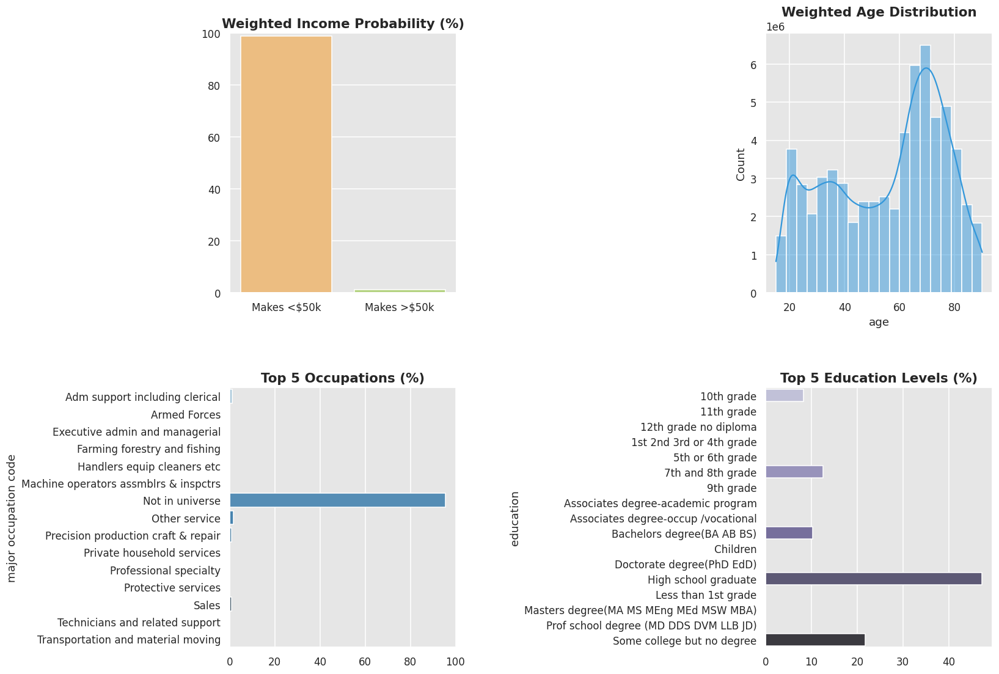

----------------------------------------------------------------------------------------------------


In [ ]:
display_persona_report(0)

/tmp/ipython-input-2745961622.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_counts = df.groupby(column)[weight_col].sum()


Metric,Weighted Statistics
Population Weight,"116,707,299 people (Weighted)"
Market Share,42.6% of total population
Raw Sample Count,"65,526 observations"


Metric,Weighted Statistics
>$50k Probability,7.7%
Net Investment Income,W.Mean: $-70.97W.Median: $0.00
Weeks Worked/Year,W.Mean: 45.8W.Median: 52
Employment Intensity (Top 5),1. Children or Armed Forces (50.1%)2. Full-time schedules (40.2%)3. PT for non-econ reasons usually FT (3.3%)4. Not in labor force (2.1%)5. Unemployed full-time (2.0%)


Metric,Weighted Statistics
Age Profile,W.Mean: 37.0 yrsW.Median: 36 yrs
Sex Distribution,1. Male (52.4%)2. Female (47.6%)
Race Distribution,1. White (83.8%)2. Black (12.0%)3. Asian or Pacific Islander (2.5%)4. Other (1.1%)5. Amer Indian Aleut or Eskimo (0.6%)
Citizenship Status,1. Native- Born in the United States (88.2%)2. Foreign born- Not a citizen of U S (7.2%)3. Foreign born- U S citizen by naturalization (3.2%)4. Native- Born abroad of American Parent(s) (1.0%)5. Native- Born in Puerto Rico or U S Outlying (0.5%)
Veteran Status,1. 2__Not in universe (99.3%)2. 1__No (0.7%)3. 1__Yes (0.1%)4. 0__Not in universe (0.0%)


Metric,Weighted Statistics
Career Class,1. Private__Not_in_universe (57.7%)2. Private__No (12.7%)3. Self-employed-not incorporated__Not_in_universe (6.3%)4. Local government__Not_in_universe (6.1%)5. State government__Not_in_universe (3.1%)
Major Occupation,1. Adm support including clerical (15.1%)2. Other service (12.4%)3. Professional specialty (11.9%)4. Sales (11.4%)5. Executive admin and managerial (10.7%)
Major Industry,1. Retail trade (17.6%)2. Manufacturing-durable goods (8.9%)3. Education (7.7%)4. Manufacturing-nondurable goods (6.7%)5. Construction (6.1%)
Avg Company Size,3.8 employees
Education Profile,1. High school graduate (34.9%)2. Some college but no degree (21.9%)3. Bachelors degree(BA AB BS) (14.4%)4. Associates degree-occup /vocational (4.2%)5. Masters degree(MA MS MEng MEd MSW MBA) (4.1%)


Metric,Weighted Statistics
Marital / Tax Status,1. Married-civilian spouse present__Joint both under 65 (52.1%)2. Never married__Single (25.0%)3. Divorced__Single (6.6%)4. Divorced__Head of household (3.4%)5. Never married__Head of household (2.4%)
Household Summary,1. Householder (48.2%)2. Spouse of householder (26.5%)3. Child 18 or older (13.4%)4. Nonrelative of householder (6.4%)5. Other relative of householder (3.5%)
Family Members <18,1. Not in universe (98.0%)2. Both parents present (1.4%)3. Mother only present (0.4%)4. Neither parent present (0.1%)5. Father only present (0.1%)


/tmp/ipython-input-2745961622.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["Makes <$50k", "Makes >$50k"], y=[100 - income_prob, income_prob], palette="RdYlGn", ax=axes[0,0])
/tmp/ipython-input-2745961622.py:137: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_occ_counts = group.groupby('major occupation code')['Weight'].sum().sort_values(ascending=False).head(5)
/tmp/ipython-input-2745961622.py:139: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=weighted_occ_counts.index, x=weighte

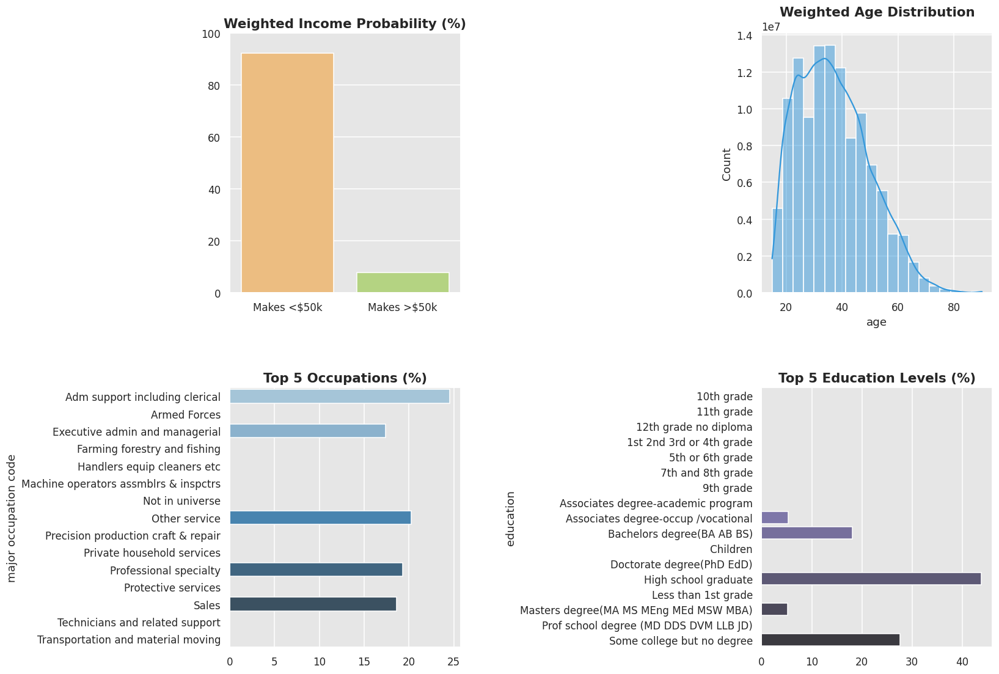

----------------------------------------------------------------------------------------------------


In [ ]:
display_persona_report(1)

/tmp/ipython-input-2745961622.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_counts = df.groupby(column)[weight_col].sum()


Metric,Weighted Statistics
Population Weight,"23,985,212 people (Weighted)"
Market Share,8.8% of total population
Raw Sample Count,"13,641 observations"


Metric,Weighted Statistics
>$50k Probability,33.4%
Net Investment Income,"W.Mean: $6,342.18W.Median: $1,317.00"
Weeks Worked/Year,W.Mean: 46.6W.Median: 52
Employment Intensity (Top 5),1. Children or Armed Forces (49.1%)2. Full-time schedules (40.7%)3. PT for non-econ reasons usually FT (3.6%)4. Not in labor force (3.5%)5. PT for econ reasons usually PT (1.4%)


Metric,Weighted Statistics
Age Profile,W.Mean: 44.5 yrsW.Median: 44 yrs
Sex Distribution,1. Male (61.2%)2. Female (38.8%)
Race Distribution,1. White (91.5%)2. Black (5.2%)3. Asian or Pacific Islander (2.3%)4. Other (0.5%)5. Amer Indian Aleut or Eskimo (0.4%)
Citizenship Status,1. Native- Born in the United States (92.6%)2. Foreign born- U S citizen by naturalization (3.4%)3. Foreign born- Not a citizen of U S (2.8%)4. Native- Born abroad of American Parent(s) (0.9%)5. Native- Born in Puerto Rico or U S Outlying (0.3%)
Veteran Status,1. 2__Not in universe (99.0%)2. 1__No (0.9%)3. 1__Yes (0.1%)4. 0__Not in universe (0.0%)


Metric,Weighted Statistics
Career Class,1. Private__Not_in_universe (52.3%)2. Private__No (8.1%)3. Self-employed-not incorporated__Not_in_universe (7.6%)4. Local government__Not_in_universe (6.2%)5. Not in universe__Not_in_universe (6.1%)
Major Occupation,1. Professional specialty (22.7%)2. Executive admin and managerial (20.9%)3. Sales (12.3%)4. Adm support including clerical (11.6%)5. Precision production craft & repair (8.4%)
Major Industry,1. Retail trade (10.8%)2. Manufacturing-durable goods (10.3%)3. Education (9.1%)4. Finance insurance and real estate (8.2%)5. Other professional services (7.1%)
Avg Company Size,3.9 employees
Education Profile,1. Bachelors degree(BA AB BS) (28.7%)2. High school graduate (22.1%)3. Some college but no degree (17.8%)4. Masters degree(MA MS MEng MEd MSW MBA) (12.2%)5. Associates degree-academic program (4.1%)


Metric,Weighted Statistics
Marital / Tax Status,1. Married-civilian spouse present__Joint both under 65 (65.1%)2. Never married__Single (14.4%)3. Divorced__Single (6.1%)4. Married-civilian spouse present__Joint both 65+ (3.3%)5. Married-civilian spouse present__Joint one under 65 & one 65+ (2.8%)
Household Summary,1. Householder (67.1%)2. Spouse of householder (24.1%)3. Child 18 or older (4.2%)4. Nonrelative of householder (3.0%)5. Other relative of householder (1.0%)
Family Members <18,1. Not in universe (99.4%)2. Both parents present (0.5%)3. Mother only present (0.1%)4. Father only present (0.0%)5. Neither parent present (0.0%)


/tmp/ipython-input-2745961622.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["Makes <$50k", "Makes >$50k"], y=[100 - income_prob, income_prob], palette="RdYlGn", ax=axes[0,0])
/tmp/ipython-input-2745961622.py:137: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_occ_counts = group.groupby('major occupation code')['Weight'].sum().sort_values(ascending=False).head(5)
/tmp/ipython-input-2745961622.py:139: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=weighted_occ_counts.index, x=weighte

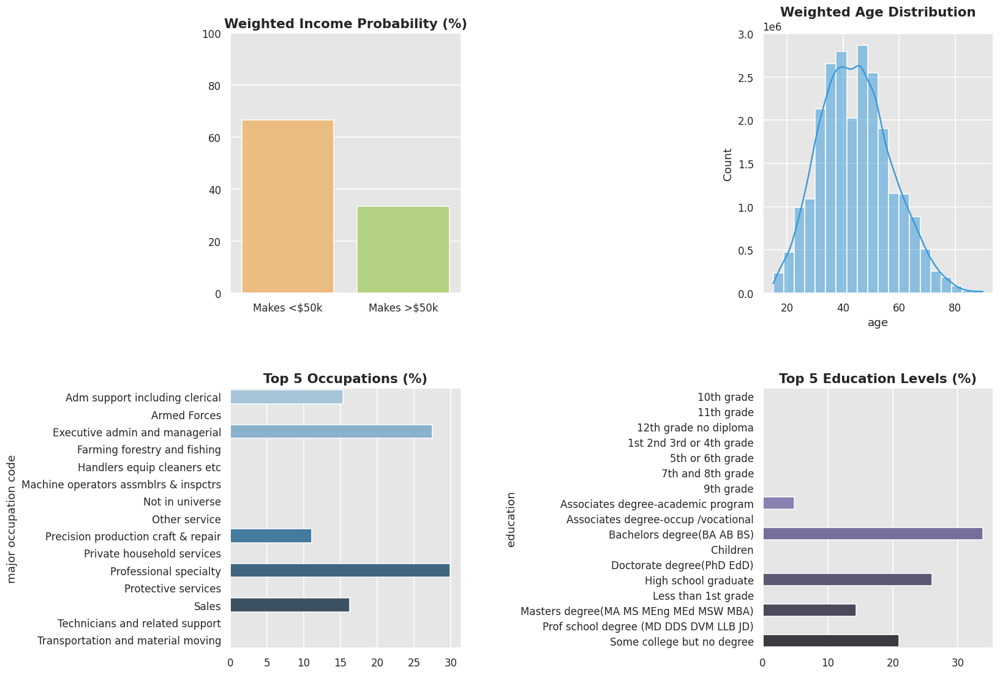

----------------------------------------------------------------------------------------------------


In [ ]:
display_persona_report(2)

/tmp/ipython-input-2745961622.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_counts = df.groupby(column)[weight_col].sum()


Metric,Weighted Statistics
Population Weight,"68,533,580 people (Weighted)"
Market Share,25.0% of total population
Raw Sample Count,"40,749 observations"


Metric,Weighted Statistics
>$50k Probability,0.0%
Net Investment Income,W.Mean: $-0.24W.Median: $0.00
Weeks Worked/Year,W.Mean: 0.2W.Median: 0
Employment Intensity (Top 5),1. Children or Armed Forces (93.7%)2. Not in labor force (5.6%)3. Full-time schedules (0.4%)4. Unemployed part- time (0.3%)5. Unemployed full-time (0.0%)


Metric,Weighted Statistics
Age Profile,W.Mean: 8.1 yrsW.Median: 8 yrs
Sex Distribution,1. Male (51.3%)2. Female (48.7%)
Race Distribution,1. White (77.6%)2. Black (17.2%)3. Asian or Pacific Islander (2.7%)4. Other (1.8%)5. Amer Indian Aleut or Eskimo (0.7%)
Citizenship Status,1. Native- Born in the United States (95.2%)2. Foreign born- Not a citizen of U S (3.4%)3. Native- Born abroad of American Parent(s) (0.7%)4. Foreign born- U S citizen by naturalization (0.3%)5. Native- Born in Puerto Rico or U S Outlying (0.3%)
Veteran Status,1. 0__Not in universe (86.8%)2. 2__Not in universe (13.1%)3. 1__No (0.0%)4. 1__Yes (0.0%)


Metric,Weighted Statistics
Career Class,1. Not in universe__Not_in_universe (98.1%)2. Private__Not_in_universe (1.0%)3. Never worked__Not_in_universe (0.5%)4. Not in universe__No (0.1%)5. Self-employed-not incorporated__Not_in_universe (0.1%)
Major Occupation,1. Not in universe (98.7%)2. Other service (0.5%)3. Sales (0.2%)4. Handlers equip cleaners etc (0.2%)5. Farming forestry and fishing (0.1%)
Major Industry,1. Not in universe or children (98.7%)2. Retail trade (0.6%)3. Agriculture (0.1%)4. Private household services (0.1%)5. Entertainment (0.1%)
Avg Company Size,0.1 employees
Education Profile,1. Children (86.9%)2. 9th grade (4.3%)3. 10th grade (3.6%)4. 7th and 8th grade (2.9%)5. 11th grade (1.7%)


Metric,Weighted Statistics
Marital / Tax Status,1. Never married__Nonfiler (99.4%)2. Never married__Single (0.5%)3. Separated__Nonfiler (0.0%)4. Married-civilian spouse present__Joint both under 65 (0.0%)5. Married-civilian spouse present__Nonfiler (0.0%)
Household Summary,1. Child under 18 never married (88.9%)2. Other relative of householder (8.5%)3. Nonrelative of householder (2.3%)4. Child 18 or older (0.3%)5. Child under 18 ever married (0.0%)
Family Members <18,1. Both parents present (67.2%)2. Mother only present (24.6%)3. Father only present (3.5%)4. Neither parent present (3.4%)5. Not in universe (1.3%)


/tmp/ipython-input-2745961622.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["Makes <$50k", "Makes >$50k"], y=[100 - income_prob, income_prob], palette="RdYlGn", ax=axes[0,0])
/tmp/ipython-input-2745961622.py:137: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  weighted_occ_counts = group.groupby('major occupation code')['Weight'].sum().sort_values(ascending=False).head(5)
/tmp/ipython-input-2745961622.py:139: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=weighted_occ_counts.index, x=weighte

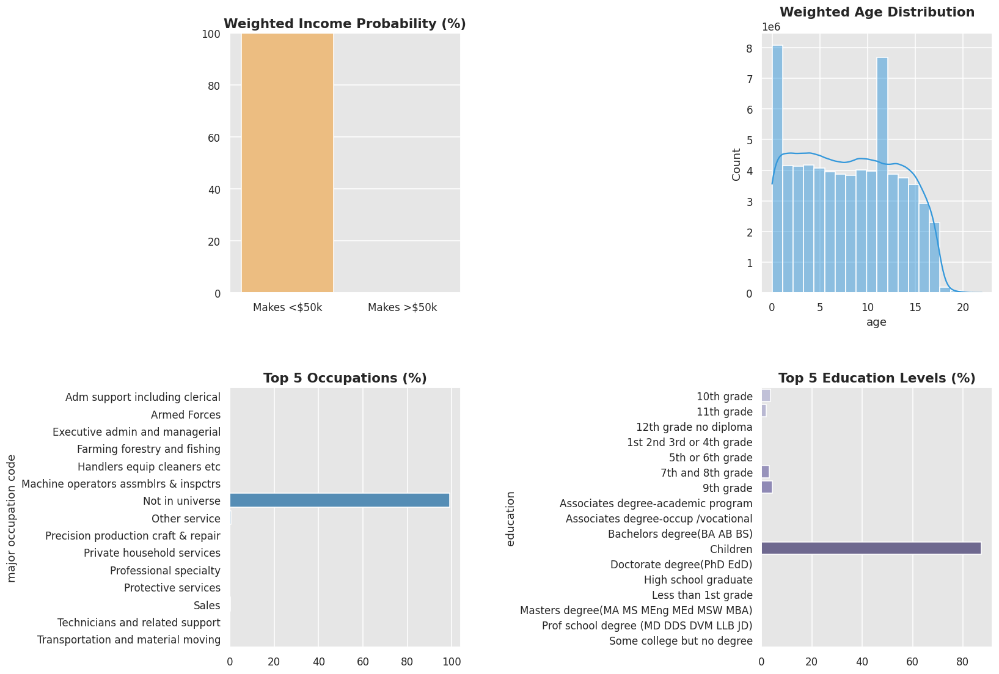

----------------------------------------------------------------------------------------------------


In [ ]:
display_persona_report(3)